# Code to identify creative companies working with universities from the Gateway To Research and Companies House APIs

In [159]:
%matplotlib inline
from matplotlib import pyplot as plt
import matplotlib.patches as mpatches
from mpl_toolkits.basemap import Basemap
import numpy as np
from mpl_toolkits.axes_grid1.inset_locator import zoomed_inset_axes
from mpl_toolkits.axes_grid1.inset_locator import inset_axes
import matplotlib as mpl
import matplotlib.lines as mlines

import pandas as pd
from ast import literal_eval
from sqlalchemy import create_engine
import pandas as pd
from superfuzz.superfuzz import superfuzz
from fuzzywuzzy import fuzz
from fuzzywuzzy import process as fuzzy_process
import re
import requests
from retrying import retry
import random
import time
from collections import Counter
import json
import plotplot as ppimport plotplot as pp

with open("db.config") as f:
    engine_url = f.read()
engine = create_engine(engine_url)
con = engine.connect()

/Users/jklinger/anaconda3/envs/py36/lib/python3.6/site-packages/pymysql/cursors.py:166: Warning: (1287, "'@@tx_isolation' is deprecated and will be removed in a future release. Please use '@@transaction_isolation' instead")
  result = self._query(query)


#

In [2]:
ch_df = pd.read_csv('/Users/jklinger/Downloads/BasicCompanyDataAsOneFile-2017-11-01.csv')
sic_df = pd.read_csv("/Users/jklinger/Downloads/ce_codes.csv")

_sic_map = {}
for label,grouped in sic_df.loc[sic_df.type == "SIC"].groupby("label2"):
    for code in grouped.code.values:
        _sic_map[str(code)] = label 

/Users/jklinger/anaconda3/envs/py36/lib/python3.6/site-packages/IPython/core/interactiveshell.py:2698: DtypeWarning: Columns (39,40,41,42,43,44,45,46,47,48,49,50,51,52) have mixed types. Specify dtype option on import or set low_memory=False.
  interactivity=interactivity, compiler=compiler, result=result)


## Assign short SIC codes to CH data

In [3]:
def short_sic(long_sic):
    return long_sic.split()[0][0:-1]
ch_df["short_sic"] = list(map(short_sic,ch_df["SICCode.SicText_1"].values))

## Subset CH creative companies

In [4]:
def sic_to_ce(short_sic):
    if short_sic in _sic_map:
        return _sic_map[short_sic]

ch_df["ce_label"] = list(map(sic_to_ce,ch_df["short_sic"].values))
ch_df = ch_df.loc[~pd.isnull(ch_df.ce_label)]

In [5]:
for label,_df in ch_df.groupby("ce_label"):
    print(label,len(_df))

Advertising and marketing 33838
Architecture 17977
Crafts 1835
Design 21428
Film, TV, video, radio and photography 54604
IT, software and computer services 186940
Museums, galleries and libraries 1642
Music, performing and visual arts 58361
Publishing 24292


## Assign labels to GTR organisations based on keywords, if there web-matching score is bad

In [182]:
# Get the GTR datasets
con = engine.connect()
df_web = pd.read_sql_table("gtr_orgs_by_project_from_web",con=con)
df_orgs = pd.read_sql_table("gtr_organisations",con=con)
df_projs = pd.read_sql_table("gtr_projects",con=con)

# Patch up the web data, where an organisation has matched in one place but not others
sector_remapping = {}
score_remapping = {}
for org_id, _df in df_web.groupby("org_id"):    
    if len(set(_df.Sector.values)) > 1 and len(set(_df.score.values)) > 1:
        best_score = max(_df.score.values)
        best_sector = _df.Sector.loc[_df.score == best_score].values[0]
        sector_remapping[org_id] = best_sector
        score_remapping[org_id] = best_score

for org_id, value in sector_remapping.items():
    condition = df_web.org_id == org_id
    df_web.loc[condition, "Sector"] = sector_remapping[org_id]
    df_web.loc[condition, "score"] = score_remapping[org_id]

# Join the projects
df_projs["org_id"] = df_projs.org_api_href.apply(lambda x : x.split("/")[-1])
df_proj_web = pd.merge(df_projs, df_web,  how='left', 
                       left_on=['title','org_id'], 
                       right_on = ['project_name','org_id'])

#df_proj_web = df_projs.join(df_web.set_index(keys=["project_name"]),on="title")
df_proj_web.rename({"id":"project_id"},inplace=True)
df_proj_web.drop("id",axis=1,inplace=True)

# Join projects and organisations
#df = df_orgs.join(df_web.set_index(keys=["org_id"]),on="id",how="outer")
df = df_orgs.join(df_proj_web.set_index(keys=["org_id"]),on="id",how="outer")
# Assign null web-matching scores to 0 for later comparisons
df.loc[pd.isnull(df.score),"score"] = 0
df = df.loc[~pd.isnull(df.name)]

In [183]:
len(set(df.id))

37242

In [184]:
condition = pd.isnull(df.project_url)
print("Total orgs, orgs with good project info, orgs with no project info")
len(set(df.id)),len(set(df.loc[condition,"id"])),len(set(df.loc[~condition,"id"]))

Total orgs, orgs with good project info, orgs with no project info


(37242, 29291, 10502)

In [185]:
Counter(df.title).most_common()

[(nan, 3880),
 ('Large Randomised Lipid Modification Trials', 755),
 ('BBSRC Industrial CASE Partnership Grant', 430),
 ('Large randomised trials and meta-analyses of breast cancer treatments',
  423),
 ('Investigations in Gravitational Radiation', 340),
 ('Epidemiological and statistical research on health problems of developing countries: MRC Tropical Epidemiology Group',
  288),
 ('Quota Studentships', 235),
 ('MAPPING THE UNDERWORLD: MULTI-SENSOR DEVICE CREATION, ASSESSMENT, PROTOCOLS',
  209),
 ('Retrofit for the Future', 201),
 ('Nutrition, Development and Lifelong Health: Studies in Developing and Transitioning Populations',
  182),
 ('Large randomised clinical trials in other (non-vascular) conditions', 181),
 ('A Centre for Innovative Manufacturing and Construction', 174),
 ('Work and Health', 166),
 ('Determining the effects of treatments on vascular disease risk by meta-analyses using individual participant data',
  158),
 ('ALSPAC: A reference population for genetic &amp; e

27632 already have a good label
Assigned Unknown to 36362 (Note: many of these will be private and matched under companies house, others will be foreign.)


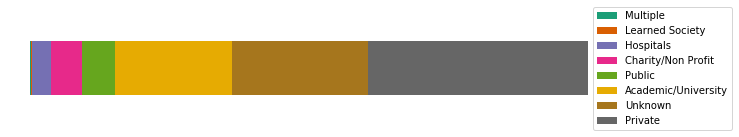

In [186]:
# Assigns sectors based keywords
def assign_sector(df,keywords,sector):
    condition = df.score <= 85
    condition = condition & df.name.apply(lambda x : any(w.lower() in x.lower() for w in keywords))
    df.loc[condition,"Sector"] = sector
    df.loc[condition,"score"] = 101 # Dummy score for book-keeping

# Only assign sectors for bad GTR web-matching scores
condition = df.score <= 85
print((~condition).sum(),"already have a good label")
autoassign = {"Private":["Limited","Ltd","Plc","GmbH","Inc.","Inc","LLP"],
              "Academic/University":["University","Inst","School","College","Sch of","Faculty of"],
              "Hospitals":["Hospital"],
              "Charity/Non Profit":["Museum"],
              "Public":["NHS","City Council"]}
for k,v in autoassign.items():
    assign_sector(df,v,k)
    
# Assign the rest as unknown
condition = df.score <= 85
df.loc[condition,"Sector"] = "Unknown"

# First have a check if any company names arise for multiple orgs. These are noise!
ids = []
bad_names = []
for name,_df in df.groupby("name"):
    condition = _df.score <= 85
    _ids = list(_df.loc[condition,"id"].unique())
    n_id = len(_ids)
    if n_id > 2:
        # Hack for "Unknown","Unlisted"
        if not (name.lower().startswith("u") or name.lower().startswith("research")):
            ids += _ids
        else:
            bad_names.append(name)
            
# Smashed it! These are overwhelmingly university departments
condition = df.id.apply(lambda x : x in ids)
condition = condition & (df.score <= 85)
df.loc[condition,"Sector"] = "Academic/University"
df.loc[condition,"score"] = 101

# Print number of bad results
condition = df.score <= 85
print("Assigned Unknown to",condition.sum(),"(Note: many of these will be private and",
      "matched under companies house, others will be foreign.)")

# Draw
counts=[]
labels=[]
#condition = df.score > 85
for lab,_df in df.groupby("Sector"):
    labels.append(lab)
    counts.append(len(_df.groupby(["id","Department"])))
labels = [x for _,x in sorted(zip(counts,labels))]
counts = sorted(counts)
pp.fraction_bar(counts=counts,labels=labels)

## Extract organisations identified as Private which collaborate with UK universities

In [187]:
# Get a list of private organisations KNOWN to be collaborating with a university AND being in the UK
n_collabs = 0
n_projects = 0
n_p_u_collabs = 0
names = set()
names_addresses = [] # <-- This is the output, a list of dict entries [gtr_name --> address_info]
for _,_df in df.groupby("title"):
    n_projects += 1
    if "Academic/University" in _df.Sector.values:
        n_collabs += 1
    condition = _df.Sector == "Private"
    unknown_sector = _df.Sector == "Unknown"
    uk_condition = _df.Country == "United Kingdom of Great Britain & Northern Ireland (UK)"
    nan_country = pd.isnull(_df.Country)
    for _,row in _df.loc[(condition & (uk_condition | nan_country)) | unknown_sector].iterrows():
        if row["name"] not in names:
            names.add(row["name"])
            names_addresses.append(dict(name=row["name"],address=row["address"]))
        n_p_u_collabs += 1
n_collabs, n_collabs, n_p_u_collabs, len(names)

(56520, 56520, 70598, 23395)

In [136]:
names # <---- These are the companies to match

{'Itim Group Limited',
 'E ON Central Networks plc',
 'Redgear Solutions Ltd',
 'Gnosys Global Ltd',
 'Placr Limited',
 'Wevolver Ltd.',
 'Northern Ireland Human Rights Commission',
 'Oxford CaresenSE Limited',
 'Critical Pharmaceuticals',
 'Charnwood Technical Consulting Limited',
 'Isopower Limited',
 'Cawood Scientific Ltd',
 'The Aviation Industry Corporation',
 'Electricity North West Limited',
 'Ty Mawr Lime Limited',
 'Industrial Research Ltd NZ',
 'Quarry Products Association Limited',
 'Media Meadow Limited',
 'Concrete Society Limited(The)',
 'Shell Research UK',
 'Arrow Therapeutics',
 'Tenet Technology Ltd',
 'Orange Corporate services Limited',
 'Pocket Places Limited',
 'Tangerine Product Development',
 'Biogelx Limited',
 'Community Energy Plus',
 'Dialysezentrum Küllmer',
 'Air Products',
 'Marbleamber Limited',
 'Phillips Solicitors Limited',
 'Heatcoat Ltd',
 'European Friction Industries Limited',
 'Sun Microsystems',
 'Canary Wharf Group plc',
 'Carbon Consultancy C

## Match these companies to Companies House API data using addresses, postcodes and fuzzy matching

In [188]:
# Gather stop words together
words = []
for k in ch_df["CompanyName"].values:
    words += k.split()
stops = [w.lower() for w,_ in Counter(words).most_common(10)]
print(stops)

def destop(value):
    return " ".join(x for x in value.split() if x.lower() not in stops).lower()

pattern = re.compile('[\W_]+')
ch_url = "https://api.companieshouse.gov.uk/search/companies"
postcodes_url = "https://api.postcodes.io/postcodes/"
ch_api_keys = ['HY44CHlzahpJeDTtsovKW06Sa_Th3IZ1nfhPaijO','sYI_4Ob5BN97THtE0LfF0zwJPfwiFKQxouizK6U1']

@retry(stop_max_attempt_number=5,wait_fixed=5000)
def query_ch(q):
    params = dict(items_per_page=20, q=q)
    auth = (random.choice(ch_api_keys),'')
    r = requests.get(url=ch_url,auth=auth,params=params)    
    r.raise_for_status()    
    return r.json()

['limited', 'ltd', 'consulting', 'solutions', 'services', 'media', 'design', 'ltd.', 'productions', 'the']


In [189]:
def get_lon_lat(postcode):
    r = requests.get(url=postcodes_url+postcode)
    r.raise_for_status()
    pc_info = r.json()
    lat = pc_info["result"]["latitude"]
    lon = pc_info["result"]["longitude"]
    return lon, lat

def match_by_postcode(postcode, query_result):
    if postcode is None:
        return None
    for item in query_result["items"]:
        if "address" not in item:
            continue
        if item["address"] is None:
            continue
        if "postal_code" not in item["address"]:
            continue        
        _postcode = item["address"]["postal_code"]
        if _postcode == postcode:
            return item

def get_match(names_addresses,threshold=80,threshold_address=90):
    name = names_addresses["name"]
    address = names_addresses["address"]
    _name = destop(name)    
    # Extract and format the postcode and address
    postcode = None
    if address is not None:
        if "postCode" in address:
            postcode = address["postCode"]
        address = " ".join(v for k,v in address.items() 
                           if v != "Unknown")
        address = pattern.sub(' ', address)    
    # Query CH by address matches
    if address is not None:
        r = query_ch(name+" "+address)      
        if len(r["items"]) != 0:
            # First try a name match
            for item in r['items']:
                score = superfuzz(_name,destop(item['title']),
                            [fuzz.partial_ratio,fuzz.token_sort_ratio])
                # If the score is good, then trust Companies House's sorting algorithm
                if score > threshold_address:
                    return item
            # Otherwise try an address match
            for item in r['items']:
                if 'address_snippet' not in item:
                    continue
                if item['address_snippet'] is None:
                    continue
                _address = pattern.sub(' ', item['address_snippet'])
                score = superfuzz(address,_address,[fuzz.partial_ratio,fuzz.token_sort_ratio])
                if score > threshold:
                    return item
    # Query CH by name matches
    r = query_ch(name)
    if len(r["items"]) == 0:
        return None
    # No results so far, so try postcode match
    # Get the lon, lat info for this postcode
    try:
        match = match_by_postcode(postcode, r)
    except requests.exceptions.HTTPError:
        pass
    else:
        if match is not None:
            return match
    # If no match thus far, fuzzy match CH on query results
    for item in r["items"]:        
        score = superfuzz(_name,destop(item['title']),
                          [fuzz.partial_ratio,fuzz.token_sort_ratio])
        # If the score is good, then trust Companies House's sorting algorithm
        if score > threshold:
            return item
    # No result
    return None

# Execute the queries against companies house based on address, postcode and name similarity
# First open previous results, to avoid work duplication
if results == {}:
    with open("gtr_to_sic_mapping_academic_collabs_only.pydict") as f:
        results = literal_eval(f.read())
else:
    print("Already got",len(results),"of",len(names_addresses),"results")
    
for i,data in enumerate(names_addresses):
    name = data["name"]
    if name in results:
        continue
    try:
        result = get_match(data)
    except:
        print("Sleeping on",i,"of",len(names_addresses))
        time.sleep(600)        
        result = get_match(data)
    finally:
        results[name] = result

Already got 9751 of 23395 results


In [190]:
len(results)

23397

## Assign SIC codes via more Companies House API

In [214]:
i = 0
for k,v in results.items():
    if v is None:
        continue
    if 'sic_codes' in results[k]:
        continue
    i += 1
print(i)

# Now get the SIC codes from companies house
for k,v in results.items():
    if v is None:
        continue
    if 'sic_codes' in results[k]:
        continue
    url = "https://api.companieshouse.gov.uk" + v['links']['self']
    auth = (random.choice(ch_api_keys),'')
    while True:
        try:
            r = requests.get(url=url,auth=auth)
            r.raise_for_status()
            break
        except:
            print("failed for",k)
            time.sleep(300)
            print("retrying")
    d = r.json()
    sic_codes = None
    if 'sic_codes' in d:
        sic_codes = d['sic_codes']
    results[k]['sic_codes'] = sic_codes

0


In [215]:
# Number of SIC codes assigned
len([v for k,v in results.items() if v is not None and 'sic_codes' in v]), len(results)

(19828, 23397)

In [216]:
# Number of results processed
len([v for k,v in results.items() if v is None or 'sic_codes' in v]), len(results)

(23397, 23397)

In [217]:
# Save for later
with open("gtr_to_sic_mapping_academic_collabs_only.pydict","w") as f:
    f.write(str(results))

## Extract only the creative companies

In [52]:
with open("gtr_to_sic_mapping_academic_collabs_only.pydict") as f:
    results = literal_eval(f.read())

In [221]:
# Subset those collaborating with a UK university
ce_types = {}
i = 0
ce_names = set()
for name,row in results.items():
    if row is None:
        continue
    if row['sic_codes'] is None:
        continue
    for s in row['sic_codes']:
        label = sic_to_ce(s[0:-1])
        if label is None:
            continue
        if label not in ce_types:
            ce_types[label] = 0
        ce_types[label] += 1
        i += 1
        ce_names.add(name)
        break
i

2849

In [222]:
len(ce_names)

2849

In [223]:
ce_types

{'Advertising and marketing': 115,
 'Architecture': 163,
 'Crafts': 3,
 'Design': 243,
 'Film, TV, video, radio and photography': 207,
 'IT, software and computer services': 1445,
 'Museums, galleries and libraries': 57,
 'Music, performing and visual arts': 477,
 'Publishing': 139}

In [230]:
(~pd.isnull(df.title)).sum()

196716

In [232]:
#nan_country = pd.isnull(_df.Country)
# Make output ready for plotting [lon,lat,plon,plat,label]
i = 0
_names = []
ce_types = {}
uni_names = []
for _,_df in df.groupby("title"):
    print("====================")
    print(_df.title.values[0])
    uk_condition = _df.Country == "United Kingdom of Great Britain & Northern Ireland (UK)"
    is_uni = _df.Sector == "Academic/University"
    #is_private = _df.Sector == "Private"
    _uni_names = []
    is_ce = False
    for _,uni in _df.loc[is_uni & uk_condition].iterrows():
        if uni["address"] is None:
            #print(uni["org_name"])            
            _uni_names.append(uni["name"])
            continue
        for _,company in _df.iterrows():
            print(company["name"])
            #if company["address"] is None:
            #    continue
            #i += 1
            if company["name"] in ce_names:
                is_ce = True
                i += 1
                _names.append(company["name"])
                row = results[company["name"]]
                if row is None:
                    continue
                if row['sic_codes'] is None:
                    continue
                for s in set(row['sic_codes']):
                    label = sic_to_ce(s[0:-1])
                    if label is None:
                        continue
                    if label not in ce_types:
                        ce_types[label] = 0
                    ce_types[label] += 1
        if is_ce:
            uni_names += _uni_names 
i, len(set(_names))

#LOOP
#Ladcultures: social networking sites, 'laddism' and young masculinities
#Loop
#Refugeeswelcome in Parks: Wellbeing and Inclusion in Public Open Space.
&quot; smART cities and waste: Developing an arts-led interdisciplinary network for waste management and treatment innovation&quot;
&quot;A rite of passage?&quot;: The National Citizen Service and the Geographies of Youth Citizenship
&quot;A scalable approach to modelling gravitational microlensing events for exoplanet demographics in the WFIRST era&quot;
&quot;AIR-IQ&quot; - 'Automated Infra Red Identification and Quantification' in the application of environmental gas monitoring
&quot;Accelerators for humanity&quot;
&quot;AdCrManu&quot;: Advanced CrAlNO nanostructured PVD coatings enabling the mass-manufacturing of complex die-cast aluminium/steel hybrid components
&quot;Algebraic Structures in Local Mirror Symmetry&quot;
&quot;Animal spirits&quot; and hormones: understanding trust in interpersonal interactions
&quot;Before The 

'Creating a Stink - Investigating Olfactory Transport Streams'
'Creative Resource'-Traveling exhibition focussing on the sustainable development of materials and the design process.
'DAISEE' from 3-Sci Ltd' : A DecadeAutonomy, Integral Sensor, Easy-fit, Extreme distance communication network.
'Dark Tourism' in Comparative Perspective: Sites of Suffering, Sites of Memory
'Dead Faces Laugh': Alienation and History in the Drama of W.B. Yeats
'Designer' Inorganic Vaccine Adjuvants
'Development and evaluation of biomarkers of infant nutrition, growth and body composition'
'Digital Built Britain' Building Information Modelling Level 3 Programme - Phase 2
'Disinheritance' and identity constructions in the prose and archives of Ruth Prawer Jhabvala.
'Divinytie and State': Narrative and Dramatic Representations of the English Past, 1516-1603
'EPSRC/NSF Workshop Collaborative Proposal' Catalytic oxidative C-H bond functionalisation with high oxidation state N-heterocyclic carbene complexes
'Econ

'Mirror Touch' and the Neural Basis of Empathy (Response to: Society, Social Behaviour and the Neurosciences)
'Museums of Memory: Psychoanalytic Significations of the Material Object in Modernist Poetic Language'
'Need to Knows' for Biopharmaceutical Industry Interdisciplinary Bioscience and Engineering Practitioners
'New Thinking on Living with Dying': Research Network
'New forms of participation: problem Internet gambling and the role of the family '
'Next Generation' unstructured mesh ocean global circulation modelling.
'No More Pointy-Clicking, Numbers Stuff: Building Staff Quantitative Skills.'
'Non-Muslim' and Muslim youth: religious identities, Islamophobia and everyday geopolitics
'Not Just for Christmas': Consumption, Popular Culture and Religious Observance
'Octet with Voices': Recontextualising the choral symphony in the chamber music medium
'Of Archaeological Interest': PPS5 and Transition in Cultural Heritage Policy
'Omics Data Sharing: the Investigation / Study / Assay (I

'The Scottish Question': implications for the rest of UK and Scottish local governance
'The Starry Messenger': and educational film drama for schools
'The State of Loyalism in Northern Ireland'
'The UK Modern Slavery Crusade; a Migrants' Rights Perspective'
'The good, the bad and the ugly': positive and negative behaviour of Roman soldiers
'The history and politics of civil war memories in Spain, 1936 to the present'
'The life history of me, Segilola': early print culture in Lagos and the first Yoruba novel
'The most powerful man in the realm': Sir John Anderson, coalition, and Conservative statecraft 1940-45
'The role of arts and culture in the regeneration of urban places and urban communities' - Critical Review
'The smell of fear': feasibility study on the correlation of human smell and abnormal behaviour
'The snows of yesteryear: narrating extreme weather'
'There's no such thing as society?' A study of broadcasting and the public services under the three Thatcher governments, 1979-

13TSB_SynBio: Feasibility study on application of synthetic biology approaches to high yield production of Mycosporine-like Amino Acids for use as ...
13TSB_SynBio: Rapid Engineering of Cellular Factories
13TSB_SynBio: Synthetic biology to improve antibiotic production
13TSB_SynBio:Enhanced discovery and scalable synthesis of therapeutic cyclic peptides
13TSB_TIBio: Enabling Technologies for Advanced Multiphoton Microscopy
13TSB_TIBio: Genomes and synthetic biology for development of novel pest control technologies
13TSB_TIBio: Synthetic Biology for antibiotic discovery and development
13TSB_TIBio: Technology Inspired Innovation Bioscience - Puridify
13th Colloquium on Structural and Communication Complexity, SIROCCO 2006
14 ERA-CAPS An Effector- and Genomics-Assisted Pipeline for Necrotrophic Pathogen Resistance Breeding in Wheat
14 ERA-CAPS Mechanistic Analysis of Quantitative Disease Resistance in Brassica by Associative Transcriptomics
14 ERA-CAPS PHYTOCAL: Phytochrome Control of R

16AGRITECHCAT5: Extending the availability and flavour life of UK apples using innovative photonics
16AGRITECHCAT5: Feasibility of a Hyper Spectral Crop Camera (HCC) for agriculture optimisation
16AGRITECHCAT5: GrassVision: Automated application of herbicides to broad-leaf weeds in grass crops
16AGRITECHCAT5: Integrated control of Leptosphaeria pathogens on UK winter oilseed rape
16AGRITECHCAT5: Integrating Control strategies Against soil-borne Rhizoctonia solani in OilSeed rape (ICAROS)
16AGRITECHCAT5: Next generation modified atmosphere materials to extend farm storage and reduce waste
16AGRITECHCAT5: Strategies to reduce waste due to greening in potato tubers
16AGRITECHCAT5: The neurophysiological and behavioural evaluation of a novel humane electric stunning system for fish
16AGRITECHCAT5: Tools and Technology for Predicting Tomato Glasshouse Production
16AGRITECHCAT5: Using stress pre-conditioning, novel sensors and AMF to improve yields, resilience and sustainability of raspberry

4160Tuesdays New Products
48V Town &amp; Country Hybrid Powertrain (TC48)
4BIM
4CASTING
4D TQFT and categorified Hall algebras
4D imaging for motility measurement in human reproduction studies
4D monitoring of stem cell differentiation by dielectric spectroscopic optical coherence tomography
4D-HSI-4-Free: Integrating Sensors &amp; Vision Process Engineering to Deliver a Tool for revealing 3D Hyperspectral Agri-data from 2D Images
4He/3He laser microprobe analysis: a disruptive new technology for in-situ U-Th-He thermochronology
4ITSec
4MOST 2011-12
4MOST Phase A Continuation, 2013-14
4MOST Phase A Study
4PI Two-photon Lithography for Isotropic 3D Nanostructure Fabrication
4SM Halo product dev. voucher application
4c Design Limited
4mostPGM
5*StarS: Automotive Cyber Security through Assurance
5-HT3 receptor subtypes: functional and structural characterisation
500 MHz NMR Spectrometer to Support Organic, Bio-organic and Inorganic Chemistry
500,000 years of solar irradiance, climate and 

A Complexity Science Approach to Plant Tissue Regeneration
A Computational Approach to Solvent Selection for Tandem Reactions: A Tool for Process Intensification
A Computational Information Geometry Approach to Sensitivity Analysis in Statistical Science
A Computational Prototype for Electroencephalographic Brain Connectomics
A Computer-assisted 3D Navigation System for Endoscopic-Ultrasound-Guided Diagnosis and Minimally-invasive Treatment of Pancreatic Lesions
A Computer-enhanced Package for Learning School Algebra
A Conditional System for Inexpensive Manufacture of Attenuated Vaccines
A Consolidated Grant Proposal for Astrophysics and Solar System Research at the University of Leicester, 2013-2016
A Consolidated Grant Proposal for Solar System Research at the University of Leicester (2016-2019)
A Consolidated Grant in Astrophysical Fluids In Applied Mathematics at Leeds
A Constraint Modelling Pipeline
A Constraint Solver Synthesiser
A Contiunuous and Fully Scalable Interfacial React

A Level Playing Field? The Practice and Representation of Women's and Girls' Football in South America
A LiDAR and field study of surface rupture and post-seismic slip for the 6th April 2009 L'Aquila Earthquake (M6.3). (URGENCY GRANT)
A Life Course Approach to Investigating Asthma Pathogenesis and Progression
A Lightweight structural health monitoring system (SHeMS)
A Linear Syst0ems Toolkit for Biology
A Linear Systems Toolkit for Biology
A Linguistic 'Time Capsule' for the Google Generation: The Diachronic Electronic Corpus of Tyneside English
A Linguistic Study of the Modern Irish dialects of North-west Donegal
A Local Habitation: Photographing Settler Buildings in South Africa's Eastern Cape
A Lonely Generation? Understanding Loneliness and Togetherness in the Emotional Geographies of Millennials
A Longitudinal Functional Magnetic Resonance Imaging Study of the Interaction Between Oestrogen and Acetylcholine on Mem
A Longitudinal Study on the Impact of Parental Depression on Child 

A Pilot Study of Improving Outcomes in Teenage Pregnancy Using a Combined Tailored M- Health Program and Motivational Interviewing Intervention
A Place for Mediation in Workplace Conflict Management
A Place in the Sun: Taking Solar System Science to the Public
A Planar Microwave Cavity Loaded with Ferrromagnetic Material: a new 8.2 MHz Anti-Theft Tag for Metallic Packaging within the Retail Sector
A Plasmonic Antenna for Magneto-Optical Imaging at the Deep Nanoscale
A Platform for Hybrid Manufacturing Process research
A Platform to Develop and Utilise Characterisation Tools for Functional Magnetic Materials
A Population Approach to Ubicomp System Design
A Population-based Ankylosing Spondylitis [PAS] cohort
A Portable Electrohydrodynamic Device for in-situ Production of Multi-Layered Drug-Loaded Meshes
A Pragmatic Approach to Adiabatic Quantum Computation
A Precise, Real-Time 3D Imager
A Predictive Approach to Modelling Frictional Joint Performance (PAMFJP)
A Predictive Fault-tolerance

A Worshop on Aircraft Jet and Fan Broadband Noise
A Zonal CFD Approach for Fully Nonlinear Simulations of Two Vessels in Launch and Recovery Operations
A bacterial c-di-GMP responsive enzyme modulates LPS structure and triggers immune evasion
A bidirectional power/data transfer platform based on electro-optical effects in standard CMOS
A biochemical and biophysical analysis of a ubiquitous protein translocation apparatus
A biochemical and molecular analysis of the YhaO membrane protein in Escherichia coli O157:H7
A biography of Charles Hutton (1737-1823)
A bioinformatics tool for the accelerated diagnosis of multiple viral infections in crops using next generation sequencing
University of Wisconsin Madison
Wageningen University
Friedrich-Alexander University
Cornell University
Biotechnology and Biological Sciences Research Council (BBSRC)
University of St Andrews
York St John University
Spanish National Centre for Biotechnology (Centro Nacional de Biotecnologia)
A biological framework 

A detailed network of transcriptome regulation associated with life-span extension in model organisms
A detailed study of the interaction between fluorescence and nanostructure in naturally evolved photonic systems
A development study to examine feasibility and acceptability of pulmonary rehabilitation in Uganda for adults with chronic respiratory disease
A device to detect and measure the progression of dementia by quantifying the interactions between neuronal and cardiovascular oscillations
A diagnostic and monitoring device for Diabetic Peripheral Neuropathy
A diet for all seasons: the role of intra-annual variability in the evolution of hominin diet in East Africa
A differential absorption LiDAR for multi-species greenhouse gas detection
A digital edition of the Commedia of Dante Alighieri, part two
A digital edition of the Vernon Manuscript (Oxford, Bodleian Library, MS Eng.poet.a.1)
A digital service to improve road worker safety and provide new value added services to highway ma

A mathematical modeling framework for tuberculosis burden estimation and economic evaluation of pharmaceutical interventions
A measurement of the anomalous magnetic moment of the muon to 0.14 ppm using the FNAL g-2 experimen (Liverpool)
A measurement of the anomalous magnetic moment of the muon to 0.14 ppm using the FNAL g-2 experiment - Oxford Contribution
A measurement of the anomalous magnetic moment of the muon to 0.14 ppm using the FNAL g-2 experiment.
A mechanistic exploration of factors involved during postharvest curing of high quality vanilla derived from different geographical origins
A mechanistic field investigation of the physiological response of phytoplankton to past fluctuations in surface water carbonate chemistry
A mechanistic investigation into the emergent functional dynamics of the HPA axis
A mechanistic study of rituximab and belimumab combination therapy in PR3 ANCA-associated vasculitis
A metabolism-centric proteomic map on the genomic scale: enabling functional

A novel experimental platform for investigating the mechanics of cell monolayers
A novel experimental tool to investigate the mechanics of cell monolayers at tissue, cellular, and subcellular scales
A novel family of type VI-secreted toxins affecting Rho GTPases, actin dynamics and inflammation
A novel food product from peas
A novel frequency domain FLIM microscope for the dynamic study of protein function in live cells
A novel function for translation initiation factor eIF5
A novel generator system for series hybrid electric vehicles
A novel generic method for prediction of spectral line shapes from Molecular Dynamics modelling: Application to EPR
A novel genome-wide approach to understand the genetic basis for morphological diversification of leaves
A novel glucan pathway for immune system evasion by pathogens and carbon management in differentiating bacteria
A novel high-throughput extrusion-lamination process for lithium-ion battery manufacture
A novel hybrid discrete-continuum cel

A scalable chip multiprocessor for large-scale neural simulation
A scalable dynamical core for Next Generation Weather and Climate Prediction - Phase 2
A scalable dynamical core for Next Generation Weather and Climate Prediction - Phase 2 - Leeds
A scale-based analysis of retail store location profitability
A scaleable novel method to deliver realistic feeling of touch in virtual simulations
A scholarly digital edition of Codex Sinaiticus, published on the internet
A school-based education programme to reduce salt intake in children and their families
A screen for recessive yeast hybrid sterility genes
A search for hidden sector dark matter in the DEAP-3600 Experiment
A search for sub-dominant neutrino oscillations and measurement of the third neutrino mixing angle, theta13, with the Double Chooz experiment
A search for the last neutrino flavour mixing angle with the T2K experiment and development of novel detector technique for safeguards application
A searchable, standards based cata

ACES: Abrupt Changes in Ecosystem Services and Wellbeing in Mozambican Woodlands
ACF/App/Innovation
ACID - Accelerated Contraband Identification by Diffraction
ACID-PRUF
ACLAIM - Advanced Composite Life Assesment and Integrity Management
ACOUSTIC EMISSION ANALYSIS FOR CONTINUOUS MONITORING OF THERMAL SPRAY PROCESSES
ACOUSTIC TOMOGRAPHY AND STANDING WAVE RESONANCE FOR CARGO SCREENING
ACOUSTIC-GRAVITY WAVES, THEORY &amp; APPLICATIONS
ACR4-mediated signalling in Arabidopsis and wheat root development - identification of ACR4-interacting proteins
ACRES - Agricultural Climate Resilience to El-Nino in sub-Saharan Africa
ACT Wireless - Ultra Low Cost People Tracking Using Secure Active RFID
ACTH receptor pathway defects as the cause of Familial Glucocorticoid Deficiency type 3 (FGD3)
ACTIFCare: ACces to Timely Formal Care
ACTION-MEDIATED VISUAL ATTENTION IN THE HUMAN BRAIN
ACTIONS
ACTIPH  Additively Constructed Transtibial Intelligent Prosthetic
ACTIVE - Advanced Combustion Turbocharged Inli

ARTEMIS - SMECY
ARTEMIS - Symbose
ARTEMIS - VARIES
ARTEMIS - VeTeSS
ARTEMIS - iFEST
ARTEMIS -Concerto
ARTEMIS COPCAMS
ARTEMIS EMC2 (AIPP)
ARTEMIS EMC2(AIPP)
ARTEMIS- CRYSTAL
ARTEMIS/ HolisDes
ARTEMIS/CRYSTAL
ARTEMIS/DESERVE
ARTEMIS/HoliDes
ARTHEMIS - Automated Rapid THErmal MappIng using phosphor paintS
ARTS AND THE CRIMINAL JUSTICE SYSTEM: EXPERT WORKSHOP
ARiSE (ABBS Rocket System)
ARplan - Augmented Reality Planning for Security and Military Applications
AS-sure: A New Technology for Delivering Safe Drinking Water
ASAP - A Scalable 2D/3D Architecture for Cross Media Virtual Production
ASAP - Advanced electromagnetic Sensors for Assessing Property scatter in high value steels
ASCARIS SUUM, A NEW FUNCTIONAL GENOMICS PLATFORM FOR NEMATODE PARASITES
ASCEND - Accurate Simulation and Casting for EfficieNt Design
ASCOS Analysis - surface-cloud coupling in the arctic boundary layer
ASPI
ASPIRE (Advanced Surface Protection for Improved Renewable Energy)
ASPIRE: Advanced Self-Powered sensor un

Acceleration of electrons in magnetized plasma shock waves
Acceleration of neural maturation in vitro to generate fully functional human neurons
Acceleration, Propagation and Emission of energetic particles from the Sun to the Earth
Accelerators for Security, Healthcare and Environmental Applications
Accent Bias and Fair Access in Britain
Accenting the Classics: Durand's &Eacute;dition classique (c. 1915-25) as a French Prism on the Musical Past
Acceptability of genetic testing and preventative treatment in Paget's disease: psychological and clinical predictors
Access and Display: viewing art in Ireland c.1790-c.1920
Access to Finance for SMEs
Access to Justice, Alternative Dispute Resolution (ADR), and consumer vulnerability in the European energy sector
Access to Materials Research Equipment - Cardiff XPS
Access to Multi-functional nano-scale analysis system
Access to Nanoscience and Nanotechnology Equipment at Cardiff
Access to benzene isosteres
Access to blue/green space in healthc

Adaptive Co-ordinated Emergency Response to Rapidly Evolving Large-Scale Unprecedented Events (REScUE)
Adaptive Collective Variables: Automatic Identification and Application of Multiresolution Modelling
Adaptive Cylinder Pressure Reconstruction for Production Engines
Adaptive Decision Making for Urban Energy Transformation
Adaptive Development Support for Future Systems-on-Chip (ADS-SoC)
Adaptive Facial Deformable Models for Tracking (ADAManT)
Adaptive Gradient Elasticity and Mechanical Stimulation in Bone Remodelling
Adaptive Hardware Systems with Novel Algorithmic Design and Guaranteed Resource Bounds
Adaptive Heap Analysis
Adaptive Implementation and Validation of the Meeting Centres Support Programme for people with dementia and their carers in Europe
Adaptive Informatics for Intelligent Manufacturing (AI2M)
Adaptive Just-In-Time Parallelisation (AJITPar)
Adaptive Mesh Modelling of the Global Atmosphere
Adaptive Models of Human Motion
Adaptive Momentum Injection System (AMIS)
Adap

Advanced SOFC Technologies: Low carbon, Energy efficient and Affordable Power
Advanced SOFC technologies for low carbon, energy efficient and affordable power
Advanced Sensors and Modelling for Next-generation Bridge Management
Advanced Ship VIbration Modelling for Large Passenger Ships for Safety and Comfort
Advanced Smart Microphone
Advanced Spectroscopic Techniques for the Optimisation of Photo-electrochemical Hydrogen Production
Advanced Stochastic Computation for Inference from Tree, Graph and Network Models
Advanced Structural Integrated Demonstrator (ASID)
Advanced Substrate for Diesel Particulate Removal
Advanced Surface Protection to Enable Carbon abatement Technologies (ASPECT)
Advanced Surface Tailoring for Innovative Applications - ASTIA
Advanced Symmetry Reduction Tools for explicit state model checking
Advanced TDLS System for CO2 &amp; Blackdamp Detection in Mines
Advanced TDLS System for CO2 &amp; Blackdamp Detection in Mines - DoP
Advanced Technologies for Mitigation o

Agent-based controllers for electric vehicles and micro-generators
Agents of future promise: the ideological use of children in culture and politics (Britain and France, c.1880-c.1950)
Ages and Stages: The Place of Theatre in Representations and Recollections of Ageing
AHRC
BBSRC
Restoke
Age UK North Staffordshire
Hullabaloo Arts Collective
Staffordshire Film Archive
FRONTLINEdance
Medical Research Council
EPSRC
EngAGE Stoke-on-Trent
University of Alberta
Stoke-on-Trent City Council
Letting in the Light
Beth Johnson Foundation
B-Arts
Arts Council England
Staffordshire University
Mitchell Arts Centre
Royal National Theatre
Peace Through Folk Choir
Keele University
Potteries Museum and Art Gallery
Ages and Stages: the cultural value of older people's experiences of theatre making
Restoke
Age UK North Staffordshire
Hullabaloo Arts Collective
Staffordshire Film Archive
FRONTLINEdance
New Vic Theatre
EngAGE Stoke-on-Trent
University of Alberta
Stoke-on-Trent City Council
Letting in the Ligh

An Augmented Reality System for Operating Theatres
An Automated Machine Prototype for Vacuum Chamber Metal Inner Wall Laser Treatment for e-cloud Mitigation
An Automotive Class MEA
An EDA Tool For Statistical SRAM Analysis and Validation.
An ERP test of models of coreferential NP-anaphor processing: JANUS vs the ILH
An ESRC/NIH Health Disparities Study of Discrimination &amp; Disparities in Health &amp; Health Service Use in the UK and US
An Economic Evaluation of Obesity Prevention for UK Adults
An Ecosystem Services Approach to Green Infrastructure Partnership Planning
An Edinburgh Speech Production Facility
An Edition and Study of the Early Welsh Legendary and Prophetic Poems in the Book of Taliesin
An Edition of Felix Mendelssohn Bartholdy's Incidental Music 'Antigone' (op. 55)
An Edition of John Milton's Divorce Tracts
An Edition of R.S. Thomas's Letters to Raymond Garlick, 1951-1999, with a Critical Introduction and Full Notes
An Edition of the Complete Poetry of Robert Herrick
A

An interdisciplinary pipeline for progressing cyclic peptides hits to small molecule inhibitors.
An interdisciplinary twin/sibling study of insomnia and links to behavioural and emotional difficulties
An international collaboration to explore person centred approaches to dementia and the role of relationships in post diagnostic support.
An international exchange of expertise and novel scientific techniques to further research into the dynamic regulation of the NF-kB network.
An interrogation in the gender effects of the racialisaiton of counter extremism policy in the UK and Egypt
An intervention to decrease sedentary behaviour in young adults at risk of type 2 diabetes mellitus
An intravital model to study mechanisms of leukocyte recruitment in experimental crescentic glomerulonephritis (CrGN)
An investigation by MeshPower Limited into the potential market for innovative smart-grid technologies on DC microgrids and their potential market size.
An investigation for the use of sensors f

Anglo-Saxon Monastic Landscapes: A Reconstruction from Lyminge, Kent
Anglo-Scottish migration and the Making of Great Britain, 1603-1762The University of Manchester
Angmering Community Centre
Angoplasty and stent for renal artery lesions
AniMAb: Establishing a monoclonal antibody platform to interrogate animal antibody responses to inform rational design of veterinary vaccines
AnimaL Electronic Recording, Transmission and Synthesis (ALERTS))
Animal Aggregation: Mechanisms for the Selfish Herd
Animal Bedding
Animal Decision-Making: Sequential Versus Simultaneous Choice
Animal Embryonic Stem Cells
Animal Health Diagnostic Services
Animal Health Workhshop
Animal Husbandry, Prescribing Practices and the Control of Veterinary Medicines and AMR in Colombia's 'Livestock Revolution'
Animal Welfare Research Network
Animal Welfare Studentship - 2006
Animal models to study human disease
Animal vision and colour change for camouflage
Animal welfare replacement studentship
Animal-borne sensors for 

Applications of ultra-long Raman lasers in Photonics
Applied Drama and Mental Health in North Belfast
Applied Marine Science
Applied Marine Science. Masters Training Grant (MTG) to provide funding for 3 full studentships for two years.
Applied Materials Technology Limited - Development of affordable Net Shape HIP processing utilising low temperature electroplating to produce complex geometry high quality hermetic ferrous shells
Applied Materials Technology Limited - Low Cost Custom Laser Reflectors
Applied Metarouting Project
Applied Meteorology + Atmosphere, Ocean and Climate. Masters Training Grant (MTG) to provide funding for 6 full studentships for two years.
Applied Meteorology and Climatology
Applied Meteorology and Climatology. Masters Training Grant (MTG) to provide funding for 4 full studentships for two years
Applied Nonlinear Mathematics: Making it Real
Applied Physical Oceanography
Applied Physical Oceanography. Masters Training Grant (MTG) to provide funding for 4 full stu

Assessing the market potential of Black Soldier Fly larvae unit for the production of a protein-rich additive to animal feeds, and as a novel organic waste management solution
Assessing the market potential of a novel transitional shelter design for use by displaced communities worldwide
Assessing the market potential of developing soil conditioning products from biomass combustion residues
Assessing the mechanisms and significance of the summer 2008 glacial lake outburst floods in the upper Hunza Valley, Pakistan
Assessing the potential for smart, wireless electricity meters in off-grid Sub-Saharan Africa
Assessing the potential of civil organizations within regions affected by organized crime to hold state institutions to human rights-based development
Assessing the potential of mRNA-FISH FACS for isolation of functional soil bacterial populations for quantifying biogeochemical cycle interactions
Assessing the potential risk of, and possible responses to, zoonotic diseases on the dev

Atomic Layer Deposition coating of quantum dots in beads
Atomic Layer Interface Engineering for Nanoelectronics (ALIEN): Contacts
Atomic Linguistic Elements of Phi (ALEPH)
Atomic Magnetometers for Magnetic Induction Tomography - AMMIT
Atomic Manipulation at Room Temperature
Atomic Physics for Astrophysics Research Centre (APARC) at QUB 2009 - 2014
Atomic Physics for Astrophysics at QUB 2006-2011
Atomic Processes for Magnetic Fusion Plasmas: Dielectronic Recombination of the Tungsten Isonuclear Sequence
Atomic Resolution Structure and Spectroscopy of Semiconducting Nanowires
Atomic Scale Simulation of Nanoelectronic Devices
Atomic and Macro-scale Studies of Surface Processes: Towards a Mechanistic Understanding of Surface Reactivity and Radionuclide Binding Mechanisms
Atomic and Molecular Data Services for Astrophysics
Atomic and Molecular Data Services for Astrophysics - Cambridge Element
Atomic and Molecular Data Services for Astrophysics - QUB Element
Atomic data and spectral observa

BAS Ice Dynamics and Paleoclimate
BAS Ice Sheets
BAS Life at the Edge - Stresses and Thresholds
BAS Long-Term Monitoring and Survey (to 2009)
BAS Magnetic Reconnection, Substorms and their Consequences
BAS Natural Complexity Programme
BAS Organisational
BAS Paleo Environments, Ice Sheets and Climate Change
BAS Polar Oceans
BAS Polar oceans
BAS Protecting the Environment, Independent Projects
BAS Signals in Antarctica of Past Global Changes
BAS Space Weather and Atmosphere
BAS Special Projects
BAS Sun-Earth Connection Programme
BAS Well Found Laboratory
BAS-2011-DTG-Funding 5 Studentships
BAS-2012-DTG-Funding 6 Studentships
BAS-2013-DTG Funding 8 Studentships
BAYSIG: a platform for Bayesian analysis of large and complex datasets
BB Cloud (connected parenting platform)
BB Innovation Voucher
BB Photonics UK Ltd
BB/J013854/1
BB/J014400/1
BB/J014427/1
BB/J014443/1
BB/J014451/1
BB/J01446X/1
BB/J014478/1
BB/J014508/1
BB/J014516/1
BB/J014524/1
BB/J014532/1
BB/J014540/1
BB/J014567/1
BB/J014575/

BGS Environmental Modelling
BGS Geoanalytics and Modelling
BGS Geology and Regional Geophysics
BGS Geology and Resources Information
BGS Geoscience Technologies
BGS Geoscientific Skills and Facilities
BGS Groundwater Science
BGS Informatics
BGS Information
BGS Information and Knowledge Exchange
BGS Land Use, Planning and Development
BGS Marine Geoscience
BGS Minerals and Waste
BGS Science Facilities
BGS Science Programmes (Keyworth)
BGS-2011-DTG-Funding 2 Studentships
BGS-2012-DTG-Funding 2 Studentships
BGS-2013-DTG Funding 2 Studentships
BH Innovation
BHF Imperial Cardiovascular Regenerative Medicine Centre
BI European Studentship: Variations in axon survival within the human population
BIG BANG
BIG data methods for improving windstorm FOOTprint prediction (BigFoot)
BIGPcyber
BILATERAL AUSTRALIA: THE ROLE OF HOUSEHOLDS, NEIGHBOURHOODS AND NETWORKS IN SOCIAL STATISTICS.
BILATERAL NETHERLANDS - 'Data Wars: New Spaces of Governing in the European War on Terror'
BIM
BIM &amp; LED Lighting

Baxter Relations for Open Integrable Quantum Spin Chains
Bay Systems Limited: Proof of Concept of a wireless sensor to measure Tyre Cavity Temperatures
Bayesian Analysis of Competing Cyber Hypotheses
Bayesian Analysis of Large Scale Structure
Bayesian Computation in Systems and Synthetic Biology
Bayesian Data Assimilation in Very High-Dimensions
Bayesian Discovery of Regression Structures: a tool kit for genetic epidemiology and integrative genomics analyses
Bayesian Estimation of Species Divergence Times Integrating Both Fossil and Molecular Information
Bayesian Estimation of Species Divergence Times Integrating Fossil and Molecular Information
Bayesian Inference for Big Data with Stochastic Gradient Markov Chain Monte Carlo
Bayesian Inference for Diffusion Processes from Partial Observations and Expectations
Bayesian Inference for Multi-object Tracking with Application to Single Molecule Fluorescence Microscopy
Bayesian Machine Learning on the Limit Order Book
Bayesian Models of Gram

Bilateral BBSRC-FAPESP Research Grant: Dissecting Essential Roles of Chicken Interferon Stimulated Genes in the Pathobiology of Poultry Viruses
Bilateral BBSRC-FAPESP: A genome wide view of the evolutionary processes shaping genetic variation in natural populations
Bilateral BBSRC-FAPESP: Amelioration of the autonomic imbalances of old age with exercise - exploring the molecular and physiological mechanisms
Bilateral BBSRC-FAPESP: Behavioural and neuroendocrine mechanisms regulating hydromineral homeostasis - a lifelong perspective
Bilateral BBSRC-FAPESP: Cellular and regulatory basis for early plant organ growth
Bilateral BBSRC-FAPESP: Defining the Genetic and Semiochemical Basis of Tick Resistance in Cattle
Bilateral BBSRC-FAPESP: The genetic architecture and evolution of pleiotropy associated with evolutionary changes in developmental trajectories
Bilateral BBSRC-SFI Innate immune signalling underpinning Klebsiella-host interactions
Bilateral BBSRC-SFI: Characterization of a novel P

Biophysical analysis of fundamental microbial processes
Biophysical and biological characterization of FIH-catalysed post-translational asparaginyl hydroxylation.
Biophysical and ionic controls of buoyancy in diapausing calanoid copepods
Biophysical and molecular characterisation of ORAI channel properties in skin-derived human cell lines
Biophysical and physiological characterisation of potassium channels from pathogenic fungi
Biophysical and structural analysis of protein-protein interactions: from encounter complexes to computational design and directed evolution
Biophysical basis for the chain termination in the enacyloxin polyketide synthase
Biophysical characterisation of tsg-6-ligand interactions: using dpi to investigate the interactome of a multi-functional inflammatory mediator
Biophysical dissection of protein nucleation using a combined experimental and computational approach
Biophysical genetics of collective feeding in C. elegans
Biophysical modelling of white matter stru

Brain processes predicting future perception: cortical feedback and visual predictions
Brain regeneration, an earthworm phenomenon: from molecular characterization to bioengineering a functional &quot;brain in a dish&quot;
Brain white matter imaging and cognitive ageing in the Lothian Birth Cohort of 1936
Brain white matter imaging and cognitive ageing in the Lothian Birth Cohort of 1936: II
Brain, Agency, Self, Intersubjectivity and Consciousness (BASIC)
Brain, Self and Society: The Social and Political Implications of the New Brain Sciences
Brain-Behaviour Relationships in the Development of Executive Functions
Brain-Computer Interface for Monitoring and Inducing Affective States
Brain-Inspired Neuronal Model of Attention and Memory
Brain-enriched voltage-gated calcium channel isoforms: novel, genetically informed, therapeutic targets for psychiatric disorders
Brain-inspired architectures for next-generation microelectronic systems
Brain-inspired non-stationary learning.
Brain-to-bra

Building and testing a new ROV-based vibrocorer for precisely located coring and coring of sandy substrate in water depths of up to 6000 metres
Building as a Power Plant: The use of buildings to provide demand response
Building brains in a dish - using ES cells to understand brain development
Building capacity in quantitative methods for social science - Survey Skills Quantitative Methods Lecturer Programme (SSQMLP)
Building capacity through participatory action learning for implementation of sustainable natural resource management
Building community knowledge about learning and teaching through technology
Building debt capital markets in China
Building energy management. Implementation of a sophisticated web-based software tool.
Building entrepreneurial capability of HE students through gamification
Building epithelial cytoarchitecture:regulation of actin dynamics by cell-cell junctions
Building global cooperation for UK grown silicon carbide epi wafers
Building heat-loss diagnostics


CERN@school and GridPP: harnessing the power of the Worldwide LHC Computing Grid for research in schools and beyond
CESAGen Stem Cell CBAR
CESBIC--Critical Enzymes for Sustainable Biofuels from Cellulose
CESEA - Coastal Ecosystem Services in East Africa
CFD Modelling and Experimental Validation of Emulsification Processes
CFD Modelling of the acoustic response of sprays
CFD Study of Wind Turbine Aerodynamics
CFD of Thermal System for Euro VI Bus Engine
CFD-DEM modelling of enhanced gravity separators to reduce the impact of bio-available heavy metals released to the environment
CFMS Core Programme
CG Project P
CGR CRM Project
CH--O Hydrogen-Bonds as Structural Elements for Synthesis and Catalysis
CHAGOS: Cultural Heritage Across Generations
CHALLENGING ESTABLISHED RULES FOR TRAIN CONTROL THROUGH A FAULT TOLERANCE APPROACH
CHANGE: Engendering Change in People's Everyday Habits Using Ubiquitous Computing Technologies
CHANGING THE WAY WE CHARGE ELECTRIC VEHICLES
CHARACTERISING KYNURENINE 

Calcium Regulation of Plant Productivity (CROPP)
Calcium and lipid signalling in Drosophila photoreceptors
Calcium channels in evoked neurotransmitter release at individual synapses and neurological disease
Calcium exchange between endoplasmic reticulum and lysosomes
Calcium homeostasis and development in rat hippocampal neurons, and the impact of amyloid beta proteins on neuronal function
Calcium isotopes: a new tool to study the spread of dairying in prehistory
Calcium phosphate cements for bone augmentation through vertebroplasty
Calcium signalling in cardiac myocytes
Calcium, Vitamin D and Bone Health (The Gambia)
Calcium-regulation of nuclear proteins involved in stress tolerance
Calculating Value: using and collecting the tools of early modern mathematics
Calculating the Basin of Attraction in Asymptotically Autonomous Dynamical Systems
Calculating the rate of Antarctic Bottom Water formation using new theory, fine-scale modelling and observations
Calculation and analysis of elec

Cardiff University and Panalpina World Transport Limited
Cardiff University and Peter Evans &amp; Associates Limited
Cardiff University and Qioptiq Limited
Cardiff University and Renishaw plc
Cardiff University and Selden Research Limited
Cardiff University and St David's Children Society
Cardiff University-Equipment Account
Cardiff-2011-DTG-Funding 2 Studentships
Cardiff-2012-DTG-Funding 2 Studentships
Cardiff-2013-DTG Funding 3 Studentships
Cardiff: Future City Demonstrator
Cardiology
Cardiovascular Disease: Investigating the Expanding Role of Aldosterone
Cardiovascular Genetics and Genomics
Cardiovascular and intramuscular interactions in the control of skeletal muscle O2 consumption kinetics
Carduino
Care Dryer
Care Swap: Reducing the social care bill through earning credits for swapping the people we need to collectively care for
Care for Late Stage Parkinsonism
Care pathways and outcomes: The teenage years
CareCalls Security Voucher
Careau and Ely Rediscovering Heritage Project (

Centre for Doctoral Training in Healthcare Innovation
Centre for Doctoral Training in Non-Destructive Evaluation
Centre for Drug Safety Science (CDSS)
Centre for East European Language Based Area Studies (CEELBAS)
Centre for East European Language-Based Area Studies (CEELBAS) Development Funding Phase 2
Centre for East European Language-Based Area Studies (CEELBAS) Phase 2
Centre for Ecology &amp; Hydrology EmbER (EMBedding public Enagement with Research)
Centre for Economic Performance 2010-2015
Centre for Economic and Social Aspects of Genomics
Centre for Energy Systems Integration
Centre for Factories of the future ltd (add on to 102326)
Centre for Genomic Research: Genomics Hub Renewal
Centre for Global Atmospheric Modelling
Centre for Health service and Academic Partnership in Translational eHealth Research (CHAPTER)
Centre for Hidden Histories
Centre for Image Guided Therapy - A Theranostic Approach to Patients with Cancer
Centre for Improvement of Population Health through E-hea

Characteristics of mTOR signalling using spectroscopy and advanced Imaging
Characterization &amp; exploitation of copy number variation in Atlantic salmon
Characterization and Reduction of Nano and Ultra Fine Particulate Emissions from Diesel Engines: A look beyond 2010 Emission Regulations
Characterization and correction of ascertainment bias in protein interaction network analysis
Characterization and function of ELAV post-transcriptionally controlled gene networks in neuronal differentiation
Characterization and impact of novel regulators of mitochondrial DNA integrity on tumourigenesis
Characterization and molecular investigation of pathogenesis in a novel model of human familial ALS.
Characterization and optimization of new fluorite-related oxide ion conductors
Characterization of AIR9 - a novel plant microtubule-associated protein that marks the division plane
Characterization of IL-1 family members in zebrafish Danio rerio
Characterization of Leishmania-Specific T cells in human

Chronic disease self-management via personalised mobile groups
Chronic illness and online social networking: expectations, assumptions, and everyday realities
Chronic illness and the moral obligations of healthcare professionals
Chronic pain management for older adults living in the community
Chronic stress response in vertebrates: The genetics of constraint and conflict
Chronicle 2010; inter-disciplinary practice based research in documentary and the space of Web 2.0.
Chronometry and Chronometers on British Voyages of Exploration, c.1815-c.1872
Chronos - FORGE - 4G Packet Metrics
Chronos - RETINA - Remote Element Timing and Intra-Network Analysis
Chronos - TimePort - Portable UTC Traceable Time
Chronos Technology Ltd
Church Law and Society in the Middle Ages (CLASMA)
Church View, Doncaster - Incubator Managed Workspace for Creative and Media industries with ancillary facilities.
Church and State Relations in Pinochet's Chile 1980-1990
Church, Settler and Empire: The Church of England 

Queen Mary, University of London
Institute of Cancer Research
Clinical and Veterinary Virology
Clinical and biological consequences of different FLT3 mutations and/or increased FLT3 expression in patients with AML
Clinical and cellular impact of defective ATR signalling
Clinical applications of recombinant CSF1-Fc produced in the eggs of transgenic hens in veterinary and human medicine
Clinical assessment of a novel simian adenovirus-vectored influenza vaccine designed to induce broadly protective immunity
Clinical benefits and neural correlates of Constraint-Induced Movement Therapy
Clinical development of a new targeted therapy for the treatment of prostate cancer
Clinical development of a new vaccine for rapid response against Plague: GMP
Clinical development to PoC of a novel oral plasma kallikrein inhibitor for the treatment of diabetic macular edema (DME)
Clinical efficacy of Mindfulness and Nostalgia as early interventions for Mild Cognitive Impairment
Clinical efficacy of funct

Collaborative Doctoral 2010 Grant - Eggs is eggs: making shell fragments visible in the archaeological record
Collaborative Doctoral 2010 Grant - Elizabeth Taylor Cadbury, 1858-1951
Collaborative Doctoral 2010 Grant - Emerging Design Practice and Curating: paradigms and parameters
Collaborative Doctoral 2010 Grant - Exploring Histories: Polar exploration and the construction of history at the National Maritime Museum
Collaborative Doctoral 2010 Grant - Farming Outside the Fence?: An Analysis of Legal and Policy Supports for Non-Commercial Farming in Scotland
Collaborative Doctoral 2010 Grant - Film Festivals: Cinema and Cultural Exchange
Collaborative Doctoral 2010 Grant - Flagship festivals: the changing role of the Edinburgh International Festival
Collaborative Doctoral 2010 Grant - Franco-Italian Cultural Transfer: Opera and Song, 1825-1850
Collaborative Doctoral 2010 Grant - French Revolutionary Prints as Spectacle
Collaborative Doctoral 2010 Grant - Futurism and the Past: Heritage

Combined Doctoral Training Grant (DTG) to provide funding for 5 PhD studentships across a number of departments.
Combined Doctoral Training Grant (DTG) to provide funding for 6 PhD studentships across a number of departments.
Combined Doctoral Training Grant (DTG) to provide funding for 7 PhD studentships across a number of departments
Combined Doctoral Training Grant (DTG) to provide funding for 9 PhD studentships across a number of departments.
Combined Energy Recovery &amp; CO2 Removal (CoERCe)
Combined Energy Recovery &amp; CO2 Removal Project (CoECR Project)
Combined Financial Strategies
Combined Heat and Photo Voltaics (CHPV)
Combined Heat and Photo-Voltaics (CHPV)
Combined Heat and Power (CHP) system with efficient free-piston engine generator
Combined Laser Additive Manufacturing and Subtractive Surface Finishing (CLASS)
Combined Magneto-Optical and Fluorescence Lifetime Imaging Microscopy: Towards Cellular Level Magnetic Hyperthermia
Combined Novel 3-D Cell Culture and Biospec

Community-Police Engagement and Partnerships for Preventing Terror Crime: a collaboration involving researchers in the UK, in the US and in N I
Community-based earthquake disaster risk reduction in China: integrating local and scientific knowledge for planning and preparedness
Community-based participatory research: ethics and outcomes
Community-generated media for the next billion
Community-led Heritage Knowledge Co-Production for Sustainable Development: community archaeology in Ulster and the Western Isles of Scotland
Community-led Heritage Regeneration in India
Community-led Upgrading for Self-Reliance in South Africa: Integrated Construction and Environmental Management Systems in Informal Settlements
Community-powered transformations: Digital transformations in the creative relationships between cultural and media organisations and their users
Community-wide analysis of horizontal symbiont transmission: oak gallwasps as a model system.
Community? What do you mean? An investigatio

Compatibility of BS 7910 and R6 in assessing the integrity of components with complex loading history under multi-axial loading
Compatibility rules for glycosaminoglycan-amyloid interactions
Competition Doctoral 2010 Grant (Bangor University)
Competition Doctoral 2010 Grant (Bath Spa University )
Competition Doctoral 2010 Grant (De Montfort University)
Competition Doctoral 2010 Grant (Glasgow School of Art)
Competition Doctoral 2010 Grant (Heythrop College)
Competition Doctoral 2010 Grant (Keele University)
Competition Doctoral 2010 Grant (Kingston University)
Competition Doctoral 2010 Grant (Liverpool John Moores University)
Competition Doctoral 2010 Grant (London Metropolitan University)
Competition Doctoral 2010 Grant (Norwich University College of the Arts)
Competition Doctoral 2010 Grant (Oxford Brookes University)
Competition Doctoral 2010 Grant (Roehampton University)
Competition Doctoral 2010 Grant (Royal College of Art)
Competition Doctoral 2010 Grant (Sheffield Hallam Univers

Complex magnetic fields: an enigma of solar plasmas (Dundee-Durham consortium)
Complex nanophotonic and plasmonic networks for ultrafast optical devices
Complex spatial variation of environmental variables: sampling, prediction and interpretation
Complex structured formulations for tailored additive release and product enhancement (DIRECT
Complex systems modelling of alcohol consumption dynamics in the British population
Complexes with Redox Non-Innocent Ligands for Flow Battery Energy Storage
Complexity Economics for sustainability
Complexity From Symmetry
Complexity Science: Systems Thinking from New Biology to New ICT Challenges
Complexity and Decidability in Unconventional Computational Models
Complexity and Method in the Social Sciences: An Interdisciplinary Approach
Complexity and Non-determinism in Deep Inference
Complexity in Health Improvement
Complexity in Photonics
Complexity of Social Construction: Bridging Contemporary Meta-Theories in Social Sciences
Complexity of flow mo

Computing a yeast Tree of Life
Computing and Short-term Visitor Support for the Astronomy &amp; Astrochemistry Group at The University of Nottingham
Computing and inverting the signatures of rough paths
Computing at the Edge of the Internet
Computing entropy and ordering of granular matter: from description to prediction
Computing for UK Particle Physics Phenomenology
Computing the Face Syntax of Social Communication
Computing with Liquid Marbles
Computing with arbitrary precision curves
ConBioChem: Continuous bio-production of commodity chemicals
ConDOR: Consequence-Driven Ontology Reasoning
Concatenation State Machines and Simple Functions (algorithms and complexity)
Concentrated solar micro gas turbine with thermal energy storage (SolGATS)
Concentrating Solar Power Reflectors
Concentrating on Better Healthcare
Concentrationary Memories and the Politics of Representation
Concentrically Layered Nano Fibres from Coaxial Electrospinning for Protein Encapsulation and Fabrication of Tissu

Constraint Based Idiom Recognition for Parallelising Compilers
Constraint Network Tractability: Beyond Structure and Language
Constraint Satisfaction for Configuration: Logical Fundamentals,Algorithms, and Complexity
Constraints from new geochemical proxies on temperature and sea level during critical climate transitions.
Constraints on terrestrial differentiation from the isotopic fractionation of major elements
Constraints on the Design of Security Policy: Insights from Audience Costs Theory and Security and Defence Elites in the United Kingdom
Construal, Processing Style, and Memory for Social Events
Constructed reedbeds for wastewater treatment: metal contamination and community ecology
Constructed wetlands for treating highly alkaline industrial drainage
Constructing Authority in International Law
Constructing Facial Composites: Increasing the Forensic Relevance of Laboratory Research
Constructing Lithuania: Ethnic Mapping in Tsarist Russia, ca. 1800-1914
Constructing Political Is

Convergence results in Diophantine approximation on manifolds
Convergent 18F-Radiochemistry for Positron Emission Tomography
Convergent Acyliminium Methodology: Diversity in Heterocyclic Scaffolds
Convergent syntheses of bryostatins
Convergent synthesis of Bryostatins
Converging conversations and concept presentations
Conversation with the dead object: an engagement with post-traditional puppetry, archive and practice
Conversation-Based Governance for Distributed Systems by Multiparty Session Types
Conversational Commerce: Frictionless Ordering and Re-ordering
Conversational alignment in children with an Autistic Spectrum Condition and typically developing children
Conversations on the Political Economy of Constitutional Change in Scotland
Conversing with cells at the fundamental level
Conversion Disorder: A Cognitive Neuropsychiatric Approach
Conversion Narratives in Early Modern Europe: a cross-confessional and comparative study, 1550-1700
Conversion of Spent Brewers and Cider Yeast 

Coupling different superconducting states at oxide interfaces
Coupling of Real-World Data and Fast Response Algorithms to Improve Simulation Correlations and Optimise Construction
Coupling of Real-World Data and Fast Response Algorithms to Improve Simulation Correlations and Optimise Construction Machine Performance
Coupling of organic anion transport to the glutamate gradient by OATs and OATPs
Coupling of single quantum dots to two-dimensional systems
Coupling single ions to optical cavities
Coupling the Quantum Liouville Equation to Quasi-Classical Trajectories: Investigating EET in light harvesting molecular systems
Coupling the population dynamics and ecosystem function of grazing fishes
Course/Project title Nonlinear effects of policies and agents' reactions depending on social context
Coursevine
Court of Innovation
Court, Country, City: British Art 1660 - 1735
Courtcraft/Salford
Covalent host targeting by thioester domains of Gram-positive pathogens
Covariant analysis of accelera

Cultivating generosity: Islam, the 'gift market', and the middle-class in Indonesia
Cultural Authority and the Art Museum:The Use of Digital Video in the Visitor's Encounter with the Work of Art.
Cultural Encounters and Explorations: Conservation's 'Catch-22'
Cultural Geographies of Counter-Diasporic Migation: The Second Generation Returns 'Home'
Cultural Heritage Through Time (CHT2)
Cultural Heritage and Ancestral Tourism: reclaiming Scottish identity from &quot;Highlandisation&quot;
Cultural Heritage and Improvised Music in European Festivals (CHIME)
Cultural Heritage in Landscape - CHeriScape
Cultural Hybridisation and Early Modern Globalisation: 17th Century English Corporations and the Development of a Global Dialogue about Governance
Cultural Identity and Transnational Networks: Musical Learning and Performance in London's Tamil Diaspora
Cultural Intelligence Profiling
Cultural Issues for Project Organisations: Developing theory and practice.
Cultural Landscape risk Identificatio

D2NA Innovation Voucher Application
D2NP - New frontiers in electron enhanced high field solid state NMR for interdisciplinary science and technology
D3SIGN3R
D3TEX Limited
D8U8 - Molecular Plant and Microbial Sciences (MRes 1YFT)
D:EEP : Estimating Entrained Products
DAASE: Dynamic Adaptive Automated Software Engineering
DAAT Applications Development (Automotive Composites and Alloy Jointing) Project
DACAR
DACC
DADO - Data Analytics Driven by Ontologies
DAEDALUS
DAEDALUS patent application support
DAEDALUS: Reaching the sun with solarcoins and smart solar panels
DAF-Truck
DAITAS
DAMASCUS (Direct Additive MAnufacture of Safety Critical primary strUctureS)
DANTAG (Digital And New Technology in Architectural Glass)
DAPM: Detecting and Preventing Mass-Marketing Fraud (MMF)
DARE: Distributed Autonomous and Resilient Emergency Management System
DART (Dynamic profiling for Advertising via Recommendation and Targeting) - Whichit UK Ltd
DARWIN : Data Analytics Reactive Web-framework for Infere

DTA - University of Kent
DTA - University of Leeds
DTA - University of Leicester
DTA - University of Liverpool
DTA - University of Newcastle upon Tyne
DTA - University of Nottingham
DTA - University of Oxford
DTA - University of Plymouth
DTA - University of Reading
DTA - University of Salford
DTA - University of Sheffield
DTA - University of Southampton
DTA - University of St Andrews
DTA - University of Strathclyde
DTA - University of Surrey
DTA - University of Sussex
DTA - University of Wales Swansea
DTA - University of Warwick
DTA - University of York
DTA - University of the West of England
DTA- Queen's University Belfast
DTC ENERGY: Technologies for a low carbon future
DTI - OrthoMimetics ChondroMimetic Commercial Development Project
DTP - Cardiff University
DTP - Durham University
DTP - Heriot-Watt University
DTP - Imperial College London
DTP - King's College London
DTP - Lancaster University
DTP - Loughborough University
DTP - Newcastle University
DTP - Queen Mary, University of L

Decoding the Notch signal
Decoding the effects of neural transplantation in patients with Parkinson's disease: a multimodal imaging study
Decoding the endothelial adhesome - a sticky business
Decoding the fossil record of embryology at the dawn of animal evolution
Decoding the molecular identity of neural stem cell types
Decoding the network logic for resetting pluripotency
Decoding the network logic governing resetting of pluripotency
Decoding the neural drive for finer and more intuitive control of a myoelectric robotic hand
Decoherence of Quantum Registers: Accurate Theoretical Methods for Open Systems of Many Qubits
Decolonizing Voices: World Literature and Broadcast Culture at the End of Empire
Decommissioning and waste
Decommissioning, Immobilisation and Storage soluTIons for NuClear wasTe InVEntories (DISTINCTIVE)
Decomposition of changes in disability-free life expectancy by cause. England, 1991-2001.
Deconstructing the Grand Narrative: Using Different Time Concepts and Tempora

Delivering healthy water: building the science-policy interface to protect bathing water quality
Delivering improved fertility and sperm storage solutions for salmon aquaculture
Delivering know-how for biodiversity offsets
Delivering low-cost, high-throughput root phenotyping screens for arable crops
Delivering more for less under the IPI model
Delivering multiple ecosystem service benefits in real landscapes
Delivering public services in the mixed economy of welfare: Putting research into practice
Delivering renewable energy under devolution
Delivering resilient power, road and rail networks by translating a tree failure risk model for multi-sector applications.
Delivering safer communities: knowledge transfer secondment with Community Safety Partnerships to help them reduce crime and victimisation
Delivering sustainable water systems by optimising existing infrastructure via improved knowledge, understanding and technology - project NEPTUNE
Delivering the birth component of Life Stud

Designer Catalysts for High Efficiency Biodiesel Production
Designer Chemistry to Probe Supramolecular Assembly Mechanism and Function
Designer Microstructure via Optimal Transport Theory
Designer Oxides: Reactive-Oxide Molecular Beam Epitaxy System
Designer Precursor Development for Metal Inks for Inkjet Printing
Designer Quantum Materials - Thermodynamics and Transport
Designer TIMPs: Therapeutic applications against TACE-related diseases
Designer hybrid chemo-enzymatic catalysts for cofactor recycling
Designer ice nuclei for geoengineering of clouds
Designer niches - a novel approach to assessing the impacts of agricultural change on biodiversity at multiple spatial scales
Designer photonics in nanostructured materials
Designing Appropriate Aquaponic Systems for Off-Grid Communities
Designing CPU Interlay for Reconfigurable Instruction Set Extensions
Designing Domesticity: Discourses of Etiquette, Homemaking and Home Decoration in Britain from 1945
Designing Dynamic Tournaments
Desi

Developing a non-animal model system to investigate bitter tastants as new treatments for asthma
Developing a novel biosensor for detection of neurochemicals in blood
Developing a novel experimental design and analysis model for longitudinal animal studies with high-dimensional outcomes
Developing a novel food product for metabolic syndrome
Developing a novel model to assess the specificity of appetite-reducing agents
Developing a novel non-invasive aid for early diagnosis of Parkinson's Disease
Developing a novel pipeline to determine monoclonal antibody solution structures and stabilities in bioprocessing conditions to optimise manufacture
Developing a novel platform to determine the epidermal layer transcriptome in plants based on RNA-seq allele-specific expression
Developing a novel process to produce an alternative non-dairy milk product (MMILK)
Developing a novel proxy for Southern Hemisphere Holocene climate change: stable isotope analysis of restiad peat cellulose
Developing 

Development and diseases of the prostate
Development and evaluation of a Behavioural Intervention Grid (BI-Grid)
Hertfordshire County Council
University of Southampton
Redcar and Cleveland Borough Council
Institute of Naval Medicine
Development and evaluation of a toolkit to improve access and diagnosis of dementia in memory services for British Urdu speaking population
Development and evaluation of a yoga-based cardiac rehabilitation programme (Yoga-CaRe) for secondary prevention of myocardial infarction
Development and evaluation of an 'exergaming' intervention to target cardiovascular and quality of life outcomes in a deprived area of the North-East
Development and evaluation of innovative strategies for the prevention of chronic disease in primary care.
Development and evaluation of intracellular inhibitors of the Nef protein.
Development and evaluation of mobile audio augmented reality systems
Development and evaluation of serotype-specific PCRs for detection of Streptococcus pneu

Development of a Kv3.4 modulator for the treatment of dementia
Development of a Met Office NERC cloud model (MONC)
Development of a Metadata-based Animation and Art Production Improvement Tool (MAAPIT)
Development of a Metallurgical 3D Printer
Development of a Methodology Hub for the island of Ireland
Development of a Micro-electromechanical Photoacoustic Spectrometer for Industrial Applications and the Study of SO2 at High Temperatures
Development of a Microfluidic Probe for High-Content Single Cell Analysis
Development of a Miniature Refrigeration System for Electronics Cooling
Development of a Miniature Static Imaging Fourier Transform Spectrometer (SIFTS)
Development of a Modelling Framework to Improve Mitigation Methods and Contingency Planning for Emergency Scenarios
Development of a Molecular Screening Tool for Detection and Identification of Cryptosporidium for Water Treatment Applications
Development of a Multi-Scale and Multi-Phase Flow Model for Impacts of Leak Fluids on Nor

Development of an active wound dressing built with electrospun jellyfish collagen and capable of delivering natural antimicrobial agents
Development of an adductomics approach for the genotoxicity screening of drug candidates and potential genotoxic impurities
Development of an advanced Vertical Axis Wind Turbine prototype capable of grid parity by X-Wind Power Limited
Development of an advanced adjustable lens unit
Development of an affordable human diagnostic for active TB suitable for the UK and for India and other low resource markets
Development of an after-school programme to increase physical activity and dance skills in 11-12 year old girls
Development of an algorithm predicting the progression of patients from undifferentiated
Development of an anaemia diagnostic for the point
Development of an antimalarial drug that targets the Plasmodium falciparum cGMP-dependent protein kinase
Development of an arthroscopic cartilage repair system
Development of an automated Animation Produ

Development of radiation hard Silicon Carbide (SiC) neutron detectors - CASE award with AWE
Development of rapid and low-cost tool for biopharmaceutical formulation screening
Development of rapid drug driver screening multiplex array for oral fluids
Development of rapid sensitive neuroblastoma and stem cell culture systems to assess the efficacy of prion decontamination technologies
Development of rare-earth-doped large-core photonic bandgap fibre technology for power-scaling at challenging wavelengths
Development of rationally attenuated live vaccines for effective control of infectious bronchitis
Development of real-time biosensors
Development of recombinant BCG vaccine and complementary diagnostics for TB control in cattle.
Development of recombinant LAB for the treatment of Food Allergy Disease by targetting intestinal Dendritic Cells (LABANDEN)
Development of recombinant insulin for treatment of diabetes mellitus in dogs and cats
Development of remote, self-powered temperature and

Digital Design of Drug Products
Digital Destinations: Exchanging Digital Technology Knowledge in Local Tourism Economies
Digital Development: Leveraging Data Science and Digital Participatory Practice for Development Impact
Digital Displacement Rail Transmission with Flywheel Energy Storage
Digital Displaement aerospace pump
Digital Distributed Antenna System (DDAS)
Digital Economy 'New Economic Models' Network+
Digital Economy Communities and Culture Network+
Digital Economy Doctoral Training Network
Digital Economy IT as a Utility Network+
Digital Economy Sustainable Society Network+
Digital Engagements: Online Exclusion and Social Capital
Digital Fabrication of UHF Electromagnetic Structures
Digital Fingerprinting
Digital Folk: Digital Media in Folk Arts Participation.
Digital Full-Dome Concept Development
Digital Games: Representations of Disability
Digital Geo-fencing advertising Device (DGaD)
Digital Geographies of the 5G mobile network: An exploration of the narratives and exper

Disease transmission and control in complex, structured populations
Disease-resistant superfoods that benefit the environment (RIDOUT_J17ICASE)
DiseaseNetMiner - A novel tool for mining integrated biological networks of host and pathogen interaction
Disembodied Voices and the Technological Uncanny: an investigation through interactive multi-media music-theatre
Disentangling QCD and new physics with charmonium resonances at LHCb
Disentangling ecological and evolutionary forces driving community composition
Disentangling the causes and consequences of individual differences in language ability using longitudinal cohort data
Disentangling the working memory impairment in children with Attention Deficit Hyperactivity Disorder (ADHD) and oppositional behaviour problems.
Disgrace: political punishment and internal exile in early modern France, 1617-1789
Disinfectant-Free Water Supply
Disinvestment and Death Spirals - governance issues for future energy systems
Dislocation based modelling of 

Doctoral Training Grant (DTG) to provide funding for 9 PhD Studentships
Doctoral Training Grant to provide funding for 1 PhD studentship
Doctoral Training Partnership(DTP) in Structural Metallic Systems for Gas Turbine Applications-universities of Cambridge,Swansea and Birmingham.
Doctoral training Grant (DTG) to provide funding for 1 Phd studentship
Doctrine after Christendom: The Public Impact of Research in Christian Doctrine
Document Triage in the Information Seeking Process
Documentary Photography in Apartheid and Post - Apartheid South Africa
Documentary UK: a study of the feature documentary film industry
Documentation and monitoring of active structures at El Hierro: potential of flank collapse from the present seismo-volcanic crisis and eruption
Documentation of endangered languages and cultures in the Nigeria-Cameroon borderland
Documenting Ireland: Parliament, People and Migration, 18th-20th Centuries (DIPPAM)
Documenting digital feminist activism: Mapping feminist responses

Dynamic Multimedia Design Photography Brief and Negotiation Platform (PhotoBrief)
Dynamic Nuclear Polarisation And Non-Equilibrium Physics
Dynamic Nuclear Polarization Solid-state Nuclear Magnetic Resonance Spectroscopy of Insensitive Nuclear Spins.
Dynamic Optimisation for automated real time provisioning of Cloud based and Wide Area Networks (DO)
Dynamic Organic Rankine Cycle for Recovering Industrial Waste Heat
Dynamic Performance of Large Civil Engineering Structures: An Integrated Approach to Management, Design and Assessment
Dynamic Peri-operative Cerenkov Luminescence Imaging for Robotic Assisted Surgery (EDCLIRS)
Dynamic Pharmacophore Simulations
Dynamic Powerline-based Networking for Better Connected Buildings
Dynamic Pricing in the Ferry Industry
Dynamic Rapid Extraction and Manufacture of Pharmaceuticals (DREAM-Pharma)
Dynamic Real-World Lighting for Complex Scenes with Applications to Design of the Built Environment
Dynamic Replanning in Complex and Uncertain Environments
D

EPICure@19 - the extremely preterm young adult
EPISODIC PREDICTABILITY IN MODELS WITH PERSISTENT VARIABLES AND ENDOGENEITY: DETECTION AND ESTIMATION
EPISYSTEM: Designing biological, social and economic environments to enhance resistance to zoonotic outbreaks
EPIZONE European Research Group Meeting: &quot;Viruses on the move&quot;
EPR characterization of molecular magneto-structural correlations under pressure
EPSRC - Energy Research Senior Fellow
EPSRC - NIHR HTC Partnership Award: Medical devices and vulnerable skin: Optimising safety in design
EPSRC - NIHR HTC Partnership Award: Partnership with the MindTech HTC
EPSRC - NIHR HTC Partnership Award: Promoting Real Independence through Design Expertise (PRIDE)
EPSRC - NIHR HTC Partnership Award: Social Computing And Mental Health Research Network
EPSRC - NIHR Healthcare Technology Co-operative (HTC) Partnership Award - Unify: A network focused on the treatment of fracture non-unions
EPSRC / QinetiQ Chair in Technology Transfer
EPSRC 1st

ET-R&amp;D - Networking and R&amp;D for the Einstein Telescope
ETHICOBOTS (Ethiopia Control of Bovine Tuberculosis Strategies)
ETNA - Expansion of the Time domain in Nucleic Acid crystallography
ETOE - II
EU COST CHEMISTRY D26 :- European collaboration for calculation-inspired synthesis of NLO-responsive aryl and helicenyl organometallics
EU FP7-Analysis of the TRPV2 calcium channel in inflammation
EU Membership and the 'British Dilemma'
EU families and 'eurochildren' in Brexiting Britain: renegotiating inclusion, citizenship and belonging
EUCAN - the UK contribution to a European cold atom network
EUCLID
EUCLID Phase A Revised
EUCLID Phase-A Studies
EURAMOS-1: A trial of the European and American
EURAMOS-1: A trial of the European and American Osteosarcoma Study Group
EURECA
EUROCORES LogiCCC (collaboration led by Dr. Edith Elkind): Computational Foundations of Social Choice.
EUROCORES LogiCCC: collaboration led by Kleiter. Thinking about counterfactual possibilities in middle-childho

Effect of cyclodextrin on sensory nerve activity and the cough reflex in man: a novel anti-tussive therapy?
Effect of exposure of children to particulate matter air pollution on airway macrophages and dendritic cells.
Effect of herpes suppressive therapy on HIV genital shedding among high risk women in Tanzania
Effect of immunosuppression associated with point-of-lay on Salmonella infection and immunity in laying hens
Effect of innate honey components on microbial stress. Understanding the mechanism of honey antibacterial action against anaerobe bacteria associated
Effect of kisspeptin on reproductive function in women with hypothalamic amenorrhea
Effect of light, CO2 and nutrient limitation on photosynthesis in marine diazotrophic cyanobacteria.
Effect of macrolides on asthma control, airway inflammation and bacterial colonisation in smokers with asthma
Effect of motor control on sensory coding in the awake, behaving mouse
Effect of oestrogen on the serotonin system : role in the deve

Elmhurst Energy Services Ltd (Add on to 132105)
Elmore Insurance - Cyber Security Grant Application
Elmtronics
Else Lasker-Sch&uuml;ler's Visual Artwork
EluMotion (via Support)
Elucidate exosome transfer between cells and determine the role of caspases in the regulation of exosome assembly and secretion
Elucidating DAGL function in neural stem cells
Elucidating Environmental links Between Socioeconomic Position and Heart Disease
Elucidating Signalling Networks in Plant Stress Responses
Elucidating Zip1's role in chromosome segregation
Elucidating aggregation mechanisms in antibody fragment-based therapeutics to improve their manufacturability
Elucidating and Engineering Legonmycin Biosynthesis: a framework for heterobicyclic biotransformation
Elucidating and engineering bottromycin biosynthesis
Elucidating and engineering natural product biosynthesis in actinomycetes
Elucidating and exploiting cytochrome P450 TxtE-catalysed tryptophan nitration in thaxtomin phytotoxin biosynthesis
Eluc

Enabling microfocus &amp; thin film X-ray scattering at the University of Southampton
Enabling next generation lithium batteries
Enabling next generation quantum chemistry
Enabling rapid conversion of antigen to vaccine, applied to multi-stage malaria vaccination
Enabling rapid liquid and freeze-dried formulation design for the manufacture and delivery of novel biopharmaceuticals
Enabling stratified medicine through cell and tissue reference standards for minimally invasive cancer testing
Enabling synthetic biology with an expanded library of engineered orthogonal genetic logic gates and switches
Enabling technologies
Enabling technologies for human embryonic stem cell micro-monitoring and expansion: steps towards stem cell therapy
Enabling the NHS to Developing Skills in Health Economics through the CLAHRC-SY Programme of ESRC Placement Fellowships. Inequalities in health.
Enabling the Next Generation of Electronics
Enabling the safe and responsible exploitation of shale gas through r

Engineering molecular membrane pores
Engineering more water-use efficient crops: functional genomics of inverse stomatal control and high water use efficiency associated with Crassulacean
Engineering more water-use efficient crops: functional genomics of weak and strong Crassulacean acid metabolism in diverse species of the genus Kalanc
Engineering new capacities for solar energy utilisation in bacteria
Engineering nickel supply to cyanobacterial hydrogenase to test the relationship between enzyme metallation and metal-sensing
Engineering nitrogen fixation in Pseudomonads to promote plant growth
Engineering novel drug delivery vehicles
Engineering novel synthetic factors to reprogram cell identity
Engineering of Human Commensal Bacterium for the Controlled in vivo Delivery of Human Keratinocyte Growth Factor to Trea
Engineering of enzymes and chemistry for improved transaminase processes
Engineering of surfaces for drag reduction in water with validation using computational and experim

Enzymology and engineering of the biosynthesis of polyether antibiotics
Eocene - Oligocene climate change in Indonesia.
Ephemeral Media
EphrinA reverse signalling in retinal axon guidance
Epi-SEQ - Molecular epidemiology of epizootic diseases using next generation sequencing technology
EpiFASSTT: Epigenetic effects on children's psychosocial development in a randomised trial of Folic Acid Supplementation in Second and Third Trimester
EpiSpiX - Unlocking plant genetic diversity via epi-modification &amp; targeted recombination.
EpiStressNet: A biosocial systems approach to understanding the epigenetic embedding of social stress responses.
Epicardio Ltd (add on to 710689)
Epicluster: A novel tool for high throughput detection of epistasis in studies of the genetics of complex traits
Epidemic inverse problems: geometry and sampling
Epidemiological Computing: Supporting Large Scale Research
Epidemiological Laboratories: Supporting Large-Scale Research
Epidemiological Modelling of Simultane

Establishing causes of sea-level change and oceanic anoxia in the Late Cretaceous: regional versus global patterns
Establishing collaboration with Inst. of Geochemistry (CAS) Guiyang, China: analytical techniques, environmental geochemistry, ore characterization
Establishing common standards and curation practices: towards real world biosharing.
Establishing digital trust using secure voice verification for high risk applications
Establishing early-career links: Creating a culture of porosity between academia and industry
Establishing how intergroup bias influences the formation and evolution of stereotypes.
Establishing how milder preservatives inhibit Clostridium botulinum
Establishing hydropyrolysis as an effective technique for the determination and isolation of pyrogenic carbon in samples from the natural environment
Establishing links between process parameters and product performance in the manufacture of battery electrode materials for automotive applications.
Establishing meth

Event Generators in Quantum Chromodynamics (Summary to follow)
Event Simulation for the Large Hadron Collider at High Precision
Event-based parallel computing - partially ordered event-triggered systems (POETS)
Event-triggered passive sampling for cost-effective regulatory monitoring
EventBeat SaaS
Events Register
EverDrill: Accessing the interior and bed of a Himalayan debris-covered glacier to forecast future mass loss
Everyday Lives in War
Everyday Lives in War: First World War Engagement Centre
Everyday Politics, Ordinary Lives: Democratic Engagement in Britain, 1918-1992
Everyday Technology in Monsoon Asia, c. 1880-1960
Everyday functional ability in the elderly: assessment and inference using brief cognitive tasks
Everyday life and fatal hazard in sixteenth-century England
Everyday life and livelihoods of marginalised communities in Jharkhand
Everyday sanitation: a comparative study of Mumbai's informal settlements
Everything and Nothing: a partnership for public engagement in ma

Experimental Particle Physics: Equipment Request to the STFC Particle Physics Grants Panel: Addendum to the Consolidated Grant Award (ST/N000358/1)
Experimental Particle Physics: Glasgow 2006-11
Experimental Pragmatics Network in the UK - XPrag-UK
Experimental Studies on Compressible Vortex Rings and their Interactions with Stationary and Moving Flat Surfaces
Experimental Study of Combustion and Soot Formation of Syngas Derivatives in Gas Turbine Combustion
Experimental Study of Nonadiabatic Dynamics in Photoinduced Reactions of Complexes
Experimental Study of Plasma Wakefield Acceleration at VELA/CLARA Facility at Daresbury Laboratory
Experimental adaptation and speciation in rotifers
Experimental and Numerical Modelling Study of Swash Zone Hydrodynamics and Sediment Transport
Experimental and Numerical Study of Aerofoil with Leading Edge and Trailing Edge Serrations
Experimental and Theoretical Investigation of Microchannel Condensation Heat Transfer
Experimental and Theoretical Stud

Exploring public acceptance of modern technology development in protected areas
Exploring quantum aspects of gravitational-wave detectors
Exploring risks of evolution of resistance to glyphosate in UK weeds
Exploring second language learning in children: The role of input structure, learning schedules and explicit instruction
Exploring serine arginine rich splicing factors and serine arginine protein kinase on rhinovirus infection in airway epithelial cell function
Exploring shape co-existence in 202,204Rn
Exploring signalling of mGlu 5 receptors in vitro and vivo
Exploring skin-age limits on the production of vitamin D in vivo
Exploring social metacognition theory
Exploring stem dynamics and the expansion of genetic and epigenetic clones in colitis-associated neoplasia.
Exploring strategies to increase chlamydia screening volume in general practice
Exploring stromal-epithelial interactions in oesophageal cancer
Exploring the Adaptive Structurem of the Mental Lexicon
Exploring the Atom

FAPESP-NERC South American Montane Forests in a Warming World
FARMERS - Farm and Rural Mixed Energy from Renewable Sources
FARMERS- Farm and Rural Energy from Renewable Sources
FAROE (Film Ancillary Revenue Optimisation Engine)
FAST real time sine wave Locking And trackiNg devicEs (FASTSINE)
FAST-LAPS- Fast LAser Precision Sintering
FASTER CHEMICAL SYNTHESIS THROUGH MULTI-COMPONENT REACTIONS
FASTForge-From rutile sand to novel titanium alloy aerospace component in 3 steps
FASTIC  Femtosecond-pulsed-laser Augment/bioglass Sintering Technique for Implant Customisation
FASTNET - Fluxes Across the Sloping Topography of the North East Atlantic
FASTNEt - Fluxes Across the Sloping Topography of the North East Atlantic
FASTNEt - Fluxes Across the Sloping Topography of the North East Atlantic (PML Sections)
FASTNEt - Fluxes Across the Sloping Topography of the North East Atlantic.
FASTNEt KE Project
FASTPAY - a Secure Pay-As-You-Go Mobile Payment Platform For Users With And Without Credit Card

Fast-tracking Health Innovation for NHS Scotland
FastFEM: Behaviour of fast ships in waves
FastIonRinse- Sustainable container cleaning technology surpassing manufacturers standards
FastNCMOS
FastScan atomic force microscope for rapid imaging and property measurement of biological systems under natural conditions.
FastTrack GECI: Development of novel fast calcium indicators for intracellular, extracellular and in vivo imaging
Faster New Materials Optimisation and Discovery: Parallel and Simultaneous HighThroughput Characterisation Using A Novel Multiple Emitter X-Ray Array Source
Faster and higher quality global illumination
Faster, Safer, Cleaner Deconstruction
Fat PCP signalling and skeletal morphogenesis
Fat Studies and Health at Every Size: Bigness Beyond Obesity
Fat-Hippo regulation of osteoblast differentiation
Fat-PCP and branching morphogenesis
Fate Mapping Stem Cells in the Damaged CNS
Fate and transport of lignin in the soil-water continuum
Fate, reactivity and environmental

Films for High Brightness Lighting
Films14
Filter Bank Based Multi-Carrier Systems for Future Broadband Wireless Communications
Filtered Rayleigh scattering for multi-parameter fluid flow analysis
FinTech
Final Development of a Zero Energy Dehumidification and Cooling System
Finalise the development of a novel HPV test technology through clinical study
Finance and Inclusive Growth in Low Income Countries: The Impact of Global Banking Regulation
Finance and formalisation as mechanisms for poverty reduction in Africa
Financial Contagion: An Experimental Analysis
Financial Development in Southeast Asia: Sources and Effectiveness
Financial Literacy and Over-Indebtedness In The United Kingdom
Financial Modelling Post-2008: Where Next?
Financial Sector Regulation and the Transmission of Macroeconomic Shocks
Financial Services and Consumers: issues and challenges in a context of change
Financial Services through a secure Cloud platform for SMEs
Financial Signal Processing
Financial Support Se

Folium Optics plastic displays - proof of market
Folk Art and the Art Museum
Follow On: 3D Lithography
Follow On: A microelectrode array sensor for measuring the concentrations of respiratory gases &amp; inhalational anaesthetic agents
Follow On: Assisted Freehand Ultrasonics - AFUSON
Follow On: Commercialisation of Nanotube-based Mode Lockers and Ultrafast Fibre Lasers
Follow On: Development of an Improved Seat Belt Design with Particular Emphasis on the Needs of Pregnant Women
Follow On: Development of high-speed &amp; low-cost nanoelectronic switch devices for RFID applications
Follow On: Electromagnetic BandGap Enhanced Active Conical Horn Antenna Arrays
Follow On: New Catalysts for Respiratory Protection
Follow On: Novel Libraries of Building Blocks for Combinatorial Drug Discovery
Follow On: Optimising the performance and efficiency of non-thermal, atmospheric pressure plasma reactors for the destruction of pollutants in waste g
Follow On: Plastic Microcapillary Film Development


Technology Strategy Board
Nottingham University Hospital NHS Trust
British Telecommunications Plc
Demographic User Group
Food Standards Agency (FSA)
Aerial
Experian
National Ice Centre
University of Leeds
B3 Media
Wiltshire Council
The National Allotment Society
University of Nottingham
Royal College of Art
Ordnance Survey
Michigan Technological University
NHS National Insti for Health Researh
Blast Theory
National Trust
British Broadcasting Corporation - BBC
Transport Systems Catapult
Victoria and Albert Museum
Royal College of Physicians
Top Valley Academy
Premier Foods Group Ltd
Siemens Public Limited Company
Broadway Cinema
Carbon Trust
Royal College of Physicians of London
Unilever UK Central Resources Ltd
Open Rights Group
Boots Company plc
Medikidz
Urban Angel
E ON Central Networks plc
Satellite Applications Catapult
Tesco plc
iRights
Open Knowledge Foundation
Centre for Sustainable Energy (CSE)
AHRC
Marks and Spencer
Department for Culture, Media and Sport (DCMS)
Nottingham Cit

Functional integrated plastic systems (FIPS)
Functional interplay between replication and transcription
Functional investigation of ICEhin1056: a prevalent Haemophilus resistance element
Functional investigation of inflammatory intestinal disease susceptibility genes
Functional investigations of enteroendocrine cell signalling in the intestine.
Functional investigations of the influenza virus proteome.
Functional magnetic resonance imaging of the human spinal cord and brainstem with application to pain states
Functional mapping of gp120 binding sites of neutralizing aptamers
Functional materials derived from the schafarzikite mineral framework
Functional materials for electromagnetic profile shaping
Functional metallocages and metallosupramolecular assemblies
Functional mycoprotein from the Quorn fermentation process as novel sustainable ingredient
Functional neuroimaging of pain: disclosing neural activities specifically underlying nociception using EEG and fMRI
Functional organisatio

GCRF-IAA-ESRC-7 The University of Edinburgh 2016
GCRF-IAA-ESRC-8 University of Essex 2016
GCRF-IAA-ESRC-9 University of Exeter 2016
GCRF-Measuring and Mapping the Prevalence and Patterning of Multiple Malnutrition in Young Children in West and Central Africa
GCRF: Building capacity for the future city in developing countries (PEAK)
GCRF: CEPHaS - Strengthening Capacity in Environmental Physics, Hydrology and Statistics for Conservation Agriculture Research.
GCRF: DAMS 2.0: Design and assessment of resilient and sustainable interventions in water-energy-food-environment Mega-Systems
GCRF: Developing an Environmentally-adjusted Index for Multidimensional Poverty
GCRF: Dynamics of Health &amp; Environmental Inequalities in Hebei Province, China
GCRF: Economic empowerment and intimate partner violence in Sub-Saharan Africa
GCRF: One Health Regional Network for the Horn of Africa (HORN)
GCRF: Pseudo-Panels for Long Period Analysis of African Household Surveys
GCRF: RECAP - Research capacity

Gaussian Process Models for Systems Identification with Applications in Systems Biology
Gavin Bryars in Conversation
Gavrik Losey and British film production from the mid 1960s and to the mid 1970s
Gay Father Families
Gay Visibility and Visual Justice
Gay, Lesbian and Waria Representations in Indonesian Cinema
Gaze behaviour during natural parent-child interaction
Gelation of non-aqueous microgels
Gemini Process
Gemini Studentship
Gen Election 2017 - Constituency Campaigning at the 2017 General Election
Genairclean, a revolution in Reverse Osmosis membrane cleaning performance
Gencoa OPS
Gender Based Violence and Displacement
Gender Differences in Autism Spectrum Disorders in a Population-Based Twin Sample: testing three hypotheses for male preponderance.
Gender Differences in Pay and Leadership Agency in Managerial Positions
Gender Diversity, Recognition and Citizenship
Gender Equality in the United Kingdom and Germany: Human Resource Management in light of conflicting institutional l

Genome-wide associations with song variation in a natural population of Drosophila melanogaster
Genome-wide exploration of reprogramming mechanisms using CRISPR/Cas9 and DamID technologies
Genome-wide investigation of hip dysplasia in dogs
Genome-wide mapping and identification of genes controlling resistance to Marek's Disease virus infection in commercial layer chickens
Genome-wide mapping of recombination hotspots in Arabidopsis
Genomes and synthetic biology for development of novel pest control technologies
Genomic Health &amp; Safety: Does Elg1 maintain genome stability by resetting chromatin factors used in DNA replication and repair?
Genomic Imprinting
Genomic Instability as a Therapeutic Target in Breast and Colorectal Cancer
Genomic Instability in mature B-cells
Genomic Instability: Interplay between DNA replication, recombination and repair
Genomic Invasion and the Role of Behaviour in Rapid Evolution
Genomic RNA control of HIV viral assembly and export
Genomic Selection for 

Geodesics, extension of holomorphic functions and the spectral theory of multioperators
Geographic and Social Mobility of UK Higher Education Students
Geographic genetic profiling of human Plasmodium malaria
Geographical Information Science (GIS). Masters Training Grant (MTG) to provide funding for 5 full studentships for two years.
Geographical Information System e-Science: developing a roadmap
Geographical Projections: Lantern slides, science and popular geography, 1860-1960
Geographical perspectives on citizenship: 'Highly skilled' Singaporean transmigrants in London
Geographies of Archaeological knowledge: the role of place in the making of science
Geographies of Identity and Performance in Asian American theatre
Geographies of Mathematical Attainment and Participation
Geographies of Muslim Women and the UK Cultural and Creative Economy
Geographies of Orthodoxy: mapping the English-Pseudo-Bonaventuran Lives of Christ, c. 1350-1550
Geographies of Power on Land and Water: Space, Peop

Giants of the Infinitesimal
Gibraltar: Community and Identity since 1704
Gifts to the Gods. The conception of temples and orders in ancient Greece
GigBug
GigExpert: a system for promoting events in pubs and other independent local venues via customer relationship management (CRM) and digital channels
GigaMobile: Gigabit Mobile Networking using Incentivised Operator Controlled Device-to-Device Communications
Gigabyte Powerline Communications
Gilberts Salford noise test application
Gillian Arnold Design Ltd
Ginnis
Giovanni Costa and George Howard: Anglo-Italian artistic relations in Victorian Britian
Girls Allowed! Why women should study physics.
Girsanov Transformation and the Rate of Adaptation
Give and Take Care
Giving Back - A volunteering Hub to Enhance Social Prescribing in BANES
Giving Meaning to Big Data for Business Transformation: Automating Discovery of Causality
Giving a Voice to the Nation: the Arts Council of Great Britain and the development of theatre and performance in B

Glycosphingolipid antigen depletion as a novel strategy for treating autoimmune peripheral nerve diseases.
Glycosphingolipid recycling in health and disease: the GALC-SapA lipid processing complex
Glycosylated Contrast Agents Effective at 3 Tesla for MRI Applications
Glycosylation, oxidative folding and antigenicity: a case study using retroviral gp90
Glycosylphosphatidylinositol (GPI)-anchoring of calcium channel alpha2delta subunits: function and pharmacology
Glyndwr University And Betsi Cadwaladr University Health Board
Glyndwr University And CellPath Limited
Glyndwr University And Quay Pharmaceuticals Limited
Glyndwr University And Setter &amp; Associates Limited
Glyndwr University and Brother Industries (UK) Limited
Glyndwr University and P &amp; A Fencing and Sheds Limited
Gnathostome dental pattern and the evolution of chondrichthyan dentitions
Gnewt Cargo Commercial Electric Vehicle Trial
Go Enrol - Innovation Voucher
Go-My Life
GoByGas
Goal-Directed Trajectory Planning of Ther

Grant Balances 2010 - University of Cambridge
Grant Balances 2010 - University of Leeds
Grant Balances 2010 - University of Loughborough
Grant Balances 2010 - University of Newcastle
Grant Balances 2010 - University of Nottingham
Grant Balances 2010 - University of Sheffield
Grant Balances 2010 - University of Southampton
Grant Balances 2010 - University of Strathclyde
Grant awarded due to Peter Coles transfer, as approved by Kim Burchell
Grant in Aid of Supporting the 6th UK Technological Plasma Workshop
Grant in Aid of Supporting the fifth UK Technological Plasma Workshop
Grant in Aid of Supporting the fourth UK Technological Plasma Workshop
Grant in aid of supporting the seventh UK Technolpgical Plasma Workshop 2009
Grant to Develop Robust Prototype of Aeristech's High Speed Motor, Generator and control technology for use in automotive applications
Granular Fertiliser from Anaerobic Digestate Liquor
Graph Analytics-based Modular Machine learning and Artificial intelligence (GAMMA)
G

Greece, Rome, and the British Empire
Greek Epic of the Roman Empire: A Cultural History
Greek Myth and Roman Lives in the Art of Roman Italy
Greek in Italy: investigating the linguistic effect of the long-term presence of Greek speakers on the languages of Ancient Italy.
Greeks and Barbarians: Connected Histories (archaic-hellenistic periods)
Green &amp; Ginger
Green Antipolymerant
Green Aprotic Solvent
Green Brain - Computational Modelling of the Honeybee Brain
Green Brain: Computational Modelling of the Honeybee Brain
Green Bridge
Green Building Realtime Monitoring App
Green Concrete: A Novel Sustainable End-Use of Ceramic and Stone Wastes
Green Doctor
Green Fluorescing Zebrafish - New Models for Health Impacts Assessments of Oestrogenic Chemicals and their Mixtures
Green Gate London Ltd
Green Growth Diagnostics for Africa
Green Growth: Increasing Resilience in Cities Through the Delivery of Green Infrastructure-based Solutions
Green Heat for Green Growth
Green Heterogeneous Networks

Ground Investigation
Ground Validation of Proposed SWE Retrieval Algorithms
Ground and Underground Infrastructure Damage Evaluation (GUIDE)
Ground-Based High Resolution Imaging in the Visible: The Cambridge Lucky Aperture Synthesis Instrument
Grounding early time perception in infant motor activity
Groundwater Futures in Sub-Saharan Africa
Groundwater Risk Management for Growth and Development
Groundwater Risks and Institutional Responses for Poverty Reduction in Rural Africa
Groundwater and Flood Risk in the London Rail Infrastructure Network: Building Resilience into Existing Masonry Infrastructure Assets
Groundwater flooding: Groundwater community recovery following an extreme recharge event.
Groundwater quality: Rigorous sampling and interpretation of long-screen wells
Groundwater recharge in Africa: identifying critical thresholds
Groundwater recharge in global drylands: processes, quantification &amp; sensitivities to environmental change
Group 14-heteroatom complexes: Understand

HISTORIC - Centre for Pervasive Computing In The Environment
HISTORIC - Clarity Products Social MMO Gaming Development
HISTORIC - Coal -Fired Advanced Supercritical Boiler Turbine Retrofit Technology with CO2 Capture
HISTORIC - Competitive Concrete Towers and Foundations for Future Offshore Wind Farms -
HISTORIC - Compliant Substrates for Materials on Silicon (COSMOS)
HISTORIC - Conoise-G : Constraint Oriented Negotiation in an open Information Services Environment (GRID)
HISTORIC - Control of Wind Farm Grids with an HVDC Link
HISTORIC - Controlling the rheology and flow of food emulsions
HISTORIC - Creation of Featherstone solver for euphoria integration into NVIDIA PhysX technology
HISTORIC - Creation of Nano Tribological Advanced Coating Technology (CONTACT)
HISTORIC - Cross Media Entertainment Platform
HISTORIC - Decommissiong of Seaflow turbine pile at Lynmouth - balance of funding from Seaflow project
HISTORIC - Deepwater Offshore Windfarm Demonstrator Project
HISTORIC - Design a

HYDRA Proof of Concept
HYDRA: an HPC facility for Pulsar Astrophysics
HYDRA global cooperative feasibility study
HYDROAMINATION OF ALKENES AND ALKYNES WITH GROUP 2-CENTRED CATALYSTS
HYDROMAL: Hydro-dynamic drivers of malaria transmission hazard in Africa
HYLASE
HYLIGHT  HYbrid LIquefied petroleum Gas tanker witH magspliT
HYPERION
HYPNOMEM - Hydrogen Permeable Novel Membranes
HYPOXIA-SENSING IN PLANTS: THE ROLE OF THE PLANT CYSTEINE OXIDASES
HYWHEEL
HYbrY3Chem
HaaS Lite - Heating as a Service Lite
Habenula function in major depression
Habitat quality, individual variation and dispersal in the great tit: population consequences
Habitual Behaviour and Weight Control
Habitual Gait Speed: A Novel Marker of Exercise Intolerance and Prognosis in COPD
Hackable Instruments: Musical Interface Design for Appropriation, Modification and Creative Destruction
Hackathon on Resources for Modelling in Biology 2014 (HARMONY 2014)
Hacking for Situated Civic Engagement
Hacking the Bees
HadIR
Hadamard Tr

HeartLight: Heart-Rate Monitoring for Neonatal Resuscitation
Heat &amp; Integrated Digital Engagement Wide Area Network (HIDDENWAN)
Heat Batteries for Higher Utilization of Solar Energy
Heat Battery State of Charge Determination through a Network of Sensors
Heat Pipes in Electrical Machines for Improved Thermal Performance
Heat Recovering for Well-Being
Heat Recovery for Tumble Dryers
Heat Stabilization of Theraupetic Proteins In Biomanufacturing and Storage
Heat Store &amp; Processor for Emissions Reduction (HESPER)
Heat Stress Risk Prediction  A Bodytrak Feasibility Study
Heat Transfer - Energy Efficiency Saving
Heat Treatment Innovation
Heat and Energy Loss Tool
Heat and the City: Comparing the trajectory of sustainable heat and energy conservation in the municipal communities of Glasgow and Edinburgh
Heat emitter performance improvement
Heat induced phase change exchange coupled composite media (HIP-ECC)
Heat shock protein 70 and the cytosolic sensing of protein accumulation 'HOTP

High Efficiency Electrical Energy Conversion
High Efficiency Electricity Generation and CO2 Capture from Blast Furnace Gas (BFGCO2)
High Efficiency Geared Wheel Hub Motor
High Efficiency Laser Processing Systems (HELPSYS)
High Efficiency Laser Projection Systems (HELPS)
High Efficiency Light-guide with Integrated Conditioning Optics (HELICO)
High Efficiency Marine Energy (HEME)
High Efficiency PCB and Surface Finishing Processes (HEPPROC)
High Efficiency Pulsed Power Source for Industrial Processing - HiPPoS
High Efficiency Recuperator for stationary power Micro-Turbine (HERMiT)
High Efficiency Silicon Carbide Power Supply
High Efficiency Solid State Light Sources Deposited by HITUS
High Efficiency Transmission (HET) for Electric Vehichles
High Efficiency Waste Heat Recovery/Refrigeration Unit
High Efficiency Work Vessel (HEWV)
High Energy And Power Density (HEAPD) Solutions to Large Energy Deficits
High Energy Astrophysics at Southampton
High Energy Density Battery (HEDB)
High Energy 

High resolution global modelling of ocean tides
High resolution low noise floor nanopositioning system for testing of next generation hard disc drive read write heads
High resolution mapping of performance and degradation mechanisms in printable photovoltaic devices
High resolution maps of plant responses to Aphid attack
High resolution modelling of stable boundary layers over complex terrain
High resolution numerical and experimental studies of turbulence-induced sediment erosion and near-bed transport
High resolution of SEM imaging of meristems parasites bacteria tissues sperm and biomaterials in a multi-user facility
High resolution oxygen isotope stratigraphy of Integrated Ocean Drilling Program sites U1394, U1395 and U1396, off-shore Montserrat, Lesser Antilles
High resolution phylogenetic analysis of livestock-associated Staphylococcus aureus.
High resolution structure-function of tubulin
High resolution studies of Massive Young Stellar Objects
High resolution studies to examine 

Highly-predictive cell-based analysis using biodegradable transfection technology
Himalayan chemical weathering and carbon transfer triggered by the April 2015 Nepal Earthquake
Hindsight App
Hindu Senses of Self: Critiques of Buddhist Reductionism
Hinduism and the Internet - A Sociological Study
Hinguar Primary School, Shoeburyness
Hinterlands and Hypertrophies: Assessments of the Viability of Empires and Nation-States in Central and Eastern Europe, 1900 - 1930s
HipNet Heterogeneous IP Networks
Hippocampal circuit dynamics and memory processes
Hippocampal network oscillations: dissecting the septo-hippocampal circuitry
Hippocampal, Subcortical and Cortical Interactions in Memory and Plasticity
HirePay Legal App
His &amp; Her biological clock: Reproductive decision-making and reproductive success in the 21st century
His Domain Phosphotyrosine Phosphatase (HDPTP), a key regulator of endocytic trafficking and receptor downregulation
Hispanic Enterprise in the Age of Reason: the Trade in A

Host factors in determining resistance to cryptosporidiosis in cattle
Host factors in determining resistance to cryptosporidiosis in cattle.
Host genetic resistance to viruses
University of Edinburgh
The Pirbright Institute
Indian Council of Agri Research (ICAR)
Genus plc
Host health and immunity in host-pathogen interactions: Investigating C. elegans evolutionary responses to pathogenic S. aureus - WCUB, ENWW
Host pigments of hermatypic corals as indicators of environmental stress in reef communities
Host range determinants of influenza viruses
Host resistance and within-host competition between leaf-cutting ant parasites with opposing transmission strategies
Host resistance mechanisms to bovine respiratory syncytial virus (BRSV), African swine fever virus (ASFV) and Bluetongue virus (BTV)
Host serum biomarkers for diagnosing bovine TB. Towards a point-of-care test.
Host tissue recognition by complement factor H in the human eye: mapping changes with age and in AMD
Host translocation 

Humoral immunity to Human Immunodeficiency Virus (HIV)
Humour Styles and Bullying in Schools
Humours of the Past
HunTER High efficiency Thermo ElectRic Cooling
Hungarian and Romanian migrant workers in the UK: Racism without racial difference?
Hunger and knowledge: foraging decisions in an uncertain and social world
Hunt for Exotic Particles: Dibaryons
Hunter Urology - Proof of Concept
Hunter-gatherer behaviour in the landscape:reconstructing movement patterns in the British Late Upper Palaeolithic
Hunting for the electromagnetic counterparts to gravitational wave sources
Husky-Innov
Hy StorM - Tuning Promising H2 Storage Materials Towards Automotive Applications
Hy-Motion - Electric power assist for trailers
HyCRISTAL: Integrating Hydro-Climate Science into Policy Decisions for Climate-Resilient Infrastructure and Livelihoods in East Africa
HyLight 500: Portable Hydrogen Fuel Cell Powered Lighting System
HyPACE: Hybrid Petrol Advanced Combustion Engine
HySerVe - A Mini Hydrogen Dispen

IDS - University of Liverpool
IDS - University of Oxford
IDS - University of Sheffield
IDS - University of Southampton
IDS - University of St Andrews
IDS - University of Surrey
IEM
IES Platform - development of an awareness-based intervention to enhance quality of life in severe dementia
IES Platform: Scoping and feasibility preparation for an RCT on post partum weight loss (WeighWell)
IF-IAA-ESRC-1 Bangor University 2017
IF-IAA-ESRC-10 The University of Manchester 2017
IF-IAA-ESRC-11 Newcastle University 2017
IF-IAA-ESRC-12 The University of Nottingham 2017
IF-IAA-ESRC-13 University of Oxford 2017
IF-IAA-ESRC-14 The University of Sheffield 2017
IF-IAA-ESRC-15 University of Sussex 2017
IF-IAA-ESRC-16 University of East Anglia 2017
IF-IAA-ESRC-17 University of Warwick 2017
IF-IAA-ESRC-18 University of York 2017
IF-IAA-ESRC-2 University of Birmingham 2017
IF-IAA-ESRC-3 Bristol University 2017
IF-IAA-ESRC-4 University of Cambridge 2017
IF-IAA-ESRC-5 Cardiff University 2017
IF-IAA-ESRC-6 T

Identification of the post-transcriptional network regulated by the fungal-specific RNA-binding protein RBP35
Identification of the recurrent chromosome breakpoints and associated genes in prostate cancer using a novel approach
Identification of the targets and binding sites of calcium channel modulators
Identification of therapeutic sensitivities and pathways driving adrenocortical carcinoma
Identification of traits and genetic markers to reduce the nitrogen requirement and improve the grain protein concentration of winter wheat
Identification of transcription factors regulating plant secondary metabolism through the integration of functional genomics and metabolomics
Identification of two early acting plant genes in the mycorrhizal symbiosis
Identification of vaccine candidates in larval excretory/secretory products of Teladorsagia circumcincta
Identification of vector-boson hadronic decays using jet substructure techniques in Atlas
Identification of xylan arabinosyl transferases and

Immunity to FMDV following combined DNA and inactivated virus antigen
Immunity to FMDV following combined DNA and inactivated virus antigen.
Immunity to FMDV following combined DNA and inactivated virus antigen. THIS GRANT IS A SUPPLEMENTATION TO GRANT REF BB/E011403/1
Immunity to gamma-herpesviruses
Immunity to multiple pathogens: identification of a fungal immune receptor in barley to ascomycete and basidiomycete fungi
ImmunoHopping: Creating New Nature Inspired Cyber Defences
Immunodynamics and infectious disease risk in the natural environment
Immunodynamics of field voles
Immunoevasion mechanisms by Mycobacterium tuberculosis
Immunoglobulin Y: an IgG-like antibody with an IgE-like structure?
Immunological contributions to Age-dependent variations in response to cutaneous inflammation and the programming of later life pain
Immunological responses to emerging phlebo- and arenaviruses
Immunology Imaging and Modelling Network
Immunology T cell function in a model of newly discovered p

Improvement of stratocumulus representation in models by the use of high resolution observations
Improvement of the mechanical properties of compacted clay from the Lambeth group using fibre reinforcement
Improvement of the numerical modelling of fog formation and evolution
Improvement of the performance of germanium detectors using pulse shape analysis for industrial and environmental applications
Improvement of the sensitivity of germanium detectors for safety and security applications
Improvements in Aeration
Improvements in Gas Turbine Performance via Novel Plasma Spray Coatings offering Protection against Ingested Species
Improvements in neuromodulation for late-stage Parkinson's disease
Improvements to Electro Static Precipitators
Improvements to implantable antennas
Improving 3d visualisation: Near-correct focus cues in 3d displays
Improving Additive Manufactured Metal Parts Using Laser Surface Finishing and Electrochemical Machining (IMPULSE)
Improving Asphalt Mixture Performan

Zhejiang University
RWE Innogy Ltd
University of Kent
RWE nPower
RWE nPower
RWE nPower
Electric Power Research Institute
Electric Power Research Institute
Electric Power Research Institute
University of Sheffield
South China University of Technology
South China University of Technology
South China University of Technology
Fluent Europe Ltd
Fluent Europe Ltd
Fluent Europe Ltd
Mitsui Babcock Energy Ltd
Mitsui Babcock Energy Ltd
Mitsui Babcock Energy Ltd
Imperial College London
North China Electric Power University
BOC Ltd
BOC Ltd
BOC Ltd
University of Leeds
University of Leeds
University of Nottingham
Zhejiang University
Zhejiang University
Zhejiang University
RWE Innogy Ltd
University of Kent
RWE nPower
RWE nPower
RWE nPower
Electric Power Research Institute
Electric Power Research Institute
Electric Power Research Institute
In-depth quantification and characterisation of PI 3kinase signalling networks
In-depth structural characterization of the tetraspanin CD81
In-field optical detecti

Industrial CASE Account - Cranfield University 2011
Industrial CASE Account - Cranfield University 2012
Industrial CASE Account - Cranfield University 2013
Industrial CASE Account - Cranfield University 2014
Industrial CASE Account - Cranfield University 2015
Industrial CASE Account - Cranfield University 2016
Industrial CASE Account - Cranfield University 2017
Industrial CASE Account - De Montfort 2009
Industrial CASE Account - Dundee 2008
Industrial CASE Account - Durham 2008
Industrial CASE Account - Durham 2009
Industrial CASE Account - Durham 2010
Industrial CASE Account - Durham University 2011
Industrial CASE Account - Durham University 2012
Industrial CASE Account - Durham University 2013
Industrial CASE Account - Durham University 2014
Industrial CASE Account - Durham University 2015
Industrial CASE Account - Durham University 2016
Industrial CASE Account - Durham University 2017
Industrial CASE Account - East Anglia 2008
Industrial CASE Account - East Anglia 2009
Industrial C

Industrial CASE Account - University of York 2016
Industrial CASE Account - University of York 2017
Industrial CASE Account - University of the Arts London 2010
Industrial CASE Account - University of the West of England 2013
Industrial CASE Account - Warwick 2008
Industrial CASE Account - Warwick 2009
Industrial CASE Account - Warwick 2010
Industrial CASE Account - West of England 2009
Industrial CASE Account - West of Scotland 2009
Industrial CASE Account - York 2008
Industrial CASE Account - York 2009
Industrial CASE Account - York 2010
Industrial CASE Account- Greenwich University 2011
Industrial CASE Partnership Grant
Industrial CO2 as a precursor to sustainable biomass: reducing energy consumption and CO2 footprint.
Industrial Case Account - Aberdeen 2008
Industrial Demand Reduction through Innovative Storage Technologies (IDRIST)
Industrial Doctoral Centre for Offshore Renewable Energy (IDCORE)
Industrial Doctorate Centre in Advanced Forming and Manufacture
Industrial Doctorate 

Innovative Computational Electromagnetics &amp; Novel Integration Technologies (ICE NITE)
Innovative Construction Materials for use in Communications-Critical Environments
Innovative Construction Research Centre (ICRC)
Innovative Digital Interoperability Proof-ofConcept for Operational Policing
Innovative Energy Saving Sorption-Storage Heater
Innovative Forging and Fabrication Solutions for the Energy Sector
Innovative Forging and Fabrication Solutions for the Nuclear Industry
Innovative Gas Separations for Carbon Capture
Innovative Health App
Innovative High-Power Direct Drive Superconducting Generator for offshore wind
Innovative IT knowledge-based system
Innovative Intermodal Urban Freight Transport Solution
Innovative Intervention Modelling in Heritage Properties
Innovative Large Area Printer for LED Lighting Applications Proposed by Reprint Ltd
Innovative Linear Friction Welding technology for Near Net Shape manufacture of advanced Ti aerospace components
Innovative Low Carbon, Hi

Integrated management-based approach for surveillance and control of zoonoses in emerging livestock systems: South East Asia Pig &amp; Poultry Partnership
Integrated mass spectrometry measurements of protein dynamics
Integrated micro-electrodes and micro-capillaries for the study and control of neuronal activity
Integrated microfluidic platform with MEMS cantilever for the early detection of prostate cancer using dry mass sensing
Integrated microscopy approach to protein assembly on and in membranes
Integrated model for the management of the complexity risk and resilience of secure information infrastructure
Integrated modelling of demography, transmission and epidemiology of bovine tuberculosis in badgers
Integrated multi-dimensional molecular organ imaging
Integrated mutagenesis, bio-informatic and fluorescence approaches to characterize the molecular basis of antagonist action at P2X7 receptors for ATP
Integrated nanoscopy and microscopy in 3-D to study hippocampal neurogenesis at t

Interactive Metabolomics: Development of a Tool to Study Changes in Metabolome-Macromolecule Dynamics
Interactive Newsprint 'Telling Tales'
Interactive Newsprint: A new platform for community news display
Interactive Projected Displays ROI
Interactive Scientific - nano box commercial development
Interactive Self Health-Monitoring Embedded System
Interactive Sensing Surface
Interactive Social Experience Engine (iSEE) for History and Heritage - A Dorset Prehistoric Feasibility Study
Interactive Spatial Audio reproduction for Health and Well-Being of Special-Needs Children
Interactive Technologies for the End-user: Fulfilling the Vision of a Shared Digital Economy
Interactive Theorem Proving for System Verification and Program Extraction
Interactive Whiteboards and Collaborative Pupil Learning in Primary Science
Interactive computer-based interventions for sexual health promotion
Interactive effects of probiotics, nutrition and genotype on resistance and resilience to enteric challenges i

Into the Wilderness: William Sancroft and the Laudian Church of England, 1633-93
Into the key of law: transposing musical improvisation. The case of child protection in Northern Ireland
Intonational Variation in Arabic
Intoxicants and Early Modernity: England c.1580-c.1740
Intoxication in Historical and Cultural Perspective
Intoxyque Innovation
Intra- and extra-cellular mechanisms affecting the persistence of Mycobacterium bovis in the environment: towards molecular surveillance of bovine TB
Intra- and inter-specific competition and the evolution of cooperation in Bacillus thuringiensis
Intra-Cavity Adaptive Optics (INCAO)
Intra-Operative Dedicated Breast Magnetic Resonance Scanner
Intra-household allocation of resources: implications for poverty, deprivation and inequality in the European Union
Intra-monomer EPR distances in multimeric systems
Intra-operative terahertz probe for breast cancer surgery
Intra-oral 3D X-ray imaging to localise structures and characterise tissue
Intracellu

Investigating the molecular mechanisms downstream of T cell receptor signalling during T cell differentiation and response.
Investigating the molecular mechanisms of RNA silencing
Investigating the molecular mechanisms underlying ks-vFLIP and endogenous activation of the NF-kB pathway.
Investigating the molecular mechanisms underpinning the quorum sensing dependent regulation of key virulence descriptors in Yersinia spp
Investigating the neural basis for checking, selective attention and working memory in obsessive compulsive disorder, through MEG and TMS
Investigating the neural circuits and molecular mechanisms which regulate emotional behaviour and cognitive affective bias
Investigating the neural substrates of saccadic plasticity and the mechanisms of transcranial direct current stimulation.
Investigating the neurophysiological basis of sleep quality
Investigating the neuroprotective and neuroregenerative properties of bone marrow stem cell mobilising drugs in Friedreich ataxia.
In

Ion channels in synaptic transmission
Ion density measurements using coherence imaging spectroscopy on MAST
Ion diffusion in ionic liquids
Ion homeostasis in optic nerve astrocytes
Ion irradiations of fusion reactor materials
Ion mobility mass spectrometry studies of alpha 1-antitrypsin.
Ion transport by the human Breast Cancer Resistance Protein (ABCG2)
Ion transport within junction ion micro-chips for quantum algorithm implementation
Ion trap arrays for scalable quantum computing
Ion-trap mass spectrometry for integrative biology
Ionic Coulomb blockade oscillations and the physical origins of permeation, selectivity, and their mutation transformations in biological ion channels
Ionic Liquid Biorefining of Lignocellulose to Sustainable Polymers
Ionic Liquid Electrolytes for Intermediate Temperature Electrolysers
Ionic Liquid Electrolytes for Intermediate-Temperature Electrolysers
Ionic Liquid Electrolytes for Metal-Anode Batteries
Ionic Liquids in-vacuo; marrying Surface Science with 

JellyMonitor: developing a jellyfish early warning system for coastal power stations
Jeremy Bentham on freedom of expression, penal theory, and Spanish politics.
Jersey Dyers
Jet energy injection in galaxy groups and clusters - transfer of CG funding
Jet impact in galaxy groups and clusters via LOFAR extragalactic surveys
Jet noise from instability mode interactions
Jet physics as a window on new physics at the LHC
Jetpod Aircraft
Jetty
Rbau
Tyne & Wear Building Preservation Trust
Gateshead College
Newcastle College
BALTIC Centre for Contemporary Art
Newcastle University
Lancaster University
Tyne and Wear Building Preservation Trust
Layher
Contemporary Visual Arts Network (CVAN)
R Bau Ltd
Mears Group
Jewish Lives, Scottish Spaces: Jewish Migration to Scotland, 1880-1950
Jiggling Atoms
Joachim von Ribbentrop and the Evolution of German Foreign Policy, 1932-45
Joan Brossa and the Ideology of Artistic Creation
Joan Littlewood's Theatre: Politics, Processes and Performance
Job Matching Dia

KuberViewPlus- Development of Prototype
Kudos Connect: Development of prototype service to help learned societies drive impact of research publications, and encourage cross-discipline and public engagement with research discoveries.
Kv7 channel activators -a novel treatment for preterm labour?
Kv7/KCNQ(M) potassium channels and nociception
Kwantu
Kynekt IQ
L3:An Integrated approach towards zero net emissions via lightweight manufacturing
LABOUR PRODUCTIVITY, WORK FLEXIBILITY, AND INTERNATIONAL MIGRATION IN HOTELS
LACE: Lifetime-Aware Collection
LACROAT
LAGEMOSYS - LAnding GEar MOnitoring SYStems
LAMBDA: Learning Algorithms for Modularity in Broad and Deep Architectures
LANDWISE: LAND management in loWland catchments for Integrated flood riSk rEduction
LAP function in apicomplexan parasite development
LAPS (Learning Analytics for the PMLD Sector)
LAPTRANS-OLED
LASER-CASK : Light Assisted Spirit Evaporation Reduction- Counter Angel Share Kit
LASMI - Laser Deposited Advanced Structures an

Albuquerque Clinical Trials
Emory University
The Second Affiliated Hospital of Harbin Medical University
St. Johns Center For Clinical Research
Anshan Shuangshan Hospital
Barts and the London NHS Trust
Royal Devon and Exeter NHS Foundation Trust
First People's Hospital Of Shenyang
Næstved Hospital
Peterborough City Hospital
Overlea Personal Physicians
Huddersfield Royal Infirmary
Harlem Hospital Center/Columbia University
PHV-Dialysezentrum Wilhelmshaven
NHS Grampian
Wels-Grieskirchen Clinic (Klinikum Wels-Grieskirchen)
Royal Victoria Hospital, Belfast
Universitätsklinikum Erlangen
Inner Mongolia Electrical Power Central Hospital
Oulu University Hospital
Universitetssjukhuset MAS, Sweden
Heart Research UK
Qingdao Municipal Hospital
Ziekenhuis ZGT Hengelo
The Dudley Group NHS Foundation Trust
Novant Health Heart and Vascular Institute
Middlemore Hospital
Charles LeMoyne Hospital
Maine Research Associates
Dalian Municipal Central Hospital
Cambridge University Hospitals
Gentofte Sygehus
S

Holbaek Sygehus, Denmark
Worthing Hospital
Sydjysk Sygehus
Saarland University
Dialysezentrum Bad Godesberg
Legnano Public Hospital
Dialysezentrum Bovenden
Eastern Regional Health Authority
Peking University People's Hospital
NJ Heart
East Lancashire Hospitals NHS Trust
University of Maryland
Auckland City Hospital
Heimdal Helsehus Legesenter AS, Norway
University of Alabama Medical Center
Kansas City VA Medical Center - 1
Jyvaskyla CorusFit Oy, Finland
Meharry Medical College
Etelä-karjalan Keskussairaala / Etela-Karjalan keskussairaala
Nanocem Consortium
North Cumbria University Hospitals NHS Trust
Northern General Hospital (Clinic at Royal Hallamshire Hospital), Sheffield
Salford Royal NHS Foundation Trust
Charlotte Heart Group Research Center
Dialysezentrum Heiligenstadt
Daqing Oil Field General Hospital
Royal Free Hampstead NHS Trust
John Hunter Hospital
Third Peoples Hospital of Xuzhou
Mid Essex Hospital Services NHS Trust
University Hospitals of Leicester NHS
Robert Bosch Founda

Leicester PATT Linked Grant
Leicester PATT Rolling Grant
Leicester-2011-DTG-Funding 4 Studentships
Leicester-2012-DTG-Funding 4 Studentships
Leicester-2013-DTG Funding 3 Studentships
Leicester; Low Carbon City
Leightweight, Low Cost, Magnesium Alloy Heat Pipe
Leishmania virulence factors and host peptidases associated with visceral leishmaniasis
Lemur tyrosine kinase-2 and axonal transport of cdk5/p35 and protein phosphatase-1
Length of Stay on Psychiatric Wards
Lennard: A location-aware service rewarding positive behaviour amongst young offenders and providing valuable data to service providers
Lens reconstruction and the cosmic microwave background
Lenticular in Fashion
Lentiviral potassium channel expression to treat focal neocortical epilepsy
Lentivirally-mediated stem cells to treat Duchenne muscular dystrophy
Leon Battista Alberti (1404-1472): Tradition, Innovation and Interdisciplinarity in a Renaissance Polymath
Leptin and the control of pulmonary maturation before birth
Ler a 

Lipid-peptide interactions in cell membranes
Lipid-protein interactions: Characterisation of the oxysterol mediated protein complexes by chemical proteomics
Lipidomic characterisation of CHO cell membrane structure by Rapid Evapourative Ionisation Mass Spectroscopy REIMS
Lipids Detected by 1H Magnetic Resonance Spectroscopy as Brain Tumour Biomarkers
Lipids, Genetics and Coronary Heart Disease: The Construction of a Field
Lipins: Linking phospholipid biosynthesis to organelle biogenesis
Lipofuscin and the complement system in retinal pigment epithelial cell biology
Lipopolysaccharide translocation across the Gram-negative inner membrane; development and exploitation of reagents and knowledge to guide early stage
Lipoprotein
Lipotoxicity and obesity-associated metabolic complications
Lipotoxicity, a common patogenic mechanism of the Metabolic Syndrome
Lipotoxicity, the link between obesity and the Metabolic Syndrome: pathogenic mechanisms and therapeutic strategies.
Liquefaction Settlem

London: School of Economics and Political Science - ESRC CASE Transition DTG
London: School of Economics and Political Science - ESRC Project Linked Transition DTG
London: School of Economics and Political Science - ESRC Standard Research Transition Standard Competition DTG
London: School of Economics and Political Science - ESRC Standard Research Transition Standard Quota DTG
London: School of Hygiene and Tropical - ESRC Project Linked Transition DTG
London: School of Hygiene and Tropical - ESRC Standard Research Transition Standard Competition DTG
London: School of Hygiene and Tropical - ESRC Standard Research Transition Standard Quota DTG
London: School of Hygiene and Tropical - ESRC/MRC Interdisciplinary Transition DTG
London: School of Hygiene and Tropical - ESRC/NERC Interdisciplinary Transition DTG
London: School of Oriental and African - ESRC Standard Research Transition Standard Quota DTG
London: University College - ESRC CASE Transition DTG
London: University College - ESRC P

MACANTA:Multifunctional hierarchical advanced composite aerostructures utilising the combined properties of different carbon nanotube (CNT) assemblies
MACE (MicrowAve Cured Epoxy)
MACH (Monitoring Aircraft Health) - SWRDA
MACHINE LEARNING AND DATA MINING
MACHINE LEARNING COALGEBRAIC AUTOMATED PROOFS
MACROPHAGE EMIGRATION FROM THE INFLAMED KIDNEY INTERSTITIUM: REGULATION BY APOPTOTIC CELLS
MAES - Towards Structured Interactive Immersive Musical Experiences
MAG and DATA Assessment Studies for Cross-Scale
MAG and Data Assessment Studies for Cross-Scale: Follow-on Support
MAGENTA: Strengthening the UK's Innovation Value-Chain in Large Area Functional Coating for Materials and Devices
MAGIC (Mathematics Access Grid Instruction and Collaboration)
MAGIC (Mathematics Access Grid: Instruction and Collaboration)
MAGIC - an integrated platform for mobile payments and real-time marketing based on Bluetooth Low Energy ubiquitous to Smartphones
MAGIC Yield: Deploying MAGIC Populations for Rapid Deve

MOlybdenum in the Oceans ('MOO')
MOnitoring Mangrove ExteNT &amp; Services (MOMENTS): What is controlling Tipping Points?
MP-SENS: Manufacturing processes for hybrid sensor module
MP1: Cognitive and neurobiological mechanisms underlying memory control
MP2: Systems Neuroscience of Human Memory and its Disorders
MPXUK
MPhil in Computational and Systems Biology
MPhil in GIS and Remote Sensing. Masters Training Grant (MTG) to provide funding for 3 full studentships for two years
MPhil/ PhD in Gender
MPowerD
MR Imaging of Brain Generators in Human Epilepsy
MR1: Methods and Statistics
Siemens Healthcare Worldwide
Massachusetts Institute of Technology
University of Utah
Washington University at St Louis
SRI International (inc)
Concordia University
The National Institute for Research in Computer Science and Control (INRIA)
University of Siegen
University of California, Berkeley
Dartmouth College
King's College London
Georgia State University
University College London
Child Mind Institute
Stanf

Machine Learning Methods for Predicting Phospholipidosis
Machine Learning Mining of Athlete Event Data
Machine Learning and Adaptation of Domain Models to Support Real-Time Planning in Autonomous Systems
Machine Learning and Artificial Intelligence for Intelligent Energy Systems
Machine Learning and Compressed Sensing for Next-Generation Microstructure Imaging
Machine Learning and Dimension Reduction Methods for High-Dimensional Datasets
Machine Learning and Gravitational Wave Astronomy
Machine Learning for Agile Aircraft Control
Machine Learning for Automated Theorem Proving
Machine Learning for Computing Occupational Culture-fit using Automated Predictive Video Recruitment Software
Machine Learning for Finance
Machine Learning for Hearing Aids: Intelligent Processing and Fitting
Machine Learning for LSST-scale Citizen Science
Machine Learning for Patient-Specific, Predictive Healthcare Technologies via Intelligent Electronic Health Records
Machine Learning for Resource Management in 

Managing trees for pest control and pollination services in apple orchards
Managing tropical agricultural ecosystems for resistance and recovery of ecosystem processes
Managing uncertainty within NICE technological appraisals: the nature and impact of the 'social features' of decision-making
Manchester - ESRC CASE Transition DTG
Manchester - ESRC Project Linked Transition DTG
Manchester - ESRC Standard Research Transition Standard Competition DTG
Manchester - ESRC Standard Research Transition Standard Quota DTG
Manchester - ESRC/CLG Bursaries DTG
Manchester - ESRC/MRC Interdisciplinary Transition DTG
Manchester Academic Health Science Centre Technology Hub: Clinical Proteomics Centre for Stratified Medicine
Manchester Centre for Doctoral Training in Computer Science
Manchester Chemical Biology Network
Manchester Cosmochemistry 2011
Manchester Experimental Nuclear Physics Consolidated Grant Request 2011
Manchester Magnetic Resonance Neuroimaging Co-operative
Manchester Metropolitan - ES

Mass Transfer Phenomena in the Lymphatic System
Mass Transport at the Nanoscale
Mass drug administration of ivermectin and dihydroartemisinin-piperaquine as an additional intervention for malaria elimination
Mass spectrometry at the frontiers of molecular medicine
Mass spectrometry based structural proteomics
Mass spectrometry imaging for biology and biotechnology
Mass spectrometry of iron-sulfur cluster regulatory proteins
Mass spectrometry of protein complexes - from networks to structures
Mass spectrometry to underpin synthetic chemistry at Edinburgh
Mass spectrometry underpinning synthetic biology, industrial biotechnology and world class bioscience
Mass spectrometry-based 'omic mining through the biostrata of Pseudomonas aeruginosa colonies and biofilms
Mass transfer in our planetary system
Mass transport and loss in planetary and astrophysical magnetospheres
Mass-Producible OH-Line Suppression Technologies
Mass-flowering crops: cost or benefit to bumblebees and wild flower pollin

Measuring Information Exposure in Dynamic and Dependent Networks (ExpoNet)
Measuring Political Debate: Responsiveness, Influence, and Rhetoric in Parliamentary Texts
Measuring Recollection and Familiarity in Ageing and Mild Cognitive Impairment
Measuring Risk and Time Preferences: Large-Scale Field Experiments
Measuring Social Values of Design in the Commercial Sector
Measuring Spin
Measuring UK consumers' preferences for dietary and nutritional characteristics.
Measuring and Analysing Socioeconomic Inequalities in Health
Measuring and Enhancing Expressive Musical Performance with Digital Instruments: Pilot Study and Research Workshop
Measuring and Evaluating Time- and Energy-use Relationships (METER)
Measuring and Evaluating the Impact of Devolution
Measuring and Evaluating the Travel, Physical Activity and Carbon Impacts of Connect2
Measuring and Exploiting the Clinical Benefits of DWT for Maxillofacial Therapies
Measuring and Incorporating Financial Protection into Economic Evaluati

Mechanistic and structural analysis of topo IV and gyrase and their targeting by antibacterial quinolones
Mechanistic and structural insights into allosteric inhibitors of staphylococcal quorum sensing
Mechanistic assessment of the acute and chronic cognitive effects of flavanol/anthocyanin intervention in humans
Mechanistic controls of surface warming by ocean heat and carbon uptake
Mechanistic descriptions for organic matter turnover in planted soils
Mechanistic determination of how microRNAs control gene-expression
Mechanistic insights into ATR dependency during replication resulting from BRCA or ATM deficiency
Mechanistic insights into priming and early gene activation processes in the haemopoietic system
Mechanistic insights into the periodic control of transcription in the mammalian cell cycle
Mechanistic investigations into the novel monooxygenases CobG and CobZ involved in vitamin B12 biosynthesis
Mechanistic investigations of transcriptional regulation by bZIP transcription fa

Micro Fuel Cells for Portable Power Applications
Micro Lasers for Quantum State Control
Micro Materials NanoTest Vantage Testing Suite with NTX4Controller
Micro Nav Ltd - Pilot Training: Simulated Air Traffic Control Environment for Flight Simulation Training Devices
Micro Needle
Micro Project Technical, Safety and User Improvements on Artificial Ski Suface
Micro Smart Release Materials - from Academic Research to Industrial Applications
Micro Turbine Renewable Energy Combustor (MiTREC)
Micro cavities for efficient atom-photon coupling by quantum-electrodynamic effects (project supervised by A. Kuhn, Oxford, including secondments
Micro engineered 3D constructs for CNS repair
Micro- and nano-patterned electrodes for the study and control of spillover processes in catalysis
Micro- and nano-patterning of titanium surfaces for optimal osseointegration of orthopaedic implants
Micro- and nanoelectrode structures by template directed electrodeposition
Micro-CHP using steam ejector/water turbi

Mitochondrial Complex I
Mitochondrial DNA copy number as a phenotypic trait for human diseases in genetic epidemiological studies
Mitochondrial Dynamics in the Control of the Pluripotent States
Mitochondrial Dysfunction and Susceptibility to Parkinson's disease: New Models of Pathogenetic Interactions
Mitochondrial Genetics
Mitochondrial Medicine
Mitochondrial Metabolism Using a Systems Approach to Relate in vitro Findings to in vivo Outcomes
Mitochondrial Thiol Regulation and Programmed Cell Death in Yeast
Mitochondrial and synaptic dysfunction in neurons from patients with OPA1- associated parkinsonism
Mitochondrial biogenesis and function in trypanosomes
Mitochondrial biogenesis and human disease
Mitochondrial dysfunction and biogenesis in inflammatory disorders: the role of nitric oxide as a double-edged sword
Mitochondrial function and transition from glycolysis to oxidative phosphorylation in differentiating induced pluripotent stem cells
Mitochondrial function in bloodstream sta

Modelling of breakup processes in transient Diesel fuel sprays
Modelling of glasses as nuclear waste forms
Modelling of graphene-based spintronic devices
Modelling of high dimensional genetic and epidemiological data
Modelling of odours from urban drainage systems
Modelling of the Wyville Thomson Ridge overflow
Modelling of tissue level carcinogenesis through hybrid, biophysical, and executable approaches
Modelling on the Move: Towards Transport System Transitions?
Phil Jones Associates
British Cycling
Transport for London
Mott Macdonald UK Ltd
University of Westminster
Department for Transport
Chartered Institute of Logistics & Trans
Modelling open quantum systems beyond weak-coupling regimes
Modelling open quantum systems beyond weak-coupling regimes (Project summary to follow)
Modelling palaeoclimates to aid oil exploration - a GETECH-University of Bristol partnership
Modelling peptide-mediated recognition of carbon materials.
Modelling peripheral axonal pathology of ALS in vitro - 

Molecular analysis of actin-based motility of Burkholderia spp
Molecular analysis of actin-based motility of Burkholderia spp.
Molecular analysis of complement activation via the classical pathway
Molecular analysis of gene regulators in the remarkable iron-ome of the symbiotic bacterium Rhizobium.
Molecular analysis of growth and regeneration in the nervous system
Molecular analysis of neuromuscular and neurological disease
Molecular analysis of segmentation in the vertebrate embryo
Molecular analysis of the bovine host response to disease
Molecular analysis of the lymphocyte cell surface
Molecular analysis of the mechanisms linking co-transcriptional RNA processing with chromatin silencing
Molecular analysis of the mechanisms linking co-transcriptional splicing with chromatin
Molecular analysis of the natural variation in vernalization response of Arabidopsis accessions
Molecular analysis of the pleiotropic roles of the MADS-box gene FLC for development and yield in Brassica napus
Mo

Mouse Germ Cell Development
Mouse Neuromuscular Genetics
Mouse models of forebrain defects caused by Pax6 haploinsufficiency
Movement and spatial ecology in agricultural landscapes
Movement ecology: the role of environmental cues and sensory mechanisms in bat navigation
MovieMatrix: Unlock, Explore, Share the power of Big Data in Film and Television
Movies On the Move - putting the active into interactive films
Moving Manchester / Mediating Marginalities: How the experience of migration has informed the work of writers in Greater Manchester
Moving Stories: Understanding the Role of Physical Activity on Experiences and Perceptions of (Self-)Ageing
Moving and Projected Image Entertainment in the South-West 1820-1914
Moving boundary problems in the field of PDEs, specifically the relativistic Euler problem.
Moving from evidence to policy: prioritising the rights, safety and health of trafficked and asylum-seeking women and girls exposed to violence
Moving in My World: An Investigation int

Multispecies atmospheric profiling by high-resolution ultra-wideband laser heterodyne radiometry
Multispectral Analysis: Improved Tools for Process Optimisation and Formulation
Multispectral Imaging system for Nutritional Stressing
Multispectral manufacturing; making light work of steel processing
Multispectral polarization-resolved endoscopy and vision for intraoperative imaging of tissue microstructure and function
Multisphere: Consistently Parallelizing High-Dimensional Sphere Decoders
Multispin Recoupling in Solid-State Nuclear Magnetic Resonance
Multistage Ejectors for Flare Gas Recovery
Multistate clinical prediction models in renal replacement therapy
Multivalent Attenuated Vaccine against Viral and Bacterial Zoonoses in Ruminants
Multivalent Sensing of Glycosaminoglycans on Vesicle Surfaces
Multivalent proteins for the prophylaxis of influenza
Multivalent therapeutic proteins for influenza
Multivariate Bayesian Modelling of Skewness and Kurtosis With Applications in Biostatisti

NOC Modelling and Observation Systems for Coastal Seas
NOC NOCS Corporate
NOC Ocean Biogeochemistry and Ecosystems
NOC Ocean Processes
NOC Ocean Technology and Engineering
NOC Ocean Variability and Climate
NOC Oceans 2025 - Theme 10: Sustaining observing systems
NOC Oceans 2025 - Theme 10: Sustaining observing systems (Liverpool)
NOC Oceans 2025 - Theme 1: Ocean circulation, sea level and climate
NOC Oceans 2025 - Theme 1: Ocean circulation, sea level and climate (Liverpool)
NOC Oceans 2025 - Theme 2: Biogeochemical cycles
NOC Oceans 2025 - Theme 3: Shelf and coastal processes (Liverpool)
NOC Oceans 2025 - Theme 5: Deep ocean and continental margins
NOC Oceans 2025 - Theme 6: Sustainable marine resources (Liverpool)
NOC Oceans 2025 - Theme 8: Technology development
NOC Oceans 2025 - Theme 8: Technology development (Liverpool)
NOC Oceans 2025 - Theme 9: Next generation ocean prediction systems
NOC Oceans 2025 - Theme 9: Next generation ocean prediction systems (Liverpool)
NOC POL Corpor

Narratives of Memory: British Writing in the 1940s
Narratives of medieval nation and national medievalism
Narratives of science and practice in mid-nineteenth century Britain: applied science, stories and story-telling
Narratives of the Second World War and the Occupation in France since 1939: Cultural Production and National identity
Narratives of violence: the impact of internal displacement on violence against women in Nepal and Myanmar
Narrow Band-Gap Spintronic Devices for Information Technology
Narrow-Band imaging survey of the inner Galactic Plane
Narrow-linewidth Emission by Enhancement of Diode Lasers for quantum systems NEEDLE
Nasal Organ Regeneration using Nanocomposite Material and Adipose Stem Cells
Nash equilibria for load balancing in networked power systems
Nasogastric tube
National Aerospace Technology Exploitation Programme (NATEP)
National Air Quality Testing Services
National Astronomy Week 2014: Target Jupiter
National Biofilms Innovation Centre
National Blade Test

Network on Intrapersonal Research in Education (NIRE)
Network on multiScale Information, RePresentatIon and Estimation -- (INSPIRE)
Network on the Verification and Validation of Autonomous Systems
Network organization of the circadian clock in Drosophila melanogaster
Network structures: from fundamentals to functionality
Network to Investigate Sustainable Economic and Ecological models of Peripheral Urban Functional Units
Network, Relation, Flow: Imaginations of Space in Herodotus' History
Network: Geoforensics and information management for crime investigation
Network: Manufacturing Futures Network
Network: Numerical Algorithms and High Performance Computing.
Network: POEMS - Predictive mOdelling for hEalthcare technologies through MathS
Network: Wave-flow interactions
Networked Communities as Dynamic Co-Created Learning Environments
Networked Creativity in London's Hubscape: Digital Entrepreneurs in Search of Value and Systemic Change
Networking Bifidobacterium: integrating omics mod

New Engineering Design Processes through Constructs of Humour
New Enzymatically Produced Interpenetrating Starch-Cellulose Gels
New Era - New Religions: Religious Transformations in Contemporary Brazil
New Facilities for studying single crystals under a range of non-ambient conditions using SR radiation
New Fluoride-based Magnetoelectrics
New Formulation Chemistry for Single Layer Emission Control Catalysts
New Foundational Structures for Engineering Verified multi-UAVs
New Frontiers in Aerosol Particle Measurements
New Frontiers in Particle Physics and Cosmology
New Frontiers in Random Geometry (RaG)
New Frontiers in Transition Metal Free Synthesis
New Generation Clock-Based Cancer Chemotherapy
New Generation Damping Technologies
New Generation Flow and Particle Instrument Ultra-high Speed LDA-PIV for Nanoparticle Aggregations and Microscale Turbulence
New Generation Low Carbon Refractory Composites Based on Graphite-Exfoliation
New Generation Nanocoatings for Automotive Interiors (NE

Newcastle Liverpool Durham BBSRC DTP2
Newcastle University &amp; Rain Data Limited
Newcastle University And ADL Smartcare Limited
Newcastle University And Alphasense Limited
Newcastle University And Boots UK Limited
Newcastle University And Casmaco Limited
Newcastle University And Centre for Process Innovation Limited
Newcastle University And High Voltage Partial Discharge Limited
Newcastle University And Hyperdrive Innovation Limited
Newcastle University And L'Oreal (UK) Limited
Newcastle University And Newcastle upon Tyne Hospitals NHS Foundation Trust
Newcastle University And Northern Powergrid Holdings Company
Newcastle University And Royston Limited
Newcastle University And Stiefel Laboratories (Maidenhead) Limited
Newcastle University And The Animal Health &amp; Veterinary Laboratories Agency
Newcastle University And The Northumberland Church of England Academy
Newcastle University And e-Therapeutics plc
Newcastle University Bioinformatics Analysis Skills School (NUBASS).
Newcast

Newton STFC-NARIT: A telescope control system for the next generation of facilities
Newton STFC-NARIT: Using astronomy surveys to train Thai researchers in Big Data analysis
Newton STFC-NARIT; Data Flow and Archiving for Robotic Operations Present and Future
Newton fund: Waste CO2 and biomass based chemical synthesis for the green economy
Newton-Bhabha Virtual Centre on Nitrogen Efficiency of Whole-cropping Systems for improved performance and resilience in agriculture (NEWS India-UK)
Newton-type methods for bilevel optimization
Newton001 - A collaboration Brazil UK on e health preparing a virtual cohort of 80 million Brazilians
Newton001 A Software Infrastructure for Promoting Efficient Entomological Monitoring of Dengue Fever
Newton001 Biochemical Investigation of the Enzyme PRMT7 Function in Leishmania spp Parasite Infectivity; Screening Targets for Leishmaniasis Relevance
Newton001 Breakfast, diabetes and poverty in Brazil
Newton001 Genetic and Electronic Medical Records to predict

Next generation auxins and anti-auxins : principles for binding and design
Next generation avalanche photodiodes: realising new potentials using nm wide avalanche regions
Next generation biopesticides for environmentally benign control of crop pests
Next generation catch-and-release trap for controlling agricultural pests
Next generation comparative methods
Next generation computational tools for the analysis and prediction of protein disorder and related gene function
Next generation disease resistance breeding in plants
Next generation finite element methods for wave problems
Next generation imputation for huge data sets
Next generation journey planner
Next generation laser-driven neutron sources for ultrafast studies
Next generation live super-resolution microscopy: development and application at the Cambridge Advanced Imaging Centre
Next generation magnetic CVT (mCVT2)
Next generation measurement of the electron electric dipole moment with heavy molecules.
Next generation modified 

Non-destructive testing method for inspecting the quality of plated parts and soldered joints
Non-equilibrium Dynamics of Quantum Open Systems: From Fundamental Theory to Applications in Cold Atoms, Superconducting Circuits and Quantum Glasses
Non-equilibrium Quantum Fields: from the early Universe to heavy-ion collisions
Non-equilibrium and relaxation phenomena in graphene-based devices
Non-equilibrium dynamics in inhomogeneous strongly correlated systems.
Non-equilibrium electron-ion dynamics in thin metal-oxide films
Non-equilibrium quantum matter
Non-equilibrium statistical physics and applications
Non-equilibrium statistical physics of stem cell differentiation
Non-ergodic dynamics and topological-sector fluctuations in layered high-temperature superconductors
Non-executive directors in UK SMEs: having one and being one
Non-genetic heterogeneity in response to anti-mitotic chemotherapeutics
Non-genomic mechanisms stabilizing the abundance of SNAT2 a nutrient transceptor protein in

Nonultralocality and new mathematical structures in quantum integrability
Nonvolatile atom transistors and low-power logic systems
Noon
Noradrenergic mechanisms in attention and response inhibition
Nordeste
Nordeste: New science for a neglected biome
Nordic Art. The Modern Breakthrough - exhibition project
Nordic Market Investigations
Normal and disordered language comprehension {Professorship award]
Normal and superconducting state electronic structure of iron based superconductors
Normal cellular function of PrP: study of PrP null mice and conditional gene expression studies
Normal vs. abnormal vision during development of the primary visual cortex: functional outcomes and molecular substrates
Normative Challenges to International Society: rising powers and global responses
Normative Divisions and New Exclusions: Aesthetic Territorialism in Contemporary Art
Normative Regulations of Discourses About Misunderstood Sexual Obsessions: a Netnographic-Supported Corpus Linguistic Study
Norm

Novel &quot;lightweighting&quot; technology for injection moulding
Novel 2D materials for Energy Applications
Novel 3D coating of bioactive glass and metallic composites
Novel 3D tissue culture device
Novel Adaptive Filtering Techniques for Multidimensional Signals
Novel Adjuvant Pathfinder Application
Novel Advanced Orthopaedic Instrumentation For SCI
Novel Advanced Orthopaedic Instrumentation for Synthetic Cartilage Implants
Novel Advanced Powered Air Purifying Respirator (PAPR) Concepts
Novel Advanced SCI Instrumentation for CMC Joint
Novel Aerodynamic Design &amp; Integration Technologies
Novel Agricultural Bioactives from Microalgae
Novel AlAs-InGaAs-AlAs Resonant Tunnelling Diodes for THz
Novel Aluminium Dross/Salt Slag Press Technology
Novel Ammonia-Based Energy Storage Technology
Novel Analysis Techniques for Particulate ProductsG
Novel Analytical Instrumentation to Detect Aggregation in Biopharmaceutical Processing
Novel Anti Influenza Agents to Target Drug-Induced Resistance:

Novel Ice Characterisation Experiment - Phase 1 (NICE-1)
Novel InGaAs/InAlAs travelling wave avalanche photodiode for ultra high speed photonic applications
Novel InSb quantum dots monolithically grown on silicon for low cost mid-infrared light emitting diodes
Novel InSb/InAsSb Quantum Dot Nanostructures for Mid-infrared Laser Applications
Novel Inhibitors of Bovine Respiratory Syncytial Virus
Novel Ink for Security Printing
Novel Inline Deposition System for High Performance CIGS Solar Cells
Novel Inspection Technology for Glass Container Manufacturing
Novel Instrumentation for High-Speed AFM-based Nano Machining
Novel Integrated Control of Fluid-borne Noise in Fluid Power Systems
Novel Integrated EPS and PEF process for Dairy byproducts processing for use as high value ingredients
Novel Integrated Imaging Approaches for Damage Characterisation of Composite Materials and Structures
Novel Interface and Strain Control in Epitaxial Nanocomposite Films
Novel Intravenous ibuprofen formulat

Francis Crick Institute
University of Tokyo
Suez Canal University
Novel assays and platforms for testing and controlling regenerative medicine products
Novel automatic off vehicle tyre pressure measurement system
Novel bake-out coatings for ultra -high vacuum (&quot;UHV&quot;) systems
Novel biocatalysts for high value peptide synthesis
Novel biocatalytic reductions for synthesis of chiral amines
Novel biodegradable drug polymers to realise the therapeutic potential of prostacyclin drugs
Novel bioelectronic sensors of antimicrobial resistance
Novel biomarker based designs for late phase clinical trials
Novel biomarker platform for a 3Rs approach to assessment of developmental and reproductive toxicity
Novel biomaterial extraction from existing marine waste water stream
Novel biophysical and computational approaches towards understanding term and preterm labour.
Novel boundary element based solvers for light scattering from complex ice crystals
Novel brain networks influenced by ageing; 

Novel supply chains for complex liquid products reducing emissions, waste and water use
Novel synbiotic to address weight loss
Novel system for localised, real-time radiometric measurements of ground water at civil nuclear sites
Novel system to improve grape quality &amp; shelf life, reduce waste &amp; increase supplier income
Novel targeted contrast agent for early detection of brain metastasis: from animal to patient
Novel targeted contrast agent for early detection of brain metastasis: from animal to patient stage 2
Novel targets for increased muscle growth or feed efficiency
Novel targets for vaccine development and immunotherapy to combat Staphylococcus aureus and other pathogens
Novel technique for fabrication of large core, high rare earth concentration, photodarkening resistant fibres for high power fibre laser applications
Novel techniques for evaluating air quality forecasts
Novel techniques for seabed monitoring of CO2 leakage and monitoring campaigns based on reservoir, cap

OAPC Options
OBSERVATIONAL DETECTIONS OF THE ASTEROIDAL YORP EFFECT
OCAWeb
OCDP - Open City Data Platform
OCEAN
OCEAN: One-stop-shop microstructure-sensitive perfusion/diffusion MRI: Application to vascular cognitive impairment
OCSI Open Data Voucher
OCT Advanced Digital Electronics (OCTADE)
OCT at 1 Micron : Improved ContRast for Optimal Detection of Neoplasm
OCT for 2D and 3D velocity measurement in micro-fluidic flows
OCTAVE - Ovarian Cancer Trial with an Enhanced Group B Oncolytic Adenovirus
OCTOPUS
OCTOPUS (Ocean Circulation and Transport for Oil Propagation from Underwater Spills)
OFDMA Downlink Resource Allocation in User-Deployed Femtocells
OFFSHORE RENEWABLE ENERGY CATAPULT
OHS wave tank testing
OILSPORE
OIP106 (TRAK1) and GRIF-1 (TRAK2) kinesin-associated adaptor proteins: a study of their role in mitochondrial trafficking processes in neurones
OLEDs without Iridium. 100% efficient triplet harvesting by Thermally Activated Delayed Fluorescence.
OLIVER (Optimised Laser welding

Oliver Cromwell and the Transformation of Britain and Ireland
Ollie's Edible Adventures (add on to 700496)
Ollie's Edible Adventures: The SuperFoods
Olympus Automation Limited (Add on to 102328)
Omega-1, a novel immunomodulator with potential to prevent Type 1 diabetes?
OmgitoWire
Omic investigation of chondrocytes response to varying mechanical load - assessment of aging and impact stress
Omics Data Standards: synergy and implementations
Omics-enabled detection and studies of phytophthora capsici disease in the field
Omni Solutions Software Design
Omni-beacon Physical Web Platfom
Omnigen: Novel Stem Cell Treatment for Acute Ocular Surface Trauma
Omniscreen Media Measurement and Analytics
Omnivore: a multi-feedstock biorefinery
On Behalf of The People: Work, Community, and Class in the British Coal Industry 1947-1994
On Demand Environmental Modelling: Groundwater Modelling as a Service for Flood and Drought Decision Support Planning
On Demand microPAD Mass Spectrometry
On Line Producti

Optical Control of Quantum States in Semiconductor Nanostructures
Optical Detection of Exhaled Intravenous Anaesthetics
Optical Detection of Foodborne Bacterial Pathogens using Nanosensors
Optical Detectors for Fibre to Home (FTTH) Connectivity(ODFit)
Optical Diagnostics of Mixture Preparation in GDI Engines
Optical Fabrication and Imaging Facility for three-dimensional sub-micron designer materials for bioengineering and photonics
Optical Fibre Sensors for high Sensitivity Gas Detection
Optical Imaging of Fly Brains for Neurodegeneration Research
Optical Interaction with Conformer Selected Ions
Optical Interferometry Continuation of Cavendish Astrophysics Rolling Grant
Optical Music Recognition from Multiple Sources
Optical Navigation System for the Visually Impaired
Optical Proteomic Technology for In-Situ Analysis of Protein Interaction Networks
Optical Recreations: A History of Screen Practice 1780-1914
Optical Single Channel Recording for Nanopore Sensing
Optical SmartProbe develo

Orai channel structure and function in human lung immune cells
Oral Agonists of GPR142, an Innovative New Target for the Treatment of Type 2 Diabetes
Oral Barrier Immuno-Surviellance; alterations across the life-course
Oral Culture and Community in Nineteenth-Centruy France
Oral History of Twentieth Century Mongolia
Oral mucosal lamina propria progenitor cells as a novel and preferential source for treatment of Graft Vs Host Disease
Oramics - Precedents, Technology and Influence
Orange Learning
Orange Wheat Blossom Midge
Orb IV Application - IP Protection
Orb Technologies - IC Tomorrow
Orbifolds and Birational Geometry
Orbit-Based Methods for Multielectron Systems in Strong Fields
Orbital Modulation of Eocene Carbon Cycle and Climate (OMECCC)
Orbital Multiscale Pipeline Management Platform
Orbital Power LTD. Apllication
Orbitil Ltd (add on to 710577)
Orcadian Pelamis P2 Wave Farm Demonstration
Orchestra
Orchestrating Regenerative Medicine
Orchestration of PI3K-dependent transcriptional

Ozone impacts on tropical vegetation; implications for forest productivity (Trop-Oz)
Ozone livestock hoof treatment
P C MOORE ACCOUNTANT DIGITAL SECURITY
P13K and T Lymphocyte development
P13K signalling; the rules of engagement
P2P: Pentoses to products: a new tool for synthetic biology
P2X receptors for ATP: using the model organism Dictyostelium discoideum to understand their regulation and roles
P2X4 receptor and chronic pain - developing novel pharmacological tools to target P2X4 in the central nervous system
P2Y4 cell line
P3A: Promotion of Engineering through Creation of a Structured School-University Interface
P3TC
P4-IVIG immunotherapy for adjunct treatment of severe respiratory infection
P450 oxidoreductase: Novel regulator of steroid synthesis and metabolism in health and disease
PAB Coventry Ltd (ADD ON TO 131847)
PACES (Printed Analogue Circuits for Embedded Sensors)
PACES+ (Printed Analogue Circuits for Embedded Sensors)
PACIFIC - Providing a Nuclear Fuel Cycle in the UK 

PRINTEG - Advanced manufacturing for low-cost Thermo-electric device fabrication
PRINTEG -Production Innovation for ThermoElectric Generators
PRISM
PRISM (Pervasive Infrastructure and Services for Media) : An Infrastructure for Digital Britain
PRISM - Personal Real-time Internet Search Mapping
PRISM: Payloads with Resource-efficient Integration for Science Missions. Joint proposal with Astrium UK
PRISMTECH: Cirrus
PRO-TEM Network: Process Industry Thermal Energy Management Network
PRO-YOUTH TRIAL: Protecting Youth from Interpersonal Violence via Implementation of the Strengthening Families Programme 10-14 in Panama
PROBING THE MECHANICAL CONTROL OF STEM CELL FATE THROUGH THE DEVELOPMENT OF NOVEL, NON-INVASIVE IMAGING TECHNOLOGIES
PROCESS - Proteomics data Collection, Software and Standards to support open access and long term management of data
PROCESS INTENSIFICATION USING HIGH INTENSITY FOCUSSED ULTRASOUND TECHNIQUES
PROCID - Biosensor platform for rapid point-of-collection diagnosis

Passwords made simple with pictures
Past Earth Network
Past environments, future challenges: Fossil insects and the preservation of environmental evidence from Egyptian archaeological sites
Past epidemics as predictors of disease evolution over space and time
Past or Place? Exploring the relationship between violence and commemoration in the 'new' Northern Ireland
Past records of ocean acidification - the Palaeogene hyperthermals
Past, present and future: connecting communities with shared histories
Pasta - a new UK product
Pasture Ltd Round 8
Pataphysics Ltd
Patent Application
Patent Application: Image Enhancement
Patent Development Scheme
Patent Fee
Patent Litigation and Takeovers
Patent Portfolio
Patent Support - Innovation Voucher
Patent advice for IGBT
Patent funding
Patent use, Technology Licensing and IP management in UK firms
Patent wiki services
Patenting Assistance
Patenting Lives: the implications of changes to international intellectual property law for development and dive

Performance of Cellular Composite Floor Beams under Severe Fire Conditions
Performance of EArly Retinal Laser (PEARL)
Performance of Ground Energy Systems Installed in Foundations
Performance optimisation of passenger aircraft coupling aerodynamics with aerostructures based on adjoint approach
Performance, Action, Event
Performance, Aesthetics, and Compositional Technique in Continental Sacred Music, c. 1520-c.1560
Performance, Politics, Piety: Music and Debate in Muslim Societies of North Africa, West Asia, South Asia and their Diasporas
Performance-Based Optimisation of Novel Lightweight Steel Frame Systems for Rapid, Economical and Sustainable Construction
Performance-based contracting for hospitals: a mixed methods analysis of impacts on patient outcomes, equity and efficiency in a middle income country
Performance-based selective training for robot-mediated upper limb motor learning and stroke rehabilitation
Performances and Audiences in Pindar's Victory Odes
Performances of Spiri

Photonic Integration and Advanced Data Storage
Photonic Material Process for Data Storage
Photonic Quantum Technologies
Photonic Quantum-Enhanced Sensors
Photonic Quasicrystal LEDs for Display Illumination (PQLDI)
Photonic Sampling using an Agile Optical Comb Generator
Photonic cluster state computing
Photonic control of neuronal growth
Photonic fibre technologies for solar fuels catalysis
Photonic integration of 2D materials for room temperature single photon generation
Photonic phase gates using Rydberg dark states
Photonic properties of organic molecular semiconductors
Photonic sensing socks for predicting diabetic foot ulcers
Photonic solutions for solar bioenergy
Photonic systems metrology for quantum communications hardware
Photonic textile sensors for use in sports and medicine
Photonic-crystal waveguides and patterned materials: new modelling applications for Helmholtz soliton theory
Photons in the Classroom - Astronomy Workshops
Photopatterned Dendrons for Tissue Engineering A

Platelet-derived growth factor inhibition in idiopathic and familial pulmonary arterial hypertension
Platform Grant Application: Nanoscale Processing and Characterisation of Magnetic Materials
Platform Grant Renewal - Materials for Lithium Batteries
Platform Grant Support for Materials Characterisation at Oxford
Platform Grant for Laboratory Soil Mechanics Research
Platform Grant for the University of Birmingham Positron Imaging Centre
Platform Grant: Centre for Digital Music
Platform Grant: Digital Music
Platform Grant: Multiscale Mechanobiology for Tissue Engineering
Platform Grant: Novel Polymers and Colloids for Soft Nanotechnology
Platform Grant: Space, Technologies and the Design of the Built Environment
Platform Grant: Structural Acoustics
Platform Grant: Warwick Mathematics Platform (WAMP)
Platform Renewal - Optical gain and recombination in structured materials
Platform Renewal Proposal: MULTIFUNCTIONAL OXIDES MATERIALS TO DEVICES
Platform Support for 3D Electrical MEMS
Platfo

Postdoctoral Research Fellowship in Comparative Political Economy
Postdoctoral Research Fellowship: Sex and Sexual Violation in the Criminal Law
Postgraduate Certificate in Food Integrity &amp; Innovation
Postgraduate Certificate in Industrial Biotechnology: Biomass to Products
Postgraduate workshop in conjunction with Control 2006
Postovulatory ovarian repair: a role for LOX in scar-free adult healing
Postpartum Adherence Clubs for Antiretroviral Therapy: a randomised controlled trial
Postseismic investigation of the February 2010 Chile earthquake: Relaxation processes and the relationship of seismic and aseismic activity.
Posture and Gesture Recognition for Wireless Musical Gloves
Postwar Urban Reconstruction in China 1937 - 1958
Pot Hole Monitoring System
Pot ale to Animal feed
Potassium in the Earth's core
Potassium transport and compartmentation in cereals: improving K+ nutrition and tolerance to abiotic stress
Potato miRNAs and their role in potato tuber formation
Potential Drop 

Pressure Ulcer Risk Reduction Tool for Out Patients after Spinal Injurues
Pressure care support surface and suspension device technology for the treatment and prevention of pressure ulcers
Pressure differential energy conversion
Pressure sensitive 3D touch screen for smartphone and tablets
Pressure to Gas
Pressure-Induced Nucleation for the Continuous Manufacture of supramolecular assemblies
Pressure-Tuning Interactions in Molecule-Based Magnets
Pressure-jump apparatus for time-resolved and static X-ray diffraction studies of conformational/phase transitions &amp; structure in soft matter
Pressure-jump apparatus for time-resolved and static X-ray diffraction studies of conformational/phase transitions &amp; structure in soft matter systems
Pressure-sensitive complex formation based on self-assembling ligands
Prestige Security
Presynaptic ion channel dysfunction in the forebrain
Presynaptic mechanisms in hippocampal spike timing-dependent plasticity
Pretargeting nanoparticle strategies 

Producing 'low acrylamide risk' potatoes
Producing Robust Density Forecasts: Applications to Monetary Policy
Producing a video to disseminate research on seafarers' fatigue
Producing and performing 'communities': Looking at the paradox of public participationand de-politicisation
Producing low acrylamide risk potatoes
Producing urban asylum
Producing words in connected speech: the role of prosodic units
Producing/Consuming 'Romantic Scotland': Exhibitions, Heritage, Nation &amp; the Chinese Market
Product Design
Product Design for Scaffolding
Product Development March 2013
Product Development for a Chemical Steriliser Alternative
Product Evaluation Technologies with Nikon
Product Growth Trials
Product Health: Predictive Analytics
Product Market Fit Research Release
Product X
Product creation
Product development clinical trial and commercialisation of revolutionary bedside sleep device SleepCogni.
Product development for Nourished ltd
Product market competition, profitability and volunt

Physics Section
Muons Inc
University of Northern Illinois
California Institute of Technology
University of California Los Angeles
Kyoto University
Proposal for UK participation in Phase II of the International Muon Ionisation Cooling Experiment and request for resources to exploit the experiment
Proposal for a CRFF Prostate Research Collaborative
Proposal for a Human Embryonic Stem (ES) Cell Resource Centre
Proposal for a Tier 2 Centre - HPC Midlands Plus
Proposal for continuation of UK participation in the International Muon Ionization Cooling Experiment
University of Sheffield
University of Sheffield
University of Sheffield
University of Sheffield
University of Naples
Medical University of Sofia
Brookhaven National Laboratory
US Dept of Energy
US Dept of Energy
Swiss Federal Institutes of Technology Domain
Graduate School of Science
University of New Hampshire
University of New Hampshire
University of New Hampshire
University of New Hampshire
Argonne National Laboratory (ANL)
Univers

Pulsed eddy current stimulated thermographic NDE
Pulsed laser deposited carbon electrodes for diamond radiation sensors
Pulsed laser synthesis of functional nanomaterials
Pulsed-Laser Dissociation for Rapid Structural Characterization of Macromolecular Assemblies
Pulsed_MW_UV_Food Processing
Pulsing Mantle Plumes: Causes and Geological Consequences
Pulsonic Technologies Universal Smart Instrument (USI) for Waste Water and Industrial Measurement and Control
Puma - empowering products for women
Pumice rafting and biota dispersal across the Southwest Pacific following the 9-11 August 2006 Home Reef submarine volcanic eruption, Tonga.
Pumilio: a novel target to control epilepsy
Pump Monitor 1
Pump priming towards the International Nitrogen Management System (INMSpp)
Pump-Priming translational research initiative
Pump-priming capacity development for translational medical research
Pumped Thermal Electricity Storage
Pumping Time: Geographies of temporal infrastructure in fin-de-si&egrave;cle

Quantitative, multimodal neuroimaging to investigate the mechanisms of brain plasticity
Quantitifaction of the metabolic proteins that drive biogeochmical cycles in marine systems
Quantization on Lie groups
Quantum Algorithms for Cognitive Healthcare
Quantum Black Holes: a macroscopic window into the microstructure of gravity
Quantum Capacitor
Quantum Cascade amplifiers for high power Terahertz time domain spectrometry
Quantum Cavity Optomechanics of Levitated Nanoparticles: from Foundations to Technologies
Quantum Coherence Phenomena in Solid State and Atomic Condensates
Quantum Coherence: Joint Proposal for Optimising UK Research Capacity and Capability
Quantum Computation: Foundations, Security, Cryptography and Group Theory
Quantum Computing with photonics networks
Quantum Control of Neutral Atoms and Single Photons
Quantum Control: Approach based on Scattering Theory for Non-commutative Markov Chains and Multivariate Operator Theory
Quantum Control: Feedback Mediated by Channels i

REAL TIME AND IN-SITU HOLISTIC STUDY OF ENGINE TRIBOFILM FORMATION KINETICS
REAL-TIME PERFORMANCE IN VIRTUAL WORLDS:Studying Socio-Technical Environments through Multi-site Machinic Performance
REALCAR 2 - Recycled tolerant 5XXX aluminium structural alloy utilising post consumer waste
REAM: Enabling remote built environment asset management using embedded intelligence
REAMS - Rural Energy and Access Management Systems
REBOT: Robotic Endobronchial Optical Tomography
REBUILD - REgenerative BUILDings and products for a circular economy
RECCOMP (Recycling composites)
RECIRCULATE: Driving eco-innovation in africa: capacity-building for a safe circular water economy
RECODE Consumer Goods, Big Data and Re-Distributed Manufacturing
Koninklijke Philips Electronics N.V.
Cisco Systems Inc
Ellen Macarthur Foundation
WRAP
PA Consulting
Dragon Rouge Limited
Waste and Resources Action Programme (WRAP)
The clearing
Philips Healthcare
Georgia Institute of Technology
Agency of Design
Arizona State Unive

Rapid deployment of a seismic network to record the aftershocks of the Mw=6.2 Aisen earthquake in Southern Chile
Rapid deployment of onshore/offshore seismic stations in the North Chile Seismic Gap following the April 2014 M8.2 Pisagua earthquake
Rapid determination of negative blood cultures
Rapid diagnosis of onchocerciasis using urinary biomarkers
Rapid diagnostic biosensors for the detection of respiratory viruses (VIRASENS)
Rapid discovery of new high security taggants: from laboratory to market
Rapid dynamics in the Earth's core
Rapid evolution of phenotypic divergence in fish populations
Rapid fit external wall Insulation composite system
Rapid identification disease resistance genes from plant genomes by resistance gene enrichment sequencing (RenSeq) of EMS-derived susceptible mutants
Rapid imaging in 3D with a 2-photon microscope using acousto-optical deflectors
Rapid in-field Nanopore-based identification of plant and animal pathogens
Rapid investigation of co and post-seismi

Realising a solid state photomultiplier and infrared detectors through Bismide containing semiconductors
Realising a solid state photomultiplier and infrared detectors through bismide containing semiconductors
Realising lead-oriented synthesis
Realising participatory design with children and young people: a case study of design and refurbishment in schools
Realising the Commercial Potential of the Multi-Physics and Multi-Scale FETCH Technology for Nuclear Safety Applications
Realising the benefits of structural and functional MRI at ultra-high-field
Realising the combined potential of solid-state NMR and structural databases
Realising the optogenetic potential of JellyOp: an opsin photopigment from the box jellyfish
Realising the potential of a genetically engineered and uniquely cross protective vaccine for Bluetongue disease
Realising the potential of a safe and protective universal vaccine for African horse sickness disease
Realising the potential of cryogenic magic-angle spinning n

Reframing Russia for the Global Mediasphere: From Cold War to 'Information War'?
Reframing centuries of Cham forced displacement: Connections, interactions and networks across the South China Sea
Reframing the Graphic Novel: Long-Form Adult Comic Narratives in North America and the UK c.1973-82
Refresh: Remodeling Building Design Sustainability from a Human Centered Approach
Refresh: Remodelling Building Design Sustainability from a Human Centred Approach
Refrigerant Vapour Compressor
Refugee Resettlement in the Andaman Islands: Colonial Precedents, Post-Colonial Predicaments
Refugee education in England: a qualitative study of the educational experience of Syrian refugee children resettled in English schools
Refugees and the Law: An ethnography of the British Asylum System
Refugees in post-1945 Europe: experiences in and beyond the DP camp
RefurBIM; optioneering and optimisation of building refurbishment
Refurbify
Refurbishment as a Manufacturing Industry (REMI)
Refurbishment of Socia

Renewable Hydrogen: Simultaneous Storage of Biorenewable Energy and Carbon Dioxide
Renewable Industrial Products from Rapeseed (RIPR)
Renewable Integrated &amp; Sustainable Electric Heating System (RISE Heating System)
Renewable Traction Power
Renewable energy installer review website
Renewable energy source based on the recovery, purification and storage of hydrogen from chlor-alkali plants
Renewable installations in historic fabric
Renewal and Development of the Leeds EPSRC Nanoscience and Nanotechnology Equipment Facility (LENNF)
Renewal of Collaborative Computational Project 2
Renewal of pocketed tooling
Renewal of the MRC Cognitive Function and Ageing Co-operative
University of Sheffield
London Sch of Hygiene and Trop Medicine
Luton and Dunstable University Hospital NHS Foundation Trust
GlaxoSmithKline (GSK)
University of Gothenburg
University of Edinburgh
University of Southampton
Mercer's Institute for Successful Ageing
King's College London
School of Psychology, Social Work and

Barts Health NHS Trust
InfCare Swedish Cohort
German HIV-1 Seroconverter Cohort
Southern Alberta Clinic (SAC)
Academy of Medical Sciences (AMS)
Charing Cross Hospital
Guy's and St Thomas' NHS Foundation Trust
St George's Healthcare NHS Trust
University of Liverpool
Sheffield Teaching Hospitals NHS Foundation Trust
Armauer Hansen Research Institute
University of the Witwatersrand
Foundation for the National Institutes of Health (FNIH)
Institute of Development Research (IRD)
Howard University
Kenyan Institute for Medical Research (KEMRI)
University of Sussex
MRC/UVRI Uganda Research Unit on AIDS
University of Glasgow
Haydom Lutheran Hospital
Moi University
Institute of Human Virology
Cambridge University Hospitals
Royal Cornwall Hospitals NHS Trust
Loyola University
Homerton University Hospital NHS Trust
West Hertfordshire Hospitals NHS Trust
University of Cambridge
Portsmouth Hospitals NHS Trust
International Centre for Research and Development of Livestock in Subhumid (CIRDES)
The Well

Revolutionising home cooking through smartdata
Revolutionizing Convective Parameterization
Reward Technology  'a digital communication solution for improved customer engagement
Reward and empathy in autism
Reward for Performance (Business Engagement Award)
Reward networks and appetitive behaviour
Reward processing and schizophrenia
Reward value effects on reward timing
Rewarding Visits Touchpoints in the High Street
Rewiring the Plant Transcriptome for Improved Environmental Stress Tolerance
Rewriting the Haitian Revolution: C.L.R. James's The Black Jacobins in Context
Rewriting the genetic code through aminoacyl tRNA synthetase engineering
Rewriting the veteran: gender, geography, generation and the Algerian War
Rfam: Towards a sustainable resource for understanding the genomic functional ncRNA repertoire
Rheological Controls on Deep Earth - Surface Interactions
Rheological Modelling of Knee Joints
Rheological control of the dynamics of Earth's transition zone
Rheology of Complex Fl

Role of zinc-alpha2-glycoprotein in the prevention of adipose tissue expansion by modulating the adipogenic programme
Role played by BRCA1 in the transcriptional regulation of the interferon and DNA damage response pathways
Roles and interdependence of calcineurin/NFAT and ERK pathways in pulsatile GnRH effects on gonadotrophin expression
Roles for SAG21 in plant growth and stress responses.
Roles for receptor activity modifying proteins with non-traditional binding partners
Roles for the APC/C in the centrosome cycle and the centrosomal regulation of the APC/C activity
Roles of Bub1 and BubR1 in human checkpoint signalling
Roles of GWA genes in controlling pancreatic beta cell function and mass.
Roles of PI 3-kinase isoforms in autophagy and endosomal membrane dynamics
Roles of PI3K isoforms in lymphocyte development and function
Roles of a serine/threonine-specific phosphatase in steroid receptor function
Roles of chromosome based signal transduction in ensuring genome stability
Role

SARFEN: Structure And Reactions For Exotic Nuclei (NuPNet)
SASHA Simulations of alvenic solar heating
SASSI - Smart Asset/Smart Security Integration
SASWAT: Structured Accessibility Stream for Web 2.0 Access Technologies
SAT - Semi Autonomous Teleoperation
SATURN (Self-organising Adaptive Technology underlying Resilient Networks)
SATURN Self-organising Adaptive Technology underlying Resilient Networks
SATellite Structures - Novel AdVanced composites (SATNAV)
SAV-e (Sustainable Added Value e-chain)
SAVE Water (Subaqua Assessment Vehicle for Water Infrastructure)
SAVEX South Atlantic Variability Experiment
SAVING
SAVSNET: Developing the research potential of veterinary health informatics in the UK through growth, partnership and collaboration.
SAVVIE: Staying alive in variable, intermittent, low-power environments
SAW Diagnostic Devices
SAXS Studies of Block Copolymer Nanoparticles
SAXSess / Small Angle X-ray Scattering System for Materials Chemistry
SB-AIS
SBE-RCUK Lead Agency - The Dev

STFC Consolidated Grant Supplement
STFC Consolidated Grant Supplement (Travel and Consumables)
STFC Consolidated Grant: Plasma environments in the solar system
STFC DiRAC Project Office 2014-2017
STFC Dundee 2015 DTP
STFC Dundee 2017 DTP
STFC Durham Maths 2015 DTP
STFC Durham Maths 2017 DTP
STFC Durham Physics 2015 DTP
STFC Durham Physics 2017 DTP
STFC Edinburgh 2015 DTP
STFC Edinburgh 2017 DTP
STFC Exeter 2015 DTP
STFC Exeter 2017 DTP
STFC Food Security Network+
STFC Glasgow 2015 DTP
STFC Glasgow 2017 DTP
STFC Global Challenge Network in Battery Science and Technology
STFC Heriot Watt Eng 2015 DTP
STFC Heriot Watt Eng 2017 DTP
STFC Heriot Watt Maths 2015 DTP
STFC Heriot Watt Maths 2017 DTP
STFC Hertfordshire 2015 DTP
STFC Hertfordshire 2017 DTP
STFC Imperial Earth 2015 DTP
STFC Imperial Earth 2017 DTP
STFC Imperial Eng 2015 DTP
STFC Imperial Eng 2017 DTP
STFC Imperial Physics 2015 DTP
STFC Imperial Physics 2017 DTP
STFC Keele 2015 DTP
STFC Keele 2017 DTP
STFC Kent 2015 DTP
STFC Kent 2

Sandpit 11
Sandpit 14
Sandpit 16
Sandpit 17
Sandpit 18
Sandpit 19
Sandpit 2
Sandpit 20
Sandpit 21
Sandpit 22
Sandpit 23
Sandpit 24
Sandpit 25
Sandpit 26
Sandpit 27
Sandpit 3
Sandpit 4
Sandpit 5
Sandpit 6
Sandpit 7
Sandpit 8
Sandpit 9
Sandpit: A Study of Practical Abatement Techniques for Exhaust Jets from Commercial Aircraft.
Sandpit: Airport Energy Technologies Network
Sandpit: Airport Environmental Investment Toolkit
Sandpit: Building Relationships with the 'Invisible' in the Digital (Global) Economy - BRIDGE
Sandpit: CHARM: Digital technology: shaping consumer behaviour by informing conceptions of 'normal' practice.
Sandpit: Cyberplasm
Sandpit: Design in the Digital World Network
Sandpit: Digital Sensoria : Design through digital perceptual experience
Sandpit: Engineering genetically augmented polymers (GAPS)
Sandpit: Mobile Energy Harvesting Systems
Sandpit: PATINA: Personal Architectonics Through INteractions with Artefacts
Sandpit: Rapidly Deployable Printed Antenna
Sandpit: SUPE

Secondary education and social change in the United Kingdom since 1945
Secretion of Reelin by blood vessels affects the formation of the cerebral cortex
Secretion, mode of action and utilisation of a new anti-bacterial toxin
Secretly Connected? Anonymous semen donation, genetics and meanings of kinship
Secretory vesicle recycling in epithelial cells
Sectoral analysis of the role of border adjustment mechanism in reducing greenhouse gas emissions
Secular evolution of water in the lunar mantle
Secularism and the Accommodation of Muslims in Western Europe
Secularism, Islam and British security politics, 2001-2010
Secularism: a reappraisal of institutional arrangements for religious regulation.
Secure CAN with Q-PUF
Secure Cyber Cloud - Payment Industry Audit
Secure Data Service
Secure Data Service extension
Secure Design Flow
Secure Encrypted Real-time Data for Health &amp; Social Care
Secure Infrastructure
Secure Integrated Network Communications for Broadband and ATM Connectivity
Secure

Sensor Data Acquisition
Sensor Driven Asset Management for Smart Factories.
Sensor Fabrication Including Deposition of Conductive Coatings using Inkjet Technology
Sensor Integrated Bioreactors (SIBs)
Sensor Integrated Biosensors (SIBs)
Sensor Interfacing
Sensor Networks for Monitoring Air Quality
Sensor OM
Sensor Signal Processing
Sensor augmentation of GPS for position and speed timing in legged locomotion
Sensor for Incontinence Management
Sensor for the Detection and Identification of Bioaerosols
Sensor informatics for wearable healthcare systems
Sensor product design
Sensor technology for monitoring bio-chemical hazards (Sentinel)
SensorCloud = A volumetric distributed sensor cloud
SensorHut Ltd - Proof of market for a new chemical sensor technology
Sensorimotor representation of the body multisensory integration and sense of self
Sensorless Control of AC Motors
Sensors and Analytics Innovation Voucher
Sensors and UAVs
Sensors for Through-Life Engineering
Sensors for clean water: a

Simple, Off-site, Wrap-around Approach to Large Scale Retrofit
Simplicity, Complexity and Modelling
SimplifAI
Simplified Dual-Drainage Modelling for Flood Risk Assessment in Urban Areas
Simplified in-process detection of protein higher order structure and aggregation.
Simplified interferometric method for the characterization of ultrashort optical pulses
Simplified models of emissions from electronic systems based on near field measurements
Simplifying the assessment and management of fisheries and other natural resources
Simply Connect
Simply Doughnuts
Simply Perfect Retail Innovations
Simplyfing the user experience of emotion sensing via mobile phones
Simulated Cardiac Cell Trauma using Gentle Ultrasonic Streaming
Simulated Used Nuclear Fuel Dissolution as a Function of Fuel Chemistry and Near Field Conditions
Simulated Wake Effects Platform for Turbines (SWEPT)
Simulated assessments of General Practitioners' consultations in a multicultural society: a linguistic analysis
Simulating 

Smart Controlled Release of Small Molecules
Smart DC microgrids for homes that shift and reduce energy demand
Smart Data Analytics for Business and Local Government
Smart Distress Monitor (SDM)
Smart Electric Urban Logistics
Smart Emulsion Technology
Smart Enabling Robotics driving free FOrm Welding &quot;SERFOW&quot;
Smart Energy Management
Smart Energy Prepayment
Smart Enforcement in Environmental Legal Systems: A Socio-Legal Analysis of Regulatory Satellite Monitoring in Australia
Smart Fasteners and Intelligent Valves
Smart Filter Membrane
Smart Flexible Quantum Dot Lighting
Smart Flow - Extendable Event-Based Middleware
Smart Foundations with Distributed Fibre Optics Technology
Smart Grid Enabling compact 12KV SF6 free solid dielectric switchgear solution
Smart Grid Oscillation Management for a Changing Generation Mix
Smart Home Installation At Reduced Cost
Smart Homes Integrating Meters Money &amp; Energy Research (SHIMMER)
Smart Hybrid Automotive Panel Engineering (SHAPE)
Smart 

Soil surface matters: Microbial controls upon hydraulic behaviour at the soil surface
Soil, health and environment network
Soil-Value: Valuing and enhancing soil infrastructure to improve societal sustainability and resilience
Soil-for-life Beta: Optimising Big Data to Drive Sustainable Intensification
Soil:plant signalling networks: manipulations to sustain plant productivity during drought
SoilBioHedge: harnessing hedgerow soil biodiversity for restoration of arable soil quality and resilience to climatic extremes and land use changes
SoilSense: Real-time Measurement of Primary Soil Nutrients for Efficient Crop Production &amp; Management
Soils Research to deliver Greenhouse Gas REmovals and Abatement Technologies (Soils-R-GGREAT)
Soils Research to deliver Greenhouse Gas Removals and Abatement Technologies
Soils Security Programme Coordinator
Soils and Environmental Pollution
Soils and Environmental Pollution. Masters Training Grant (MTG) to provide funding for 5 full studentships fo

Spatial analysis of the civic energy sector and its implications for the energy trilemma
Spatial and temporal dynamics of AMR transmission from the outdoor environment to humans in urban and rural Bangladesh
Spatial and temporal mapping of the pea root secretome and its control of bacterial rhizosphere colonisation
Spatial and temporal regulation of cell adhesion and intracellular trafficking by Armus
Spatial and temporal regulation of the DOK1 / p130Cas / Rap1 signalling pathway in cell motility
Spatial and temporal scales of aqueous alteration in icy planetesimals
Spatial and temporal scales of crustal accretion in slow-spreading rate oceanic crust (Atlantis Massif, Mid Atlantic Ridge - IODP Site U1309)
Spatial and temporal variations in lithospheric strength along the Louisville Seamount Chain
Spatial and vertical patterns in the megabenthos of Marguerite Bay, western Antarctic Peninsula
Spatial characterisation of wind impacts in an urban environment
Spatial clustering of cortical 

Star-forming Galaxies in the Distant Universe with Herschel and LOFAR
Starch-Based Thermoplastic Wood
Starch-Targeting Technology: StarTec
Stardom and the Classical Vernacular: History, Myth and Sexuality
Stargazing Oxfordshire: University Researchers and Community Astronomers bringing Space Science to the Public
Stargazing at Portsmouth Historic Dockyard
Stark shifting the barrier to reaction: Control through using a strong laser field to shape the potential energy surfaces
Starlink Manager Grant to support the Centre for Astrophysics and Planetary Science at the University of Kent
Starring Cary Grant: Casting and performance in classical Hollywood film
Stars R Us: the cosmic chemistry connection
Stars, dust and gas: the life cycle of galaxies
Start the clock: a new direct method to study collisions of electronically excited molecules
Starter Fertiliser from Waste Fire extinguisher powder
Starting from Values - Evaluating Intangible Legacies
Stat. io
Stat2 is a therapeutic target in l

Strategic Role of Data Analytics in Commercial Marketing
Strategic Science: Research intermediaries and the governance of innovation
Strategic Scripts for the Twenty-First Century
Strategic Skills Award
Strategic Support Package: Engineering of Active Materials by Multiscale/Multiphysics Computational Mechanics
Strategic Support to Expedite Embedding Public Engagement with Research (SEE-PER)
Strategic Thinking in Second Generation Family Firms
Strategic University Network to Revolutionise Indian Solar Energy (SUNRISE)
Strategic analysis of the UK NHS hospital market with specific focus on Cra
Strategic and Customisable Ultrashort Laser Processing of Transistors (SCULPT)
Strategic and Financial Management, Strategic Management Accounting and Performance in UK Higher Education - a grounded
Strategic business and marketing planning - design management and USP development integrated into a small design consultancy
Strategic development of stem cell-based therapies for vascular disease
Stra

Structure and function of G protein-coupled receptors
Structure and function of Heparin Binding Hemagglutinin from Mycobacterium tuberculosis
Structure and function of SRA domains implicated in chromatin regulation
Structure and function of ZMPSTE24, an integral membrane protease mutated in progeria
Structure and function of membrane transporters in Mycobacterium bovis - the causative agent of bovine tuberculosis
Structure and function of microbial communities at the soil atmosphere interface
Structure and function of pit membranes in water conduction pathways of plants: combining novel microscopy techniques with xylem hydraulic experiments
Structure and function of replicate natural bacterial communities
Structure and function of the Pseudomonas aeruginosa type VI secretion system: On the bacteriophage trail
Structure and function of the SUMO specific protease SENP7
Structure and function of the Toll-like receptor signalling pathways: key regulators of immune responses.
Structure and 

Subsea Metrology with Wireless RF Technology (WFS)
Subsea Wireless Condition Monitoring (SWICOM)
Substance Causation and Agent Causation
Substituent and anchor group effects in bonding to TiO2 Single Crystal Surfaces: Enhancing Solar Conversion Efficiency and Corrosion Inhibition.
Substitution and Sustainability in Functional Materials and Devices
Substitution for non-recyclable fireproof foam and lightweighting for dematerialisation.
Substitution of Ag in Electronic conductive inks (SAGE)
Substitution of virgin mineral extenders with mineral wastes in filled functional materials
Substrate Peptidomimetic Inhibitors (SPIs) of the COP9 signalosome
Substrate and polaronic band engineering for advanced graphene electronics
Substrate channelling in catabolism of methylated amines
Substrate dependent evolution of Cytochromes P450 in determining species sensitivity to xenobiotics Advances in biosciences sustainable innovations
Substrate specificity and regulation of the Cid1 cytoplasmic poly(

Survey of users' views of unlinked anonymous testing of blood
SurveyBot
Surveying Employment Practices of Multinationals in Comparative Context: Integrating and Differentiating National Systems
Surveying black holes and neutron stars with gravitational waves
Surveying the levels of pesticide residues in bees and stored pollen and their effects on bees.
Surveying the substrate translocation pathway within a nitrate transporter
Surveys for Urban Equity: getting, and using, the data needed to respond to neglected non-communicable diseases in urban areas in LMICs
Survival and Success on Medieval Borders: Cistercian Houses in Medieval Scotland and Pomerania
Survival and dissemination of enteric pathogens through activation and subsequent inhibition of programmed cell death pathways
Survival in the British Art World, 1800-1840: The Art and Career of John Sell Cotman
Survival through the Arctic winter: How gastrointestinal nematodes influence fitness in reindeer.
Survivor-bias Free Database f

Synthesis of cyclic carbonates from power station exhaust gas
Synthesis of fluorinated bioactive compounds
Synthesis of glycosyl-novobiocins: probes of Hsp90 C-terminal affinity binding and novel anti-cancer drugs
Synthesis of ingenol using a new method of inside-outside stereocontrol
Synthesis of naturally occurring quinones
Synthesis of novel nanometric clusters by controlled oxidation of negatively-charged metal species
Synthesis of remote sensing and novel ground truth sensors to develop high resolution soil moisture forecasts in China and the UK
Synthesis of the Brasilinolides
Synthesis of the Palmerolides
Synthesis of the RNA polymerase inhibitor tagetitoxin
Synthesis of vancomycin dimers using photoactive linkers to increase the potency of vancomycin and its derivatives
Synthesis, Characterisation and Evaluation of Chiral Distibines,Multidentate and Macrocyclic Stibines
Synthesising Unprecedented Coastal Conditions: Extreme Storm Surges (SUCCESS)
Synthesising data from multiple 

TP59 An evaluation of cognitive remediation and supported employment to improve outcome for people with schizophrenia
TP80 Trial platform: Preventing depression relapse in NHS practice using MBCT
TPE POC
TPVs for Waste Heat Recovery in Energy Resilient Manufacturing
TRACK SYSTEMS FOR HIGH SPEED RAILWAYS: GETTING IT RIGHT
TRACMAN
TRADE10
TRAFFIC POLLUTION AND HEALTH IN LONDON
TRAK-mediated neuronal mitochondrial trafficking mechanisms: regulation and impact on neuronal function
TRAMP: Trusted Removable Assisted Mobile Payment Platform
TRANS SAFE
TRANSCEND - TRANsmission Supply Chain Excellence for Next generation Dual clutch technologies
TRANSIT: Towards a Robust Airport Decision Support System for Intelligent Taxiing
TRANSITION: Transport safety in automated vehicles
TRANSITIONS IN ENERGY AND MATERIAL USE
TRANSLATING AND CENSORING CULTURAL DIFFERENCE IN FRANCO'S SPAIN
TRANSLATING HUMAN EMBRYONIC STEM CELL-DERIVED ENDOTHELIAL CELL THERAPY TO THE CLINIC
TRANSPORT AND TECHNOLOGY
TRANSPORT

Teesside University And Datum360 Limited
Teesside University And Niven Architects Limited
Teesside University And Northumbrian Water Limited
Teesside University And Ryder Architecture Limited
Teesside University and ACEDA Limited
Teesside University and Acume Forensics Limited
Teesside University and Applied Integration UK Limited
Teesside University and Colour Urban Design Limited
Teesside University and Godfrey - Syrett Limited
Teesside University and Hazard Detection solutions Limited
Teesside University and Hodgson Sayers Limited
Teesside University and PSI Global Limited
Teesside University and Pro Sport Support Limited
Teesside University and Simpson Print limited
Teesside University and Sotech Limited
Teesside University and Tracerco Limited
Teeth and jaws: evolutionary emergence of a model organogenic system and the adaptive radiation of gnathostomes
TekChef
Telecom Satellite Mechanical Platform
Telehealth solutions
Telematic Theatres: usable technologies and the dramaturgies o

The Ambiguities of Nationalism: Bengal/India/Hindustan
The Ambiguous Allure of the West: Aesthetics and Power in the Making of Thai Identities
The American Indian Poet of the First World War: Modernism and the Indian Identity of Frank 'Toronto' Prewett 1892-1962
The American Proust: American Art and Culture in A la recherche du temps perdu
The American Who Electrified Russia
The Analysis of Automation by Means of Automation: A Machine Learning Approach to Job Tasks.
The Analysis of Non-stationary Time Series in Economics and Finance: Co-integration, Trend Breaks, and Mixed Frequency Data
The Analysis of Well-being Parameters Operating within the Environment of Castle Vale - the Application of Systems Approaches (a Pilot Study)
The Angolan Roots of Capoeira. Transatlantic Links of a Globalised Performing Art
The Animal Functional Genomics Resource
The Annals of Tacitus, book 11
The Annexation of Populations: A New State Strategy?
The Anti-Cancer Peptide Pill
The Antislavery Knowledge Ne

Goldsmiths College
Raisin and Willow
Middlesex University
MeYouandUs
University of Central Lancashire
Microsoft Research
Nesta
Arts Council England
Games Audit Ltd
BREAD (Bureau of Res Eng Art & Design)
British Broadcasting Corporation - BBC
Orbit Housing Association
University of Westminster
The Storey
Research Through Design (RTD)
University of Kent
Amber Film and Photography Collective
Swansea Metropolitan University
Otto-von-Guericke University Magdeburg
Cornerhouse
Ind.ie
Resonance104.4fm
CODEWORKS
Beamish The Living Museum of the North
Guardian Digital Agency
Government of the UK
Snook
Foundation for Art and Creative Technology (FACT)
Mydex
Falmouth University
Studio AmaK
National Health Service (England)
London School of Economics & Pol Sci
Design For Social Change (D4SC) Ltd
Isis Arts
The Sage Gateshead
University of Cumbria
Stephen Feber Limited
Trafford Council
Aalto University
Hope London
Limbs Alive
Kimchi and Chips
Opera North
Northumbria University
Microsoft Research Ltd


Bristol Royal Hospital for Children (BRHC)
University of Manchester
Renewable Energy Group
Lithuanian University of Health Sciences
Geonardo
University of Kentucky
MeyGen
University of Montreal
J Craig Venter Institute
National Institute for Health Research
Arizona State University
University of East Anglia
Manchester School of Architecture
University of Exeter
Luneburg University
Cardiff University
South West Regional Development Agency
Crown Estate
Microsoft Research
Royal Devon and Exeter NHS Foundation Trust
Cambridge University Hospitals
European Dynamics
Central School of Ballet
Kinno Kinno
Coventry University
Food and Environment Research Agency (FERA)
Government of the UK
University of Zurich
Falmouth University
National Health Service (England)
University of Bath
Plymouth Marine Laboratory
University of Exeter Medical School
Camborne School of Mines
Bangor University
London Sch of Hygiene and Trop Medicine
Cornwall Council
Royal College of Psychiatrists
Proudman Oceanographic 

The Jalview Resource for Sequence Analysis and Annotation
The Jalview Resource for Sequence Analysis and Annotation - www.jalview.org
The James Hutton Institute And Omex Agriculture Limited
The James Hutton Institute And S &amp; A Produce (UK) Limited
The James Hutton Institute and Intelligent Growth Solutions Limited
The James Hutton Institute and Peter J Stirling Limited
The Jews of Habsburg Bukovina, 1775-1918
The Jodcast
The John Adams Institute for Accelerator Science
The John Adams Institute for Accelerator Science - Bridging Grant
The John Rylands Cairo Genizah Project
The Judicial Branch and its Role in Shaping the Relationship between Law and Religion in Lebanon - Using the Example of Personal Status Laws
The Judicialization of Climate Change Politics: A Comparative Analysis of the United Kingdom, the United States and Canada
The KNOWledge politics of experimentING with smart urbanism.
The Katie Piper Foundation
The Kent Space School: Survival Strategies and Space Exploration


The Physics and Technology of Photonic Metadevices and Metasystems
The Physics of Polymer Photonic Devices: Experiment and Theory
The Physics of Stem Cell Dynamics and Localisation in the Bone Marrow Environment
The Pigments of British Illuminators: A Scientific and Cultural Investigation
The Pinnacle of the Medieval Welsh Bardic Tradition? The Poetry of Guto'r Glyn.
National Library of Wales
Royal Commission on Ancient and Historic Monuments of Wales
University of Wales
The Place of the Royal Society in Victorian Literary Culture
The Places that Speak to Us and the Publics We Talk With: Shaping Environmental Histories
The Plasma-CCP Network
The Play Doctors
The Pluripotent Stem Cell Platform (PSCP)
The Pocket Professor- a paradigm shift in the television presentation of physics for children
The Poetics of the American Suburbs
The Poetics of the Archive: Creativity and Community Engagement with the Bloodaxe Archive
The Poetry and Politics of Gabriela Mistral, Cecilia Meireles, and Rosa

The Semantic Paradoxes: critical edition and translation of Bradwardine's 'Insolubilia'
The Senses of Touch: Affects, Aesthetics and Technologies
The Separation of Powers in the Contemporary Constitution
The September 2008 floods on the River Coquet, Northumberland: Characteristics and immediate impact on river morphology
The Sexual Violence and Peacekeeping Network
The Shadow of Marriage: Singleness in England 1914-1960
The Shape of the Media: The Politics of Media Policy in the US and UK
The Shaping of Software and Practice in Service Sector Innovation: A Web-Based System to Support Patient-Provider Communication in Diabetes Care
The Siege of Beirut (1982) and the Ethics of Representation in Literature, Art and Journalism
The Siege of London, 1016: Immigration, Government and Europe in the Age of &AElig;thelred and Cnut
The Significance of Parvalbumin Isoform Switching in Determining Muscle Performance
The Significance of the Centenary
The Silences of Science
The Silent Office - A su

The University of Manchester and Heat Trace Limited
The University of Manchester and High Voltage Partial Discharge Limited
The University of Manchester and Independant Power Engineering Consultants Limited
The University of Manchester and Inventive IT Limited
The University of Manchester and Kek-Gardner Limited
The University of Manchester and Kudos Showers
The University of Manchester and M&amp;I Materials
The University of Manchester and Mettler-Toledo Safeline Limited
The University of Manchester and Pentagon Fine Chemicals Limited
The University of Manchester and Progress Integration Limited
The University of Manchester and Purple Wifi Limited
The University of Manchester and Ritherdon and Co Limited
The University of Manchester and Romer Labs UK LImited
The University of Manchester and Telematicus Limited
The University of Manchester and Texkimp Limited
The University of Manchester and WRC Plc
The University of Manchester and joineryworkshop.com Limited
The University of Northamp

The behaviour of the lithosphere on seismic to geologic time-scales and its implications for landscape evolution and mantle dynamics
The bi-polar seesaw and CO2: Is there anything special about 'Terminal seesaw events'?
The bibliographical history of Christian-Muslim Relations 1
The big breakfast study: chrono-nutrition influence on energy expenditure and body weight
The bio-productive climatic facade
The biochemical characterisation of pivotal enzymes involved in mycobacterial peptidoglycan biosynthesis
The biochemistry of flavone C-glycosides in cereals
The biological and molecular factors influencing the contol of two whitefly species (Bemisia tabaci and Trialeurodes vaporium) on different host plant
The biological and molecular factors influencing the control of two whitefly species Bemisia tabaci and Trialeurodes vaporium on different host plants
The biological basis of protein-based inhaled nanomedicines
The biological effect of stress on memory during healthy ageing
The biologic

The effects of fire on peatland carbon stocks and dynamics
The effects of generic entry on prescription patterns and their effects on patients' outcome
The effects of genetics, mutation and selection on Evolutionary Rescue in complex environments
The effects of global and local processing on face recognition performance
The effects of housing financialization on urban space and urban life in Lisbon, Portugal.
The effects of increasing urbanisation on landslide risk: quantitative analysis and possible solutions
The effects of interfacial structure on lipolysis for processed food emulsions
The effects of liking bias on eyewitness identifications
The effects of long-term changes in the Earth's magnetic field on the atmosphere: understanding the past; predicting the future
The effects of low energy impacts on the head and neck system, particularly within sporting scenarios.
The effects of market and technological uncertainty on academic spinout formation.
The effects of mobility and physic

The impact and social ecology of bacterial zoonoses in northern Tanzania
The impact of 14-19 reforms on career guidance in England
The impact of COMT inhibition on behaviour and neural activity, and its modulation by genotype and acute stress.
The impact of Host restriction of Escherichia coli on Transmission dynamics and spread of antimicrobial Resistance
The impact of IFTIM3 genetic variation on Influenza virus infection, immune responses and disease outcome
The impact of Lutheran migration on music in Australia
The impact of Mid-Ocean Ridges on the Ocean's Iron cycle
The impact of VEGF in regulating vascular permeability in blood vessels from retinal and choroidal regions of the eye
The impact of a horizontally acquired genetic material on the transcriptional landscape and phenotypic behaviour of Bacillus cereus as a model to unde
The impact of antibiotics on the early life microbiota
The impact of attention on the neuronal mechanisms of adaptation in humans and animals
The impact o

The new LAW of microRNA-mediated gene silencing
The new TV diet - evaluating the effect of the UK 2007 OfCom restrictions on television food advertising to children
The new political divides in British politics
The new private educational sector in Chile:entrepreneurialism and competition
The nexus of conformal geometry, action principles and tau-functions: a pathway to novel constructive methods for shape analysis and imaging
The non-coding Arabidopsis genome
The non-linear physics of driven colloids and bacteria
The norm of honesty: empirical studies on school pupils and the UK population
The novel gene 'Histone Deacetylase Complex 1' enhances plant growth and abiotic stress tolerance; where, when and with whom?
The nuclear connection to 3D cell polarity and migration
The nuclear engineer: shaping a profession
The numerical modelling of the loading behaviour of fibrous filters.
The oceanic boundary layer beneath ice shelves
The on-line control of Friction Stir Welding processes using

The role of cellular RNA editing in human respiratory syncytial virus and influenza virus biology.
The role of central metabolism in the successful infection of macrophages and mice by Salmonella Typhimurium
The role of central metabolism in the successful infection of macrophages by Salmonella typhimurium
The role of chaperone networks in skin ageing
The role of chromatin extracellular traps in host defence of fish against pathogens.
The role of chromatin remodelling factors in cerebellar development and autism
The role of chromosomal abnormalities in cancer and experimental therapeutics
The role of ciliary Ca2+ signalling in the regulation of intraflagellar transport
The role of circadian and calcium signalling in the enhanced abiotic stress tolerance of Arabidopsis lines with altered NAD metabolism.
The role of circadian mechanisms in migraine-related pain
The role of circadian mechanisms in precision medicine of chronic inflammatory disease.
The role of clusterin in mesenchymal cel

The search for lepton flavour violation in very rare decays of heavy mesons and the prototyping of the TORCH sub-detector
The search for natural supersymmetry
The search for records of Earth's earliest crust to test terrestrial planet early global differentiation models.
The search for the exotic : subfactors, conformal field theories and modular tensor categories
The secret life of objects: an artist residency in an early years classroom.
The secrets of parasites - pass it on
The securitisation of forced migration: changing ideas and beliefs about displacement and their impact on security
The sedimentary dynamics of fine-grained rivers: a novel application of marine geophysics to develop new fluvial facies models
The sedimentology of fluvial megascours
The segmentation of sign language: native and non-native abilities
The seismic signature of serpentinite in subduction zones: A rock physics approach
The selection and allocation of talent in private and public organisations.
The selfis

Thermal Energy Challenge Network
Thermal Energy Conversion, Conservation and Storage (TECCS) Network
Thermal History Paints for Advanced Condition Monitoring
Thermal Hydraulics for Boiling and Passive Systems
Thermal Management Controller for Domestic Micro-generation Systems
Thermal Management in Polymer Processing
Thermal Management of Industrial Processes
Thermal Modelling
Thermal Modelling of Buildings and Assets
Thermal Power Plant System Enhancements
Thermal Radiation Control with Microstructured Photonic Metasurfaces
Thermal Tile TSB funding application
Thermal Treatment of Irradiated Graphite
Thermal Vibrations and Localisation Phenomena for Solids with Singularly Perturbed Boundaries
Thermal Vitrification Casing while Drilling technology
Thermal and Reactive Flow Simulation on High-End Computers
Thermal and impact resistance of novel MAX phase ceramics
Thermal conduction in an electrical insulating polymer
Thermal contact resistance modelling for polymer processing
Thermal emi

Topological methods in algebraic geometry
Topological superfluids under engineered nanofluidic confinement: new order parameters and exotic excitations
Topology of Soft Materials
Topology, Geometry and Laplacians of Simplicial Complexes
Topology-based Motion Synthesis
Topos Quantum Theory and Gravity
Torch
Toreration and the Public Sphere
Toric methods in homotopy theory
Torotrak V-Charge - Development of a Variable Drive Supercharger for OEM Application
TorqTidal: Mitigating Torque Pulsations in Tidal Current Turbines
Torqbak
Torque generation in the bacterial flagellar motor
Tortured Ethics: An Anthropology of International Law and Politics
Tosefta Shabbat: Introduction, Translation and Commentary
Total Body Photography (TBP) using smartphones
Total Capture
Total Diet Study Exposure
Total Internal Reflection Fluorescence (TIRF) and Multidimensional Single Molecule Fluorescence (MSMM) microscopy of plant proteins
Total Metal working Fluid Waste Management System
Total Ozone Reactivity

Training Grant Glasgow
Training Grant Hertfordshire
Training Grant Imperial Earth
Training Grant Imperial Physics
Training Grant Keele
Training Grant Kent
Training Grant Kings Maths
Training Grant LJMU
Training Grant Lancaster
Training Grant Leeds Maths
Training Grant Leeds Physics
Training Grant Leicester
Training Grant Liverpool Cockcroft
Training Grant Liverpool Maths
Training Grant Liverpool Physics
Training Grant Manchester Earth
Training Grant Manchester Physics and Astronomy
Training Grant NHM
Training Grant Nottingham
Training Grant Open
Training Grant Oxford Earth
Training Grant Oxford Physics
Training Grant Portsmouth
Training Grant QMUL
Training Grant RHUL
Training Grant Sheffield Automatic Control
Training Grant Sheffield Maths
Training Grant Sheffield Physics and Astronomy
Training Grant Southampton Maths
Training Grant Southampton Physics and Astronomy
Training Grant St Andrews Maths
Training Grant St Andrews Physics
Training Grant Surrey
Training Grant Sussex
Training Gr

Transmitting Craft Knowledge: Eliciting and passing on the skills of craft masters with the help of interactive media
Transmitting Musical Heritage
Transnational Communities: towards a sense of belonging
Transnational Feminist Movements to End Violence against Women (VAW): Pathways from Protest to Policy
Transnational Modern Languages: Exhibitions for impact
Transnational Moroccan Cinema
Transnational Network for Sexuality, Race and Religion Researchers and Civil Society Actors
Transnational Organised Crime and Translation (TOCAT): Improving police communication across languages
Transnational Policy Learning: A comparative study of OECD and EU education policy in constructing the skills and competencies agenda
Transnational Reproduction: An exploratory study of UK residents who travel abroad for fertility treatment
Transnational Shakespeare on Film
Transnational Social Forces: variegated neo-liberalism in European financial market integration
Transnational Transition to Adulthood: New 

Turning livelihoods to rubbish? Assessing the impacts of formalization and technologization of waste management on the urban poor
Turning novel words into known words: why ostensive naming facilitates children's word learning via fast mapping
Turning population ecology into conservation strategy: development of a Natural Care Scheme for red-billed choughs in Scotland
Turning the tables on crime: Boosting evidence of impact design against crime and the strategic capacity to deliver practical design solutions
Turtles: Protocol-Based Foundations for Distributed Multiagent Systems
Tutorials and Workshop: ANALYSIS AND DESIGN OF NONLINEAR CONTROL SYSTEMS
Tutti: Royal Liverpool Philharmonic Whiteboard Widget
Tweed: History, Culture and Design
Twend - a flexible platform for visualising realtime trends in tweets.
Twilight zone to deep-ocean floor. Developing an understanding of particle dynamics and trophic interactions using a molecular experimental approach
TwinGen- prototyping of world's mo

UKCRC Brain Bank Strategy: Renewal of Newcastle brain tissue resource
UKCRC Centre of Excellence in Diet and Physical Activity Public Health Research
UKCRIC - (National Research Facility for Infrastructure Sensing)
UKCRIC - Advanced Infrastructure Materials Lab
UKCRIC - Bristol Soil-Foundation-Structure Interaction Facility (SoFSI)
UKCRIC - CORONA: City Observatory Research platfOrm for iNnovation and Analytics
UKCRIC - National Buried Infrastructure Facility
UKCRIC - PLEXUS - Priming Laboratory EXperiments on infrastructure and Urban Systems
UKCRIC - SuperPAMELA (PEARL)
UKCRIC - UK Collaboratorium for Research in Infrastructure &amp; Cities: Newcastle Laboratories
UKCRIC - Urban Water Facilities at Cranfield
UKCRIC National Centre for Infrastructure Materials - Extreme Loading Facilities
UKCRIC National Infrastructure Database, Modelling, Simulation and Visualisation Facilities
UKCRIC National Linear Infrastructure Laboratory - University of Southampton
UKCRIC: National Water Infrastr

Understanding Corrosion and Passivation Processes in Light Alloys using Multinuclear NMR Techniques: A Visiting Fellowship for Prof. M. Forsyth
Understanding Cultural Resilience and Climate Change on the Bering Sea through Yup'ik Ecological Knowledge, Lifeways, Learning and Archaeology (ELLA)
Understanding DNA-binding by type IV pilins: key event during transformation in naturally competent bacteria
Understanding Delamination Suppression at High Deformation Rates in Through-Thickness Reinforced Laminated Composites
Understanding Distributed Software Engineering Challenges for the Global Digital Economy
Understanding Distribution System Water Quality through Enhanced Analytics
Understanding Enhanced Oil Recovery in UK Reservoirs
Understanding Enterprise Investment in China
Understanding Everyday Participation - Articulating Cultural Values
Understanding Everyday Participation - articulating cultural values
Understanding Exchange Rate Fluctuations: Macro Issues and Micro Data
Understandi

Understanding the Information Needs of Young First Time Mothers from Areas of Mulitiple Deprivation
Glasgow Life
University of Strathclyde
Barnardo's
Glasgow Life
Barnardo's Scotland
Understanding the Labour Market Impact of Immigration in Britain
Understanding the Mechanism of Fibroblast Activation
Understanding the Mechanism of Membrane Protein Insertion
Understanding the Mechanism of Plasma-assisted Catalysis: Visit by Prof. Y.S. Mok
Understanding the Mechanistic Links Between Mid-Wall Fibrosis and Arrhythmic Risk in Non-Ischemic DCM Using a Combined Modelling &amp; Clinical Approach
Understanding the Mechanochemical Synthesis of Mixed Oxi j1es using Synchrotron and Neutron Techniques
Understanding the Molecular Basis of Chronic Bacterial-Host Interactions
Understanding the Molecular Basis of Virulence in Clostridium difficile.
Understanding the Molecular Mechanism of Ion and Amino Acid Transport in Neurons
Understanding the Molecular Mechanisms of Gating in TREK K2P K+ Channels
Und

University of Aberdeen and Scottish Agricultural Organisation Society Limited
University of Aberdeen and Solutions Aberdeen Limited
University of Bath - Equipment Account
University of Bath And James Fisher Nuclear Limited
University of Bath And Quotient Diagnostics Limited
University of Bath And TMO Renewables Limited
University of Bath And Triple Line Consulting Limited
University of Baths MRC Confidence in Concept award
University of Bedfordshire and Drax (UK) Limited
University of Birmingham Confidence in Concept
University of Birmingham ESRC Doctoral Training Centre DTG 2011
University of Birmingham MRC Confidence in Concept 2014: Open Innovation Through Local Integration
University of Birmingham MRC Proximity to Discovery: Open Innovation Through Local
Integration
University of Birmingham engagement start up
University of Birmingham  Continuing Confidence in Concept
University of Bournemouth and Time and Data Systems International Limited
University of Bradford - Equipment Acco

University of Liverpool - Equipment Account
University of Liverpool Confidence in Concept Program  Enhancing Translation
University of Liverpool Institutional Discipline Bridging
University of London MSc Remote Sensing
University of Manchester Experimental Equipment Call
University of Manchester Momentum Award - Dementias
University of Manchester Nuclear Physics Rolling Grant 2007
University of Manchester SYNBIOCHEM UKRI Innovation Fellowships: BBSRC Flexible Talent Mobility Accounts
University of Manchester UKRI Innovation Fellowships: BBSRC Flexible Talent Mobility Accounts
University of Newcastle - Equipment Account
University of Newcastle Centre for Brain Ageing &amp; Vitality supported by BBSRC, EPSRC, ESRC and MRC
University of Newcastle UKRI Innovation Fellowships: BBSRC Flexible Talent Mobility Accounts
University of Northumbria at Newcastle And Avid Technology Group Limited
University of Northumbria at Newcastle And North Tyneside Council
University of Northumbria at Newcastl

Unlocking Natural Catalysis in Oilsands for Effective Oil Upgrading.
Unlocking Potentials of MIMO Full-duplex Radios for Heterogeneous Networks (UPFRONT)
Unlocking co-creative possibilities: CREATe follow-on engagement with UK creative economy stakeholders to improve copyright practice and policy
Unlocking intercellular channels from cell wall biology to biophysics
Unlocking markets for content delivery
Unlocking the Celtic Collector; The Mind, Methods and Materials of Alexander Carmichael (1832-1912).
Unlocking the Chemical Diversity of Plant Natural Product Pathways: Dehydrogenases in Alkaloid Biosynthesis
Unlocking the Medinan Qur'an
Unlocking the Potential of Model-Predictive Control in Non-domestic Building Energy Management: Automated Configuration and Optimisation of Control
Unlocking the SCAR archive: the sixty-year long consolidation of Antarctic governance through polar research.
Unlocking the complement-suppressing potential of factor H with a bacterial polypeptide
Unlocking

Using Critical Zone Science to Enhance Soil Fertility and Sustain Ecosystem Services for Peri-Urban Agriculture in China
Using DNA sequence evolution to locate gene regulatory elements
Using Detition as a means of Age Estimation in Archaeological Assemblages
Using Developmental Metabolomics to Identify Novel Markers for Potato Dormancy
Using Digital Tools to Challenge Xenophobia and Support International Development in South Africa
Using Drama to Increase the Impact of the Home School Knowledge Exchange Project
Using EEG, Eye-Tracking, and Behavioural Research to Understand Cognitive Consumer Responses towards Sustainable Products within Online Environments
Using Energy Storage for Novel Control of Off-Grid and On-Grid Wave Energy Arrays
Using Energy Storage to Help Climate Change Victims and to Stop Modern Slavery
Using FMRI and TMS to probe the functional connectivity of prefrontal cortex and amygdala in top-down regulation of emotion
Using Film to Examine Heritage, Identity and Glob

Validating a sexual development test using the 3-spined stickleback for addressing the 3Rs in fish toxicity testing
Validating generic preference-base measures of health in mental health populations and estimating mapping functions
Validating heart health benefits of new and improved broccoli variety
Validating inactivity in the home-cage as a depression-like state indicator in mice
Validating reward-related behaviour for welfare assessment, and improving welfare through increased predictability of events
Validating the Generic Application of an Innovative Second Generation Horizontal Axis Cross Flow Tidal Turbine
Validating the commercial potential of genetically modified plant oils in aquaculture via full life-cycle replacement of marine feed ingredients
Validation &amp; Verification for Critical Heat Flux and CFD
Validation and Differentiation of Welfare Indicators in Laying Hens
Validation and Experimental Capabilities (VALEX)
Validation and cGMP manufacture of a Zika and Multivale

Virtual Time Binoculars
Virtual Turbine Environment
Virtual Turret ( vTurret )
Virtual Wave Structure Interaction (WSI) Simulation Environment
Virtual switch
Virtualisation and Service Aggregation [VISA]
Virtualisation for FPGA Accelerators. Information and communication technologies: ICT Networks &amp; Distributed Systems
Virtue and Freedom in Early Modern French Thought
Virtues iBrush
Virucidal Materials: From Synthesis to Function
Virulence factor trafficking pathways in bacteria
Virulence factors of human and bird Trichomonad parasites targeting host glycoproteins: integrating functional genomics and evolutionary biology.
Virulence gene dynamics in the human malaria parasite
Virulence gene dynamics in the human malaria parasite.
Virulent/avirulent strain comparison to detect pathogen and host factors critical to the pathogenesis of bovine mastitis due to S. uberis
Virus Structure
Virus and host genes involved in re-programming of macrophage transcription in response to high and low

WHealth modelling: An individual-effects modelling methodology for improving the Health and Wealth of cities
WHole Animal Modelling (WHAM): Toward the integrated understanding of sensory motor control in C. elegans
WIDAGATE
WIDAGATE: Wireless Data Acquisition in Gas Turbine Engine Testing
WILDSENSING: A Hybrid Framework of Mobile and Sensor Nodes for Wildlife Monitoring
WILETE
WIMRC - Star Recruit in Automotive Engineering
WINDSIM
WIREWAX - IntelliTag
WISE Extreme Galaxies and Black Holes Infrared Survey
WISER-Water Infrastructure for Schistosomiasis-Endemic Regions
WISER: Which Ecosystem Service Models Best Capture the Needs of the Rural Poor?
WISERD/Civil Society
WISP (Weather impact 'What-If?' Scenario Portal)
WISS: Why Is Silk Spun? Integrating bio-rheology with advanced spectroscopic techniques
WIST - Wing Integrated Systems Technologies
WITNESSS &quot;WIreless Technologies for Novel Enhancement of Systems and Structures Serviceability&quot;
WIng DesigN methodologY validation (WIN

The Hubrecht Institute
Government of Catalonia
University of Exeter
University of Hawaii
EMBL - European Bioinformatics Institute
Cardiff University
University Pablo of Olavide
Harvard University
University of Milan
Tokyo Electron
University Libre Bruxelles (Université Libre de Bruxelles ULB)
AstraZeneca plc
European Research Centre for Biology and Medicine (Centre Européen de Recherche en Biologie et en Médecine)
Oxford Gene Technology
State University of New York (SUNY) Buffalo
University of Sussex
Life and Brain GmbH
University of British Columbia (UBC)
Curie Institute Paris (Institut Curie)
University of Glasgow
Medical College Wisconsin
Microsoft Research
Royal Institute of Technology KTH Sweden
University of Vermont
Dando, Weiss & Colucci Ltd
University Medical Centre Utrecht
University Health Network (UHN)
Leiden University Medical Centre
MedImmune
University of Salento
Max Planck Society
Netherlands Cancer Institute
Academy of Sciences of the Czech Republic
Yale University
Wash

Why do some polyphenols reduce atherosclerosis but others not? (KROON_F17DTP)
Why does Drosophila vary in susceptibility to parasitoid wasps?
Why does Nature use modular enzyme architectures for biological catalysis?
Why does transcription present a major barrier to genome duplication?
Why females mate once: from genes to populations
Why have responses to Russian cyber actions generally been weak?
Why is infection unequal? : An inter-disciplinary approach.
Why is silk a tough fibre? Structure analysis of silk proteins elastomericity by small angle x-ray and neutron scattering
Why is the bacterial mRNA degradation machinery membrane associated?
Why of Travel - POM
Why should ecosystem services be used for poverty alleviation? Establishing the ethical foundations of ESPA. (Short title: WhyESPA)
Why some people choose to be leaders: The emergence of leadership in groups and organizations
Why unidimensional identification is so poor: Modelling a core cognitive limit
Why we Disagree about R

X-MED: EXtreme Loading of Marine Energy Devices due to Waves, Current, Flotsam and Mammal Impact
X-RAY DIFFRACTION CAPABILITY FOR NANOSCALE AND THIN FILM STRUCTURE
X-Ray Detector
X-Rays from accreting black holes
X-Rotor Offshore Wind Turbine
X-Toll
X-WIND Distributed Energy Storage
X-band radar applications for coastal monitoring to support improved management of coastal erosion
X-ray CT reconstruction algorithms for airport security and process tomography
X-ray Crystallographic Studies of Human Complement Factor I
X-ray Research Irradiation System
X-ray Spectromicroscopy Studies of Magnetic Iron Biominerals related to Alzheimers Disease
X-ray Studies of Exotic Novel States of Solid-Density Matter Created with 4th Generation Light Sources
X-ray camera development for the NASA OGRE sounding rocket mission
X-ray characterisation of highly polarised ferromagnetic pnictides
X-ray crystallographic studies of the TatBC complex - linchpin of the twin-arginine protein transport system
X-ray 

dido/core
digital printing metallic colours onto textiles
discover Edinburgh Health Informatics
dojit-1
doppel test
dsRNA induced traits for pest management
e-CAP: Engineering Cold Atmospheric Plasmas
e-Health+: Citizen-driven Information for Healthcare and Wellbeing
e-Infrastructure South Consortium - Centre for Innovation
e-Infrastructure for the Social Sciences
e-Mental Health
e-Paper Real-time Event Badges
e-Porthos
e-Research Approaches to Historic Weather Data: Sources, Collaborations, and Methodologies for Researching Environmental Change
e-Science Centre Call : Belfast e-Science Centre
e-Science Core Programme Senior Research Fellow
e-Size
e-Stockings
e-WaGS: Efficient Water Gas Shift Technology for Low-Carbon Electric Power Generation from Fossil Fuels
e-commerce Dashboard
e-infrastructure capital grants for JASMIN
e-stockings
e2E Proposal for Better Service Delivery through Intelligent Resource Management
eCH
eCaalYx
eCommerce Engagement
eCommerce personalisation based on dyn

(435, 186)

In [233]:
Counter(ce_types).most_common()

[('Music, performing and visual arts', 166),
 ('IT, software and computer services', 126),
 ('Film, TV, video, radio and photography', 57),
 ('Museums, galleries and libraries', 41),
 ('Publishing', 38),
 ('Design', 28),
 ('Advertising and marketing', 25),
 ('Architecture', 18)]

## Find missing university addresses (Bing and Companies House)

In [234]:
in_uk = df.Country == "United Kingdom of Great Britain & Northern Ireland (UK)"
is_uni = df.Sector == "Academic/University"
no_address = pd.isnull(df.address)
unis_to_find = set(df.loc[in_uk & is_uni & no_address,"name"].values)

In [235]:
len(set(uni_names)),len(set(unis_to_find))

(39, 405)

In [240]:
uni_bing_matches = {}
for name in set(unis_to_find):
    api_key = "Av_C5fmk10ei7MeaqZIYwlD5gAA16F7ursz73Cf4k-HRHO5uv35rzFuAz1sousxs"
    bing_url="http://dev.virtualearth.net/REST/v1/Locations"     
    params=dict(query=name,key=api_key)                       
    r = requests.get(url=bing_url,params=params)
    data = r.json()               
    lon, lat = None, None
    i = 0
    for result in data["resourceSets"][0]['resources']:
        i+=1
        good_result = result['confidence'] == 'High'
        in_uk = False
        if 'countryRegion' in result['address']:
            in_uk = result['address']['countryRegion'] == 'United Kingdom'
        bad_result = result['confidence'] == 'Low'        
        if (bad_result or not in_uk) and not good_result:
            continue
        uni_bing_matches[name] = result
        break

In [241]:
len(set(uni_names)),len(set(unis_to_find)),len(set(uni_bing_matches))

(39, 405, 205)

In [247]:
uni_ch_matches = {}
for name in set(unis_to_find):
    if name in uni_bing_matches:
        continue
    uni_ch_matches[name] = None
    # Query CH by name matches
    r = query_ch(name)
    if len(r["items"]) == 0:
        continue
    # If no match thus far, fuzzy match CH on query results
    _name = destop(name)
    for item in r["items"]:        
        score = superfuzz(_name,destop(item['title']),
                          [fuzz.partial_ratio,fuzz.token_sort_ratio])
        # If the score is good, then trust Companies House's sorting algorithm
        if score > 80:
            print(name,item['title'])
            uni_ch_matches[name] = item
            break

Natural Complexity Programme COMPLEXITY LIMITED
Division of Health and Social Care Research LCS HEALTH AND SOCIAL CARE POLICY RESEARCH LIMITED
Royal College of General Practioners (RCGP) ROYAL COLLEGE OF GENERAL PRACTITIONERS(THE)
School of Psychology THE SCHOOL OF PSYCHOLOGY ONLINE LIMITED
Innate Immunity Dept IMMUNITY LTD
Academy of Medical Royal Colleges THE ACADEMY OF MEDICAL ROYAL COLLEGES 
KCL Institute of Psychiatry INSTITUTE OF PSYCHIATRY (THE) 
Isaac Newton Institute for Mathematical Sciences LONDON INSTITUTE FOR MATHEMATICAL SCIENCES
Health Services Research Unit EARTHWAKE HEALTH RESEARCH UNIT LTD
Kings Health Partners GP HEALTH PARTNERS LTD
School of Advanced Study UK-AMERICA SCHOOL OF ADVANCED STUDIES LTD
Academic Ideas Lab THE IDEAS LAB LIMITED
Bill and Melinda Gates Foundation BILL Y MELINDA GATES FUNDACIÓN LTD
College of Humanities COLLEGE OF HUMANITIES UK LTD
iBuild IBUILD LTD
The Royal Society THE ROYAL SOCIETY OF BIOLOGY
Open Arts OPEN ARTS 
Stellar Network STELLAR N

In [250]:
len(uni_ch_matches),len([x for x,y in uni_ch_matches.items() if y is not None])

(200, 70)

In [251]:
uni_ch_matches["School of Advanced Study"]

{'address': {'address_line_1': 'Wenlock Road',
  'country': 'England',
  'locality': 'London',
  'postal_code': 'N1 7GU',
  'premises': '20-22 '},
 'address_snippet': '20-22  Wenlock Road, London, England, N1 7GU',
 'company_number': '09926833',
 'company_status': 'dissolved',
 'company_type': 'ltd',
 'date_of_cessation': '2017-06-06',
 'date_of_creation': '2015-12-22',
 'description': '09926833 - Dissolved on  6 June 2017',
 'description_identifier': ['dissolved-on'],
 'kind': 'searchresults#company',
 'links': {'self': '/company/09926833'},
 'matches': {'snippet': [], 'title': [12, 17, 19, 20, 22, 29]},
 'snippet': '',
 'title': 'UK-AMERICA SCHOOL OF ADVANCED STUDIES LTD'}

In [ ]:
# SHOULD ENCORPORATE UNI CH MATCHES!

In [244]:
# for k,v in uni_bing_matches.items():
#     if v is None:
#         print(k)
#         continue
#     print("==========",k,"============")
#     print(v)
#     print("-------------------------------------")

for k,v in uni_ch_matches.items():
    print("++++++++++",k,"+++++++++++")
    print(v)
    print("-------------------------------------")

++++++++++ Sir Alister Hardy Foundation for Ocean Science (SAHFOS) +++++++++++
{'snippet': '', 'address': {'address_line_1': 'Citadel Hill', 'locality': 'Plymouth', 'premises': 'The Laboratory', 'region': 'Devon', 'postal_code': 'PL1 2PB'}, 'company_number': '02563736', 'kind': 'searchresults#company', 'links': {'self': '/company/02563736'}, 'company_type': 'private-limited-guarant-nsc-limited-exemption', 'address_snippet': 'The Laboratory, Citadel Hill, Plymouth, Devon, PL1 2PB', 'date_of_creation': '1990-11-29', 'company_status': 'active', 'title': 'THE SIR ALISTER HARDY FOUNDATION FOR OCEAN SCIENCE ', 'description_identifier': ['incorporated-on'], 'description': '02563736 - Incorporated on 29 November 1990', 'matches': {'title': [5, 7, 9, 15, 17, 21, 23, 32, 34, 36, 38, 42, 44, 50], 'snippet': []}}
-------------------------------------
++++++++++ UCL School of Life and Medical Sciences +++++++++++
None
-------------------------------------
++++++++++ Faculty of Physics & Chemistry +

## Prepare data for plotting
Data required in the form `[{lon,lat,plon,plat,ce_label},...]`

In [254]:
# First prepare data into {address, lon, lat, paddress, ce_label}
# Then convert address to lon, lat, if not exists
_output = []
companies_to_find = []
for _,_df in df.groupby("title"):
    print("=========================")
    print(_df.title.values[0])
    uk_condition = _df.Country == "United Kingdom of Great Britain & Northern Ireland (UK)"
    is_uni = _df.Sector == "Academic/University"
    is_private = _df.Sector == "Private"
    _uni_names = []
    is_ce = False
    for _,uni in _df.loc[is_uni & uk_condition].iterrows():
        lat, lon = None, None
        # Workaround for one dodgy row
        if 'Beijing' in uni['name']:
            continue
        address = uni["address"]
        if uni["address"] is None:
            if uni["name"] in uni_bing_matches:
                match = uni_bing_matches[uni["name"]]
                lat, lon = match["point"]["coordinates"]
                address = match['address']['formattedAddress']
            elif uni["name"] in uni_ch_matches:
                match = uni_ch_matches[uni["name"]]
                if match is None:
                    continue
                if "address_snippet" not in match:
                    continue
                address = match["address_snippet"]
        if (address is None) and (lat is None):
            continue
            # If country outside UK
            #if uni["address"]['country'] != 'United Kingdom':
            #    continue
        data = dict(lat=lat, lon=lon, address=address, uni=uni["name"])
        for _,company in _df.iterrows():
            if company["name"] in ce_names:
                print("\t",company["name"])
                row = results[company["name"]]
                if row is None:
                    continue
                if row['sic_codes'] is None:
                    continue
                for s in set(row['sic_codes']):
                    label = sic_to_ce(s[0:-1])
                    if label is None:
                        continue
                    data["paddress"] = row["address"]
                    data["ce_label"] = label
                    data["company"] = company["name"]
                    _output.append(data.copy())


#LOOP
#Ladcultures: social networking sites, 'laddism' and young masculinities
#Loop
#Refugeeswelcome in Parks: Wellbeing and Inclusion in Public Open Space.
&quot; smART cities and waste: Developing an arts-led interdisciplinary network for waste management and treatment innovation&quot;
&quot;A rite of passage?&quot;: The National Citizen Service and the Geographies of Youth Citizenship
&quot;A scalable approach to modelling gravitational microlensing events for exoplanet demographics in the WFIRST era&quot;
&quot;AIR-IQ&quot; - 'Automated Infra Red Identification and Quantification' in the application of environmental gas monitoring
&quot;Accelerators for humanity&quot;
&quot;AdCrManu&quot;: Advanced CrAlNO nanostructured PVD coatings enabling the mass-manufacturing of complex die-cast aluminium/steel hybrid components
&quot;Algebraic Structures in Local Mirror Symmetry&quot;
&quot;Animal spirits&quot; and hormones: understanding trust in interpersonal interactions
&quot;Before The 

'Bilateral (Hong Kong):' The Nation, Region and the World: A Comparative and Longitudinal Study of Curricula and Schoolbooks in Europe and Asia
'Bilateral ESRC/FAPESP' Perpetration of intimate partner violence by males in substance abuse treatment: a cross-cultural research learning alliance
'Bordercrossing': Transational nobility, political and confessional loyalty in the Polish-German borderlands, ca. 1600-1720
'Building Capacity for Business Engagement with Impact'
'Building and Enriching Shared Heritages: A Toolkit for Community Organisations'
'Carbon compounds': Lexical creativity and discourse formations in the context of climate change
'Chaziza' (a Hebrew word that conveys the concept of partitioning and grinding)
'Children, Media and Culture': research and contracted book for Open University Press in the series, 'Issues in Cultural and Media Studies'.
'Close Friends'? Assessing The Impact of Greater Scottish Autonomy on the North of England
'Collections Demography' On Dynamic E

(Digital) archives, memory and reconstruction in post-Genocide Rwanda (HN)
(Digitally) Transforming the Discipline: Reading games as (authorless) literature
(ENVIRON) Quantifying particle number and specific surface area (SSA) of manufactured nanoparticles
(Highlight Notice) The Diasporic Everyday: Labour, Creativity, Survival
(Iso)alloxazine incorporating electrodes as high-performance organic energy storage materials
(MICROMAGN) Magnetism and microstructure: from the nanometre to the planetary scale.
(Multi)Cultural Heritage: New Perspectives on Public Culture, Identity and Citizenship
(NOW 160051) High Value Manufacturing Technology Innovation Centre - Project Funding
(Patho)Physiology of LRRK2: Focus on Melanoma cells
(Re) writing the Nation: Re-mapping the Late Nineteeth-Century Italian Novel
(Re)Connect the Nexus: Young Brazilians' experiences of and learning about food-water-energy
(Re)Imagining Youth: A Comparative Sociology of Youth Leisure in Scotland and Hong Kong
(Re)Invent

15-IWYP Using Next Generation Genetic Approaches to Exploit Phenotypic Variation in Photosynthetic Efficiency to Increase Wheat Yield
15-IWYP. A genetic diversity toolkit to maximise harvest index by controlling the duration of developmental phases
15-IWYP: Molecular Dissection of Spike Yield Components in Wheat
15AGRITECHCAT3 - Improved crop breeding programmes through advanced Pollination Control Bag materials technology
15AGRITECHCAT3 Evaluating a potential proxy test for Feed Conversion Efficiency in beef cattle.
15AGRITECHCAT3 Innovative NextGen pig breeding using DNA sequence data
15AGRITECHCAT3 Precision Breeding: Broilers from Sequence to Consequence
15AGRITECHCAT3 SafePod: New technology for intelligent control of fresh produce storage
15AGRITECHCAT3 Side Ridge Injection (SRI)
15AGRITECHCAT3 WelChic - Welfare Enhanced Living Conditions for healthier Chickens
15AGRITECHCAT3. Assessment of SOIL quality using a BIOindicator (SoilBio)
15AGRITECHCAT3. Improved crop breeding program

A Cognitive Perspective on Analogy-based Project Estimation
A Cold-War Conundrum: British 'Aid' to El Salvador 1970-2009
A Collaboration between Classics and Astrophysics: An Advanced Multispectral Imaging Laboratory Optimised through Crowd-Sourced Statistical Analysis
A Collaborative Multi-agency Platform for Building Resilient Communities
A Combinatorial Approach to Enhance Production of Monoclonal Antibodies
A Combined Computational and Benchtop Chemistry Approach to a Model of the Formation, Growth and Precipitation of Hydroxyaluminosilicates.
A Combined Experimental and Computational Study of Bond Activation Reactions in Ruthenium N-Heterocyclic Carbene Complexes
A Combined Low Cost Electricity And Gas &quot;Smart Meter&quot; Using New Solid State Gas Metering Technology
A Combined Water Production/Dew Point Cooling Unit for Low Carbon Vehicles
A Commentary on Iliad 6
A Commentary on the so-called Gospel of Peter
A Community Energy Investment Model (CEIM) for post-war housing
A Co

A New Rapid pre-forming and post fusing technique for complex thermoplastic composite sports goods
A New Route to high-Performance Functional Films on Polymeric Web
A New SQUID Magnetometer for Extreme Conditions Research
A New Sociology for a New Century: Transforming the Relations between Sociology and Neuroscience, through a Study of Mental Life and The City.
A New Tool for Biochemical Analysis: Combining Enzyme-Responsive Gels with LCD Detection
A New UK Fusion Plasma Physics Programme at Warwick University
A New and Simple Screening Tool for Antibacterial Drug Discovery
A Newly Discovered Account of Ben Jonson's Walk to Scotland: an Annotated Edition, Contextual Essays and Resources for Heritage Interpretation
A Next Generation Water Saving System For The Leather Processing Industry
A Next Generation Water Saving Washing System for the Domestic Market
A Next-Generation &quot;NextGen&quot; electrofusion welding control unit
A Nipah vaccine to eliminate porcine reservoirs and safegu

A Shared Space and a Space for Sharing: A Transdisciplinary Exploration of Online Trust and Empathy
A Simulation-based Optimisation Tool for the Minimisation of Building Carbon Emissions and Water Usage
	 Ingenium Archial Limited
A Situation-Aware Information Infrastructure
A Small Research Facility for Multi-phase Flows at High Pressure and Temperature
A Small-Angle Scattering Study of the Self-Assembly of Amyloid Peptide Fragments and Copolymers
A Smart and Flexible Automation System for High Value Cake Manufacturing
A Social History of the Russian Empire 1796-1917
A Social Linked Data co-OS for the global Social Machine
A Social and Professional Network for Early Career Researchers in Education
A Socio-Ecological Observatory for the Southern African Woodlands
A Sociology of Policing and Police-Community Relations at the London 2012 Olympics
A Sociology of Values and Value
A Somatic Ethnography of Grand Gestures Elders Dance Group
A Spatial Framework for Optimising Control at the Loc

A UK on-line 24h dietary recall tool for population studies: development, validation and practical application
A UK resource of new models of bone and mineral disorders
A UK web-based probability panel? Exploring the issues, opportunities and design considerations.
A UK-Africa Data Science Network: Capturing the SKA-Driven Data Transformation
A UK-CHINA PARTNERSHIP FOR ENERGY AND MATERIALS RECOVERY IN STEELMAKING
A UK-China partnership for energy and materials recovery in steelmaking
A UK-China partnership to understand the genetic architecture of the Colletotrichum gloeosporoides - Fragaria x ananassa interaction
A Unified Approach to Compositional Software Modelling, Analysis and Verification
A Unified Approach to the Diterpenes of Pseudopterogorgia elisabethae Featuring a Reagent Free Cascade Sequence
A Unified Mechanism for Functional Neurological Symptoms
A Unified Model of Compositional and Distributional Semantics: Theory and Applications
A Unified Multiple Access Framework for 

A cognitive vaccine for depression: assessment using neurobiological outcomes in experimental medicine models
A cognitive-experimental and genetic study of ADHD and control sibling pairs
A cohort study to identify the prevalence of non-response to antidepressants primary care
A cold atom gravity gradiometer for field applications
A cold-atom interferometric rotation sensor
A collaboration in functional electroceramics through people exchange
A collaborative process of developing mathematical models for water quality management
A collaborative resource for data curation, validation and simulation
A combinatorial approach to controlling Fusarium head blight of cereals
A combinatorial approach to generate blood cells from hPSCs
A combinatorial assembly strategy to optimise biosynthetic pathway performance in yeast - a synthetic biology
A combined approach towards the understanding of mass transfer in two-phase flow: The integration of numerical modelling with MRI
A combined genetic and sm

A dynamic insight into the interaction of Chlamydia trachomatis with host cells
A dynamic multiregional overlapping generations computable general equilibrium model for the study of population ageing in the UK
A facility for 3D cellular imaging that bridges light and electron microscopy
A failure of neuroprotective redox signalling from skeletal muscle to motor neurons leads to loss of motor units with ageing
A family based trial for primary prevention of type 2 Diabetes in South Asians
A family of multifunctional proteins that orchestrates RNA metabolism in herpesvirus infected cells
A feasbility study exploring new approaches to consumer driven garment creation using additive manufacturing.
A feasibility and pilot study of the effects of Rojiroti microfinance on the health and nutrition of children under five in Bihar, northern India
A feasibility project for providing a scalable multi-tasking automated audio processing engine for file-based worklows
A feasibility stude of an Interne

A modular approach to multi-component molecular assemblies
A modular insect food waste management concept
A molecular approach to understanding membrane permeation
A molecular basis for autoimmune sequelae of streptococcal infections
A molecular dissection of the interplay between diabetes and cancer: an integrated, multidisciplinary approach
A molecular epidemiological approach to combat footrot an epidemic disease of sheep host and pathogen perspectives from India and GB
A molecular epidemiological approach to combating footrot an endemic disease of sheep
A molecular epidemiological approach to combating footrot an endemic disease of sheep.
A molecular mechanism for a general amyloid re-modelling activity
A molecular mechanism for flap endonucleases and the 5' nuclease superfamily
A molecular scaffold that mediates box C/D snoRNP biogenesis
A molecular toolbox to commercialise cyanobacteria: synthetic genetic sensor-regulator circuits for increased yields of phycobiliproteins
A molec

A new approach to point of assessment diagnosis of tuberculosis
A new approach to promoting genetic improvement in sheep
A new approach to proteomics using binders and top-down mass spectroemtry
A new approach to the Age-Period-Cohort Identification Problem
A new approach to understanding mitochondrial functions in cell death, autophagy and beyond
A new biaxial fibre jetting gyrator manufacturing process
A new bioconjugation agent for bioconjugation and materials synthesis
A new cold pasteurisation technique for the processing of fruit &amp; vegetable juices to retain nutrients &amp; vitamins
A new collaborative ultra-high field MRI facility for dementia and neuroscience research
A new concept for advanced large-scale energy storage: secondary batteries with seawater as open self-replenishing cathode
A new concept process for removal of odour from post consumer waste polymer - VOCex
A new coupling protocol for the synthesis of carbon-rich compounds.
A new design concept for a 25kW micr

A randomised controlled trial to test the clinical and cost-effectiveness of primary care referral to a commercial weight loss provider.
A randomised controlled trial to test the effectiveness of a brief intervention for weight management for obese adults in primary care.
A randomised double-blind placebo controlled Phase 2B clinical trial of repeated application of gene therapy in patients with Cystic Fibrosis
A randomised factorial trial of excercise prescription and the Alexander Technique for patients with back pain
A randomised phase 2 trial of IM versus HCQ/IM for patients with CML in MCyR with residual disease by Q-PCR
	 Department of Medicine
	 Department of Medicine
A randomised phase II study in metastatic melanoma to evaluate the efficacy of adoptive cellular therapy with tumour infiltrating lymphocytes (TILs).
A randomised placebo-controlled study examining the role of anti-IgE in severe recalcitrant paediatric atopic eczema
A randomised placebo-controlled trial of immunoth

AAL-WELL Ambient Assistive Living Technologies for Wellness, Engagement and Long Life
ABC (Advanced Breast milk Collection)
ABC transporters: a unifying force in tumour invasion and drug resistance?
ABC: Adaptive Brokerage for the Cloud
ABLES (Accessibility Brought to Low-vision and Elderly Sectors)
ABS
ACA2: Frontal systems, attention and awareness
ACA3: Spatial representation and higher level control - impairment and rehabilitation
ACA4: Selective attention, short-term memory and the parietal lobe
ACA5: Decision making in dementia
ACAME: Advanced Control Aspects for MEdia workload processing
ACAPELLA
ACAS: Analysis of Complex Acoustic Scenes
ACCEPT: Addressing Cybersecurity and Cybercrime via a co-Evolutionary aPproach to reducing human-relaTed risks
ACCES-LS
ACCESS (Air Cycle Cooling by Effective System Simulation)
ACCESS TO JUSTICE IN AN AGE OF AUSTERITY: Time for proportionate responses?
ACCESSIBLE HERITAGE - Remote trans-continental heritage support system
ACCORD - Archaeology Co

ASAP - Advanced electromagnetic Sensors for Assessing Property scatter in high value steels
ASCARIS SUUM, A NEW FUNCTIONAL GENOMICS PLATFORM FOR NEMATODE PARASITES
ASCEND - Accurate Simulation and Casting for EfficieNt Design
ASCOS Analysis - surface-cloud coupling in the arctic boundary layer
ASPI
ASPIRE (Advanced Surface Protection for Improved Renewable Energy)
ASPIRE: Advanced Self-Powered sensor units in Intense Radiation Environments
ASPIRE: Automated Sensing &amp; Predictive Inference for Respiratory Exacerbation
ASPIS
ASPP2: A molecular switch of cancer initiating cells in Squamous Cell Carcinoma?
ASRND: Autonomous Scout Rover for Nuclear Decommissioning
ASSEMBLE | Adaptive SystemS for Energy Management in Buildings with Low cost and Enhanced usability
ASSESSING THE QUALITY OF TEST SUITES IN INDUSTRIAL CODE (&quot;AQUATIC&quot;)
ASSESSING THE ROLE OF WOMEN IN FAR-RIGHT MOVEMENTS IN THE UNITED KINGDOM, GERMANY, AND UNITED STATES
ASSESSING THE UNDERWORLD - AN INTEGRATED PERFORMAN

Active Microscopy: Machine learning optimization of cell-based imaging microscopy.
Active Mine Protection System (AMPS)
Active Multi-Axle Steering of Heavy Goods Vehicles
Active Particles in Colloidal Liquid
Active Plasmonics and Lossless Metamaterials
Active Plasmonics and Perfect Lenses with Quantum Metamaterials.
Active Plasmonics: Electronic and All-optical Control of Photonic Signals on Sub-wavelength Scales
Active Quasi-Optics for High-Power THz Science
Active Security/Brand Recognition Packaging
Active Sensor Structures for Extreme Environments
Active Vibration Control of Parametrically Excited Systems
Active Video Gaming for behaviour change and childhood obesity prevention
Active Virtual Power Plant with CHP Clusters (&quot;Active CHP-VPP&quot;)
Active Wound Healing
Active and Passive Immunity induced by aerosols in pigs
Active and Passive Noise Cancellation in Composite Structures
Active and Passive Seismic Interferometry in Directionally Biassed Wavefields
Active and passive

Advanced Carer-Patient Digital Communication Tool
Advanced Cell State of Function Models for HEV operation
Advanced Ceramic Armour (ACERARM)
Advanced Ceramic Composites for Wear and Refractory Engineering Applications: Proof of Concept -XeraCarb Ltd
Advanced Ceramic Matrix Composites for Energy Generating Gas Turbine Applications
Advanced Characterisation Tools for Battery Safety Assessment
Advanced Characterisation of Magnetic Recording Media using Neutron Scattering
Advanced Climate Technology Urban Atmospheric Laboratory (ACTUAL)
Advanced Clinical Cardiovascular MR Imaging and Spectroscopy at 7 Tesla
Advanced Coating to Enhance Heat Transfer in Power Generation Plants
Advanced Communication and Control for the Prevention of Blackouts (ACCEPT)
Advanced Composite Materials for F1 applications
Advanced Composites Centre for Innovation &amp; Science (ACCIS) Doctoral Training Centre
Advanced Composites Truss Structures (ACTS)
Advanced Compton-geometry gamma radiation imaging for radionuc

Ages and Stages: The Place of Theatre in Representations and Recollections of Ageing
Ages and Stages: the cultural value of older people's experiences of theatre making
	 New Vic Theatre
Ages and Stages: translating research into practice
	 New Vic Theatre
Agglomerate 3D gel matrix and novel mechanism of dietary delivery to the Syngnathidae family
Agglomeration
Agglomeration payments for catchment conservation and improved livelihoods in Malawi
Aggregate Duration Risk
Aggregated domestic energy storage - IP advice
Aggregation and self-assembly in colloidal and biological systems
Aggregation in Gravity-Based Estimation: Theory, Evidence and Policy Implications
Aggregative charging control of electric vehicle populations
Aggression in social animals: Effects of group size resource holding potential and costs of fighting on the outcome of battles
Agile Actors on Complex Terrains: Towards a New Policy Analytics
Agile Wing Integration (AWI)
Agile manoeuvering and control with a morphing win

Ambulatory microdialysis sampling system
America's Witchcraft Myths: Culture and Gender Politics in the American Literature of Witchcraft
America, Asia and the Bomb: Nuclear Weapons, Race and the Containment of China, 1945-1965
American Culture in the 1920s
American Poetry and Science in the Cold War
American Political Pamphlets 1920-1945
American Tropics: Towards a Literary Geography
Amical retractor
Amino acid regimen and intravenous lipid composition in preterm parenteral nutrition: a randomised double blind con
Amino acid sensing by hypothalamic tanycytes
Amino acid sensing by mTOR: molecular mechanisms and their deregulation in ageing
Amino acid transport through the placenta: an experimental and modelling investigation
Amino-acyl tRNA synthetases: investigations of tRNA specificity for application in ProxiMAX / synthetic biology.
Ammonia Projects
Ammonia for Power=A4P
Ammonia-salt reactions in resorption cycles for use in heat pumping and thermal transformation cycles 1=Energy 2=

An evaluation of modified RNA-interference strategies to study the function of D-amino acid oxidase (DAO) in vivo.
An evaluation of motivational (MI) plus cognitive behaviour therapy (CBT) for schizophrenia and substance misuse.
An evaluation of plant wax markers to reconstruct long-term vegetation change in peat bog deposits
An evaluation of the potential benefits of proactive preventative telecare and telehealth systems
An evidence-based appraisal of the role of the fish sex ratio as an endpoint in environmental risk assessment.
An evidence-based approach for the effects of decommissioning options on Marine Protected Area conservation and ecosystem services (DECOM-MPA).
An evolution-led genomic study into E. coli styrene tolerance.
An evolutionarily restricted role for purinergic signalling in the maintenance of retinal stem cells
An evolutionary approach to develop durable disease resistance to bacterial canker of cherry
An evolutionary population genomics approach to determine the 

Analysis of PI3K dependent control of Immunosenesence in the neutrophil
Analysis of Physical Activity as an Environmental Risk Factor for Motor Neurone Disease (MND)
Analysis of Polar Nanostructures in High Temperature Relaxor Dielectrics: a Framework for Materials Discovery
Analysis of Polar Structure in High Temperature Relaxor Dielectrics: Framework for Materials Discovery
Analysis of Power Quality in Complex DC Power Networks
Analysis of Quadruplex Function in the Genome
Analysis of SNARE protein spatio-temporal dynamics during exocytosis in living cells
Analysis of Scc3 postranslational modification and function in response to DNA damage
Analysis of Xenopus Np95 during the cell cycle and in DNA damage responses
Analysis of a WRN-like mitochondrial protein (WLMP) - identity and role in mitochondrial DNA damage responses
Analysis of a combined cholesterol and Sonic hedgehog signalling pathway using mathematical modelling
Analysis of a combined cholesterol and sonic hedgehog signalli

Application of gene transformation technologies to the functional analysis of immunomodulation in Plasmodium
Application of genetic markers to improve resistance to herpes virus in commercial oyster populations
Application of genomics in raspberry variety development
Application of genomics to dissect Polycomb-group gene mediated control of plant development (PcG-CODE)
Application of global sensitivity analysis for complexity reduction, parameter estimation and time series forecasting
Application of high resolution fMRI studies to map taste perception
Application of high-resolution phosphoproteomics to reveal novel metabolic control mechanisms in Campylobacter jejuni
Application of home-based EEG Neuro-feedback in the treatment of Central Neuropathic Pain (CNP)
Application of improved Next Generation Sequencing technology to identfy somatic mutations in circulating cell-free tumour DNA in blood.
Application of innovative plant breeding and phenotyping technologies to reduce the nutrien

Arctic Synoptic Basin-wide Oceanography.
Arctic hydrate dissociation as a consequence of climate change: determining the vulnerable methane reservoir and gas escape mechanisms
Arden 'Sir Thomas More'
Are All Dwarf Carbon Stars Binary?
Are GTGs a new class of plant anion channels regulating pH in the endomembrane system?
Are He isotopes decoupled from other geochemical tracers in the deep Earth?
Are Islamic doctrines compatible with Political Liberalism?
Are Itinerant-Electron Quantum Critical Points Intrinsically Multicritical?
Are Structured Life Histories Really Buffered Against Environmental Change?
Are adaptive zones important in macroevolution?
Are all hosts created equal? Transmission dynamics in a natural multi-host parasite community
Are auditory processing deficits linked to literacy problems? A comparison of specific reading disability and mild to moderate hearing loss.
Are bacteria or archaea the major players in nitrogen fertiliser loss in agricultural soils?
Are conditiona

Assoc Rules
Associate Scientist for the XMM-Newton Survey Science Centre
Association analysis of complex traits: genome screen using pooled DNA on microarrays followed by haplotype fine-mapping
Association between defects in meiotic recombination genes and human male fertility
Association between polyphenol metabolism and polymorphisms in intestinal drug metabolising enzymes and its relation to health benefits
Association genetics of UK elite barley
Association of VTEC O157 and O26 strains with the bovine intestinal mucosa ex vivo
Association of VTEC O157 and O26 strains with the bovine intestinal mucosa ex vivo.
Association of plasma factor XIIa with risk of ischaemic stroke
Associative expression and systems analysis of complex traits in oilseed rape / canola (ASSYST)
Associative expression and systems analysis of complex traits in oilseed rape / canola - ASSYST (PRR-CROPP)
Associative influences on the apparent recency of encounters with perceptual objects.
Associative long-term mem

Auditory disability and spatial hearing
Auditory distraction during semantic processing: A process-oriented view
Auditory learning and development
Auditory perception and the nature of sounds
Auditory perceptual learning and training
Auditory processing and language in children with mild to moderate sensorineural hearing loss.
Auditory processing: The cellular and synaptic mechanisms of a delay-line and coincidence-detector circuit
Auditory scene analysis and signal processing in normal-hearing, hearing-impaired and cochlear-implant subjects
Auditory scene analysis and signal-processing in normal hearing, hearing-impaired and cochlear-implant subjects
Auger Operating Costs
Auger and IceCube: Cosmic Ray and Neutrino Probes of the High Energy Universe
Augmentation and regulation of immune responses to Tuberculosis by vitamin D
Augmentation of Alkaline Earth Reactivity: An FLP Analogy
Augmentation to and analysis of a Mechanistic Whole Cell Model of a Synthetic Nitrogen Fixing Bacterium.


Automating the Synthetic Chemistry Landscape in Bristol: Accelerating Impact and Application
Automating weed mapping in arable fields for precision farming
Automation Anxiety
Automation and Optimisation of Wavelet Transform Techniques for Partial Discharge Denoising, and Pulse Shape Classification, in Power Plant
Automation and standardisation of a passive acoustic monitoring (PAM) system
Automation for mass production of high performance optics
Automation of 3D cell model assembly by additive printing
Automation of Cell Banking &amp; Characterisation Pathways at the UKSCB: Underpinning Delivery of a Core Component of the UK Infrastructure for Regen Med
Automation of Cell Therapy Cryostorage Processes and Future Manufacturing Facilities
Automation of Marine Growth Analysis for Decommissioning Offshore Installations
Automation of Quality Inspection Process
Automation of gearbox monitoring data
Automation of processing of TB from sputum and paraTB from cattle feces in a safe and enclosed

BBSRC Targeted Priority Studentship - (replacement for 2005 strategic studentship)
BBSRC Targeted Priority Studentship - 2006
BBSRC Targeted Priority Studentship Bid Biology_York 2008
BBSRC Targeted Priority Studentships - 2006
BBSRC Targetted Studentship Application in Environmental Change October 2008
BBSRC environmental change studentship proposal
BBSRC industrial CASE partnership studentship 2006
BBSRC industrial CASE partnership studentship 2008
BBSRC industrial case partnership replacement
BBSRC psychopharmacology of appetite studentship proposal
BBSRC studentship: Phenotypic and functional characterisation of cattle natural killer (NK) cell clones
BBSRC- Molecular mechanisms mediating Neuropilin 1 signaling in cell motility and development- Studentship Proposal
BBSRC-CASE Studentship
BBSRC-Embrapa Genomics and pathogenomics to improve FHB and brusone resistance in Brazilian wheat
BBSRC-Pfizer student: Analysis of an anti-silencing mechanism involved in immune evasion by vector b

BGP Doctoral Continuers Grant (University of Leicester)
BGP Doctoral Continuers Grant (University of Liverpool)
BGP Doctoral Continuers Grant (University of London)
BGP Doctoral Continuers Grant (University of Manchester)
BGP Doctoral Continuers Grant (University of Nottingham)
BGP Doctoral Continuers Grant (University of Oxford)
BGP Doctoral Continuers Grant (University of Reading)
BGP Doctoral Continuers Grant (University of Sheffield)
BGP Doctoral Continuers Grant (University of Southampton)
BGP Doctoral Continuers Grant (University of Sussex)
BGP Doctoral Continuers Grant (University of Warwick)
BGP Doctoral Continuers Grant (University of York)
BGP Doctoral Continuers Grant (University of the Arts London)
BGP PPM 2010 Grant (Aberystwyth University)
BGP PPM 2010 Grant (Birkbeck College)
BGP PPM 2010 Grant (Birmingham City University)
BGP PPM 2010 Grant (Cardiff University)
BGP PPM 2010 Grant (City University)
BGP PPM 2010 Grant (Courtauld Institute of Art)
BGP PPM 2010 Grant (Golds

BIM BAMBOO
BIM City; Gamefication of construction design
BIM Development
BIM Development and implementation
BIM Enhancement Strategy
BIM GRANT
BIM Implementation
BIM Implimentation and Stratergy
BIM Training and Development Programme
BIM at F Parkinson
BIM consultancy innovation
BIM for Manufacturing
BIM for SME M&amp;E
BIM for the Subsurface
BIM-enabled Collaborative Platform for Innovative Low Impact School Procurement
BIO-INSPIRED APPROACHES TO FUNCTIONAL NANOSTRUCTURED MATERIALS
BIO-PRO Funding
BIOCOAT (Biocompatible Innovative Orthopaedic implant based on lubricious COating Advanced Technologies)
BIODIVERSITY AND LAND-USE IMPACTS ON TROPICAL ECOSYSTEM FUNCTION (BALI)
BIOLOGICAL CARBON PUMP ASSESSMENT USING THE TRANSPORT MATRIX METHOD AND GLOBAL NUTRIENT DISTRIBUTIONS (BATMAN)
BIOLOGICAL PEST CONTROL OF INSECT PESTS THAT THREATEN TREE HEALTH
BIOMARKERS AND MECHANISMS OF FOOD ALLERGY AND ORAL TOLERANCE IN IgE-SENSITISED CHILDREN
BIOMIMETIC HETEROGENEOUS CATALYSIS FOR ENANTIOSELECTIV

BactiVac
Bad Bridget: Criminal and Deviant Irishwomen in North America, 1838-1918
Badenoch Textiles: Economy, Innovation and Identity in the Eighteenth Century
Bag Re:Born - The waste/recycling sack disguised as a reusable shopping bag
Baggage and Belonging: Military Collections and the British Empire (1750-1900)
Bagging Safety
Bagport
Bakenzyme
Baker's conjecture and Eremenko's conjecture: a unified approach.
Baker's conjecture and Eremenko's conjecture: new directions
Baking with sound: Ultrasonic sonication in the processing of healthier foods
Balance4Good - wearable tech to improve balance for an aging population
Balanced Energy Networks
Balanced neural activity within hippocampal-prefrontal circuit and cognitive flexibility.
Balancing Act: Negotiating Bisexual Identity and Wellbeing from Within a Monogamous Relationship
Balancing Nociceptive Activity in the Developing Spinal Cord
Balancing Precarious Work and Care: How Well does Labour Law Respond to Women's Changing Work Patterns

BeatBox - HPC Environment for Biophysically and Anatomically Realistic Cardiac Simulations
Beating Hearts at High Resolution: Adaptive High Resolution Selective Plane Illumination Microscopy
Beating auditory beats: plasticity and selectivity in the multimodal integration of cues to the temporal control of action
Beautiful Games: An interactive exhibition on the science and engineering of sport
Beckett and Brain Science
Beckett and Music: A practice-based investigation through a production of Stefano Gervasoni's Beckett music-theatre work 'Pas si'.
Beckett: Biotestimonies
Becoming British citizens? Experiences and opinions of refugees living in Scotland
Becoming Coolies: Rethinking the Origins of the Indian Labour Diaspora, 1772-1920.
Becoming a Channel swimmer: embodiment and identity in an extreme sporting culture
Becoming a Mother: A research synthesis of women's views on the experience of first time motherhood.
Becoming a Problem: How and Why Children Acquire a Reputation as 'Naught

Beyond clusters: the implications of life science commodity chains for less-favoured regions
Beyond contagion: Social identity processes in involuntary social influence
Beyond dopamine receptors in Schizophrenia - evaluating the role of Phosphodiesterase 10A in disease and treatment using PET imaging.
Beyond female and male: the experience of photography and the self-visualisation of transsexual people
Beyond genotype to phenotype: how ancestor lifestyle impacts on lifespan variation in descendants
Beyond input &amp; output additionality of public R&amp;D support: behavioural additionality &amp; implications for industrial strategy
Beyond modulation doping
Beyond structural; multifunctional composites that store electrical energy
Beyond the 'banality of evil': a new understanding of conformity and atrocity
Beyond the BRICs: The Emerging Middle and Global Poverty Reduction
Beyond the Basket: Construction, Order and Understanding
Beyond the Boundary: Cricket and Community in England, c. 

Bio-physics of the soil-root interface
Bio-plastic
Bio-processing of oncolytic group b adenoviruses for scalable production
Bio-reduction of Co and Ni bearing Manganese Minerals
Bio-refinery manufacture of a natural flocculant
Bio-refinery product
Bio-renewable Formulation Information and Knowledge Management System
Bio-synthetic hybrid material for use in internal wounding healing
Bio-tiful Dairy Ltd
BioBullets for control of industrial biofoulers
BioBullets for the control of biofouling in Power Plants
BioBullets for the enhancement of shellfish aquaculture
BioCP
BioCam - Mapping of Benthic Biology, Geology and Ecology with Essential Ocean Variables
BioCarbon Engineering
BioDesign Innovation Course
BioEngineering from first principles.
BioFREE: Biofouling of Renewable Energy Environments (Marine)
BioLaser: Establishing a High-Resolution Laser Ablation Tomography Platform for UK Bioimaging Research
BioLayout Express3D: A Community Resource for the Network Visualisation and Analysis of

Biomass Storage Combustion Sensor System - Prometheus
Biomass energy - optimising its contribution to poverty reduction and ecosystem services
Biomass fast pyrolysis for CHP production in a 250 kWe dual fuel diesel engine
Biomass feasibility study
Biomass to Bioalcohol Innovation in the East of England
Biomaterials for Joint Soft Tissue Repair - Improving Health in Older Age
Biomathematics
Biomechanical and sensory constraints of step and stair negotiation in old age.
Biomechanical characterisation of joints in osteoarthritis mutant zebrafish; studying interactions between genotype and biomechanics in osteoarthritis
Biomechanical prerequisites for pluripotency
Biomechanics of Cell Structures for Haptic Simulations.
Biomechanics of bone fracture fixation
Biomechanics of the Eukaryote Cell
Biomedical Catalyst Fund - Feasibility Studies
Biomedical Catalyst  A novel platform for targeted sequence enrichment prior to clinical NGS
Biomedical Catalyst  Antibody Directed Phototherapy for Oes

Blokur, the Digital Catapult and the UK Games Fund: Smart contracts for creative interactions
Blood Bricks: Examining the Climate Change-Modern Slavery Nexus in the Cambodian Construction Industry
Blood Pressure Monitoring Automated Data Capture From Patient
Blood Rheology and Microfluidics
Blood brain barrier on a Chip Model for the study of drug delivery to the central nervous system
Blood flow (dys)regulation and transfer function in the human placenta: an integrated in silico and ex vivo approach to fetal growth restriction
Blood outgrowth endothelial cells an accessible and relevant model of microvascular ageing for identifying skin rejuvenation pathways &amp; bioactives
Blood outgrowth endothelial cells as an accessible and relevant model of microvascular ageing: enhancing in vitro to in vivo correlation for identifyi
Bloodhound Knowledge Base
Bloofroot
Bloom Court
Bloomsbury Colleges ESRC Doctoral Training Centre DTG 2011
Bloomsbury Festival in a Box: engaging socially isolated 

Breast Cancer Treatment Technology - Nottingham Prognostic Index Plus (NPI+)
Breast cancer trials and meta-analyses: large-scale randomised evidence on long-term effects of breast cancer
BreathFit.
Breathe
Brecht in Practice: Staging Drama Dialectically
Brecht into English: theoretical and applied approaches to cultural transmission
Brecon
Breeding Program
Breeding cereals to promote beneficial microbial associations (MALONE_J17ICASE1)
Breeding for Durable Resistance to RhynchosporiUM (DRRUM)
Breeding for physical resistance traits - protecting soft fruit crops from pests and pathogens
Breeding for resistance or tolerance to coccidia in broiler chickens
Breeding of improved forage varieties to increase protein supply and protein utilisation by ruminants
Breeding sheep for resistance to roundworms
Breeding to Optimise Chinese Agriculture
Brewery Innovation
Brexit and Northern Ireland: The Constitutional, Conflict Transformation, Human Rights and Equality Consequences
Brexit and UK and E

Building Bhutanese Resilience Against Cataclysmic Events (BRACE)
Building Biominerals: finding the tools that shape biogenic calcite and its signatures
Building Bodies and making them work!
Building Bridges between Political Biography and Political Science - A Methodologically Innovative Study of the Core Exe
Building Bridges in Ethics: Connecting Metaethics and Normative Ethics
Building Capability and Support in Research Software
Building Capacity for Sustainable Governance in South Asian Fisheries: Poverty, Wellbeing and Deliberative Policy Networks
Building Capacity in Human Osteoarchaeology for an Archaeological Services Company
Building Capacity in Visual Methods
Building Ceramic Metamaterials from Nanoparticles: A combined Modelling, Tomography and In-situ Loading Study.
Building Collaboration and Engagement for Media Professionals and Academic Researchers
Building Commons Knowledge
Building Community University Partnership Resilience
	 CultureShift
Building Competitive Advantage

CERN@school and GridPP: harnessing the power of the Worldwide LHC Computing Grid for research in schools and beyond
CESAGen Stem Cell CBAR
CESBIC--Critical Enzymes for Sustainable Biofuels from Cellulose
CESEA - Coastal Ecosystem Services in East Africa
CFD Modelling and Experimental Validation of Emulsification Processes
CFD Modelling of the acoustic response of sprays
CFD Study of Wind Turbine Aerodynamics
CFD of Thermal System for Euro VI Bus Engine
CFD-DEM modelling of enhanced gravity separators to reduce the impact of bio-available heavy metals released to the environment
CFMS Core Programme
CG Project P
CGR CRM Project
CH--O Hydrogen-Bonds as Structural Elements for Synthesis and Catalysis
CHAGOS: Cultural Heritage Across Generations
CHALLENGING ESTABLISHED RULES FOR TRAIN CONTROL THROUGH A FAULT TOLERANCE APPROACH
CHANGE: Engendering Change in People's Everyday Habits Using Ubiquitous Computing Technologies
CHANGING THE WAY WE CHARGE ELECTRIC VEHICLES
CHARACTERISING KYNURENINE 

Calorimetry for Proton Therapy
Calving Laws for Ice Sheet Models CALISMO
CamChain - Campylobacter in chicken production: survival, virulence and control
CamFort: Automated evolution and verification of computational science models
Cambrian Nervous Systems for Reconstructing the Arthropod Tree of Life
Cambridge &amp; Cranfield Doctoral Training Centre in Ultra Precision
Cambridge - ESRC CASE Transition DTG
Cambridge - ESRC Project Linked Transition DTG
Cambridge - ESRC Standard Research Transition Standard Competition DTG
Cambridge - ESRC Standard Research Transition Standard Quota DTG
Cambridge Astronomical Survey Unit (CASU) - 2015 - 2016
Cambridge Astronomical Survey Unit 2009-14 (revision Aug 09)
Cambridge Astronomical Survey Unit Project Portfolio
Cambridge Astronomical Survey Unit, 2005-10
Cambridge Autonomous Bus System Feasibility Study
Cambridge Centre for Behavioural and Clinical Neuroscience
Cambridge Centre for Nutritional Epidemiology in Cancer Prevention and Survival (CCNC

Carolingian Politics
Carolingian glosses on Martianus Capella
Carriage of Bacterial Pathogens in the Bovine Upper Respiratory Tract: Effects of Respiratory Virus Vaccination
Carrier lifetime measurement at grain boundaries in thin-film solar cells
Carrlands: mediated manifestations of site-specific performance in the Ancholme valley, North Lincolnshire
Carrying female adult filarial worms does not affect the isotype profiles of anti-malarial antibodies
Cars-as-Infrastructure
Cartilage repair by autologous chondrocyte transplantation (ACTIVE)
CartoGrammar
Cas9 Mediated in Vitro Gene Editing in Primary Mammary Epithelial Cells
Cas9 mediated in vitro gene editing in primary mammary epithelial cells
Cascade C-N, C-O and C-S Bond Formation: Copper and Palladium Catalysed Synthesis of Heterocycle Arrays
Cascade Catalysis: From Alkynes to Polycycles
Cascade Conversion of Biomass Platform Chemicals with Multifunctional Zeolitic Materials
Cascade processes for integrated bio-refining of agricul

Centre for Stem Cell Research
Centre for Sustainable Road Freight Transport
Centre for Synthetic Biology and Innovation at Imperial College
Centre for Systems Biology at Edinburgh
Centre for Translational Research in Public Health
Centre for molecular-based causal analyses in health and disease
Centre for structural analysis of complex biological systems
Centre for the Advanced Study of the Arab World
Centre for the Analysis of Motion, Entertainment Research and Applications (CAMERA)
Centre for the Development and Evaluation of Complex Interventions for Public Health Improvement (DECIPHer)
Centre for the Evaluation of Complexity Across the Nexus (CECAN)
Centre for the Microeconomic Analysis of Public Policy
Centre for the Microeconomic Analysis of Public Policy (CPP)
	 Water & Sanitation for the Urban Poor (WSUP)
	 M&C Saatchi
Centre for the Observation and Modelling of Earthquakes, Volcanoes and Tectonics
	 Chinese Academy of Sciences
Centre of Excellence in Personalised Healthcare
Ce

Characterisation of the motor neurons obtained from induced pluripotent stem cells (iPS) in Amyotrophic lateral sclerosis (ALS).
Characterisation of the nature, origins and ecological significance of dissolved organic matter in freshwater ecosystems
Characterisation of the pathogenesis and immunogenicity of two novel attenuated mutants of Salmonella Typhimurium
Characterisation of the phenotypic and functional characteristics of CD25+ regulatory T cells in vivo.
Characterisation of the processes of nutrient flow from a host plant to a parasitic nematode
Characterisation of the quinone-binding site of the plant alternative oxidase
Characterisation of the role of NPAT in metformin regulation of body weight and glycaemic control; moving GWAS data to biological function
Characterisation of the role of T cells in the pathogeesis of atopic dermatitis
Characterisation of the role of T cells in the pathogenesis of atopic disease
Characterisation of the role of long non coding RNAs in the lung 

Chocolate spot: Pathogenicity dynamics, population diversity and host resistance to Botrytis fabae
Choice Architecture for Information Security
Choice Rail - Finding the best Rail Journeys
Choice Theory Network
Choice and Inequality in Public Service Access and Outcomes: The Case of Healthcare
Choice and constraint in non-permanent housing: attitudes towards mobile homes and residential boats
Choice constraint and the gender dynamics of labour markets in West Bengal
Choice of appropriate repair materials for heritage earthen buildings.
Choice with errors
Choice, class and community: the policy implications of educational placelessness
Choice, constraints and the gender dynamics of labour markets in Bangladesh
Choices of Evidence. Tacit philosophical assumptions in the debates within the Campbell Collaboration
Cholesterol- and blood pressure-lowering drug use: trends, determinants and persistence of therapies for primary and secondary prevention in the UK an
Chompa
Chondrocytes from Cli

Clinical Lectureship in Cardiology
Clinical Lectureship in Haematology
Clinical Lectureship in Renal Medicine
Clinical MR Imaging
Clinical Multi-omic Solutions for Rare Diseases
Clinical Proof of Concept of Agluna Silver Antimicrobial Cardiac Pacemakers
Clinical Psychopharmacology of 5-HT
Clinical Psychopharmacology of Depression
Clinical Research Imaging Centre
Clinical Research Infrastructure and Trials Platform
Clinical Research Studies in the UK and PNG
Clinical Research in the UK - National Prion Cohort
Clinical Technology Ltd
Clinical Translation of Gene Modified T-cell Therapy for Solid Tumours
Clinical Trials Advisory and Awards Committee (CTAAC)
Clinical Trials in Brain Tumours.
Clinical Trials in Colorectal Cancer.
Clinical Trials in Gynaecological Cancer.
Clinical Trials in Lung Cancer.
Clinical Trials in Osteosarcoma and Soft Tissue Sarcoma.
Clinical Trials in Renal Cancer.
Clinical Trials in Testicular Cancer.
Clinical Trials in Transfusion Medicine
Clinical Trials in Tran

Collaborative Doctoral 2010 Grant - Collecting the Eighteenth Century at Winchester College
Collaborative Doctoral 2010 Grant - Competing Instruments in 19th century midwifery
Collaborative Doctoral 2010 Grant - Constructing Charles Dickens, 1900-1940
Collaborative Doctoral 2010 Grant - Country house consumption and material culture at Audley End, c.1750-1830
Collaborative Doctoral 2010 Grant - Creating the Artefact: Photography, Partnership and identity at Charleston
Collaborative Doctoral 2010 Grant - Cross-cultural histories of tropical botany in Latin America
Collaborative Doctoral 2010 Grant - Culture in Conflict: The Moment of Concrete and the Development of Scottish Poetics
Collaborative Doctoral 2010 Grant - Curating the Global City
Collaborative Doctoral 2010 Grant - Digitally Archiving Artangel: creative translation between event and internet
Collaborative Doctoral 2010 Grant - Displaying Childhood Spaces
Collaborative Doctoral 2010 Grant - Displaying Dress: New Models for Hi

Combined Novel 3-D Cell Culture and Biospectroscopy; personalising Osteoporosis therapeutics
Combined Passive Heat Management System
Combined Power &amp; Mount Connector for Wearable Technologies and Smartphones
Combined Power &amp; Mount Connector or Wearable Technologies and Smartphones
Combined Steam and Radial Turbine Expander for Waste Heat Recovery (COSTART)
Combined experimental and computational investigations of a nucleophilic displacement reaction with a hydride leaving group
Combined experimental and computational study of synthetic jets injected into separated turbulent boundary layers pertinent to high-lift aerod
Combined genetic, morphological and ecological approaches to reduce uncertainty in palaeoclimate reconstructions using benthic foraminifers
Combined hydrogen and oxygen transport ceramic membranes for methane dehydro-aromatisation
Combined in vitro and ex-vivo model to design novel combinatorial strategies for the modulation of scarring
Combined intraoperative ima

Comparing land-based and deep-sea rock and fossil records of microplankton to test for bias in diversity patterns through time
Comparing sediment accumulation below the unproductive South Pacific Gyre (IODP expedition 329) with the highly productive central equatorial Pacific
Comparing the cognitive processes underlying autobiographical memory retrieval and future event simulation
Comparing the homotopy calculi
Comparing the mechanism of skin and synovial tissue inflammation in psoriatic arthritis
Comparing two new single-process accounts of the restriction of argument-structure generalizations
Comparison of Natural Killer cells functions in HIV-1 and HIV-2 infection
Comparison of T lymphocyte kinetics in HIV-1 and HIV-2 infections
Comparison of different approaches to optimising forest management and ecosystem service delivery
Comparison of expression profiles in sputum between M. africanum and M. tuberculosis
Comparison of surveillance methods applied to a situation of unprecedented 

Computational Fluid Dynamics based Modelling Design and Optimisation of crop stores
Computational Framework for Multi-Scale Environmental Modelling
Computational Functional Annotation of Crop Genomics using Hierarchical Orthologous Groups
Computational Geneticist
Computational Genomics
Computational Genomics Analysis and Training programme (CGAT)
Computational Homology of Astrophysical Flows
Computational Imaging and Analysis of Scene Appearance
Computational Inference of Gene Function in Crop Genomes using Hierarchical Orthologous Groups
Computational Infrastructure for Multiscale Modelling in Biomedical Engineering
Computational Inorganic Photochemistry: From Ultrafast Photodissociation to Photostereochemistry
Computational Investigation of Polar Surface/Electrolyte Interfaces
Computational Investigations of Intermolecular Interactions
Computational Linear Algebra for Partial Differential Equations: An LMS Durham Research Symposium
Computational Linguistics in the UK (CLUK '06) March

Conservation and biochemical characterization of the essential Staphylococcus aureus lipoteichoic acid synthase LtaS
Conservation and management conflicts in the Greenland Barnacle Goose
Conservation, Markets and Justice: a comparative study of local and global conceptions
Conservative Remeshing for Adaptive Mesh Modelling of the Atmosphere
Conservative Remeshing for Adaptive Modelling of the Atmosphere
Conservative methods for poroelasticity
Conserving Cultural Heritage: The Resilience of Forcibly Displaced Syrian Artisans in Jordan
Conserving and Sharing Community Media: The Connected Communities Collection (CCC)
Considerate Design for Personalised Fashion Products
Consistent Mori-Projector Theory in Two Dimensions
Consistent monitoring of the Earth land surface from Earth Observation.
Consistent multi-technique geodetic estimates of present-day contributions to regional sea level change
Consolidated EPSRC support for Durham Symposia
Consolidated Grant
Consolidated Grant 2012-2016, P

Controlled Escape from Trapped Contact Modes in Magnetic Bearing Systems
Controlled High-Repetition Plasma Based Electron Accelerators
Controlled Quantum Dynamics - The CQD-DTC
Controlled Release Nanoparticle vaccines
Controlled Transport of Micrometre-Sized Cargoes by Hydrogel Actuation
Controlled buckling as a mechanism to regulate cuticle patterning in plants
Controlled ensemble size - a new approach in nitride catalysis
Controlled ensemble size and elucidation of structure-sensitivity: a new approach in nitride catalysis
Controlled long-range coherent coupling of solid-state qubits
Controlled nucleation of protein crystals on nanopatterned surfaces
Controlled polymer architectures for the delivery of polynucleotides
Controlled release therapeutic coatings for orthopaedic devices based upon novel sol-gel formulations
Controlled, staged electron acceleration in plasma waveguides
Controller interface
Controlling Abnormal Network Dynamics with Optogenetics (CANDO)
Controlling Aggregati

Cost effective online colour monitoring system for real time inspection of patterned textiles
Cost effectiveness of poultry vaccination for control of H9N2 avian influenza in Pakistan
Cost of Capital and Asset Pricing in the UK
Cost reduction and characterisation of weld completion rates using very high deposition submerged arc welding integrated with adaptive control and on-line NDT.
Cost reduction of composite Flettner rotors for thrust augmentation on ocean going bulk carriers in preparation for volume production supply chain.
Cost-effective temperature adaptive Cu-based shape memory seals through the synergistic effect of co-microalloying and cooling rate control
Costain sponsored PhD Water Engineering funded through EPSRC NPIF
Costs and complications of diabetes - investigation of a comprehensive national diabetes register
Costs and consequences of the structured family
Cotton Mouton
Coulomb Excitation and Complementary measurements as a Probe of Nuclear Structure
Coulomb excitati

Crowd- and Community-fuelled Archaeological Research
Crowd-Sourced Prediction of Plant Pest and Disease Occurrence using Mobile Apps
Crowd-Sourcing Scoping Study
Crowd-sourced GNSS Jammer Locator / Position Augmentation
CrowdMission supporting Bioscience
CrowdPower
Crowding and Complexity: Simulation Studies of Biologically Realistic Membrane Models
Crowdsourcing Landscape Change
Crowdstacker
Crown Hockey Product Testing
Crucial IP
Crude oil oxidation without an electron acceptor; syntrophic hydrocarbon degrading microbes work together to 'crack' a tough problem.
Cruise support for Dr Christopher Smith-Duque to sail as a Petrologist on IODP Expedition 344 - CRISP II
Cruise support for Dr Christopher Smith-Duque, shipboard petrologist on IODP Expedition 329
Cruising through uncertainty: mobile phones and mobility in Mozambique
Crustacean farming in the South East of England
Crustacean hyperglycaemic hormone function, roles and importance in the diel and seasonal migration physiology of 

Cytokine-induced changes in transcription factories
Cytoplasmic dynein and KASH5: partners in fertility
Cytoplasmic polyadenylation in NIH3T3 cells
Cytoplasmic regulation of mRNAs during early vertebrate development: Mechanisms and roles of RNA-protein interactions
Cytoplasmic regulation of mRNAs in reproductive biology
Cytoplasmic tail interactions of the influenza M2 protein with lipid and protein.
Cytoskeleton dynamics and axon behaviour: a role for Wnt signalling
Cytosolic invertases and the control of plant growth
Cytosolic invertases and the control of plant growth.
Cytosolic pathogen recognition receptors (RIG-I &amp; MDA-5) and interferon responses to rhinovirus infection in asthma.
Cytotoxicity mechanisms on antibiofilm nanoparticles
Cyunedau Cyslltiedig: Researching the Industrial and Post-Industrial Communities of the Swansea Valley
Czech and Slovak Avant-garde Fiction of the 1920s and 1930s
D Dyer
D-Figo and D-safe - Digital Evidence Management Solution
D-RisQ Ltd (add on t

DEVELOPING A DROUGHT NARRATIVE RESOURCE IN A MULTI-STAKEHOLDER DECISION-MAKING UTILITY FOR DROUGHT RISK MANAGEMENT
DEVELOPING A DYNAMIC DEMAND SMART GRID PROPOSITION IN COMMERCIAL REFRIGERATION USING CREATIVE INDUSTRIES AND CONTROLS MANUFACTURE
DEVELOPING A SAFE, NUTRITIONAL SUPPLEMENT FOR CHILDREN WITH DRY SKIN &amp; ECZEMA
DEVELOPING APPROPRIATE ANALYTICAL METHODS FOR COST-EFFECTIVENESS ANALYSES THAT USE CLUSTER RANDOMISED TRIALS
DEVELOPING BUILDING INFORMATION MODELLING (BIM) LEVEL 3  ASSET MONITORING USING SATELLITE AND IOT TECHNOLOGY (AMSIT - 1 BRIDGES)
DEVELOPING COLLABORATIVE STRATEGIES TO GUIDE FUTURE DIRECTIONS IN MICROBUBBLE ENHANCED THERAPEUTIC ULTRASOUND
DEVELOPING EDUCATIONAL SOFTWARE TO ASSESS IF AUTISTIC CHILDREN CAN BENEFIT FROM ACCESS TO OPEN LEARNER MODELS AND EMOTIONAL FEEDBACK ON LEARNING.
DEVELOPING MEDIA LITERACY: TOWARDS A MODEL OF LEARNING PROGRESSION
DEVELOPING METAL CATION STABILISATION AS A GENERAL PARADIGM FOR O-C REARRANGEMENT PROCESSES
DEVELOPING RICE S

DOES DIVERSITY IMPROVE THE STABILITY OF EXTENSIVE WASTEWATER TREATMENT SYSTEMS UNDER CHANGING ENVIRONMENTAL CONDITIONS? - Pilot Phase
DOES THE SECURITISATION OF THE TERRORIST THREAT UNDERMINE DEMOCRATIC FREEDOMS AND THEREFORE THE PROCESS OF DEMOCRATIC CONSOLIDATION IN TUNISIA?
DOFYGATE 2
DOME (Dynamic Object Music Engine)
DOME - Designing Out Medical Error: Establishing Performance Requirements for Equipment Use on Hospital Wards
DOME: Delaying and Overcoming Microprocessor Errors
DON JUAN WHO? - FROM CYBERSPACE TO THEATRE SPACE : a strategy for developing international performance collaboration using online cyber research tool
DOSSy
DPFS Devolved Portfolio (Pilot)
DPFS Devolved Portfolio (Pilot).
DPFS Resource Request (Cardiff University/Bristol University SARTRE):A core protein production facility
DPFS Resource Request (University of Birmingham)
DPFS Resource Request (University of Glasgow)
DPFS Resource Request University College London
DPFS Resource request (King s College London)


Data Assimilation for the REsilient City (DARE)
Data Assurance for Cloud Services
Data Awareness for Sending Help (DASH)
Data Capture of Syria Chemical Weapons Allegations
Data Democracy in the Digital World and Policy-Making
Data Driven Local Energy Mapping for Urban Retrofit (LEMUR)
Data Driven Network Modelling for Epidemiology in Dynamic Human Networks
Data Exploration and Predictive Analytics for Music Publishing
Data For Sustainable Energy (D4SE) Pathways Grant : Business analysis and marker research
Data Fusion and Inductive Transfer for Organelle Proteomics
Data Harvesting
Data Integrity and Intelligent Data Analysis Techniques Applied to a Glaucoma Progression Dataset
Data Intensive Astronomy PhD
Data Intensive Science
Data Intensive Science- numerical simulations-large scale structure-cosmology
Data Landscapes: Toward an art of environmental change
Data Management and Analysis Service (DAMS)
Data Management and Sharing for Researchers Training Programme
Data Management throug

Deciphering the role of the host endoplasmic reticulum in Chlamydia inclusion biogenesis
Deciphering the self-assembly rules for multicellular life
Deciphering the tissue-specific role of the transcription factor SKN-1B in C. elegans to promote a long and healthy life.
Deciphering timings and rates of abrupt climate changes over the Lateglacial-Holocene period: The Lake Suigetsu biomarker record.
Decision Making and Learning in Neuronal Networks
Decision Support Solutions for Independent Living using an Intelligent AAL Product and Service Cloud
Decision Theory with a Human Face
Decision making in Web searching: what do searchers look at and why?
Decision making in an unstable world
Decision support for building adaptation in a low-carbon climate change future
Decision support framework to incorporate river bank stability in pipeline crossing risk assessment
Decision support systems for minimising mould spoilage and mycotoxins in stored cereals
Decision support tool for innovative in-si

Defining the cellular origin of chronic lymphocytic leukaemia
Defining the chemical space for ligands of odorant - binding proteins
Defining the cistrome and quantitative transcriptome of virus-transformed cells using massively parallel sequencing
Defining the cytoplasmic architecture that control bacterial type three secretion
Defining the disturbance in cortical glutamate and GABA function in psychosis, its origins and consequences
Defining the effects of microRNAs in the activation and lineage commitment of T-cells, and their use as biomarkers of
Defining the effects of transplant immunosuppressants on innate immunity to fungi
Defining the function of Arabidopsis candidate genes in the regulation of barley seed germination
Defining the function of histone ADP-ribosylation in DNA repair and genome integrity
Defining the functional landscapes of metazoan genomes
Defining the functional relevance of supraspinal dopaminergic signalling pathways
Defining the functional role of the progen

Demons land: a poem come true
Demons of the Mind: the Interactions of the 'Psy' Sciences and Cinema in the Sixties
Demonstrating Environmental Web Services - DEWS
Demonstrating Feasibility of a Novel Diagnostic for Thrombosis Risk
Demonstrating Techniques for Air Pollution Source Performance Assessment
Demonstrating an innovative End-to-End Drug Discovery (E2D2) platform
Demonstrating and measuring the impact of smart meters in smart homes - Derby
Demonstrating the Fuel Economy Benefit of Exhaust Energy Recovery
Demonstrating the feasibility of autonomous sensors for biomanufacturing
Demonstrating the potential of real-time EO for hydrological situation monitoring and early warning in the Sentinel era
Demonstrating the potential of real-time EO for hydrological situation monitoring and early warning in the sentinel era
Demonstrating the value of Mobile Phone Data for Transport Analytics
Demonstration and commercialization of Bio rational attractant based male and female attractant &amp

Design of semiconducting materials for water-splitting photocathodes
Design of structurally optimised components for additive manufacture
Design of tissue engineering bioreactors using Magnetic resonance imaging and two photon microscopy
Design optimisation and validation of high density microarrays for multiple Escherichia coli genomes
Design processes based on human development for additive manufacturing
Design requirements in product, process, organisation for End-of-Life Vehicle (ELV) to achieve Circular Economy State
Design studies of internal components configuration in the standing wave thermoacoustic device
Design study - New medical tissue transport container
Design study of the SuperNEMO experiment
Design synthesis and evaluation of novel nucleotides for use in nanowire-based DNA analysis and diagnostic devices
Design synthesis and shape generation
Design sysnthesis and analyisis of novel derivatives of industrially important chromogens for improved bacterial detection
Design

Determining the marine ecosystem response to global change: Lessons from the past using a new Earth system model
Determining the mechanism of action of the banned neonicotinoid insecticides in bumblebees and fruitflies
Determining the mechanism of insertional mutagenesis caused by CRISPR Cas9 genome editing
Determining the mechanism of septin-mediated plant infection by the rice blast fungus Magnaporthe oryzae
Determining the mechanisms of TSE agent delivery from the skin to lymphoid tissues
Determining the mechanisms of nigro-striatal dysfunction in SGCE mutation positive Myoclonus Dystonia using an iPSC-derived neuronal cell model
Determining the molecular interactions of serum amyloid P component (SAP)
Determining the palaeodrainage history of the Nile River: investigating rift tectonics and land-ocean-atmosphere interactions.
Determining the persister populations in sputum during tuberculosis therapy. A supplementary study to the RIFASHORT trial.
Determining the phase difference be

Developing evidence-based practice through use of a developmental model of writing.
Developing feedstock and products for straw-based biorefineries
Developing full waveform, Bayesian analysis for Multi-Spectral Canopy LiDAR (MSCL) images
Developing gene therapy to treat blindness caused by Stargardt Disease
Developing generic scalable and standardised selection methods for human therapeutic cells
Developing genetic control methods for arthropod vectors
Developing genetic control methods for the silverleaf whitefly
Developing genetic resources in blueberries
Developing genetics and genomics interface to develop strategies for sustainable use of resistance to white rust in oilseed mustard (Brassica juncea)
Developing global engineering and synthetic biology tools for process optimisation with Geobacillus spp
Developing high-throughput MALDI TOF mass spectrometry for drug discovery
Developing human organotypic perfused bioreactors for physiologically reproducible therapeutic compound scre

Development and applications for long read sequencing in the Midlands
Development and benchmarking of improved computational methods for transcript-level expression analysis using RNA-seq data
Development and characterisation of a human ex vivo model of aneurysm
Development and characterisation of a novel leguminous ingredient and assessment of its suitability for use in functional food products
Development and characterisation of cell active tool compounds to evaluate tyrosine phosphatase biology.
Development and characterisation of vectors for delivery of antibiotic transcription factor decoys (tfd's) to Gram negative bacteria
Development and commercial exploitation of a novel fungicide designed to combat resistance in agriculture
Development and commercialisation of a novel parallel magnetic analyser for surface studies
Development and comparative evaluation of three new generation BRSV DIVA vaccines and a corresponding DIVA test
Development and demise of the Maldives carbonate plat

Development of MRI-guided radiation therapy
Development of Machine for safe edge metal Strip
Development of Manufacturing Technologies for High Value Resonant Sensors
Development of Membrane-less Biofuel Cells for Implantable Electrically Operated Devices
Development of Metabolism Radiotracers to Probe Disease Pathology in Human Subjects with Cancer
Development of Microbial Fuel Cells
Development of Microextrusion for the Production of Effusion Cooling Holes
Development of Molecular Docking Software utilising GPGPU's
Development of Mulit-Functional Graphene Composites for Aerospace Structures
Development of Multi-Nuclear In Vivo Magnetic Resonance Spectroscopy for Metabolic Phenotyping of Mouse Hearts
Development of Multilevel Monte Carlo Algorithms for Mathematical Finance
Development of Multiplexed ToF-SIMS Instrumentation
Development of Mwanza Intervention Trials Unit as a centre of excellence in HIV/STI prevention research
Development of NanoKick Bioreactor
Development of Nanocoati

Development of a PCN population advisory tool that provides robust advice and management
Development of a Perfusion System for Routine Three Dimensional Cell Culture
Development of a Phosphorescence Technique for Joint Velocity-Scalar-Temperature Measurements in Lean, Premixed, Stratified and Mild Combustion
Development of a Plasma jet for gas phase electrochemistry
Development of a Prototype Carbon Nanomaterial Advanced Xray Source
Development of a Prototype High Definition Facial Performance Capture and Animation System
Development of a Prototype Pre-Production High Throughput Anaerobic Digester (HTAD)
Development of a Prototype for Consumer Sports Performance Display on Smartphones using Inertial Sensors by Vert Systems Ltd
Development of a Prototype for a Disruptive Cross-Sectoral and Multi-database 3D Shape- Based Search Engine Platform with Associated APIs, Plug-ins and Apps
Development of a Prototype of a New Type of 3D Printer
Development of a Quantitative Point of Care Salivar

Development of a novel, low-cost, transdermal drug delivery patch with enhanced API stabilisation
Development of a novel, potent, safe, long-lasting lentivirus-based gene therapy for cystic fibrosis
Development of a novel, rapid and safe neutralising antibody diagnostic kit by The Native Antigen Company
Development of a nuclear targeted, stably maintained non-viral minicircle gene therapy vector
Development of a pH-sensitive solid dispersion platform for oral protein delivery
Development of a pan E. coli vaccine
Development of a patient derived cellular model of circadian disruption in bipolar disorder
Development of a pen-side test for liver fluke in cattle and sheep.
Development of a performance-based methodology for assessing concrete durability
Development of a permanent, weld free, cold process, pipe to pipe coupling sleeve for the oil &amp; gas market
Development of a physiologically-complex model of human intestine for the study of absorption and detoxification'
Development of a

Development of novel mesoporous Pd based electrocatalysts for methanol tolerant oxygen reduction
Development of novel mesoporous silica nanoparticle sensing sprays for rapid field detection of foot-and-mouth disease (FMD)
Development of novel microfluidics systems for radionuclide detection
Development of novel multivalent vaccines
Development of novel multivalent vaccines to PPR
Development of novel oncolytic viruses for treatment of cancer
Development of novel oral vaccination s;trategies for Atlantic salmon
Development of novel photonics based medical device for assessment of dental disease
Development of novel purification technologies for therapeutic peptides
Development of novel racemase biocatalysts for the production of unnatural amino acids by dynamic kinetic resolution
Development of novel schemes of cavity-enhanced Raman spectroscopy for the sensitive detection of gas-phase species in the environment
Development of novel sensors for radiotherapy verification
Development of n

Dietary polysaccharides as anti-cancer immunoadjuvants
Dietary transitions in African cities: leveraging evidence for interventions and policy to prevent diet-related non-communicable diseases (NCDs)
Differen0ating the contributions of domain-specific regions within the medial temporal lobe and extrastriate cortex to perception
Difference and Desire: homoeroticism, gender and nation in the life and fiction of Amy Dillwyn
Difference-of-Convex Convolutional Neural Networks (DC-CNN)
Differences in growth and adiposity between UK Pakistani and White British children: the causes and consequences of smaller size and greater adiposity
Differences in mass and elite attitudes to the constitutional change process after the Scottish referendum and before the 2015 Westminster elections
Differences in practice and motivation between US and UK bloggers.
Differenctiation of germ and associated cells in domesticated animals
Different Perspectives on Overcoming the Challenges of Conducting Education Ev

Disorder Controlled Quantum Transport in Carbon Nanotubes
Disorders of Sex Development
Disorders of human brain development: genetics and function
Disparities in Children's Health and Development: The Importance of Race / Ethnicity in the UK and US - ESRC/NIH Health Disparities
Dispatches from the People's War: Home Intelligence and Army Morale reports, October 1940-May 1945
Dispersal and biodiversity impacts on community assembly and ecosystem services in shallow lake landscapes
Dispersal and depensation in low density culled mink populations
Dispersal of Asylum Seekers and Social Exclusion in the United Kingdom
Dispersal through fitness landscapes in a social bird: from individuals to populations
Dispersed Responsibility, Deferred Support: How does Practical Civil Society Support for Asylum Seekers Differ Across the UK's Dispersal Cities?
Dispersed phase design for improved low-calorie chocolate
Dispersion Analysis of Graphene in Laminated Composites (DiAGra)
Dispersion of localised 

Doctoral Training Grant (DTG) to provide funding for 8 PhD studentship(s)
Doctoral Training Grant (DTG) to provide funding for 8 PhD studentships
Doctoral Training Grant (DTG) to provide funding for 8 PhD studentships.
Doctoral Training Grant (DTG) to provide funding for 9 PhD Studentships
Doctoral Training Grant to provide funding for 1 PhD studentship
Doctoral Training Partnership(DTP) in Structural Metallic Systems for Gas Turbine Applications-universities of Cambridge,Swansea and Birmingham.
Doctoral training Grant (DTG) to provide funding for 1 Phd studentship
Doctrine after Christendom: The Public Impact of Research in Christian Doctrine
Document Triage in the Information Seeking Process
Documentary Photography in Apartheid and Post - Apartheid South Africa
Documentary UK: a study of the feature documentary film industry
Documentation and monitoring of active structures at El Hierro: potential of flank collapse from the present seismo-volcanic crisis and eruption
Documentation of

Dynamic Solar Magnetic Fields
Dynamic Stiffness Formulation for Plates with Arbitray Boundary Conditions through the Solution of the Biharmonic Equation
Dynamic Structural Science at the RC@H
Dynamic Tensions: New Masculinities in the Performance of Fitness
Dynamic Transmission Protocols and Advanced Signal Processing Techniques for Wireless Sensor Networks with Cooperative Diversity
Dynamic Vegetation Modelling for Climate Prediction
Dynamic Vessel Design Feasibility Study for subsea WITT Energy Harvester
Dynamic and Multi-Modal Passenger Transport Service (DAMPTS)
Dynamic and evolution of cis-regulatory elements involved in fruit development in Arabidopsis and Brassica
Dynamic arrest and non-equilibrium behaviour in suspensions of deformable colloids
Dynamic break up of soft glassy materials
Dynamic changes in gene copy number: where signalling meets epigenetics
Dynamic consent as a privacy control mechanism to engage research participants.
Dynamic cues of proceptivity, signal direct

EPSRC Centre for Doctoral Training in Advanced Metallic Systems - Challenges in Future Metals Manufacturing
EPSRC Centre for Doctoral Training in Advanced Therapeutics &amp; Nanomedicines
EPSRC Centre for Doctoral Training in Analysis (Cambridge Centre for Analysis)
EPSRC Centre for Doctoral Training in Applied Photonics
EPSRC Centre for Doctoral Training in Autonomous Intelligent Machines and Systems (AIMS)
EPSRC Centre for Doctoral Training in Bioenergy
EPSRC Centre for Doctoral Training in Bioprocess Engineering Leadership
EPSRC Centre for Doctoral Training in Carbon Capture and Storage and Cleaner Fossil Energy
EPSRC Centre for Doctoral Training in Catalysis
EPSRC Centre for Doctoral Training in Chemical Synthesis
EPSRC Centre for Doctoral Training in Cloud Computing for Big Data
EPSRC Centre for Doctoral Training in Complex Particulate Products and Processes
EPSRC Centre for Doctoral Training in Composites Manufacture
EPSRC Centre for Doctoral Training in Computational Methods for

Early Jewish Scripture in Light of the Dead Sea Scrolls from Qumran
Early Learning Abilities Promoting Success in Education (ELAPSE): Findings from the Millennium Cohort Study and directions of a new longitudinal study
Early Modern Discourses of Environmental Change and Sustainability
Early Modern Dress and Textiles
Early Modern Dress in Your Hands
Early Modern Forum: establishing an international virtual network of scholars working on early modern studies. [NB Highlight Notice application]
Early Modern India and the Role of Sanskrit Literati
Early Modern Manuscript Poetry: Recovering our Scribal Heritage
Early Modern Worship Network
Early Neanderthal social and behavioural the evidence from the stone tool record.
Early Prediction of Violence
Early Prediction of Violence and the Disruptive Behaviour Disorders: Follow-up of the Cardiff Child Development Study
Early Recording Cultures in Spain, 1880-1905: Towards a Transnational History
Early Saiva Mythology
Early Social Competencies in 

Effects of thought acceptance, diversion and suppression on food craving
Effects of tumour microenvironment on the differentiation and function of human liver derived dendritic cells.
Effects of warming on recruitment and marine benthic community development in Antarctica
Efficacy and mechanism of low dose intradermal allergen immunotherapy in treatment of seasonal allergic rhinitis ('hay fever')
Efficacy and mechanism of thyroxine treatment on pregnancy and neonatal outcomes in women with thyroid antibodies:
Efficacy and mode of action of mesalazine in the treatment of diarrhoea-predominant irritable bowel syndrome(IBS-D)
Efficacy of antibacterial active packaging
Efficacy of combination malaria vaccines in human volunteers
Efficacy of mobile phone short message service (SMS) on malaria treatment adherence and post-treatment review
Efficacy of non-thermal gas plasma on sub-clinical wound infection (biofilm) in patients with diabetic ulcers
Efficacy of zinc as an adjunct therapy in the

Elucidating the role of Endocytosis in Candida survival and proliferation in host cells
Elucidating the role of JAM-B in breast cancer and angiogenesis
Elucidating the role of STX19 in tissue morphogenesis using advanced bioimaging
Elucidating the role of long non-coding RNAs in the innate immune response: Identification of functional domains that regulate inflammation
Elucidating the role of neuropilin-mediated intercellular adhesion in tissue vascularisation
Elucidating the role of radical chemistry in the mechanism of action of monoamine oxidase.
Elucidating the role of the AP2 endocytic adaptor complex on C.albicans virulence.
Elucidating the role of the nuclear envelope in centriole duplication
Elucidating the transcriptional and post-translational systems that regulate snake venom assembly and that control autolysis and self-toxicity
Elucidation and evolution of substrate recognition and reaction mechanism in the methyltransferases of cobalamin biosynthesis
Elucidation and inhibi

Engag&eacute;: Performing engagement in health and wellbeing research: Towards a new code of ethics
Engage - a new, motivational tool for primary school literacy
Engage with Researcher to investigate improvements to PPE
EngageM8 voice communication optimser project
Engagement with Mental Health Services and Ethnicity: An investigation of the patterns and determinants of engagement
Engaging &amp; Understanding BME Communities in Kingston with a Particular Focus on the Muslim Community.
Engaging &amp; Understanding the BME Communities in Kingston with a Particular Focus on the Muslim Communities.
Engaging Environments Hub
Engaging Hairdressers in Pro-Environmental Behaviours
Engaging Household Energy Savings and Demand Response Opportunities
Engaging Industry to develop best practice for laboratory-housed dogs, improving welfare and quality of scientific output
Engaging International Institutions in Multidimensional Poverty
Engaging Partners in Childbirth for Prevention of Mother-To-Chil

Enhancing microbial killing through the novel action of Panax ginseng derivatives on P2X7
Enhancing mouse whole embryo culture for use in birth defects research
Enhancing mucosal immunity to Streptococcus pneumoniae by nasal administration of live strains attenuated in virulence
Enhancing new developments in ToF-SIMS through researcher exchanges
Enhancing nuclear fuel efficiency through improved understanding of irradiation damage in zirconium cladding
Enhancing nutrient use efficiency from biosolids for a resilient crop production system
Enhancing nutritional benfits of flavour materials with natural functional ingredients from control of production processes
Enhancing ocular gene therapy using glycosidic enzymes
Enhancing outcomes in minimally invasive corneal endothelial transplantation
Enhancing plant resilience via stress-priming - a solution for sustainable agricultural development
Enhancing potency and efficacy of herpesvirus of turkeys-based multivalent vaccines against avian i

Equipment for Particle Physics Experimentation
Equipment for Physics-of-Failure and Reliability Research in Electronics
Equipment for Theoretical and Experimental Nuclear Physics
Equipment for shipping cryopreserved T cell therapies
Equipment for studying locomotion to be used in animal biomechanics animal welfare developmental biology and engineering research
Equipment for testing of cooling loops - ATLAS Upgrade (Instrument Development)
Equipment in support of Investigations in Gravitational Radiation
Equipment supplement to 2012 Consolidated Grant
Equipment to Support Prophylactic Antibacterial Vaccine Development
Equipment to Support Protein Crystallisation in the York Structural Biology Laboratory
Equipment to Underpin Internationally Leading Research at the University of Bristol
Equipment to image capillary pores and micro-cracks in concrete
Equipment to underpin aerospace research at Nottingham
Equisingularity of Real Mappings
Equity and Climate Change
Equity of use of specialis

Evaluating the importance of autophagy/xenophagy in protecting the intestinal epithelium in Crohn s Disease
Evaluating the long-term impact of neonicotinoids on the trophic cascade
Evaluating the mechanisms that drive the displacement of dsRNA-binding proteins from dsRNA
Evaluating the potential of coupling the sunlight beam index with lumped parameter modelling in low energy building design
Evaluating the potential role of oral activated charcoal as an adjunct treatment for severe bacterial infections/malaria
Evaluating the resilience of critical infrastructure for emergency response to extreme flood events in Leicester City
Evaluating the role of expertise-based trial designs in trials of surgical interventions
Evaluating the role of latent heating in extratropical cyclone development using a new cyclone climatology
Evaluating the role of pre-morbid educational attainment, socioeconomic status, and genetics on cognitive outcome variability in patients with ....
Evaluating the safety 

Experiencing the Digital World: the Cultural Value of Digital Engagement with Heritage
Experiencing very long term imprisonment from young adulthood: identity, adaptation and penal legitimacy
Experiment and modelling of the growth of CVD diamond: towards a detailed understanding of growth chemistry and mechanisms
Experimental Aerodynamics (ExpAERO) Project
Experimental Biology and Engineering at the Pilot Scale - Strategic Equipment
Experimental Equipment
Experimental Equipment Call
Experimental Equipment Call - University of Leeds
Experimental Equipment Call 2014
Experimental Equipment Call for Imperial College London
Experimental Equipment Call- Queen's University Belfast Submission
Experimental Gravitation: GAIA, Galileo-Galilei, CRONOS
Experimental High Energy Particle Physics Research at UCL
Experimental Human Pneumococcal Carriage to determine optimal protection from carriage and mechanisms of mucosal immunisation against disease
Experimental Investigation of Gas Turbine Aerodyna

Exploiting quantum coherent energy transfer in light-harvesting systems
Exploiting root exudation of organic acids and phytases to enhance plant utilisation of soil phosphorus
Exploiting scientific synergies with Toronto and McMaster Universities
Exploiting seed coat properties to improve uniformity and resilience in Brassica seed vigour
Exploiting seed coat properties to improve uniformity and resilience in brassica vigour
Exploiting sociogenomics datasets for understanding phenotypic plasticity
Exploiting sources of resistance to Turnip yellows virus for deployment in oilseed rape.
Exploiting spatial cognition in picture database design
Exploiting species-specific defects in virion assembly to identify cellular co-factors for HIV-1 replication
Exploiting sulfinate coupling partners for the preparation of diversely functionalized heterocycles
Exploiting synergies in barley research
Exploiting the Arabidopsis thaliana relative Cardamine hirsuta for understanding dissected leaf developm

Exploring the limits of nuclear existence for heavy proton-rich nuclei
Exploring the limits of the standard model and beyond
Exploring the link between emulation and optimization for the robust design of complex engineered products
Exploring the link between inflammation and endocrine signalling in the hypothalamus: the role of neuronal dynamics in healthy ageing.
Exploring the link between oral bacterial flora and hospital acquired pneumonia using a novel screening assay.
Exploring the link between surface structures and toxicity in mineral particles: Case study of induced and intrinsic toxicity in quartz
Exploring the lipid sensitivity of pH sensing GPCRs
Exploring the mechanism and scope of the enzymatic formation of five membered ring
Exploring the mechanism, function and targeting potential of GPCR trafficking control by P-REX RAC-GEFs
Exploring the modelling of behaviour and context using deep learning under constrained computing platforms with applications to Digital Health
Expl

FACCE-JPI Knowledge Hub: MACSUR-Partner [148]
FACCE-JPI Knowledge Hub: Overall Coordination
FACCE-JPI Knowledge Hub: project MACSUR theme LIVE-M WP1: Building and exploring datasets on climate change in relation to livestock and grassland
FACCE-JPI Knowledge Hub:Cropland WP
FACCE-JPI Knowledge Hub:MACSUR-Partner22
FACE - Novel Integrated Fuel Reformer-Aftertreatment System for Clean and Efficient Road Vehicles
FACE YOUR ELEPHANT; ENGAGING FESTIVAL GOERS IN THE SCIENCE AND ENGINEERING OF REDUCING THEIR CARBON FOOTPRINT
FACT Composite Manufacturing Process
FACT Composite Manufacturing Process Research
FACTA
FACTAGE: Fairer Active Ageing for Europe
FACTOR ENDOWMENTS, BIASED TECHNOLOGICAL CHANGE, WAGES AND POVERTY REDUCTION: CAN GENETICALLY MODIFIED CROPS BRING A GREE
FAGE measurements of OH, HO2 and IO during COBRA
FAIME: A Feature based Framework to Automatically Integrate and Improve Metaheuristics via Examples.
FAITH: Building Trust Between Citizens, Local Authorities and Contractors
F

Facilitating the tropical forest carbon sink: The evolution and function of symbiotic N2 fixation
Facilitation of collaboration with Professor N Rosenthal: Study of the role of IGF-1 in cell therapy for heart failure
Facilitation of knowledge exchange between NERC science and financial services sector and its clients.
Facility Location Problems with Continuous Demand
Facility for Airborne Atmospheric Measurement (FAAM)
Facility for Climate and Environmental Monitoring from Space (CEMS) - Project Support and Operational Readiness
Facility for Environmental Nanoparticle Analysis and Characterisation
Facing the future. Inventing a temporal historiography. Dealing with an uncertain past in order to work in an uncertain future
Facing up to Faces: Changing biases in face perception to improve emotional processing in mental health
Fact2006 Ltd
Factonomy Information Security Application
Factor 20: reducing CO2 emissions from inland transport by a major modal shift to rail
Factor Income Distrib

Feasibility of Endolysin-bound Magnetometer Platform as Rapid Diagnostic Tool for Clostridium Difficile
Feasibility of High Value Polysaccharide Extraction from UK Seaweeds
Feasibility of Implementing a Circular Economic Business Model for Phineas Products
Feasibility of Industrial Paint Printing
Feasibility of Interfaces for Cloud Computing Adoption and Trialling Service.
Feasibility of Magneto-cardiography in Livestock (QuBeat)
Feasibility of Magnetocardiography in Livestock (QuBeat)
Feasibility of Neotherix electrospun scaffolds with additional anti-cancer functionality for regenerative medicine
Feasibility of Novel Deca-nanometer vertical MOSFETs for low-cost Radio Frequency Application
Feasibility of Novel Industrial Air Compressor
Feasibility of Novel Optimal Attitude Planning and Control algorithms for low cost spacecraft
Feasibility of Plastic Electronic Sensors for Volatile Organic Compound Detection Acronym: PEVOCs
Feasibility of Re-Using Batteries on the Electricty Grid
Feas

Finding specific treatments for cancer patients with mutations in the ribosome production/p53 pathway
Finding the First Supermassive Black Holes with Euclid and WFIRST
Finding the Missing: Effects of Perceptual and Conceptual Information in Missing Person Appeals
Finding the right Mathematical Model for Atmospheric Convection
Finding the right questions: Overcoming methodological difficulties associated with measuring participation at a local l
Finding the right words: predicting, and treating, spoken language production deficits after aphasic stroke.
Finding universal rules for efficiency enhancing layers in thin film PV
Fine chemicals from lignocellulosic fermentation residues using heterogeneous catalysis
Fine mapping and positional cloning of an X linked congenital nystagmus gene
Fine mapping the results of a multiple sclerosis whole genome screen for association
Fine scale measurement and mapping of plant-soil microcosms with special reference to DU.
Fine-Grain Parallel Cellular P

Follow on: Self assembling biphasic gels and hydrogels for cartilage substitution therapies
Follow the water: Insights into the Martian hydrosphere from the nakhlites
Follow up of children exposed to antiretroviral therapy in pregnancy
Follow-up study of building damage and survivors of recent earthquakes and tsunamis in Asia
Following Agnodike and Phaethousa: gender and transformation in the reception of ancient medicine
Following Young Fathers: The lived experience of young fatherhood.
Following molecular structure and dynamics in real time using femtosecond stimulated Raman spectroscopy
Following the wires: sensing socio-material practices of everyday electricity supply in post-conflict Greater Beirut.
Food 2.0: Sustainable Food Futures - young people's views from Rio and London
Food Borne Zoonoses Workshop in Bangkok
Food Challenges for the 21st Century
Food Chemical Safety, Quality and Management
Food Climate Research Network - Phase 2
Food Consumption in Roman Britain: Diversity 

From Colonial City to City in Colonial India: Madras, 1639 - 1860s
From Dark Tourism to Phoenix Tourism: The Ethics of Cultural Translation in Urban Festivals
From Data Types to Session Types---A Basis for Concurrency and Distribution
From Data to Knowledge: Understanding peace and conflict from afar (seminar series)
From Diaspora to Multi-Locality: Writing British-Asian Cities
From Difference to Diversity: An Imaginative Critique of the Judicial Appointments Process in England and Wales
From Diversity to Decolonization - Multicultural Education in the Neoliberal University
From Dynamic Combinatorial to Systems Chemistry
From Explanation to Ethics and Back Again
From Fome Zero to Nutrition for Growth: a comparative study of policy responses to food and nutrition security issues in Brazil and the UK
From Frequent Itemsets to Informative Patterns: Theory and Applications
From Goslar to Grasmere: Moving Through and Dwelling in Wordsworth's Manuscript Spaces
From Greenhouse Effect to Clima

Functional dissection of the genetic interaction network that affects growth of cells with telomere defects: implications for health and disease
Functional diversity among grass species: the role of photosynthetic pathway
Functional domains in melanopsin: natural variants and molecular engineering
Functional dynamics of endogenous phosphatidylinositol-5-phosphate 4-kinases
Functional dynamics of the KATP channel
Functional dynamics of the microbiome
Functional effects of active muscle stiffness on movement in the elderly
Functional expression of M channel subunits in peripheral somatosensory system
Functional food and feed ingredient from green plant tissue
Functional genetics of trophic support in neuron-glia interactions in the central nervous system of Drosophila
Functional genomic characterisation of Alzheimer's disease risk genes
Functional genomic characterization of germination and early infection of wheat by the fungus Zymoseptoria tritici.
Functional genomic identification of 

GCRF: DAMS 2.0: Design and assessment of resilient and sustainable interventions in water-energy-food-environment Mega-Systems
GCRF: Developing an Environmentally-adjusted Index for Multidimensional Poverty
GCRF: Dynamics of Health &amp; Environmental Inequalities in Hebei Province, China
GCRF: Economic empowerment and intimate partner violence in Sub-Saharan Africa
GCRF: One Health Regional Network for the Horn of Africa (HORN)
GCRF: Pseudo-Panels for Long Period Analysis of African Household Surveys
GCRF: RECAP - Research capacity building and knowledge generation to support preparedness and response to humanitarian crises and epidemics
GCRF: Social and Environmental Trade-offs in African Agriculture
GCSE - Gas Control Simplication Experiment
GCSE CERN@school
GDE Technology - disruptive industrial position sensors
GE Precision Engineering: 'C-BOOST' Engine Supercharger
GEL Outline Programme
GEM
GEM (Grown, Edible, Meaningful): Herbal Probes for Community-Driven Environmental Change
G

GaN Electronics: RF Reliability and Degradation Mechanisms
GaN Sense
GaN devices for more powerful electronics
GaN electronic devices: Their thermal, electrical and reliability challenges
GaNAmP
GaNBAR
GaSb /GaAs quantum rings as single photon sources
GaSb/GaAs quantum ring single photon LEDs (QR_SPLEDs)
GaSb/GaAs quantum rings as single photon sources
Gaelic language movements and Gaelic development policy in Scotland, 1891-2009
Gaia - CU9: Delivering Gaia to the Community
Gaia-CU9
Gaia-CU9 (Edinburgh component)
Gaia-Grid: a novel hybrid energy storage and management solution
Gaining Cellular Control of Ocular Biomechanics - A Potential Route to the Treatment of Eye Disease
Gaining Collaborative Advantages: The Changing Role of Employers' Organisations in the British Economy
Gaining Molecular Insights into Porous Niobium-based Catalysts for One-pot Biomass Upgrading
Gaining insight into key bio processing issues using dual chemical engineering and molecular approaches.
Gains and Losse

Gender Violence Across War and Peace
Gender age and oestrogen metabolism
Gender and Health
Gender and Linguistic Participation in the Devolved Parliaments of the UK
Gender and Nation in Galicia: A Cultural History
Gender and Settler Colonialism: Women's Oral Histories in the Naqab
Gender and Voting Behaviour in Britain
Gender and careers in science - do institutions matter?
Gender and choice: exploring the axiom of disadvantage in vocational education
Gender and ethnic bias in sentencing - a study using Brazilian microdata
Gender and intra-household entitlements. A cross-national longitudinal analysis.
Gender and pro-poor agricultural growth: nonfarm/farm linkages and village dynamics in sub-Saharan Africa
Gender and the Conservative Party
Gender equity in contract farming in Eastern Africa
Gender mainstreaming in international health: Embracing new challenges
Gender processing of lexically specified vs stereotypical nouns: An EEG study.
Gender, Caste and the Practices of Religious Ide

Genetic dissection of complex traits
Genetic dissection of immunity and inflammation in a model of Crohn's colitis.
Genetic dissection of immunity and inflammation using ENU mutagenesis
Genetic dissection of seasonal timing in Drosophila
Genetic dissection of synaptic growth in Drosophila
Genetic dissection of the molecular mechanisms of phagocytosis of apoptotic cells by drosophila macrophages
Genetic divergence in the Amarillo fish
Genetic diversity and ecological success of the invasive riparian plant Mimulus guttatus
Genetic diversity and yield stability for increased resilience against climate change in the UK
Genetic diversity in immune response
Genetic diversity, and yield stability for increased resilience against climate change in the UK
Genetic encoding of Post-translational modifications
Genetic improvement of pea to replace soyabean in the diets of poultry and monogastric livestock
Genetic improvement of pea to replace soyabean in the diets of poultry and monogastric livest

Giants of the Infinitesimal
Gibraltar: Community and Identity since 1704
Gifts to the Gods. The conception of temples and orders in ancient Greece
GigBug
GigExpert: a system for promoting events in pubs and other independent local venues via customer relationship management (CRM) and digital channels
GigaMobile: Gigabit Mobile Networking using Incentivised Operator Controlled Device-to-Device Communications
Gigabyte Powerline Communications
Gilberts Salford noise test application
Gillian Arnold Design Ltd
Ginnis
Giovanni Costa and George Howard: Anglo-Italian artistic relations in Victorian Britian
Girls Allowed! Why women should study physics.
Girsanov Transformation and the Rate of Adaptation
Give and Take Care
Giving Back - A volunteering Hub to Enhance Social Prescribing in BANES
Giving Meaning to Big Data for Business Transformation: Automating Discovery of Causality
Giving a Voice to the Nation: the Arts Council of Great Britain and the development of theatre and performance in B

Governance of the Discontinuation of Socio-Technical Systems
Governing 'local health economies': neoliberalism and NHS LIFT
Governing 'new social risks': The case of recent child policies in European welfare states.
Governing Accountability in China's Life Sciences: A Comparative Study of Stem Cell and GM Food Governance
Governing Climate Change in Urban Centres: An International Comparative Assessment
Governing Emerging Biotechnologies: Social Values and Stem Cell Research Regulation in Argentina
Governing Food Systems to Alleviate Poverty in Secondary Cities in Africa
Governing Inclusive Green Growth in Africa
Governing Through Anti-Social Behaviour
Governing and Governance in France
Governing drug-related crime in the risk society
Governing post-suburban growth: Planning and Politics of post-suburbia
Governing the Future City: A comparative analysis of governance innovations in large scale urban developments in Shanghai, London, Johannesburg
Governing uranium mining in Greenland
Gov

GridPP4 Tranche 1 ScotGrid Edinburgh Grant
GridPP4 Tranche 1 ScotGrid Glasgow Grant
GridPP4 Tranche 1 South Grid Cambridge Grant
GridPP4 Tranche 1 SouthGrid Birmingham Grant
GridPP4 Tranche 1 SouthGrid Bristol Grant
GridPP4 Tranche 1 SouthGrid Sussex
GridPP4 Tranche-2 LondonGrid Brunel h/w Grant
GridPP4 Tranche-2 LondonGrid Imperial h/w Grant
GridPP4 Tranche-2 LondonGrid RHUL h/w Grant
GridPP4 Tranche-2 NorthGrid Lancaster h/w grant
GridPP4 Tranche-2 NorthGrid Liverpool h/w Grant
GridPP4 Tranche-2 NorthGrid Manchester h/w Grant
GridPP4 Tranche-2 NorthGrid Sheffield h/w Grant
GridPP4 Tranche-2 QMUL h/w Grant
GridPP4 Tranche-2 ScotGrid Edinburgh h/w Grant
GridPP4 Tranche-2 ScotGrid Glasgow h/w Grant
GridPP4 Tranche-2 SouthGrid Birmingham h/w Grant
GridPP4 Tranche-2 SouthGrid Bristol h/w Grant
GridPP4 Tranche-2 SouthGrid Cambridge hardware grant
GridPP4 Tranche-2 SouthGrid Oxford h/w Grant
GridPP4 Tranche-2 SouthGrid Sussex h/w Grant
GridPP4 Tranche-II LondonGrid-Brunel Staff Grant
GridPP

HISTORIC - Creation of Nano Tribological Advanced Coating Technology (CONTACT)
HISTORIC - Cross Media Entertainment Platform
HISTORIC - Decommissiong of Seaflow turbine pile at Lynmouth - balance of funding from Seaflow project
HISTORIC - Deepwater Offshore Windfarm Demonstrator Project
HISTORIC - Design and manufacture of public seating by LED's seat
HISTORIC - Developing Digital Shower Control Systems (DDSCS)
HISTORIC - Developing a 3D parametric modelling technology to create innovative surface pattern for the fashion and textiles sector
HISTORIC - Developing display tools for the visualizatio of 3D objects in 3D
HISTORIC - Development of a Wood Gasifier CHP Gas Turbine Plant of 75 kWe Output
HISTORIC - Development of global Arts and Entertainments data standard and prototype database.(GVES)&nbsp;
HISTORIC - Digital Art Capture (DAC)
HISTORIC - Digital Forming
HISTORIC - Digital Identity Publishing Portal (DIPP)
HISTORIC - Digitally Enhanced Micro Operating System (DEMOS)
HISTORIC -

	 Google
	 uMotif
	 Google
	 uMotif
	 Google
Health effects of modern airtight construction
Health hub user centred design development and integration with the built environment
Health in Groups: A Longitudinal and Cross-National Study
Health in a changing climate: the dynamic challenge of snake bite in South Asia
Health inequalities in British men: the impact of socio-economic circumstances at different stages of the life course.
Health literacy and the framing of health messages in the gay community
Health of vegetarians
Health risks and benefits of extended working life (the HEAF Study)
Health through Faith: can faith-based organisations support weight management and reduce the risk of NCDs in South Africa?
Health trends using open data
Health, Econometrics and Data Group
Health, skin ageing and cellular stress
HealthForce -Development and feasibility of a peer-led, bodyweight and lifestyle management programme
HealthSCOPE
Healthcare App Enhancements
Healthcare Associated Infection 

High Pressure Synthesis of All Transition Metal Oxide Perovskites and Related Materials
High Pressure Synthesis of New Superconductors and Related Materials
High Pressure Transport Measurements on Strongly Correlated Electron Systems
High Pressure and Temperature Synthesis of New Electronic Perovskite Oxides
High Productivity Downstream Purifications
High Quality 3D Geometry and Appearance Reconstruction of Non-Rigidly Deforming Objects using Low-Cost RGB-D Cameras
High Quality Defect Minimised Film Surfaces
High Quality Syngas from the Catalytic Gasification of Biomass Wastes
High Quality mHealth app portfolio managed service
High Radiation Tolerant, High Yield, Silicon Detector Designs for Large Volume Trackers at the Super- LHC
High Radiation Tolerant, High Yield, Silicon Detector Designs for Large Volume Trackers at the Super-LHC
High Reliability Engine Generator (HiREG)
High Resolution 4D imaging of degradation and self-repair processes - Resources
High Resolution Biomedical Imagi

Holistic Frameworks &amp; Tools for Sustainable Energy Efficiency in Networked Home Appliances
Holistic Retrofit Solutions for Low-Rise Social Housing
Holistic Robustness of Post-tensioned Floor Slabs under Fire Attack
Holistic Vessel Performance and Routing System
Holistic decision-support system for organic slurry storage and treatment techniques for maximum nutrient use efficiencies (SLURRY-MAX)
Holistic energy-efficient refurbishment of an office building
Hollabox
Hollow Beau Lasers
Hollow Fibre Solid Oxide Fuel Cells
Hollow antiresonant fibres for visible and ultraviolet beam delivery
Hollow core fibre for the mid infrared
Hollow-core fibre based quantum optical light-atom interface
Hollywood's Gothic Heroines: Gender and Genre 1940-2000
Holocaust Writing and Translation
Holocene Land-Ocean-Atmosphere Interactions on the Eastern Seaboard of North America
Holocene Palaeoclimate history of Lake Riwasa: Implications for the urban Harappan Civilization
Holocene palaeoclimates of Hokka

How does the expression of one gene affect that of its neighbour?
How does the eye-movement system mediate the formation, retention and recall of visuospatial working memories?
How does the human papillomavirus (HPV) E5 protein control skin cell growth and differentiation during a productive life cycle?
How does the plant UV-B photoreceptor UVR8 initiate signalling?
How does the plant regulate receptor signaling to balance immune response and growth? (MENKE_S16WDTP)
How does the spindle checkpoint convert Cdc20 into an APC/C substrate?
How does the trypanosome haptoglobin-hemoglobin receptor interact with nutrients and immunity molecules? Receptor structure to cellular mechanism.
How does the use of narrative nonfiction in the Key Stage 2 history classroom affect learning, specifically in comparison to the use of nonfiction?
How does the visual system acquire pose and illumination invariant face recognition?
How does treatment with thyroxine for 6 weeks postnatally given to preterm inf

I Stood Up to Violence: Making it Public
I see what you say: Non-linguistic factors in speechreading
I sellsolutions
I wish I didn't feel this way: Neural mechanisms underlying the control of emotion.
I'DGO TOO (Inclusive Design for Getting Outdoors 2)
	 A Luck Associates
	 Elwood Landscape Design
	 Elwood Landscape Design
	 Elwood Landscape Design
	 Elwood Landscape Design
	 PRP Architects Ltd
	 PRP Architects Ltd
	 PRP Architects Ltd
	 PRP Architects Ltd
	 CABE Space
	 CABE Space
	 CABE Space
	 CABE Space
	 English Heritage
	 English Heritage
	 English Heritage
	 English Heritage
I'm a Scientist, Get me out of here &amp; I'm an Engineer, Get me out of here
I-Bacillus: Adapting Bacillus licheniformis for 21st century IB applications
I-Composites Programme
I-DRESS
I-Focus
I-HE(AR)^2 [I Hear Too] - Improving Heritage Experience through Acoustic Reality and Audio Research
I-Permit (R&amp;D)
I-PlanR - Intelligent motion Planning for Robotics
IA security
IAA Proposal
IAA Proposal Imperial 

IP Strategy and freedom to operate search for the Biogas Upgrade system
IP Strategy for Balance4Good
IP Strategy for Expansion
IP Support
IP Support for Stent Tek Ltd.
IP Survey for inline flow meters
IP Trademarks
IP Trawl of BJL
IP Voucher
IP advice
IP advice for manual breast pump
IP advise &amp; support for our novel solar furniture and new household objects
IP and Design advice
IP and commercial assessment of a novel cancer therapeutic
IP help
IP protection consultancy and filing
IP protection of Nanocin for Infectious Disease Therapy
IP review for portable animal speciation devices
IP strategy
IP-MATCH: Integer Programming for Large and Complex Matching Problems
IPCRESS (Intermediate Pressure Compressor Realisation for Enhanced Sub-System)
IPConsole
IPEC Ltd - Offshore windfarm array cable and switchgear Partial Discharge (PD) monitoring
IPO/ESRC/AHRC PLACEMENT FELLOWSHIP
IPR
IPS Fellow
IPS Fellow, Business Development Manager
IProve
IProve - Authentication as a Service
IPv4 and 

Identifying the genetic basis of large-embryo mutants of barley affected at the Lys3 locus
Identifying the genetic basis of large-embryo mutants of barley affected at the Lys3 locus.
Identifying the genetic mechanisms facilitating host range and virulence of a viral pathogen that threatens European amphibian biodiversity
Identifying the impact of mental disorder risk alleles on childhood neurodevelopment
Identifying the intracellular signal produced when efflux is inhibited
Identifying the key events in TSE agent neuroinvasion via lymphoid tissues
Identifying the key players in physiological and path-physiological phosphoinositide metabolism
Identifying the mechanism of intracellular parasitism by Cryptococcus
Identifying the mechanisms and resource use implications of acclimation to high-temperature in marine cyanobacteria.
Identifying the molecular basis for regulatory T cell-induced anti-inflammatory function of monocytes and macrophages
Identifying the molecular mechanism by which 

Implementation of an online inventory of ICH in Scotland
Implementation of high-order modulation schemes for spectrally efficient mobile network wireless backhaul at extremely high frequencies
Implementation, Trust and the Provision of Health Care
Implementation/exploitation of very high-resolution particle-gamma spectroscopy across the nuclear landscape
Implementing Children's Rights in Northern Ireland: A Collaborative Approach with the Northern Ireland Commissioner for Children and Young People
Implementing GI approaches to river engineering protection measures
Implementing Lubrication in Micro-Electro-Mechanical Systems
Implementing Metabolomics Analyses into Galaxy Workflows: Towards Genome-Metabolome Large-Scale Data Fusion
Implementing PAT for successful Development of Biopharmaceuticals in the UK
Implementing Policy Change in Youth Justice
Implementing Whole Life Carbon In Buildings (IWLCIB)
Implementing Whole Life Carbon in Buildings
Implementing a novel biomonitoring tool to 

Improving the Understanding of CZTS-Se as a Solar Absorber Material through Single Crystals Formed Using Phase Diagram Analysis
Improving the accuracy of X-ray absorptiometry imaging measurements of bone mineral density for the diagnosis and treatment of osteoporosis
Improving the assessment of implementation strength of health system interventions for evaluation and knowledge transfer purposes
Improving the availability of UK sourced protein feed through new faba bean varieties, production and utilisation systems
Improving the available Bioparts for process engineering of a Geobacillus chassis
Improving the control of liver fluke infection in cattle in the UK
Improving the decommissioning process with intelligent semantic Building Histories
Improving the delivery of 5-aminolaevulinic acid in photodynamic therapy (PDT): synthesis and biological studies of novel peptide prodrugs
Improving the delivery of care for patients with diabetes through optimised team work and organisation in pri

Indian Suffragettes: Networks, Transnationalism and International Feminism, 1918-1950
Indicative conditionals
Indicators for Measuring, Monitoring and Evaluating Post-Disaster Recovery
Indicators of escalation in domestic violent crime using police data on perpetrators and victims
Indigenous and international non biomedical treatments for diabetes in Brazil: an exploratory study of use in social context.
Indigenous forests: Culture, right and resistance in Chotanagpur, India, 1850-2000
Indigenous women, political rights and development decision-making in Ecuador: Spaces of engagement for gendered and ethnic citizens
Indirect Measurement of the Higgs Boson Width and Searches for Additional Higgs Bosons &amp; Measurement of low pTD+ meson production cross section at CDF
Indirect interactions and community processes: impacts of hemi-parasitic plants on the structure of insect herbivore communities.
Indistinguishability analysis for model discrimination in Systems Biology: A Feasibility St

Industrial CASE Account - University of Cambridge 2013
Industrial CASE Account - University of Cambridge 2014
Industrial CASE Account - University of Cambridge 2015
Industrial CASE Account - University of Cambridge 2016
Industrial CASE Account - University of Cambridge 2017
Industrial CASE Account - University of Central Lancashire 2011
Industrial CASE Account - University of Central Lancashire 2012
Industrial CASE Account - University of Dundee 2015
Industrial CASE Account - University of East Anglia 2013
Industrial CASE Account - University of East London 2011
Industrial CASE Account - University of Edinburgh 2011
Industrial CASE Account - University of Edinburgh 2012
Industrial CASE Account - University of Edinburgh 2013
Industrial CASE Account - University of Edinburgh 2014
Industrial CASE Account - University of Edinburgh 2015
Industrial CASE Account - University of Edinburgh 2016
Industrial CASE Account - University of Edinburgh 2017
Industrial CASE Account - University of Essex 

Innovative Ballast Water Management System Solution for container ships small tankers and passenger ships
Innovative Cloud-Based Application for Evidence and Data Presentation in Court Cases
Innovative Compliance Software Platform for Sales Agents in Stores &amp; Call Centres
Innovative Computational Electromagnetics &amp; Novel Integration Technologies (ICE NITE)
Innovative Construction Materials for use in Communications-Critical Environments
Innovative Construction Research Centre (ICRC)
Innovative Digital Interoperability Proof-ofConcept for Operational Policing
Innovative Energy Saving Sorption-Storage Heater
Innovative Forging and Fabrication Solutions for the Energy Sector
Innovative Forging and Fabrication Solutions for the Nuclear Industry
Innovative Gas Separations for Carbon Capture
Innovative Health App
Innovative High-Power Direct Drive Superconducting Generator for offshore wind
Innovative IT knowledge-based system
Innovative Intermodal Urban Freight Transport Solution
In

Integrated Understanding of the Early Jurassic Earth System and Timescale (JET)
Integrated Visualization of Multiple Data Streams for Command Control Interfaces (CCI)
Integrated Waste Heat Driven CHP-Moist Airflow / Energy Storage System
Integrated Waste Planning
Integrated Wing Programme : Advanced More Electric Systems (AMES)
Integrated Wing Programme : Advanced Wing Structures &amp; Manufacturing (AWSM)
Integrated Wing Programme : Flight Physics Technology Validation (FPTV)
Integrated Wing Programme : Integrated Wing Systems (IWIS)
Integrated Wing Programme : Wing Technology Integration (WITI)
Integrated Zero Operation Emissions (iZOE)
Integrated analysis of stem cell function in plant growth and development
Integrated analysis of the impact of age-associated neuronal and enteroendocrine changes on normal bowel functions
Integrated anode-less PEM fuel cells (iaPEM-FC) - beyond hydrogen
Integrated approach to cost effective production of biodiesel from photosynthetic microbes
Integra

Intelligent Robots in Science and Society
Intelligent SME Energy Management and Trading with Ancillary Services
Intelligent SME energy management and trading with ancillary services
Intelligent Scalable Technology Adoption in Cloud Services (i-STAC) Study
Intelligent Shape Editing with Robust Feature Analysis
Intelligent Solar Assisted Heat Pump System Controller
Intelligent Solar Energy Storage
Intelligent Support for Mathematical Generalisation
Intelligent Switch
Intelligent Tooling: Embedded Sensors for Machines and Cutting Tools
Intelligent Transport Systems and Services: Informed Logistics
Intelligent Valve
Intelligent Visual Data Exploration and Analytics for Automotive Engineering
Intelligent Wearable Sensors for Predictive Patient Monitoring
Intelligent Workspace Acquisition, Comprehension and Exploitation for Mobile Autonomy in Infrastructure Denied Environments
Intelligent access to foreign data models
Intelligent acoustic deterrence of marine mammals to reduce risk during of

Interconnection Networks: Practice unites with Theory (INPUT)
Interconnection of residential buildings using solid-state power electronic converters
Interconnections between splicing, polyadenylation and promoter proximal transcription in eukaryotes
Intercountry Adoption: A comparative analysis of its effect on domestic adoption rates
Intercultural Bilingual Education in Chilean classrooms: Exploring youth identities, multiculturalism and nationalism
Intercultural Composition: Arranging Marriages Between Western And South Asian Art Music
Intercultural Contacts, Multiple Identities and Shifting Allegiances: the Caravane Maritime and its Protagonists in the Early Modern Mediterranean
Intercultural creativity in electroacoustic music: Integrating Indian music cultural sound emblems into new works.
Interdependence
Interdependencies of Christian eschatology and global environmental change in American Evangelicalism: An analysis of eschatological discourses
Interdependent regulation between 

International comparison of prokaryotic biomass and biodiversity in ODP Leg 201 samples
International comparisons of 'big' health record data: application to cardiovascular diseases
International comparisons of mortality data about people with intellectual disabilities
International cooperation in the context of Sentinel-3 Ocean and Land Colour Imager (OLCI) validation studies over lake ecosystems (INCIS-3IVE)
International development for licensing &amp; manufacturing ClickFit Socket
International dimensions of political regime dynamics
International exploitation of new reagents and assays for antibiotic discovery
International innovation follow-on for GCRF project UNRESP: Integration of air quality monitoring in Nicaragua's national hazard monitoring system
International network for coordinating work on the physicochemical properties of molecules and mixtures important for atmospheric particulate matter
International network to explore novel superconductivity at advanced oxide superc

Investigating a genetic cause of left ventricular outflow tract obstruction.
Investigating a neuronal subcellular transcriptome by the novel technique of RNA TU-tagging, in a normal and ALS-related mouse model.
Investigating a novel catalysis-based approach to access functionalised heterocyclic scaffolds
Investigating a placental origin for pregnancy and postpartum mood disorders:
Investigating a role for the cohesin complex in chromatin looping, gene regulation and development
Investigating a role for the gut microbiota in stress axis dysfunction and anxiety behaviour in prenatally stressed rats
Investigating aberrant neuronal calcium regulation by calpain in Alzheimer s Disease
Investigating age-dependent regulation of complement in human eye tissues: implications for Age-related Macular Degeneration
Investigating alternative sources of sampling frames to improve accuracy of the Family Resources Survey
Investigating an ongoing selective sweep: the dynamics and consequences of the spr

Investigating the role of a nutrient-dependent protein hydroxylase in cell polarity
Investigating the role of attention in the development and maintenance of Anorexia Nervosa in adolescence using EEG
Investigating the role of autophagic cell death during plant infection by the rice blast fungus Magnaporthe grisea
Investigating the role of blood group antigens in campylobacter infections
Investigating the role of blood perfusion of bone in mechanosensing and response to loading.
Investigating the role of brain glutamate in the aetiology of psychosis using magnetic resonance spectroscopy
Investigating the role of complement factor H-like protein-1 and factor H related proteins in age-related macular degeneration
Investigating the role of cyclin B1 in early cell division
Investigating the role of extracellular vesicles in intercellular communication response to oxidative stress
Investigating the role of flavonoid biosynthesis in coat-imposed dormancy to facilitate the breeding of white-gr

Investigations in Gravitational Radiation
Investigations in Gravitational radiation
Investigations in Particle Physics Theory
Investigations in Quantum Chromodynamics and Physics Beyond the Standard Model
Investigations in Theoretical Particle Physics
Investigations in gravitational radiation
Investigations into the Reactivity of 2,5-Diaryl Tetrazoles and its applications within Chemical Biology and Synthetic Methodology
Investigations into the role of a dynein mutation in rescuing the defects observed in a transgenic mouse model of ALS
Investigations into the surface chemistry of Arsenite with bifunctional metal oxides
Investigations into the unprecedented reactions associated with the biosyntheses of hemes
Investigations into unprecedented reactions associated with the biosynthesis of hemes
Investigations of Parasite-Host-Microbiota Interactions Using Cutting-edge Genomics and bioinformatics technologies
Investigations of fundamental optical forces in near field
Investigations of par

Jackknife Methods of Estimation and Inference in Dynamic Econometric Models
Jacob Wackernagel, Vorlesgungen uber Syntax (Lectures on Syntax)
Jacobi Transformations in Four-cluster Systems
Jaina Rituals of Death
Jam Project
Jam and Justice: Co-producing Urban Governance for Social Innovation
Jamaican Patties
James Baldwin in Context: From the Cold War to Gay Liberation
James Hogg: Contributions to International Periodicals
James Hutton Institute and P J Stirling LLP
Jamp - Realtime audio effects
Jams &amp; Chutneys - By Oli
Jan2013 Storage
Jane Austen's Fiction Manuscripts: a critical edition in four volumes
Jane Austen's holograph fiction manuscripts: a digital and print resource
January
January 2013
Japan Partnering Award -Engineering novel transgenic zebrafish with CRISPR/Cas9 technology
Japan Partnering Award. Regulatory mechanisms of parental behaviour by neuropeptides and neurosteroids
Japan Partnering Award. Text mining and bioinformatics platforms for metabolic pathway modelling

Knowledge of Emotion: Expression and Social Cognition
Knowledge of the Human Body Shape in Early Childhood
Knowledge production for sustainable bio-energy: an analysis of UK decision processes and priorities
Knowledge production in educational leadership
Knowledge spaces and public social science
Knowledge to application: meta data approaches to improved geological model conditioning in petroleum industry workflows
Knowledge transfer and action research - developing a city-wide model for whole household interventions in Sheffield
Knowledge translation to support dissemination &amp; implementation of MRC research on public health/health services policy
Knowledge-Based Authentication: Evaluating and Improving
Knowledge-based improvement of antibiotic production &amp; discovery: increasing yields from industrial strains and identifying novel therapeutic targets
Knowledges, resources and legal regimes: the new geopolitics of the Polar Regions
Komi Reindeer Herding: Mobility and Land Use in

Large Eddy Simulation of Diesel Engine Combustion with Detailed Chemistry
Large Eddy Simulation of Shelf Sea Thermocline Mixing Processes
Large Field X-ray Tomographic Imaging
Large Field X-ray tomographic Imaging
Large Grid
Large Landing Gear of the Future
Large Randomised Lipid Modification Trials
	 South Florida Research Group
	 Borstel Research Centre
	 South Florida Research Group
	 Borstel Research Centre
Large Scale Anaerobic digestor for landfill waste linked to commercial glasshouse CHP
Large Scale Antenna Systems Made Practical: Advanced Signal Processing for Compact Deployments [LSAS-SP]
Large Scale Computer Simulation of Physical Properties of Materials
Large Scale Lattice Boltzmann for Biocolloidal Systems
Large Scale Lattice-Boltzmann Simulation of Liquid Crystals
Large Scale Neural Network Acoustic Models (Cantab Research)
Large Scale Storage for Network Services
Large Scale Storage for Network Services (LSSNS)
Large Volume Airflow Visualisation (LVAV)
Large Volume, Mult

Leeds Stories of the Great War
Leeds integrated atomic force and confocal microscopy for life science applications
Leeds-2011-DTG-Funding 19 Studentships
Leeds-2012-DTG-Funding 14 Studenships
Leeds-2013-DTG-Funding 15 Studentships
Left 3-Engel elements in groups
Left behind in transition? Poverty, social networks and social support amongst older people in Central Asia and the Cauc
Legacies of Collecting, Collaboration and Co-production: The British Museum and West Africa
Legacies of War 1914-18/2014-18
Legacies of the 'Sacrifice' of Abraham's Beloved Son Volume 1: Modernity
Legacies of the Roma Genocide in Europe since 1945
Legacy effects of extreme flood events on soil quality and ecosystem functioning
Legal Decision-Making in Dementia: A Conversation Analytic Study
Legal Epidemiology
Legal Ideology in Tibet: Politics, Practice, and Religion
Legal Innovation
Legal Innovation in Papua New Guinea
Legal Practice in Eighteenth-century Scotland
Legal Prohibition on charitable political act

Liquidity spillovers, asset pricing and information acquisition in financial markets
Lise Meitner:The Battle for Ultimate Truth. Bringing attention to the discovery of'nuclear fission', Meitner's humanity and impact on the world.
Lisnahull Passivhaus
Listener online engagement with BBC radio programming
Listening Across Disciplines
Listening Publics: The Politics and Experience of Mediated Sound
Listening With Light: Fibre-Optic Sensors for Permanent Seismic Reservoir Monitoring
Listening and British cultures: listeners' responses to music in Britain, c. 1700-2018
Listening effort and multilingual speech communication: Neural measures of auditory and lexical processing by adults and older children
Listening to Climate Change: experiments with sonic democracy
Listening to Infrastructure
Listening to Voices: Creative Disruptions with the Hearing Voices Network
Listening to the Commons: The Sounds of Debate and the Experience of Women in Parliament c. 1800
Listening to the Micro-World
Lit

Long term health outcomes for women and their children after assisted reproductive technologies: a data linkage study for England
Long term impacts of heavy metals on soil microbial diversity, numbers and function
Long term labour market effects of male military conscription and female civilian conscription
Long term outcomes of a RCT of the clinical and cost effectiveness of services for urinary symptoms
Long term vaccine efficacy of hepatitis B vaccination of Keneba - Manduar residents
Long wave infrared optical parametric oscillator for hyperspectral sensing applications
Long wavelength single photon sources and dotonic molecules
Long-Lived Fluxional Barbaralyl Cations
Long-Lived Radionuclides in the Surface Environment (LO-RISE)- Mechanistic Studies of Speciation, Environmental Transport and Transfer
Long-Lived Spin States in Nuclear Magnetic Resonance
Long-Range Charge and Energy Transfer at Heterojunctions for Photovoltaics Beyond the Shockley-Queisser Limit
Long-lived Nuclear Hy

MAGENTA: Strengthening the UK's Innovation Value-Chain in Large Area Functional Coating for Materials and Devices
MAGIC (Mathematics Access Grid Instruction and Collaboration)
MAGIC (Mathematics Access Grid: Instruction and Collaboration)
MAGIC - an integrated platform for mobile payments and real-time marketing based on Bluetooth Low Energy ubiquitous to Smartphones
MAGIC Yield: Deploying MAGIC Populations for Rapid Development of Genetic Markers for Yield Improvement in Elite UK Winter Wheat
MAGIC wheat quality: utilising next-generation biological and genomics platforms for wheat quality improvement
MAGIC: MAnaGing InComplete Data - New Foundations
MAGMA (Metadata Automated Generation and Moderation Application) Project
MAGNETIC NANOPARTICLE ENGINEERING via MICROREACTION TECHNOLOGY
MAGNETISM AND QUANTUM SPIN SYSTEMS - STUDIES USING MUONS AND MAGNETIC SUSCEPTIBILITY
MAGNETISM YOU CAN RELY ON: Understanding Stochastic Behaviour in Nanomagnetic Devices.
MAGPIE Project: The Structure, B

MOTI1001: Oncojan based drug candidate for the treatment of ovarian cancer
MOTIF: MObile Technology for Improved Family Planning
MOTION - Morphological Computation of Perception and Action
MOTION CAPTURE DATA SERVICES FOR MULTIPLE USER CATEGORIES
MOVE (Monitoring for Operational Vessel Efficiency)
MOVE-UK: accelerating automated driving by connected validation &amp; big data analysis
MOdel-based Real-time Systems Engineering (MORSE)
MOlybdenum in the Oceans ('MOO')
MOnitoring Mangrove ExteNT &amp; Services (MOMENTS): What is controlling Tipping Points?
MP-SENS: Manufacturing processes for hybrid sensor module
MP1: Cognitive and neurobiological mechanisms underlying memory control
MP2: Systems Neuroscience of Human Memory and its Disorders
MPXUK
MPhil in Computational and Systems Biology
MPhil in GIS and Remote Sensing. Masters Training Grant (MTG) to provide funding for 3 full studentships for two years
MPhil/ PhD in Gender
MPowerD
MR Imaging of Brain Generators in Human Epilepsy
MR1: 

Magnetic Resonance Imaging Biomarkers for Diagnosing Placentas with Abnormal Diffusional Exchange
Magnetic Resonance Imaging In Dementia: Distinguishing Diseases and Measuring Progression
Magnetic Resonance Imaging Using Ultrasmall Superparamagnetic Particles of Iron Oxide to Predict Clinical Outcome in Patients Under Surveillance for Abdominal Aortic Aneurysms
Magnetic Resonance Investigation of Pattern Formation in the Belousov-Zhabotinsky Reaction Dispersed in an AOT Water-in-Oil Microemulsion.
Magnetic Resonance of Dihydrogen Endofullerenes
Magnetic Resonance: From the Laboratory to Industrial Practice
Magnetic Resonance: From the Laboratory to Industrial Practice - Extension
Magnetic Resonant X-ray Scattering from Spintronic Materials at Brookhaven National Laboratory
Magnetic Sensitive Inks for Non-Contact Sensors (MSINCS)
Magnetic Targeting of Stem Cells
Magnetic X-ray Transmission Microscopy of Domain Walls in Magnetic Nanowires
Magnetic X-ray imaging of patterned NiFe arrays
M

Manufacture of Lightweight Conformal Ceramic Armour Systems
Manufacture of Low Cost High Efficacy Vaccine
Manufacture of a prototype titanium metal matrix composite steam turbine final stage blade
Manufacture of chiral amines using catalytic and flow processing methods
Manufacture of complex geometry thermal management hardware based on porous copper
Manufacture of complex protein polymers for industry and medicine
Manufacture of graphene-based conductive, corrosion inhibiting coatings
Manufacture of high value antibodies for functional foods
Manufacture of low cost, high efficacy vaccines
Manufacture of prototype batch of a new innovative RGB LED Lightbar for emergency vehicles - for global consumption by Redtronic Limited
Manufacture of prototype nanostructured ceramic components
Manufacture of renewable alternative chemicals by clostridial fermentation (ReAlChem)
Manufacture of silicon microneedles for drug &amp; vaccine delivery
Manufacture scale up of human pericyte progenitor cel

Masters in Mechanistic Biology
Masters in Petroleum Geoscience. Masters Training Grant (MTG) to provide funding for 5 full studentships for two years.
Masters in Reservoir Evaluation and Management
Matched impedance high index materials for antennas
Matches and mismatches in nominal morphology and agreement: Learning from the acquisition of Eegimaa
Matching Stroke Prediction Data
Matching and Painting using Gestalt Models
Matching cell-wall composition with conversion processes
Material Beliefs - Collaborations for Public Engagement Between Engineers and Designers
Material Cultures of Energy: Transitions, Disruption, and Everyday Life in the Twentieth Century
Material DNA
Material Lifeing Using Nonlinear Ultrasound
Material Processing using Laser Induced Droplet Vaporization
Material Properties of the Intervertebral Disc
Material Systems for Extreme Environments
	 European Space Agency
	 European Space Agency
	 European Space Agency
	 European Space Agency
	 European Space Agency
	 Eur

Measuring and quantifying the abiotic stress in the root environment
Measuring and understanding auditory salience and distraction
Measuring atmospheric marine ice nucleating particles using cryopreservatin technologies (CryoINC)
Measuring awareness in implicit cognition research: Developing research methods for the next decade.
Measuring biomolecular interactions using the Biacore T100
Measuring change in multidimensional poverty using structural equation modelling
Measuring complex outcomes of environment and development interventions
Measuring diffusion of small molecules in heterogeneous catalysts
Measuring drug concentrations where it matters: the influence of subcellular ligand distribution on cellular pharmacology
Measuring how sexual selection history impacts on population viability under genetic stress
Measuring incipient lava dome collapse
Measuring organisational attitudes to workplace discrimination, prejudice and diversity: an exploratory study of NHS organisations
Measuri

MediaGamma's Bidder Project
MediaGamma's DYnamic PRicing &amp; INventory ALlocation (DYPRINAL)
MediaLive: Towards a sustainable Live Interpretation Delivery Model for the National Media Museum, Bradford
MediaNav Cloud: Media Navigation for Annotation and Discovery
Medial axes and symmetry sets of isophote curves
Medial temporal lobe function and associative memory formation in schizophrenia
Mediasights
Mediated Urbanism: Data, Ubiquitous Digital Sensors and Interactive Screen Media in 21st Century Urban Advertising Practice
Mediating Consultation: Private Sector Consultancies Engagement in Local Air Quality Management (LAQM) Consultation
Mediating Post-Soviet Difference: An Analysis of Russian Television Representations of Inter-Ethnic Cohesion Issues
Mediating and policing community disputes: Developing new methods for role-play communication skills training
Mediating intercellular communication: mechanisms of extracellular vesicle transfer between cells
Mediation analysis in life cou

Micro-quantitative and macro-qualitative gene network models from ChIP-sequencing and microarray data.
Micro-resonator Probe for THz Near-field Imaging Beyond the Diffraction Limit
Micro-scale energy storage for super-efficient wet appliances
Micro-spectroscopic soft X-ray studies of low-cost epitaxial graphene and adsorbates
Micro-structuring micro-alloyed steels via non-metallic precipitate formation
MicroADS - Spacecraft Attitude Determination System
MicroBooNE
MicroRNA (miRNA) &quot;fingerprints&quot; as biomarkers of chemical-induced carcinogenesis
MicroRNA buffering of gene duplications and aneuploidy
MicroRNA coupling of the sterol metabolic network to the antiviral immune response
MicroRNA function in murine cytomegalovirus
MicroRNA-mediated regulation of viral replication
MicroRNAs and stromal-epithelial cell signalling during carcinogenesis
MicroRNAs and their epigenetic regulation as key factors in airway macrophage dysfunction in asthma.
MicroSensor: development of a novel 

Mitochondiral dysfunction and the evolution of brain damage after netional hypoxic-ischaemic insult
Mitochondria and Cell Death Regulation following toxic injury
Mitochondria are double-membrane-bound organelles that are essential for cellular energy production. A fundamental question in eukaryotic cell biology is how the biogenesis of mitochondria is achieved and regulated
Mitochondria are double-membrane-bound organelles that are essential for cellular energy production. A fundamental question in eukaryotic cell biology is how the biogenesis of mitochondria is achieved and regulated.
Mitochondria targeted antioxidants and organ failure
Mitochondrial Complex I
Mitochondrial DNA copy number as a phenotypic trait for human diseases in genetic epidemiological studies
Mitochondrial Dynamics in the Control of the Pluripotent States
Mitochondrial Dysfunction and Susceptibility to Parkinson's disease: New Models of Pathogenetic Interactions
Mitochondrial Genetics
Mitochondrial Medicine
Mitoc

Modelling variety dependant least limiting water range: assessing the limits to root elongation in field soil.
Modelling vegetation growth and its impact on slope hydrology and stability
Modelling water filtration and purification devices
Modelling water quality response to climate and large-scale land-use change using the world's longest water quality time series (1868 to date)
Modelling ways to prevent attachment of enteric pathogens to fresh salad produce
Modelling within-individual variation in repeated continuous exposures
Modelling yeast prion dynamics in the living cell
Modelling, Analysis and Optimisation of Ultra-Dense Networks in Future Smart Cities
Modelling, Analysis, and Design of Ultra-Dense Cellular Networks
Modelling, Characterisation and Optimisation of Deep Geothermal Energy in the Cheshire Basin
Modelling, Interpretation and Alternate Representations: Visualization technology, Heritage Buildings &amp; Coastal Threats.
Modelling, Optimisation and Design of Conversion 

Molecular control of corpus callosum development by Gli3
Molecular control of self-renewal and neurogenic characteristics of cortical progenitors
Molecular control of synaptobrevin retrieval and its biological function by synaptophysin
Molecular convergence at the sequence level: a genome-wide approach in a novel mammalian model
Molecular cytogenetics for the identification of all life stages of all members of the Simulium damnosum complex
Molecular dams: de-repression mechanisms in plant temperature sensing (DEAN_J17DTP)
Molecular design modelling and rationalisation of mode of action of synthetic retinoids in cellular development processes.
Molecular determinants of Radiosensitivity
Molecular determinants of apoptosis
Molecular determinants of viral virulence and pathogenicity, and development of improved vaccine candidates and diagnostic tests
Molecular developmental analyses of animal larval development: searching for deep homology
Molecular diagnostic soil testing platform as a de

Multi Functional Large Diameter Drilling System
Multi Media Space
Multi N-Heterocyclic Carbene Complexes of Ruthenium for the Coordination and Reactivity of Small Molecules
Multi Physics Modelling of a Cardio Circulatory Support System
Multi Purpose Flexible Filling Line
Multi System MicroTag
Multi Vector Energy Distribution System Modelling and Optimisation with Integrated Demand Side Response
Multi Wavelength Biosensors
Multi functional medical ear sensor
Multi modal imaging for the assessment of morphological changes in biological systems after chemical intervention
Multi scale modelling of dermal absorption disposition systemic circulation and liver metabolism of xenobiotics
Multi stage approach to scale up for fast and slow reactions
Multi-Agent Reinforcement Learning for Game AI and Robotic Control
Multi-Allergen Screening Technology (MAST)
Multi-Band Superconductivity
Multi-Car Collision Avoidance
Multi-Carrier Index Keying for Next Generation Gigabit Wireless Communications
Mul

Multivicinal fluorinated cyclohexanes, a new structural motif in organic chemistry
Multiview Distributed Video Coding For Wireless Multicamera Networks
Multiwavelength studies of high-redshift starburst galaxies
Multiwavelet Evaluation for Stereo Correspondence
Multizone - OpenCrime
Munch Movement Ltd
Municipal Innovations in Non-Governmental Public Participation: UK/Latin America
Muon tomography for geological repositories
Muon tomography for geological structures and CCS repositories
Murderous Mothers and Maternal Subjectivity in Modern Japanese Literature
Murinised Firefly Luciferase: A new direction towards immune-shielding and biological relevance.
Muscle Cell Biology
Muscle aging and gene expression balance in Caenorhabditis elegans
Muscle cross-bridge mechanism investigated by fluorescence lifetime imaging microscopy of myosin essential light chain.
Muscling into chromatin: role for myosin and actin in chromatin remodeling
Museum Marauders
Museum affordances: activating West Afr

NPIF EPSRC Doctoral - University of Bristol 2017
NPIF EPSRC Doctoral - University of Cambridge 2017
NPIF EPSRC Doctoral - University of Dundee 2017
NPIF EPSRC Doctoral - University of Edinburgh 2017
NPIF EPSRC Doctoral - University of Exeter 2017
NPIF EPSRC Doctoral - University of Glasgow 2017
NPIF EPSRC Doctoral - University of Greenwich 2017
NPIF EPSRC Doctoral - University of Huddersfield 2017
NPIF EPSRC Doctoral - University of Leeds 2017
NPIF EPSRC Doctoral - University of Leicester 2017
NPIF EPSRC Doctoral - University of Liverpool 2017
NPIF EPSRC Doctoral - University of Nottingham 2017
NPIF EPSRC Doctoral - University of Oxford 2017
NPIF EPSRC Doctoral - University of Plymouth 2017
NPIF EPSRC Doctoral - University of Reading 2017
NPIF EPSRC Doctoral - University of Sheffield 2017
NPIF EPSRC Doctoral - University of Southampton 2017
NPIF EPSRC Doctoral - University of St Andrews 2017
NPIF EPSRC Doctoral - University of Strathclyde 2017
NPIF EPSRC Doctoral - University of Surrey

National Centre for Research Methods 2014-2019
National Centre for Statistical Ecology - beyond 2010
National Centre for e-Social Science Continuation Funding
National Centre for e-Social Science Hub Capacity Building
National Centre of Excellence in Gas Turbine Combustion Aerodynamics (NCCAT)
National Collection of Yeast Cultures
National Crystallography Service 2006 Renewal
National Dark Fibre Infrastructure Service
National Eisteddfod - Dark Sky Wales
National Elf Service: proof of market
National Facility for In Vivo MR Imaging of Human Tissue Microstructure
National Facility for Scientific Diving (NFSD)
National Formulation Centre
National Gallery
National Generic Tumour Bank
National Hub in High Value Photonic Manufacturing
National Identity in Russia from 1961: Traditions and Deterritorialisation
National Knowledge Exchange Network on participation and engagement in the arts
National Linear Infrastructure Laboratory - University of Southampton
National Mass Spectrometry Facility

NeutraSeal
Neutralising the harmful effects of dental biofilms by bacterial replacement therapy
Neutralization of Apx toxicity as an alternative to antibiotics for control of contagious porcine pleuropneumonia.
Neutralizing antibody responses in HIV-2
Neutrino Charge-Parity (CP) Symmetry Violation Search at the T2K Experiment
Neutrino Event Reconstruction in the MicroBooNE Detector
Neutrino Interaction Reconstruction in Liquid Argon
Neutrino Oscillations in the NOvA Far Detector
Neutrino Physics at the T2K experiment
Neutrino Physics with MicroBooNE
Neutrino Physics with T2K and future experiments.
Neutrino Scattering R&amp;D for CP Violation Searches
Neutrino phenomenology
Neutrino physics with SNO+
Neutrino physics with T2K and Hyper-K
Neutrinoless Double Beta Decay Results from the Firts Year of SNO+
Neutrog Innovation Voucher Application_Jan 2012
Neutron Compton Scattering For Functional Energy Materials
Neutron EDM
Neutron Scattering study of Highly Frustrated Magnetic Materials
N

New invariants for the gravitational two-body problem
New kinetic equations and their modelling for wind wave forecasting.
New laboratory constraints on the water content of the mantle
New levels of professional responsibility : exploring workplace pedagogies in transitions.
New ligand systems for metal-based catalysis: Synthesis, screening and theoretical studies
New machine learning methods for the analysis and modelling of pharmaceutical data
New magnetic materials for sensor devices
New manufacturable approaches to the deposition and patterning of graphene materials
New materials for improved power storage
New materials for managing biofilms (NEMAB)
New mathematical models for perfusion bioreactors in tissue engineering
New means of understanding past landscapes
New mechanisms of sodium iodide Symporter Repression
New method of damping structural vibrations based on the acoustic black hole effect
New method to reduce disease &amp; damage to potatoes during washin
New methodologies 

Niche succession, crypt fission and clonal expansion in individual intestinal crypts.
Nichiren and the Lotus Sutra: Esoteric Patterns in a Medieval Interpretation of the Lotus Scripture
Nickel Catalysis
Nickel Catalysis: New Insights from Mechanistic Studies
Nickel stable isotopes as tracers of modern and ancient biogeochemical processes
Nicotinic Ligand Development to Target Smoking Cessation and Gain a Molecular Level Understanding of Partial Agonism
Nicotinic acetylcholine receptor
Nicotinic acetylcholine receptors nicotinic receptor molecular chaperones and mechanisms of insecticide action
Nicotinic receptor signalling dysfunction in neurodegenerative disease
Nielsen, Modernism, and Danish Musical Imagination
Nietzsche and Modern Moral Philosophy
Niiro chakushoku and irogane alloys- further studies of the traditional Japanese metal patination technique
Nikos Skalkottas: A study of his life and twelve-note compositional technique
Nil algebras, algebraic algebras and algebras with fi

Nottingham Trent University and Nottinghamshire County Council
Nottingham Trent University and Opus International Consultants (UK) Limited
Nottingham Trent University and Urgo Limited
Nottingham Trent Unviersity and Meadowmead Limited
Nottingham lace: capturing and representing knowledge in people, machines and documents.
Nottingham multi-user project: in vivo analysis of energy intake and expenditure
Nottingham-2012-DTG-Funding 1 Studentship
Nottingham-2013-DTG Funding 2 Studentships
Nottingham-Rothamsted Doctoral Training Partnership
NovCAT - examining the technical and market feasibility of extending adoption of Econics novel catalysts
NovIRLas
Nova - research at the edge of space
NovaSAR innovative imaging chain critical element qualification
Novagg
Novarix - Vein Visualisation Aid
Novarix Vein Visualisation Device
Novel &quot;lightweighting&quot; technology for injection moulding
Novel 2D materials for Energy Applications
Novel 3D coating of bioactive glass and metallic composites

Novel membrane electrode assembly for next generation direct methanol fuel cells
Novel metal containing enzymes: missing links in the marine P cycle?
Novel method for tracking the translation processes that lead to impact from Biomedical research - A pilot study
Novel methodology for distinguishing between ancient and contaminating DNA in human archaeological remains
Novel methodology for predicting the functional impact of mutational variation in the human genome.
Novel methodology for quantitative assessment of the capacity for photoprotection in photosynthetic organisms
Novel methods for the site selective modification of proteins
Novel methods of controlling Varroa Mites
Novel methods to identify and isolate bio-active iminosugars for rumen manipulation.
Novel microscopy for fast dynamic imaging of RNA translational regulation deep in the living Drosophila larval nervous system
Novel microwave plasma sputter deposition process, enhanced durability coatings NMPLAS
Novel mid-IR laser

OPTIMAL - Optimisation of Discharge Mechanism for the Prevention of Unnecessary Readmissions
OPTIMAL -nOvel PhoTocatalytIc treatMent process
OPTIMISATION OF RESTORATIVE MATERIALS VIA 3-D STRAIN/TEXTURE ANALYSIS OF DENTAL ENAMEL
OPTIMISE: Obtaining Pigment-grade Titania In a Molten Organic Salt Environment
OPTIMISED CHARACTERISATION OF DEEP BRAIN OSCILLATORY DYNAMICS IN HEALTH &amp; DISEASE, USING NOVEL ACQUISITION/ANALYSIS OF SIMULTANEOUS MEG AND EEG
OPTIMISED DELIVERY OF THERAPEUTIC siRNA INTO HUMAN SKIN
OPTIMISING STEM CELL THERAPY: INVESTIGATING CLONAL HETEROGENEITY IN EQUINE CHONDROPROGENITOR CELLS
OPTISORT
OPTITUNE
OPTTIMAL:OpenPlatform TravelTechnology Integrating Multimodal Available Links
OPTWELD - Real time virtual prototyping tools for OPTimising WELDed products
ORA: Understanding and Preventing Youth Crime (UPYC)
ORAC
ORACLE follow-up study
ORACLE: Odorant RemovAl by Chemical Looping dEsulphurisation
ORANGUTRAN: ORbital ANGUlar momentum TRANsmissometer with zero collection a

Opportunities for violence prevention in the night-time economy using agent-based modeling
Opportunities, Challenges and Tensions: Linking the Ageing and Disability Rights Agendas
Oppositional meaning and language theory: textual creation of meaning relations in English
Oprillo Adv EE
Optalysys Ltd (ADD ON TO 102260)
Opti-Diesel
OptiGen - Optimising community energy generation for real time demand
OptiLinked Antibody Drug Conjugates for Cancer Therapy
OptiMAM: Optimising Model-Driven Service Design via Stochastic Analysis Methods
OptiNet- Visible Light Modem for Indoor Broadband Networks (HW Communications Ltd)
OptiYield for Carrots
Optibix: To develop consumer-acceptable calorie-reduced biscuits through application of sustainable scientific-based strategies to reduce sugar and fat levels using ingredient, formulation and process innovation
Optical Allusions: Photography, ethnicity and ideologies of ethnic conflict in Burma
Optical Anion Sensing Using Templated and Surface Assembled In

Organic Mixed Matrix Membrane Technologies (ORGMEMT) for Post-Combustion CO2 Capture
Organic Photodetectors for Applications as Low-cost Sensors (OPALS)
Organic Solar Cell Technology for Consumer Electronics
Organic Supramolecular Chemistry: A Research Programme on Synthetic Molecular Motors and Machines
Organic Thin Film Transistor arrays as a high performance biosensor platform
Organic ablation products of extraterrestrial objects
Organic acids and enhancement of soil microbial activity
Organic garden
Organic molecular films on semiconductors for device applications
Organic radiation detectors
Organic semiconductors for organic thermoelectric application
Organic-inorganic perovskite hybrid tandem solar cells
Organic/Inorganic Hybrid 'Bioinks' for 3D Bioprinting
Organisation and Roles of Axonal Endoplasmic Reticulum
Organisation dynamics and pairing of the telomeres and sub-telomeres in Arabidopsis meiosis
Organisation of plant nucleus and nuclear activity
Organisation of the Neuronal

PHOENIX: Printable Hard carbOn Electrodes for Na-Ion batteries with eXtra capacity
PHOSPHOINOSITIDES IN CILIA FUNCTION AND CILIOPATHIES
PHOTOBIOFORM II
PHOTOCATALYSIS OF PLANT PATHOGENS
PHOTORECEPTOR OPTIMISATION OF PLANT WATER USE
PHOTORESPONSIVE COMPONENTS FOR USE AS VARIABLE RESISTORS FOR APPLICATIONS IN MOLECULAR-SCALE ELECTRONICS
PHOTOWHEAT: Exploiting variation in stomatal dynamics and ear photosynthesis to optimise wheat productivity.
PHYCONET: unlocking the IB potential of microalgae
PHYSVIS
PHotonIc THz Synthesis for Imaging and detectioN (PHITSIN)
PI lipids: modulation by PI kinases and phosphatases
PI3K Signaling and Aberrant Neutrophil Function in COPD; Implications for Disease Susceptibility, Prognosis and Therapeutic Targeting
PI3K Signalling in Idiopathic Pulmonary Fibrosis
PI3K function in the activation of mature B cells
PI3K signalling and T lymphocyte development
PI3K signalling at the immune synapse asymmetric division and immunological memory.
PI3K signalling at th

ParkingPerx
Parliamentary effectiveness: public engagement for poverty reduction in Bangladesh and Ethiopia
Part Transfer of Rolling Grant from Cardiff to Preston
Part of the Cambridge Initiative in metabolic science to enhance the Epidemiology Units existing research programmes.
Part2: Building Management linking Energy Demand, Distributed Conversion and Storage using Dynamic Modelling and a Pervasive Sensor Infrastructure
Partial Discharge Control In A Power Electronic Module
Partial Rhetoric: Florentine Civic Republicanism and the Premodern State
Partial groups and maps between p-completed classifying spaces
Partial order semantics for concurrent program verification
Partially fluorinated alkyl motifs for pharmaceuticals and agrochemicals research
Participants United: bridging the gulf between community knowledge and academic research
Participate: Pervasive Computing for Mass Participation in Environmental Monitoring
Participating in Search Design: A Study of George Thomason's Engl

PeopleGraph
Pepsin as biomarkers of reflux
Peptide antagonism and NK cell activation: mechanism and relevance
Peptide aptamer optical protein detection
Peptide aptamers
Peptide bicycles with covalent organic cores as research reagents and pharmaceutical drugs
Peptide conjugated oligonucleotides for splice switching therapy of Spinal Muscular Atrophy
Peptide-based solutions for light-triggered delivery of macromolecular therapeutics and nanoparticles
Peptinnovate's exploitation of molecules derived from M.tuberculosis bacteria: The development of a prototype for treating acute inflammatory disease
Peptinnovate's re-evolution in treating inflammatory diseases:Peptinnovate Limited will build on nature's ingenuity by exploiting naturally occurring molecules, which are present in ~2 billion people worldwide efficacious in treating inflammatory disease
Perceiving speech in single and multi-talker babble in normal and impaired hearing
Perception / action interactions in children's spatial rep

Photoactive transition metal complexes - from fundamentals to applications
Photoaffinity Labelled Probes for the GABA-A Receptor
Photobioreactors for sustainable production of plant driven biocompounds
Photocatalysis for Organic Synthesis
Photocatalytic Anodic Metal Membranes for Micropollutant Removal
Photocatalytic bioethanol Production
Photocentric Ltd(add onto 720473)
Photochemical oxidation in snow and sea-ice by organic matter photocatalysis in the visible: An international field and modelling study.
Photochemical spin-hyperpolarization in confined environments
Photochemistry in the Membrane: Quantum Chemical Studies of Fluorophores In Situ
Photochromic inks suitable for priniting on textile for creatinging a dynamic and adaptable environment
Photocontrolled living Polymerizations: A New Route to Metallopolymers with Controlled Architectures
Photodynamic control of contaminating micro-organisms in photobioreactors
Photodynamics in Second Generation Fluorescent Proteins
Photodynam

PlasmAir
Plasma
Plasma 2006: The 5th International Symposium on the Intrinsic Josephson Effect and Plasma Oscillations in High Tc Superconductors.
Plasma Accelerators Driven In Waveguides: Training the Next Generation of Facility Users
Plasma Buoyancy Demonstrator Feasibility Study
Plasma Catalytic Enhancement of Gas Phase Reactions - PLACATE
Plasma Electrochemical Sensor for Airborne Particulates
Plasma Enhanced Deposited ITO
Plasma Functionalisation of Recovered Carbon Black &amp; Graphene for Multifunctional Elastomers (ElastoPlas)
Plasma Gas Air purifier
Plasma Physics HEC Consortia
Plasma Removal of Methane from Natural Gas Dual-Fuel Engines (PROMENADE)
Plasma Vitrification of Intermediate Level Waste
Plasma and Fluidic Assisted Electrocatalysis for Chemical Storage of Renewable Electricity
Plasma disinfection of nuts, seeds &amp; dried fruit
Plasma exchange and glucocorticoids in anti-neutrophil cytoplasm antibody associated systemic vasculitis: a randomized controlled trial
Plas

Pon3, a natural antioxidant protein: its role in development and disease.
Pond Cleaning System'
Pond slime to the rescue: Using algae to capture CO2
Poochel
Pool Energy savings
Pool Innovation Centre (A) and Tremough Innovation Centre (B)
Pooling Genomes to Analyse Candidate Genomic Regions for Determination of Prognostic Genetic Markers in Patients with Sporadic Renal Cancers
Pooling of childrens physical activity data
Poor Psychological Detachment from Work During Leisure Time: Antecedents, Implications for Employee Well-Being, and Intervention Effects
Poor theatres: a critical exploration of theatre, performance and economic precarity
Pop Up Oyster Hatchery
PopCash
PopSeqle: Software for Population Sequence data to Lower Errors
Poppins
Poptastic Popcorn
Popular Democracy in North India: An Ethnographic Study of Political Participation and Elections among the Other Backward Classes
Popular Music, Cityscapes and Urban Regeneration
Popular Musicscapes and the Characterisation of the Ur

Precision Breeding: Broilers from Sequence to Consequence
Precision Concept Design Model of Manufacture for Competitive Advantage (PreMade)
Precision Cow Health Management
Precision Cross Section Measurements and Searches for New Physics with ATLAS
Precision Dairy Management System
Precision Determination of Parton Distribution Functions for the Large Hadron Collider
Precision Docking of Very Large DNA Cargos in Genomes
Precision Flavour and Standard Model Physics Measurements at the Large Hadron Collider
Precision Forestry Mapping
Precision Forestry Mapping - General IV
Precision Manufacturing of Flexible CMOS
Precision Measurements of Light Nuclei at Birmingham MC40 Cyclotron
Precision Measurements of the Standard Model and Searches for New Physics at CDF and ATLAS
Precision Medicine Catapult's Core Delivery Programme
Precision Medicine Exeter Innovation Platform (PMEI Platform)
Precision Medicine Exeter Innovation Platform (PMEI Platform): Proof of Concept Funds
Precision Medicine: 

Probing molecular mechanisms of neurodegenerative ageing in prion ablated mice
Probing natural amyloid fibril assembly by protein display
Probing new physics through B meson mixing and decays: highly improved lattice QCD calculation of hadronic matrix elements.
Probing novel modes of molecular recognition by the leukocyte immunoglobulin-like receptor family
Probing out of equilibrium properties of strongly correlated cold atoms
Probing physics above the Electroweak symmetry breaking scale using LHC data
Probing presynaptic receptor function with two-photon uncaging, Ca2+ imaging and photobleaching
Probing sesquiterpene synthase chemistry with non-canonical amino acids
Probing spin torque and domain wall scattering with XPEEM and transport measurements
Probing surface-molecule interactions of perovskite catalysts
Probing synaptic protein interactions in a vesicular model system
Probing the Astronomical Gas-Grain Interaction: Formation and Morphology of Icy Grain Materials
Probing the Co

Project Mere
Project NOBLEMAN: NOn-round BLank for bEverage can MANufacturing
Project Neptune Phase 2 - Experimental Development
Project Notch
Project Omega
Project Paint
Project Plasma
Project Printflo
Project Prototype Turbine Shuttle
Project Pulse
Project Recover 2.0: New Life from Old Paint
Project Recover and unBuild: Beyond WEEE regulation
Project Recover: new life from old paint
Project SABRINA (Sepsis Alert Biomarkers Resolved In a Novel Assay)
Project SCENe
Project SILKIN
Project SMART: Sub-surface MArking of Ringpull Tabs
Project SMaRT - Action (Smart Metering and Real Time-Action)
Project SWITCH: Modelling Human Factors to predict Form Conversion for Consumer Goods Products
Project Scrydan - Metail
Project Sentinel Design Assessment
Project Smart Oil Plug
Project Spark
Project Synergy
Project Title: Development of Virus-Like Particles as vaccines against emerging viral diseases
Project Title: Hydrodynamical simulations of galaxy formation in the Planck cosmogony
Project Titl

Proximity to Discovery Award 2014 - University of Cambridge
Proximity to Discovery: Transforming Industry Engagement Capability at the University of
Bristol
Proximity to Discovery: i2Health - Industrial Innovation in Healthcare
PryMe, a Universal Framework to Measure the Strength of Privacy-enhancing Technologies
Ps viridiflava
Pseudo-differential analysis on stratified groups
Pseudoislets as a model system to study beta cell dysfunction in diabetes
Pseudomonas aeruginosa infection: analysis of antigenic proteins of the virulence-associated type VI secretion system
Pseudomonas quinolone signal and two-component systems; Unravelling the intricate network of gene regulation in Pseudomonas aeruginosa
Pseudorotation and Jahn-Teller Effects in Fullerene Ions
Psilocybin as a treatment for major depression
Psvwipers IV
PsyGrid: e-Science to Improve the Understanding and Treatment of People in their First Episode of Psychosis
PsyOmics Quantified Health Solution
PsySTAR Programme (Psychiatry: S

	 Marine Biological Association
	 Marine Biological Association
Quantifying cation exchange: Re-assessing the weathering signature of continental waters
Quantifying cell behaviour in morphogenesis
Quantifying degassing-driven crystal growth in basaltic lavas
Quantifying ecosystem function and production in grassland landscapes
Quantifying ecosystem resilience: catastrophic collapse and recovery of a large river food web
Quantifying energetic particle precipitation into the atmosphere
Quantifying fitness benefits of polyandry in Atlantic salmon
Quantifying functional constraints in the mammalian genome
Quantifying gas-phase losses of carbon from intact and degraded mangrove ecosystems.
Quantifying host species contributions to pathogen transmission in a multihost community: the case of chytrid fungus in amphibian communities
Quantifying image quality in computer graphics
Quantifying links between human influences on climate, shifting seasons and widespread ecosystem consequences
Quantif

Queen's University Belfast and Sensumco Limited
Queen's University Belfast and Smith's Engineering Works (Northern Ireland) Limited
Queen's University Belfast and Terex GB Limited
Queen's University Belfast and Virtus Concrete Solutions Limited
Queen's University Belfast and WDR &amp; RT Taggart
Queen's University Belfast and Warmfill Limited
Queen's University Belfast and Woodvale Construction
Queen's University: Belfast - ESRC CASE Transition DTG
Queen's University: Belfast - ESRC Project Linked Transition DTG
Queen's university Belfast and Pentagon Solutions (NI) Limited
Queens University Belfast Confidence in Concept 2013
Queens University Belfast and CDE Global Limited
Queens University Belfast and MJM Marine Limited
Queens University Belfast and Masonry Support Systems Limited
Queens University Belfast and NC Engineering (Hamiltonsbawn) Limited
Queens University Belfast and The McAvoy Group Limited
Queens University Belfast and Travan Precision Engineering Limited
Queens Universi

Radicalisation in North Africa
Radicalisation: The Life Narratives of Political Prisoners: Supplementary Grant
Radicalism, conflict and society in Asia
Radically Improved Cleaning of Engine Components for Remanufacturing
Radically Open Dialectical Behaviour Therapy for Treatment-Resistant Depression: A Randomised Controlled Trial
Radically miniaturised particle energy spectrometer as a demonstrator of the utility of high aspect ratio MEMS structures in Space components
Radicals and large molecular weight organics / the missing links in secondary organic aerosol formation?
Radio Astronomy for Development in Africa - A Newton Fund Project
Radio Connected: facilitating the delivery and discovery of all internet-delivered radio across all connected devices
Radio Drama: Historical and Theoretical Perspectives
Radio Experimental Cosmology at Oxford
Radio Mapping of Wireless Sensors
Radio Resource Allocation for Multi User Spectrum Sharing with Parameter Uncertainty
Radio Tactics Ltd Smart Ph

Rational analysis of reading: Identifying optimal representations and the implications for reading instruction
Rational approaches for attenuation of a segmented genome RNA virus
Rational design and biological evaluation of cell-permeant small molecule agonists and antagonists of the NAADP receptor
Rational design and molecular characterisation of novel bacterial RNA polymerase inhibitors
Rational design of a lentiviral vaccine
Rational design of attenuated animal vaccine genomes: Commercial opportunities for controlling Foot and Mouth Disease
Rational design of functional porous macromolecular materials: Evolutionary algorithms and multiscale modelling
Rational design of glycan-based drugs for inflammatory disease
Rational design of low-CO2 alkali-activated concretes for eco-efficiency and durability
Rational design of manufacturing processes for next generation optoelectronically active nanocomposite films and coatings
Rational design of new materials for controlled drug release appl

Reconfigurable Autonomy
Reconfigurable Distribution Networks
Reconfigurable and Integrated Antennas for Cognitive Radio
Reconfigurable end-effectors for Mass-Customisation of sheet metal
Reconfiguring Livelihoods, Re-Imagining Spaces of Transboundary Resource Management: A Study of Mining and Agency along the Zimbabwe-Mozambique Border
Reconfiguring the Canon of Twentieth-Century Russian Poetry, 1991-2008
Reconnecting the Pitt Rivers Museum's Zande collections with their historical and contemporary contexts in South Sudan.
Reconnecting the academic community to British defence and security policy: the 2015 Strategic Defence and Security Review
Reconnecting with Gaelic Scotland's Community Traditions: The Legacy of Calum Iain Maclean's Collecting
Reconnection at multiply-connected null points
Reconsidering Austronesian Homeland and Dispersal Models using Genetic and Morphological Signatures of Domestic Animals
Reconsidering Detachment: building an exploratory network
Reconsidering Kinsh

Regularity and dimension for C*-algebras
Regularity in affiliated von Neumann algebras and applications to partial differential equations
Regulated gene expression in pest insects
Regulated transcript stability
Regulating Appetite by Targeting Nutrient Delivery in the Gut
Regulating Armed Conflict: From the Laws of War to Humanitarian Law
Regulating Justice: The Dynamics of Compliance and Breach in Criminal Justice Social Work in Scotland
Regulating Male Circumcision: An Ethico-Legal Critique
Regulating Migrant Prostitution: Gender, Sexuality and Migration in Policy and Practice
Regulating Time: New Perspectives on Regulation, Law and Temporalities
Regulating Tomato quality through Expression
Regulating amyloid formation: structural studies of the secretion and assembly of 'curli' fibres
Regulating doctors: between performance and practice
Regulating protein translation to protect from UV-induced damage
Regulating synapse form and function
Regulating synaptic and extrasynaptic GABA-A r

Religious sources of languages of citizenship in nineteenth- and twentieth-century Africa
Religious unorthodoxy in the Royal Society in the 1730s
Reliquie Romane: Discovering the Lirone's True Role through its 17th-Century Roman Repertoire
Relocating Choreographic Process: The impact of Grid technologies and collaborative memory on the documentation of practice-led research in dance
Relocation of an ESS team headed by Dr CK Lim from MRC Toxicology Unit to Birkbeck College, UCL
Remaking Modernism: Cross-Cultural Encounters in Hispano Art, 1930-1960
Remaking Society
Remanufacture of high value products using a combined Laser cladding, Inspection and Machining system (RECLAIM)
Remanufacturing and Reuse of Industrial Printing Press Printheads
Remapping Nineteenth-Century French History of Ideas: Flaubert's Temptation
Remediating Organic Wastestreams using Microbial Fuel Cells
Remediation of polluted sediment assisted by tidal energy
Remember Me. The Changing Face of Memorialisation
Remembe

Resin strengthening of dental ceramics to prevent fracture of restorations in service
Resin-Clay nanocomposites for improved anticorrosion coatings
Resistance and resilience of mountain soils in the face of change
Resistance breaking insecticides
Resistance of pig pathogens and commensals to antimicrobial drugs: mechanisms and avoidance
Resistance to perturbation in agricultural land: Can we identify and fingerprint functional soil conditions across scales?
Resistance, Protest and Austerity: How do Working Class People 'Fight Back', and Against What?
Resistant Starch Production and Glucose Release from Pre-Prepared Chilled Food; the SPUD Project
Resisting Attentional Capture: The Control of Auditory Distraction
Resisting Haiderisation and the New Right: Counter-culture in Contemporary Austria
Resisting State Crime: A Comparative Study of Civil Society
Resistive switches (RRAM) and memristive behaviour in silicon-rich silicon oxides
Resistive-metal-electrode Schottky diodes for temperat

Ritorno al Parnasso: The lirone in the performance of 17th-century music
Ritual Reconstructed: Challenges to Disconnection, Division and Exclusion in the Jewish LGBTQI Community
Ritual and remembrance at the third millennia BC prehistoric monument complex at Forteviot, central Scotland
Ritual, Community, and Conflict
Rituximab for the Treatment of Fatigue in Primary Biliary Cirrhosis
River Basin Governance Research Network: The European Union and China
River capture in the Easternmost Himalaya:Testing erosion-tectonic feedback models using palaeo-Brahmaputra deposits of the Bengal Basin, Bangladesh
Riverside HA - Off-gas 3 Bed Semi-Detached House
RiviT
RnAse-Like Proteins expressed in Haustoria (RALPHs) in Erysiphe necator, the grapevine powdery mildew
RoBat RCI Development
RoChemOx
Road Accident 3D Reconstruction
Road: Artists and the stop the M11 link road Campaign, 1984 - 1994
RoadTrip
Roadfreight Security
Roadmap to ALMA: Enabling Virtual Observatory Access to ALMA
Roadmap to XEUS


Rosalind Franklin Institute : Establishment Phase
Rosetta Digital Outreach Project
Rosetta Post Launch Support 2009 - 2012
Rosetta on the Road (follow-on, Spring 2008)
Rotadock- Automation Design
Rotary Engineering UK Limited (add on to KTP 9846)
Rotary conversion Device
Rotation Student
Rotation directly to Heat
Rotation of the Philippine Sea Plate (IODP Expedition 351)
Rotation student
Rotation year
Rotational flows and mixing enhancement
Rotational optic lattice modes in NIS spectroscopy of molecules containing off centre iron atoms.
Rotaxane-bearing Metal-Organic Frameworks
Rothampsted Research and P I Bioscience Limited
Rothamsted Research UKRI Innovation Fellowships: BBSRC Flexible Talent Mobility Accounts
Rotoplex
Rotor Embedded Actuator Control Technology (REACT)
Rotor Stator Processing
Rotorcraft Handling Qualities meet Simulation Fidelity
Rotorcraft Technology Validation Programme
Rough Path Theory with applications in Data Science
Rough Skin: Maize, Pellagra and Society in I

SID: An Exploration of Super-Identity
SIERRA - Bringing Colour Fidelity to Biomedical Imaging
SIFCO ASC Graphene Project
SIG-NET: Exploring the interface between SIGnal processing and NETwork science
SIGMA - Study of Industrial Gravity Measurement Applications
SIGMA+ - Study of Industrial Gravity Measurement Applications
SIGNAL: Stochastic process algebra for biochemical signalling pathway analysis
SIGNET
SIGNET2 - Randomised trial of glutamine and selenium supplemented parenteral nutrition for critically ill patients
SIINN- nanoIndeEx
SILAC analysis of compartmentalised Ras signalling
SILAC proteomics for quantitation of protein isoforms from alternative splicing in Arabidopsis seedlings
SILEC-G
SILENT: Side channels---theory and implications for society
SILICATE WEATHERING FLUXES IN SUBMARINE GROUNDWATER DISCHARGE FROM AN ACTIVE MARGIN HIGHLAND: TAIWAN
SILOET 2: Project 1 Holistic Optimising Systems
SILOET 2: Project 10 Virtual Engine Design Systems
SILOET 2: Project 2 Lightweight Fa

STRATA - Stratification of Asthma Treatment by Breath Analysis
STRATA; Layers for Structuring Trustworthy Ambient Systems
STRATEFI
STRATEGIC ADVISORS FOR THE ESRC/DFID JOINT RESEARCH SCHEME ON INTERNATIONAL DEVELOPMENT
STRATEGIC PACKAGE: Superconductors-Based Quantum Technologies
STRATFix: Enabling stratified medicine with novel fixatives for improved pre-analytical pathology workflows
STRATIGRAPHIES FROM KEY EXPLORATION AREAS IN THE EQUATORIAL ATLANTIC OCEAN
STRATUM' - Strategic Tissue Repository Alliance through Unified Methods
STREAM  Sonar Technology for Remote Environmental Monitoring
STRENGTHENING SCHOOLS ACCOUNTABILITY MECHANISMS THROUGH PARTICIPATION: ADDRESSING EDUCATION QUALITY AND EQUITY IN AFGHANISTAN AND PAKISTAN
STRETCH: Socio-Technical Resilience for Enhancing Targeted Community Healthcare
STRUCTURAL OPTIMISATION OF TIMBER OFFSITE MODERN METHODS OF CONSTRUCTION
STRUCTURE AND REGULATION OF THE BLOOD NERVE BARRIER
STRUCTURE-BORNE SOUND SOURCE MODEL AS A PRE-PROCESSOR FOR 

Science analysis for VIKING: the VISTA Kilo-degree Infrared Galaxy survey
Science and Heritage Collaborative Doctoral 2010 Grant - Deterioration and conservation of historic concrete structures: the National Museum of Flight
Science and Heritage Collaborative Doctoral 2010 Grant - Historic Dye Analysis: Method Development and New Applications in Cultural Heritage
Science and Heritage Collaborative Doctoral 2010 Grant - In situ preservation of wetland heritage: hydrological and chemical change in the burial envi
Science and Heritage Collaborative Doctoral 2010 Grant - Interventive conservation of black-dyed organic materials-the problem of metal -polyphenol co
Science and Heritage Collaborative Doctoral 2010 Grant - Investigation into Structural Analysis and Associated Conservation Support Stratergy in the D
Science and Heritage Collaborative Doctoral 2010 Grant - Lifetime of colour photographs in mixed archival collections
Science and Heritage Collaborative Doctoral 2010 Grant - Prepar

Seeing the Links in the Speaker-Hearer Chain: An investigation of the transmission of articulatory variation using Ultrasound Tongue Imaging.
Seeing the Sun in a new light
Seeing the Universe in high definition
Seeing the light: automatically identifying key anatomical changes in light sheet microscopy images of plant roots
Seeing the world in a different light - discovering how vertebrates see polarized light
Seeing what they see: compensating for cortical visual dysfunction in Alzheimer's disease
Seeking a new, inter-disciplinary methodology to quantify the benefits of housing interventions for older people
Seeking the missing link: Investigating the occurrence of the protist parasite Hematodinium outside its crustacean hosts.
Seen and Heard: Developing participatory action research with young people
Seeper INNERLIGHT
Seevcom Application IV Round 10
Segmentation in 4D visual search
Segmented Key Performance Indicators for Online Games
Segregation and levee formation in geophysical ma

Sexual Health and Families Programme
Sexual conflict coevolution - population size, divergence and the emergence of new variation
Sexual practices and repertoires of young people in the UK
Sexual reproduction in the livestock pathogen Trypanosoma congolense
Sexual risks and capacities. Developing a peer-led educational resource to address sexual risks among young people.
Sexual selection and the MHC in the fowl
Sexual understanding and development of young people with intellectual disabilities: mothers' perspectives.
Sexualisation, nuisance and safety: Sexual Entertainment Venues and the management of risk
Sexualities and Localities, c.1965 - 2013
Sexuality and Global faith Networks: A Social Topography
Sexuality, Citizenship and Migration: the Irish Queer Diaspora in London
Sexuality, birth control, love and marriage in England 1918-1960: an oral history study
Sexuality, reproduction and disease in Great Lakes Africa, 1900-1980
Sexually-antagonistic effects in red deer
Seycat Ltd
Shad

Single Event Effects in Ground Level Infrastructure
Single Global Identity
Single Molecular Receptor Dynamics
Single Molecule Imaging
Single Molecule Plasmoelectronics
Single Molecule Protein Folding Studies
Single Molecule Spintronics
Single Molecule studies of CRISPR/Cas9 activities during
Single Photon Infrared Detectors for Quantum Systems
Single Shot Laboratory Based Quantitative X Ray Phase Contrast Imaging through Energy Resolved pixelated detectors
Single Turnover Active Fluorometry of Enclosed Samples for Autonomous Phytoplankton Productivity (STAFES-APP)
Single Use Transcervical Occlusive Plug System (SUTOPS)
Single alpha helical domains: designing artificial levers for biological molecules
Single and Dual Rotatable Magnetrons
Single atom imaging
Single atoms as highly selective active sites in heterogeneous catalysis
Single cell analysis to identify genetic factors associated with spontaneous Kaposi's sarcoma-associated herpesvirus (KSHV) reactivation
Single cell and behavio

Smokehouse
Smoking kills, but you can quit: Threat and efficacy messaging to prevent tobacco smoking among adults and adolescents
Smoking prevention in young people: A cluster randomised controlled trial of implementation intentions
Smooch Snacks NPD
Smoothing Approximation of Noisy Scattered Data on Spheres
Smopping
Snact
SnagR BIM
Snake Skin
SnakeJet - Automating the application of aircraft sealant in confined spaces using snake-arm robots
Snap Fashion - an innovative visual search engine for finding fashion items online
Snap4Quote - a smartphone sensing and imaging platform, which connects customers to rated garages for quotes on repair work using a Snap, Share, Repair process.
SnapDragon
Snapcontrol
Snapshot CMOS: The Future of Hyperspectral Imaging.
Snook Cyber Innovation
Snovel fusion enzymes for industrial processes
Snow cover regulation of Alpine soil ecosystem carbon release
Snow-Vegetation-Atmosphere Interactions over Heterogeneous Landscapes
Snowcarbon
Snowdonia's Early 

Solidification structure evolution during processing Niobium silicide-based alloys
Soliton Formation through Self-Induced Transparency in Semiconductor Microcavities.
Solubilisation of biomass polysaccharides: optimisation and mechanistic studies
Solubility Prediction in Novel Chemical Space: Combining Statistics and DFT Calculations
Solubility prediction in organic solvents through a combination of chemometrics and computational chemistry
Soluble groups and cohomology: new trends and transformative methods.
Solute Stress Mechanisms and Responses
Solution NMR spectroscopy studies of an adrenergic receptor b1AR
Solution Structures of Natural and Synthetic Chiral Oligomers and Polymers from Ab Initio Simulations of Raman Optical Activity Data
Solution based CVD Approach to Metal Sulfide Thin Films
Solution processed CIGS thin film solar cells from metal chalcogenide precursors
Solution processed thermoelectric materials for large area applications
Solution structure by NMR spectroscopy
S

Spending insights
Spending wisely: Investigating survey mode effects in discrete choice experiment responses
Sperm-induced signalling events in cells of the female tract.
Sphagnum Carpet
Sphagnum Seed Stock
SpheriSome&reg; Hb
Spherical Interaction for Public Spaces (SIPS)
Spherical Slepian function modelling of the magnetic field to probe the outer core
Sphingolipid biosynthesis in man and microbes
Sphingolipid biosynthesis in the parasitic apicomplexan protozoa: divergent enzymes in key host:pathogen interactions
Sphingolipidomic analysis.
Sphingosine-1-phosphate and vitamin D as modifiable essential mediators of human placental development
Sphingosine-1-phosphate signalling in hearing loss
Spicer Consulting Limited (add on to 102500)
Spicing up brain stem cells and brain function with neurotransmitters (SSA)
Spider silk membranes: structure, function and artifical synthesis
Spider silk membranes: structure, function and artificial synthesis.
Spike Train Analysis Network
Spike timing 

Stem Cell Research in Context
Stem Cell Therapy for Sensorineural Hearing Loss - How Do Glial Cells Interact With Auditory Stem Cells in the Peripheral Auditory System?
Stem Cells for Cartilage Repair and Gene Transfer in Joint Disease
Stem Cells for Safer Medicine
Stem Cells in Synovium and Infrapatellar Fat Pad and their Potential for Cartilage Repair
Stem Cells, Prion Proteins and Alzheimer's Diseases: A Prion Chemical Biology Network (PCBNet)
Stem and progenitor cells of the postnatal CNS
Stem cell Trial of recovery EnhanceMent after Stroke 2 (STEMS 2) pilot randomised controlled trial
Stem cell bank
Stem cell based treatment strategy for Age-related Macular Degeneration (AMD)
Stem cell biology - Ageing, Developmental Biology, Genetically Modified Animals, Stem Cells, The 3Rs
Stem cell fate: exploiting the Drosophila germline to unravel the role of a conserved translation repression complex
Stem cell fractionation using interactions with artificial matrices
Stem cell growth on carb

Structural Studies of Strained and Nanostructured Rare Earth Silicides and Germanides Using MEIS and STM.
Structural Studies on Viruses, Viral Proteins and Cell Interactions
Structural Technologies for Transportation and Infrastructure Applications': A Proposal for a Fact-finding and Exploratory Trip to India
Structural Transformation, Adaptability and City Economic Evolutions
Structural Traps as RNA Therapeutics
Structural Vulnerability Measures for Networks and Graphs
Structural alumnium heat sinks for weight efficient systems
Structural analyses of multicomponent protein complexes by analytical ultracentrifugation
Structural analysis and interactive composition of visual media
Structural analysis of DNA replication and translesion synthesis
Structural analysis of Netrin 1 signal initiation and transduction
Structural analysis of human GABAA receptors
Structural analysis of the genetic switch controlling expression of the AhdI restriction-modification system
Structural analysis of th

Studies of Few-Body Nuclei with Tagged Photons at MAX-lab (Open call for Nuclear Physics Travel requests)
Studies of H-&gt;bb and the Higgs self-coupling
Studies of H-&gt;bb with ATLAS
Studies of Neutrino Oscillations with the T2K Project and Preparations for Future Projects
Studies of Radiation-Induced Genomic Instability and Bystander Responses
Studies of Skyrmions in magnetic materials
Studies of UTLS Composition and Structure Using Disposable Composition Sondes
Studies of a mouse model with an activating calcium-sensing receptor mutation
Studies of biomolecules and their interactions by using NMR spectroscopy with cutting edge sensitivity.
Studies of blast sound propagation and passive absorption using laser-generated shock waves and a semi-analytical method
Studies of bolted joints of dissimilar materials in fatigue: a numerical and finite element approach to connection modelling
Studies of cellular processes involved in the control of nutrient signalling and their relevance to ag

Support for continuing Co-I Participation in NASA's OSIRIS-REx sample return mission.
Support for experimental particle physics
Support for leadership of the ATLAS-UK Upgrade project
Support for observing at the Green Bank 100m Telescope (2)
Support for observing at the Green Bank 100m Telescope, semester 09C
Support for observing at the JCMT: SCUBA-2 shared risks observing
Support for observing at the JCMT: SCUBA-2 shared risks observing of Perseus (project M09BI127)
Support for telescope travel for Southampton Astronomy research group
Support for the 13th Ph.D. Summer School (Advanced Course on Artificial Intelligence - ACAI2009) in Northern Ireland, UK.
Support for the 14th International Symposium on Asynchronous Circuits and Systems (ASYNC) and 2nd International Symposium on Networks on Chip (NOCS)
Support for the 6th European Conference on Silicon Carbide and Related Materials (ECSCRM)
Support for the 7th International Conference on Adaptive Computing in Design and Manufacture (AC

Swansea University and Innoture Limited
Swansea University and Perpetuus Carbon Technologies Limited
Swansea-2011-DTG-Funding 2 Studentships
Swansea-2012-DTG-Funding 2 Studentships
Swansea-2013-DTG Funding 3 Studentships
Swanturbines tidal stream technology project - stage 1 only
Swarm Intelligence: insects, humans and information on the move
Sweatcoin
Sweet Enzymes - converting simple sugars to valuable pharmaceuticals and chemical building blocks.
Sweet Subjections: British and Caribbean Literatures of Sugar
Sweet spots for fungal lignocellulose degradation; elucidating the enzymatic mechanism underpinning interaction of Aspergillus niger with wheat straw
Sweet-Gas
Sweetening Drug Delivery for Future Therapies: Hydrogels Based on Sugars for Biomedical Applications
Sweetness and power: the political economy of sugar policy change
Sweetpea Pantry April
Swelling characteristics of bentonite buffers under high
SwiTching And tRansmission (STAR)
Swift Post-Launch Support at University of L

TERANET: An EPSRC Network for UK researchers in terahertz science and technology
TERAhertz high power LINKS using photonic devices, tube amplifiers and Smart antennas (TERALINKS)
TEROPON - Transceivers for Elastic Reconfigurable OOFDM-based Passive Optical Networks
TERRESTRIAL METHANE CYCLING DURING PALAEOGENE GREENHOUSE CLIMATES
TERRORISM AND THE LAW: THE CONSTRUCTION AND APPLICATION OF LAWS AND LEGAL POLICIES IN THE UNITED KINGDOM
TESTING THE FOUNDATIONS OF COSMOLOGY
TET protein function in conversion of 5mC to 5hmC during cell cycle entry
TFCloud, assuring the provenance of Cloud based Web Services
TGAC ISPG - Developing Strategies for Big Data Bioinformatics
TGAC NCG: National Genomics Facility
TGF-beta activation by gut dendritic cells: identifying a critical pathway in regulation of chronic parasitic infection
TGHAR - Consumer Data Portal
THADEuS - Thermal History pAint DEmonstrator System
THE 2010 NORTHERN IRELAND GENERAL ELECTION SURVEY
THE 2015 NORTHERN IRELAND GENERAL ELECTIO

Targeted palaeomagnetic studies and geomagnetic field modelling to probe dynamics of the geodynamo
Targeted priority studentship ( replacement for Mr JA ALI BBS/S/E/2006/13269)
Targeted proteinase inhibitors in the study of antigen processing
Targeted supply chain ethylene removal to control the development of fresh produce
Targeted therapy in molecular subgroups of lung cancer
Targeted treatment for acute stroke: development of prognostic models and decision support tools
Targeted, radiolabelled near-infrared quantum dots for high sensitivity and resolution, dual modality imaging of human tumours in mice
Targeting BRCA1/2-deficient cells and tumours with G-quadruplex-binding compounds
Targeting Cyp11b1 expression in mice to model sequelae of congenital adrenal hyperplasia.
Targeting Cytotoxic Agents to Tumours through Small Molecule Covalent Binding
Targeting ERK and mTOR for the treatment of fragile X syndrome
Targeting GSK-3 in antigen-specific immunotherapy
Targeting LSD1 from para

Testing the conflict theory of the origin of genomic imprinting using the bumblebee, Bombus terrestris
Testing the control of weathering on CO2 - evidence from extreme climate events
Testing the ecological relevance of the heat dissipation limit hypothesis in a small mammal
Testing the effectiveness and repeatability of genetic rescue from inbreeding depression in Tribolium castaneum
Testing the efficacy and mechanisms of collaborative implementation intentions
Testing the evolutionary theory of senescence in wild vertebrate and historical human populations
Testing the extent and timing of past glaciations on the largest sub-Antarctic island, South Georgia
Testing the feasibility of a new thermophillic strain to improve productivity and economics
Testing the feasibility of extending the Scottish Longitudinal Study back through time
Testing the feasibility of nicotine assisted reduction to stop in pharmacies. The RedPharm Study
Testing the impact of host demography on transposable eleme

	 Red Ninja
	 Swirrl
	 Snook
	 Opera North
	 Co-Opera Company
	 Tableflip
	 Infonomics Ltd
	 Rebellion Developments Ltd
	 Unwired
	 Creative Concern
	 Quays Programming Group
	 Stardotstar
	 Mudlark
	 Audio Visual Arts North East
	 MITACS
	 Kinicho Ltd
	 Pacitti Company
	 Binary Asylum
	 The Arts Catalyst
	 FutureEverything CIC
	 B3 Media
	 Digital Fiction Factory
	 Imitating the Dog
	 Foundation for Art Creative Technology
	 Red Ninja
	 Swirrl
	 Snook
	 Opera North
	 Co-Opera Company
	 Tableflip
	 Infonomics Ltd
	 Rebellion Developments Ltd
	 Unwired
	 Creative Concern
	 Quays Programming Group
	 Stardotstar
	 Mudlark
	 Audio Visual Arts North East
	 MITACS
	 Kinicho Ltd
	 Pacitti Company
	 Binary Asylum
	 The Arts Catalyst
	 FutureEverything CIC
	 B3 Media
	 Digital Fiction Factory
	 Imitating the Dog
	 Foundation for Art Creative Technology
	 Red Ninja
	 Swirrl
	 Snook
	 Opera North
	 Co-Opera Company
	 Tableflip
	 Infonomics Ltd
	 Rebellion Developments Ltd
	 Unwired
	 Creative Con

The Ensonglopedia of Science
The Entanglement perspectives on the quantum many body problem
The Enterocytozoon Clade: Emergent Microsporidia in the Aquatic-Terrestrial Food Chain
The Enteroendocrine System in Health and Disease
The Enterprise and Diversity Alliance: Promoting Knowledge Exchange in the New Era of Business Support
The Environment of the Arctic: Climate, Ocean and Sea Ice (TEA-COSI)
The Environment of the Arctic: Climate, Ocean and Sea Ice (tea-cosi)
The Environmental IoT: Understanding and Managing the Natural Environment through Internet of Things Technology
The Environments of Convective Storms: Challenging Conventional Wisdom
The Eocene-Oligocene biotic turnover in the North Atlantic and associated palaeoclimatic change
The Epigenetic Control of Gene Expression in Leukaemia and Haematopoiesis
The Error Network
The Escherichia coli YfiD protein: an oxygen and acidity responsive regulator of carbon flux
The Establishment of Left-Right Asymmetry in Mammalian Development


The Impacts of Work-Life Balance on Learning &amp; Innovation in Regional Economies
The Imperial War Museum, London: A Century of Reinvention
The Implementation of EU Policy: Do Parties Matter?
The Implications of the protection of freedom of religion in the context of employment
The Importance of Accounting for Composition Effects When Studying Changes in Wage Inequality
The Importance of the Macrophage in Oncolytic Adenovirus Therapy
The In House Research Programme of STFC RAL Space
The Indian Ocean: narratives in literature and law
The Indian Temple: Production, Place and Patronage
The Indirect Detection of Non-baryonic Dark Matter
The Individualized Worker
The Influence of Collagen Structure on Cell Function and Tissue Regeneration
The Influence of DFID-Sponsored State Building-Oriented Research on British Policy in Fragile, Post-Conflict Environments
The Influence of Excited State Physics in Conjugated Polymer Devices
The Influence of Faith and Belief on the Formulation, Content a

The Next Generation of Activated Carbon Adsorbents for the Pre-Combustion Capture of CO2
The Next Generation of Optical Coherence Tomography (OCT) for Art Conservation - in situ non-invasive imaging of subsurface microstructure of objects
	 English Heritage
The Nexus Game
The NleG type III secretion system effectors of E. coli O157
The Noble Gas Systematics of Subduction
The Nomenclature of Human Genes
The Non Scaling FIxed Field Alternating Gradient (NS-FFAG) Accelerator
The Non-Covalent Chemistry of Complex Systems
The Nordic and Baltic States in the European Political Imagination
The Norman Edge: Identity and State-Formation on the Frontiers of Europe
The North Atlantic Climate System Integrated Study
The North East Regional e-Science Centre
The North Wyke Farm Platform
The Northern Ireland Cohort for the Longitudinal Study of Ageing (NICOLA) - CAPI
The Northern Ireland Genomic Medicine Centre
The Northern Italian sketch book of Charles Rennie Mackintosh
The Norwich Blackfriars Onli

The Role of Short-lived Species in the Tropical Atmosphere
The Role of Sleep-dependent Consolidation in Vocabulary Learning
The Role of Social Learning in solving cooperative dilemmas.
The Role of Social Media Abuse in Gender-Based Violence: The Challenge of Vituperative Communication in the Age of New Technology
The Role of Social Media Images in Fake News
The Role of Speculators in Standard Auctions
The Role of Stochasticity in the Evolution of Multicellularity
The Role of Strategic Interactions in Innovation and Foreign Direct Investment for Small and Medium Enterprises
The Role of Substituent Functionality in the Photophysics of Model Biological Systems
The Role of Synaptotagmins in Insulin-stimulated Glut4 Translocation in the Adipocyte
The Role of Technology in Evaluating Cultural Value
The Role of Tissue-resident Hepatic Macrophages in the Resolution of Chronic Liver Injury
The Role of Trade Expertise in Shaping National Regulatory Autonomy
The Role of Values in Responding to Ma

The University of Liverpool and Primasonics International Limited
The University of Liverpool and Remsdaq Limited
The University of Liverpool and Riverview Law Limited
The University of Liverpool and Saras Technology Limited
The University of Liverpool and Wadaro Limited
The University of Liverpool, Department of Physics Particle Physics Rolling Grant
The University of Local Knowledge: Empowering Community Experts Across Physical-Virtual Boundaries
The University of Manchester (UoM) bid for phase 4 of MRC Confidence in Concept (CiC) funding
The University of Manchester (UoM) bid for phase 5 of MRC Confidence in Concept (CiC) funding
The University of Manchester (UoM) bid for phase III of MRC Confidence in Concept funding
The University of Manchester - Equipment Account
The University of Manchester - Proximity to Discovery: Industry Engagement Fund - Phase 2
The University of Manchester - Proximity to Discovery: Industry Engagement Fund - Phase 3
The University of Manchester And ATMOS I

The assembly and folding pathway of porin cytochrome complexes in the bacterial outer membrane
The assembly and function of the TREX complex
The assembly of Fe cofactors in plants
The assembly of iron-sulphur proteins in germinating seedlings
The assembly of iron-sulphur proteins in germinating seeds
The assembly of mitochondrial c-type cytochromes by System III
The assessment of bonded joints
The assessment of pain using facial expressions in laboratory mice, rats, rabbits and macaques.
The association between phonological and morphological development in children at risk of language and literacy difficulties: A longitudinal follow up
The assosciation between perceived racism and medication compliance in patients of Caribbean origin with a psychosis
The astroparticle road to new physics
The astrophysics of accretion in compact binaries
The atmospheres of giant planets in the solar system
The atomic resolution chemical structure of defects in multiferroic oxides
The auditory brain, hea

The effect of changes in tendon stiffness on muscular force production and neuro-motor control during childhood
The effect of chemical alteration on the fidelity of palaeomagnetic pseudo-single-domain recorders
The effect of chemical composition, pretreatment and microstructure of the catalyst pellet on the mass transport characteristics
The effect of common disease associated genetic variants on transcriptomic and early life phenotypes
The effect of context on the processing of negation: An ERP project.
The effect of dietary bioactive compounds on skin health in humans in vivo
The effect of early-life prebiotic feeding on adult hippocampal function, central and peripheral metabonomics and microbial metagenomics
The effect of early-life prebiotic feeding on adult rat hippocampal function, central and peripheral metabonomics and microbial metagenomics
The effect of feedback connections on information processing at the first visual synapse of Drosophila and on the animal behaviour
The ef

The impact of microbial communities on the incidence of foliar fungal disease symptoms in wheat
The impact of migrant workers on the functioning of labour markets and industrial relations
The impact of mobile phones on young people's lives and life chances in sub-Saharan Africa: a three country study to inform policy and practice
The impact of neighbourhood context on attitudes to inequality and redistribution
The impact of neuroscientific knowledge on organisational practice
The impact of new technologies on the reading and phonological skills of deaf primary school children
The impact of non-governmental writers' organisations on freedom of expression
The impact of novel chromatin regulators on genome stability
The impact of oxidation on the immunogenicity of biopharmaceutical drugs
The impact of perceived stigma on psychological distress, treatment adherence, service use and quality of life in people
The impact of pollution on the evolution of antibiotic resistance in rhizobacteria


The optical properties of black carbon
The organisational structure of class A GPCRs: Implications for function and drug design
The organisational structure of class A GPCRs: Implications for pharmacology, function and therapeutic regulation
The organised consumer movement in global context
The origin and evolution of cratons: Age and chemical constraints from the lithospheric root beneath West Greenland.
The origin and evolution of the terrestrial planets
The origin and spread of stock-keeping in the Near East and Europe
The origin of plants: genomes, rocks, and biochemical cycles
The origin of short-lived nuclides in the early solar system: implications for the assembly of terrestrial bodies
The origin of the aesthetic: essays on the relationship between the philosophy of art and the earliest signs of aesthetic activity
The origin of volatiles in the mantle
The origins of Parkinson's disease and its heterogenity
The origins of plant domestication in the upper Madeira River basin in l

The role of Steroidogenic Factor 1 in testicular Leydig cells
The role of T cells, dendritic cells and apoptotic neutrophils in the induction of autoimmunity in Wegener's granulomato
The role of T-bet in Foxp3+ T regulatory cell-mediated protection from autoimmune inflammation
The role of T1R1/T1R3 in satiety
The role of TACI in the molecular pathogenesis of Common Variable immunodeficiency
The role of TASK potassium channels in theta oscillations and behaviour
The role of TDP-43 dysfunction in motor neurone disease
The role of TFIIB phosphorylation in the transcriptional stress response
The role of TRP channels in stimulating salivary gland function
The role of TRPM8 in susceptibility to highly pathogenic avian influenza A/H5N1
The role of Th17 immunity in pneumococcal disease
The role of Thymosin beta4 in adult bone marrow stem cell transplantation for cardiac repair
The role of Topoisomerase II-alpha in regulated transcription of human ribosomal RNA genes
The role of Tumour Necrosis

The role of translational control in regulating chronological lifespan
The role of translational control in the natural history of measles virus
The role of tropomyosin in regulating actin filament dynamics in fission yeast
The role of tumour necrosis factor in ventilator-induced lung injury in mice
The role of tumour necrosis factor superfamily receptors and the innate immune system in liver inflammation and epithelial to mesenchymal transition
The role of ubiquitin and ubiquitin-like proteins during viral infection and host-cell immunity
The role of unresolved processes in climate and climate change
The role of updrafts in cloud evolution
The role of variant (v)U1 snRNAs in development and disease.
The role of vasopressin in olfactory processing
The role of vesicular neurotransmitter transporter and acetylcholine receptor subunits in an identified neural circuit in Drosophila
The role of viral and cellular proteins in programmed -2 ribosomal frameshifting
The role of von Willebrand F

Theoretical and Experimental Studies of Metal Catalysed Reactions and Boron-Containing Optical Materials
Theoretical and experimental evaluations of the impact of hemodynamic flow (hydrostatic pressure) on hepatic clearance.
Theoretical and experimental study of the dependence of transient pipe friction on turbulence dynamics
Theoretical and numerical investigation of collective effects in extreme laser-plasma interaction
Theoretical cosmology interim support for Liddle at Edinburgh
Theoretical integration of the affect heuristic and implicit attitudes: implications for implicit social cognition, risk perception and acceptability
Theoretical modelling and experimental investigation of polymer-membrane interactions for drug delivery
Theoretical models of a new class of magneto-elastic metamaterials
Theoretical nuclear physics
Theoretical nuclear physics, looking an dynamics of nuclear collisions using many-body quantum mechanical theory to understand the interactions of nuc
Theoretical 

Tools for Understanding and Controlling the Non-Equilibrium Self-Assembly of Multi-Component Macromolecular Systems
Tools for automated cell identification and cell lineage tracking
Tools for autonomous logistics operations and management
Tools for haplotype-based inference from multiple array and sequence-based data in potato and other polyploid plant genomes
Tools for long-lasting and safe CNS gene transfer
Tools for modifying chromosome pairing and recombination during breeding
Tools for motif recognition in fungi
Tools for the text mining-based visualisation of the provenance of biochemical networks
Tools of Applied Algebraic Topology
Tools of Directing (ToD)
Top Girls: middle class privilege and agentic practice
Top Jabs - Improving vaccination responses in older adults
Top Quark Physics and Search for Higgs Bosons at Hadron Colliders
Top down influences on perceptual experience: The limits and stability of observed effects
Top of Form
Ethnicity and health 
Bottom of Form
Top phys

Towards precision medicine in primary care: genetic epidemiology of treatment failure in primary care
Towards prediction of Parkinson s disease tremor for a demand-driven deep brain stimulator.
Towards predictive biology: using stress responses in a bacterial pathogen to link molecular state to phenotype
Towards predictive biology: using stress responses in a bacterial pathogen to link molecular state to phenotype.
Towards preventing digital dermatitis transmission between dairy cows
Towards process development of bacterial strains able to convert renewables into biofuels and other useful chemical commodities
Towards protecting the UK landscape; a novel method to screen for resistance to ash dieback while mitigating herbivory tradeoffs.
Towards protein simulation from first-principles quantum mechanical calculations
Towards quantum control of topological phases in mesoscopic superconductors
Towards quantum simulation with ultracold polar molecules
Towards rationalised computational exp

Transforming Bioplastics: Renewable and Cost Effective Alternatives to Polystyrene for Semi-Durables
Transforming Birmingham - a city system approach
Transforming Citizenship? The EU, Electoral Rights and the Restructuring of European Political Space
Transforming Digital Music: Investigating Interactive Playback
Transforming Experiences: Re-conceptualising identities and 'non-normative' childhoods
Transforming India's Green Revolution by Research and Empowerment for Sustainable food Supplies
Transforming Industrial Crystallization by Sono-mechanical Manipulation of Crystal Surfaces
Transforming Industry Engagement at the University of Bristol
Transforming Insecurity through Nonviolent Grassroots Networks
Transforming Lives: young people, art and the city
Transforming Musicology
Transforming Nineteenth-Century Historically Informed Practice (Transforming C19 HIP)
	 Orchestra of the Age of Enlightenment
Transforming Perspectives: technology to support the teaching and learning of thresho

Tropopause folding, stratospheric intrusions and deep convection
Tropospheric halogen chemistry: Reaction mechanisms, processes and global impacts
Tropospheric heterogeneous chemistry of H2O2 and SO2: processes mediated by mineral aerosols
Troubled Geographies: Two centuries of religious division in Ireland
Troubled Waters, Stormy Futures: heritage in times of accelerated climate change
	 National Trust
	 National Trust
	 The National Trust
	 The National Trust
	 National Trust
	 National Trust
	 The National Trust
	 The National Trust
	 National Trust
	 National Trust
	 The National Trust
	 The National Trust
	 National Trust
	 National Trust
	 The National Trust
	 The National Trust
	 National Trust
	 National Trust
	 The National Trust
	 The National Trust
	 National Trust
	 National Trust
	 The National Trust
	 The National Trust
	 National Trust
	 National Trust
	 The National Trust
	 The National Trust
	 National Trust
	 National Trust
	 The National Trust
	 The National Trust
Tr

UK-AFRICA DIGITAL INNOVATION HUB
UK-Australia Network Promoting Longitudinal Survey Methods and Analysis
UK-BaCWAN2: Continuation and Expansion of UK-Bacterial Cell Wall Assembly Network
UK-BaCWAN: UK-Bacterial Cell Wall Assembly Network
UK-Brazil Partnering Award for Developing New Aphid Resistance in Wheat
UK-Brazil Partnering award for FMD Vaccine Selection and Matching
UK-Brazil partnership.
UK-Brazil workshop on metagenomics for sustainable agriculture and biotechnology
UK-CAN component at Imperial and the NHM - X-ray microdiffraction
UK-China Bridge in Sustainable Energy and Built Environment
UK-China Collaboration for production of biologically active homoisoprenoids and their eventual use for pest control
UK-China Cooperation in Non-Traditional Security: Peacekeeping, Post-Disaster Assistance, and the Protection of Citizens and Assets Overseas
UK-China Design Policy Network
UK-China GeoNet: Research Network on Geotechnical Engineering
UK-China Joint Research Consortium on Susta

Ultrasound haptic feedback for multimodal interaction with virtual environments
Ultrasound in a Needle: Minimally-invasive High Resolution Imaging for Neurosurgery
Ultrasound induced nucleation for controlled crystal formation within complex solute and active pharmaceutical ingredient systems.
Ultrasound mediated bioluminescence tomography for high sensitivity, high spatial resolution 3D imaging
Ultrasound mediated delivery of cancer therapeutics
Ultrasound modulated optical tomography for functional imaging of engineered tissue
Ultrasound-mediated Targeted Drug Delivery in the Gastrointestinal Tract
Ultrastable targeted multifunctional hybrid nanomaterials for long-term stem cell tracking
Ultrastructure and regulation of adhesion at a genetically tractable model synapse
Ultrastructure-function properties of recycling vesicle pools in native central synapses
Ultrathin Gold Nanowire Biosensors
Ultravision for Transanal Bowel Cancer Surgery
Ultrawideband signature analysis for detection 

Understanding phopspholipid homeostasis in Gram-negative bacteria
Understanding polymer - drug interactions and their role in formulation of medicines
Understanding polymorph production and control in calcite/aragonite biominerals
Understanding pregnant women's uptake of malaria prevention interventions: The role of qualitative evidence
Understanding private sector demand for malaria medications in developing countries
Understanding processes and mechanisms affecting the oral microbiome using OMICs approaches
Understanding processes determining soil carbon balances in bioenergy crops CARBO-BIOCROP
Understanding processes determining soil carbon balances under perennial bioenergy crops CARBO-BIOCROP
Understanding processes determining soil carbon balances under perennial bioenergy crops: CARBO-BIOCROP
Understanding programming in highly reducing iterative fungal polyketide synthases - a structural and mechanistic approach
Understanding protein interaction and turnover in the bacterial f

Understanding the role of the outer membrane translocator in autotransporter biogenesis
Understanding the role of the soil microbial and invertebrate communities in plant-soil interactions
Understanding the roles of CD33 variants on microglial activation
Understanding the roles of distinct fibroblast subpopulations in skin homeostasis and disease
Understanding the signalling pathways that impact on plant architecture
Understanding the spiritual lives of people with profound and complex learning disabilities: a community oriented action research approach
Understanding the stability and properties of bulk nanobubbles
Understanding the structure and function of ASPM, a protein essential for normal mitosis.
Understanding the structure and function of the DDR1 juxtamembrane region
Understanding the sun is important for assessing &amp; predicting it's effect on our climate &amp; potential catastrophes from solar storms
Understanding the symbiosis between galaxy evolution and AGN activity
Und

University of Durham And DuPont Teijin Films UK Limited
University of Durham And Icona Solutions Limited
University of Durham And Lein Applied Diagnostics Limited
University of Durham And Network Mapping Limited
University of Durham And Peratech Limited
University of Durham And Summit Media Limited
University of Durham And TDG Brand Communications Limited
University of Durham and Atom Bank plc
University of Durham and Distinctive Publishing Lmited
University of Durham and Isocom Limited
University of Durham and KHWS Limited
University of Durham and Narec Development Services Limited
University of Durham and Network Mapping Limited
University of Durham and Northumbrian water Limited
University of Durham and PSP Architectural Limited
University of Durham and Pragmatic Printing Limited
University of Durham and Rotary Power Limited
University of Durham and Senstronics Limited
University of Durham and TDG Brnad Communications Limited
University of East Anglia - Equipment Account
University 

University of Salford and Manchester City Council
University of Salford and Pennine Telecom Limited
University of Salford and Sigma Consulting Solutions Limited
University of Salford and Six Degrees Social Enterprise CIC
University of Salford and SmartLifeInc Limited
University of Salford and So Purple Group Limited
University of Salford and Social Sense Limited
University of Salford and Technocover Limited
University of Salford and Toffeln Limited
University of Sheffield - Equipment Account
University of Sheffield Mappin Campus
University of Sheffield Particle Physics Rolling Grant - ATLAS, ATLAS upgrade; GridPP, T2K, JPARC future programme; EURECA and R&amp;D
University of Sheffield and Dynex Semiconductor Limited
University of Sheffield and Romax Technology Limited
University of Sheffield and Tripal International Ltd
University of South Wales and Airbus DS Limited
University of South Wales and Envitech Limited
University of Southampton - Equipment Account
University of Southampton A

Unravelling the map and compass in bird navigation
Unravelling the mechanism of complement activation via the lectin pathway
Unravelling the mechanism of transcellular chaperone signalling in C. elegans
Unravelling the mechanisms of vascular protection by omega-3 PUFAs to optimise and support their use as bioactives by the food industry
Unravelling the microRNA-chromatin remodelling circuitry that drives myogenesis
Unravelling the modular architecture of the Ccr4Not-complex
Unravelling the molecular basis of subunit specificity in bacterial pilus assembly mechanisms
Unravelling the molecular genetic basis of Striga resistance in cereals: integrating Quantitative Trait Loci (QTL) and genomic approaches
Unravelling the molecular genetic basis of Striga resistance in cereals: integrating Quantitative Trait Loci (QTL) and genomic approaches.
Unravelling the molecular mechanisms controlling respiratory tract mucus gel formation in health and disease
Unravelling the molecular mechanisms regu

Using aberration corrected STEM to study the atomic structure of incommensurate antiferroelectrics
Using acoustic remote sensing to monitor biodiversity at coffee plantations
Using an Antarctic fungus as a wintertime biopesticide
Using an animal model of type 1 diabetes to identify biomarkers of pre-symptomatic disease and treatment efficacy
Using annually-resolved bivalve records and biogeochemical models to understand and predict climate impacts in coastal oceans
Using antibody next generation sequencing to aid antibody engineering
Using bacterial toxins to improve oligonucleotides
Using bee models to support decision-making in the implementation of the National Pollinator Strategy in Cornwall
Using bibliometic data in the effective allocation of research funding
Using big data analytics and genetic algorithms to predict street crime and optimise crime reduction measures
Using big data to explore the links of self-monitoring and decision making with nutrition and hydration behaviour


Vantix Real-time bacterial growth monitor
Vaporiser
Vapour sensing of explosives, chemical agents and drugs
Variability as a route to understanding face recognition
Variability in human axon survival
Variability in mitochondrial genetics and functionality and its cell physiological effects
Variability of Stellar Sources
Variability of neutral temperature in the high-latitude upper atmosphere
Variability of the Denmark Strait Overflow
Variability of the plasma environment around Jupiter's icy moons
Variability, instability and pathology of the human genome
Variable Dielectric Delay Lines in Liquid Crystals for Phased Array Feeds
Variable Heath Outcomes for people with different Educational Backgrounds
Variable Pitch Vertical Axis Wind Turbine
Variable dual luminescence in d/f hybrid complexes by control of energy transfer
Variable neighborhood search for clustering and data mining
Variable sampling rate filtering for nonlinear time series
Variable transmission for lightweight, high spee

Visualising Inner and Outer Sphere Metal-Ligand Interactions in Enantioselective Homogeneous Catalysts by ENDOR Spectroscopy and Computer Modelling
Visualising Pathogen &amp; Environmental Risk (ViPER): an innovation platform to bridge science and decision-making in catchment microbial dynamics
Visualising Pathogen &amp; Environmental Risk: transition to a user-ready toolkit (ViPER II)
Visualising Urban Geographies: Developing New Tools for Integrating Historical Data and Mapping
Visualising Voices: representing, simulating and interpreting the salvage of the ss Great Britain
Visualising a bacterial stress response: gene product localisations movements and gene regulation at single molecule level in live bacterial cells
Visualising homeostatic and hedonistic appetite in rats using functional MRI.
Visualising integrated information on buried assets to reduce streetworks (VISTA)
Visualising neuronal activity in cerebellar Purkinje cells
Visualising real-time in-home energy savings opport

Wearable and flexible technologies enabled by advanced thin-film manufacture and metrology
Wearable charging holster to extend rail staff mobile device battery life.
Wearable light emitting transistors for future communication devices
Wearable neuroimaging technologies for the neonatal intensive care unit: mapping sensorimotor disruption in infants at risk of cerebral palsy.
Wearable technology for the next generation of sports performance and health monitoring
Weather Information for Disaster Anticipation: NERC Innovation Placement with Start Network
Weather Matters: alleviating the consequences of climate change for housing and mobility in the Himalayas
Weather Station: a research laboratory exploring links between ecology,place and performance on the shoreline of Morecambe Bay.
Weather and the Impact on High Street Retail
Weather walks, weather talks: exploring popular climate histories and futures
Weather-induced single point of failure assessment methodology for railways
Weather-w

Why does Drosophila vary in susceptibility to parasitoid wasps?
Why does Nature use modular enzyme architectures for biological catalysis?
Why does transcription present a major barrier to genome duplication?
Why females mate once: from genes to populations
Why have responses to Russian cyber actions generally been weak?
Why is infection unequal? : An inter-disciplinary approach.
Why is silk a tough fibre? Structure analysis of silk proteins elastomericity by small angle x-ray and neutron scattering
Why is the bacterial mRNA degradation machinery membrane associated?
Why of Travel - POM
Why should ecosystem services be used for poverty alleviation? Establishing the ethical foundations of ESPA. (Short title: WhyESPA)
Why some people choose to be leaders: The emergence of leadership in groups and organizations
Why unidimensional identification is so poor: Modelling a core cognitive limit
Why we Disagree about Resilience: epistemology, methodology and policy space for integrated disaster 

XML with Incomplete Information: Representation, Querying, and Applications
XMM OM Operations
XMM Survey Science Centre
XMM-Newton Optical Monitor (XMM-OM) post launch support (PLS)
XMM-RGS Operations
XMM-RGS Post-Launch Support Continuation
XMaS: The UK Materials Science Facility at the ESRF
XPEEM of anisotropic dipolar coupling in periodic nanomagnet arrays.
XPEEM studies of nanoscale metal oxide phases
XQDR Cyber Security
XTRANS - PKM enabled transfer line offering flexible and adaptive machining of complex metal cast components.
XUV and X-ray Probing of Warm Dense Matter
XUV interaction and warm dense matter at QUB
Xact Registration Protocol (XRP)
Xanalys Cyber Security
Xanthine Oxidase inhibitors as a novel way to regress Left Ventricular Hypertrophy
Xedesto Product Placement Technology
Xelect Omega3
XenmiR: A resource of Xenopus microRNA expression patterns
Xenobiotic uptake and disposition in fish: better understanding bioaccumulation in Ecotoxicology
Xeroderma pigmentosum: a mo

elF4E - a suseptibility factor for potyvirus infection: with potential for predictive resistance strategies
elF4E - susceptibility factor for potyvirus infection with potential predictive resistance strategies
elucidating the role of Tumour Necrosis Factor Receptor 1 (TNFR1) in regulating acute inflammatory responses of leukocyte trafficking and vascular per
emergeination design
energyWaterWaste
epiTherm PPM
epigem
exploring the consistecy of extensions to the standard model
eyond the Standard Model at the Intensity Frontier (working title)
f6s CyberSecurity Implementation
feaSibility studies for a phototherapy Mask to treAt dry aGe related Macular degenerAtion (MAGMA)
feasibiLity of rapId modification of liGht emitting electrocHemical cell formulaTions to produce emission spectra on demand (LIGHT)
feasibility study
fertigation
fibresecurityfunding
findr
fire Resistant Composites
fleece recyclate
flexible Light EmittinG ElectroNics - Development of materials and process (LEGEND)
flo-gr

In [255]:
def get_lat_lon_from_postcodes(postcodes):
    # Iterate through postcodes in batches of 100
    url = "https://api.postcodes.io/postcodes"
    headers = {'Content-Type': 'application/json', 'Accept': 'text/plain'}
    lat_lons = {}
    start = 0
    while start is not None:
        end = start + 100
        if end > len(postcodes):
            end = None    
        data = json.dumps({"postcodes" : postcodes[start:end]})
        r = requests.post(url, headers=headers, data=data)
        r.raise_for_status
        start = end

        response = r.json()
        for line in response["result"]:
            if line["result"] is None:
                continue
            postCode = line["result"]["postcode"]
            lon = line["result"]["longitude"]
            lat = line["result"]["latitude"]
            lat_lons[postCode] = dict(lon=lon, lat=lat)
    return lat_lons

# Get all postcodes and generate the lat/lons
postcodes = []
for row in _output:
    if row['lat'] is None:
        if 'postCode' in row['address']:
            postcodes.append(row['address']['postCode'])            
    postcodes.append(row['paddress']['postal_code'])
postcodes = list(set(postcodes))
lat_lons = get_lat_lon_from_postcodes(postcodes)

# Afterwards get any non-found addresses to be Bing'd

In [256]:
len(lat_lons), len(postcodes)

(299, 309)

In [258]:
output = []
for row in _output:
    if row['lat'] is None:
        # If a post code could not have been found for the above
        no_postcode = 'postCode' not in row['address']
        no_lat_lon = False
        if not no_postcode:
            postcode = row['address']['postCode']
            no_lat_lon = postcode not in lat_lons            
        if no_postcode or no_lat_lon:
            address = row['address']
            if type(address) is not str:
                address = ", ".join(data for key,data in row['address'].items()
                                    if data != 'Unknown')
            api_key = "Av_C5fmk10ei7MeaqZIYwlD5gAA16F7ursz73Cf4k-HRHO5uv35rzFuAz1sousxs"
            bing_url="http://dev.virtualearth.net/REST/v1/Locations"     
            params=dict(query=address,key=api_key)                       
            r = requests.get(url=bing_url,params=params)
            data = r.json() 
            data = data['resourceSets'][0]['resources'][0]
            lat,lon = data['point']['coordinates']
            row['lat'] = lat
            row['lon'] = lon
        else:
            if 'country' in row['address']:
                country = row['address']['country']
                if country != "United Kingdom":
                    continue
            postcode = row['address']['postCode']
            row['lat'] = lat_lons[postcode]['lat']
            row['lon'] = lat_lons[postcode]['lon']
                
    p_postcode = row['paddress']['postal_code']
    if p_postcode not in lat_lons:
        address = ", ".join(data for key,data in row['paddress'].items())
        api_key = "Av_C5fmk10ei7MeaqZIYwlD5gAA16F7ursz73Cf4k-HRHO5uv35rzFuAz1sousxs"
        bing_url="http://dev.virtualearth.net/REST/v1/Locations"     
        params=dict(query=address,key=api_key)                       
        r = requests.get(url=bing_url,params=params)
        data = r.json() 
        data = data['resourceSets'][0]['resources'][0]
        lat,lon = data['point']['coordinates']
        row['plat'] = lat
        row['plon'] = lon
    else:
        row['plat'] = lat_lons[p_postcode]['lat']
        row['plon'] = lat_lons[p_postcode]['lon']
    output.append(row)

In [259]:
len(output)

1215

In [260]:
plottable_df = pd.DataFrame(output)
plottable_df.to_json("gtr_academic_private.json",orient="records")

## Now plot the data

In [2]:
plottable_df = pd.read_json('gtr_academic_private.json')

In [261]:
# Generate a list of all distances, using a dummy basemap
def get_distances(df, m):
    distances = []
    for _, row in plottable_df.iterrows():
        lons = [row["lon"],row["plon"]]
        lats = [row["lat"],row["plat"]]
        if any(lon < m.boundarylonmin for lon in lons):
            continue
        if any(lon > m.boundarylonmax for lon in lons):
            continue
        if any(lat < m.boundarylats[0] for lat in lats):
            continue
        if any(lat > m.boundarylats[1] for lat in lats):
            continue
        x, y = m(lons, lats)
        distance = np.sqrt((x[1] - x[0])**2 + (y[1] - y[0])**2)
        distances.append(distance)
    return distances

'''Function to plot lat lon coordinates on a map'''
def make_map(df,ax=None,m=None,color="orange",alpha=0.3,s=1,embolden=None,**kwargs):
    # Convert lat lon to lists
    lats = list(df.lat)
    lons = list(df.lon)
    # Hack to brighten up markers: plot the marker <embolden> times
    if embolden:
        lats = lats*embolden
        lons = lons*embolden
    # If an axis hasn't been passed, create one
    if ax == None:
        fig,ax = plt.subplots(figsize=(30,15))
        # Make the basemap
        # Convert the coordiates to this projection
    lons,lats = m(lons,lats)
    # Scatter the data
    m.scatter(x=lons,y=lats,ax=ax,
              latlon=False,alpha=alpha,s=s,
              color=color,**kwargs)
    return m,ax

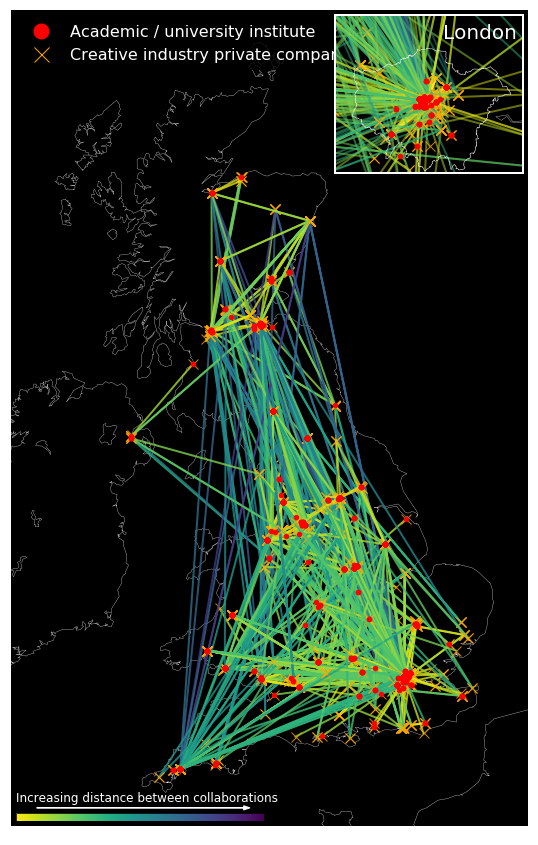

In [262]:
def draw_ce_map(grouped, bonus_label = None):
    # Settings
    cmap = plt.get_cmap("viridis_r")
    linewidth=2
    # Init canvas
    fig, ax = plt.subplots(figsize=(30, 15)) 
    # Draw UK
    m = Basemap(projection='merc',llcrnrlat=49.5,urcrnrlat=59.5,
                llcrnrlon=-8.5,urcrnrlon=2.5,lat_ts=2,resolution='i',)
    distances = get_distances(grouped, m)
    m.drawcoastlines(linewidth=0.3,color="white")
    m.drawmapboundary(fill_color='black',linewidth=0) 
    #m.fillcontinents(color='snow',lake_color='gray')
    
    # Plot academic institutes
    m, ax = make_map(grouped,alpha=1,s=20,color="red",m=m,ax=ax, zorder=10)
    # Plot lines between institutes
    for _, row in grouped.iterrows():
        lons = [row["lon"],row["plon"]]
        lats = [row["lat"],row["plat"]]
        if any(lon < m.boundarylonmin for lon in lons):
            continue
        if any(lon > m.boundarylonmax for lon in lons):
            continue
        if any(lat < m.boundarylats[0] for lat in lats):
            continue
        if any(lat > m.boundarylats[1] for lat in lats):
            continue
        x, y = m(lons, lats)
        distance = np.sqrt((x[1] - x[0])**2 + (y[1] - y[0])**2)
        color = cmap(distance/(1.2*max(distances)))
        m.plot(x, y, 'o-', markersize=0, linewidth=linewidth, color=color, alpha=0.8, ax=ax)
        m.plot(x, y, 'x', markersize=10, linewidth=linewidth, color="orange", alpha=0.8, ax=ax)

    # Extract London region for inset plot
    axins = zoomed_inset_axes(ax, 4, loc=1)    
    m2 = Basemap(projection='merc',llcrnrlat=51.28,urcrnrlat=51.8,
                 llcrnrlon=-0.6,urcrnrlon=0.4,lat_ts=2,resolution='i',ax=axins)
    m2.drawcoastlines(linewidth=0.3,color="white")
    m2.drawmapboundary(fill_color='black',linewidth=2,color='white')
    # Plot academic institutes
    m2, axins = make_map(grouped,alpha=1,s=20,color="red",m=m2,ax=axins, zorder=10)
    # Plot lines between institutes
    for _, row in grouped.iterrows():
        lons = [row["lon"],row["plon"]]
        lats = [row["lat"],row["plat"]]
        if any(lon < m.boundarylonmin for lon in lons):
            continue
        if any(lon > m.boundarylonmax for lon in lons):
            continue
        if any(lat < m.boundarylats[0] for lat in lats):
            continue
        if any(lat > m.boundarylats[1] for lat in lats):
            continue
        x, y = m2(lons, lats)
        distance = np.sqrt((x[1] - x[0])**2 + (y[1] - y[0])**2)
        color = cmap(distance/(1.2*max(distances)))
        m2.plot(x, y, 'o-', markersize=0, linewidth=linewidth, color=color, alpha=0.5, ax=axins)
        m2.plot(x, y, 'x', markersize=10, linewidth=linewidth, color="orange", alpha=0.8, ax=axins)
    # Draw London
    m2.readshapefile('/Users/jklinger/Downloads/mdc-boundary-post-consultation-shp/lca_latlon','london',
                     zorder=20, color="white")
    # Add "London" annotation to inset
    xlims = axins.get_xlim()
    ylims = axins.get_ylim()
    axins.text(s="London",x=4*(xlims[1]-xlims[0])/7,y=ylims[0] + 0.85*(ylims[1]-ylims[0]),color="white",fontsize=20)
    # Plot colour bar below
    ax_cbar = inset_axes(ax, width="48%", height="1%", loc=3)
    ax_cbar.set_axis_off()
    norm = mpl.colors.Normalize(vmin=min(ax_cbar.get_xlim()), vmax=max(ax_cbar.get_xlim()))
    cb = mpl.colorbar.ColorbarBase(ax_cbar, cmap=cmap, norm=norm, orientation='horizontal',)
    # Add label and arrow to colourbar
    xlims = ax.get_xlim()
    ylims = ax.get_ylim()
    ax.text(s="Increasing distance between collaborations",
            x=xlims[0] + 0.01*(xlims[1]-xlims[0]),
            y=ylims[0] + 0.03*(ylims[1]-ylims[0]),color="white",fontsize=12)
    ax.arrow(xlims[0] + 0.05*(xlims[1]-xlims[0]), 
             ylims[0] + 0.022*(ylims[1]-ylims[0]), 
             0.4*(xlims[1]-xlims[0]), 
             0,color="white",head_width=1e4)
    # Create fake legend
    cross = mlines.Line2D([], [], color='orange', marker='x', linewidth=0,
                          markersize=15, label='Creative industry private company')
    dot = mlines.Line2D([], [], color='red', marker='o', linewidth=0,
                        markersize=15, label='Academic / university institute')
    leg = ax.legend(handles=[dot,cross],loc=2,facecolor="black",edgecolor="black",fontsize=16)
    for text in leg.get_texts():
        plt.setp(text, color='w')
        
    if bonus_label is not None:
        ax.text(s=bonus_label,
                x=xlims[0] + 0.5*(xlims[1]-xlims[0]),
                y=ylims[0] + 0.7*(ylims[1]-ylims[0]),color="white",fontsize=18)

draw_ce_map(plottable_df)

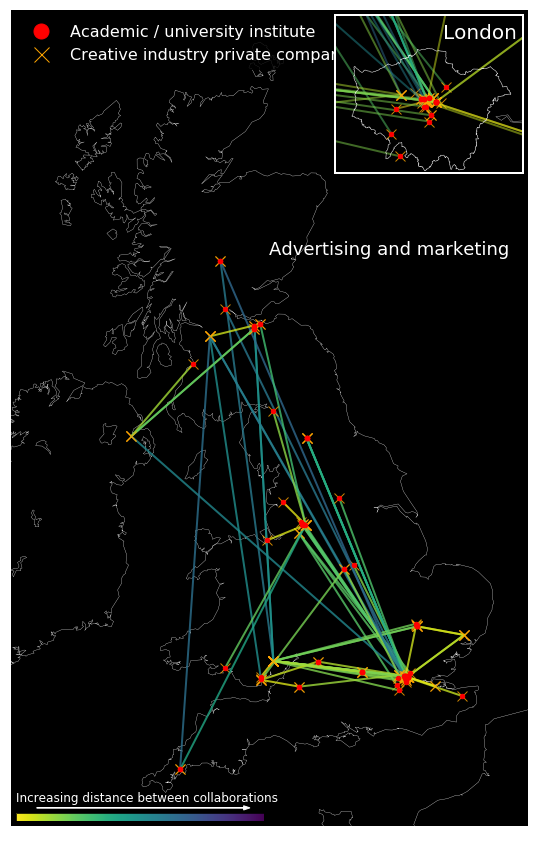

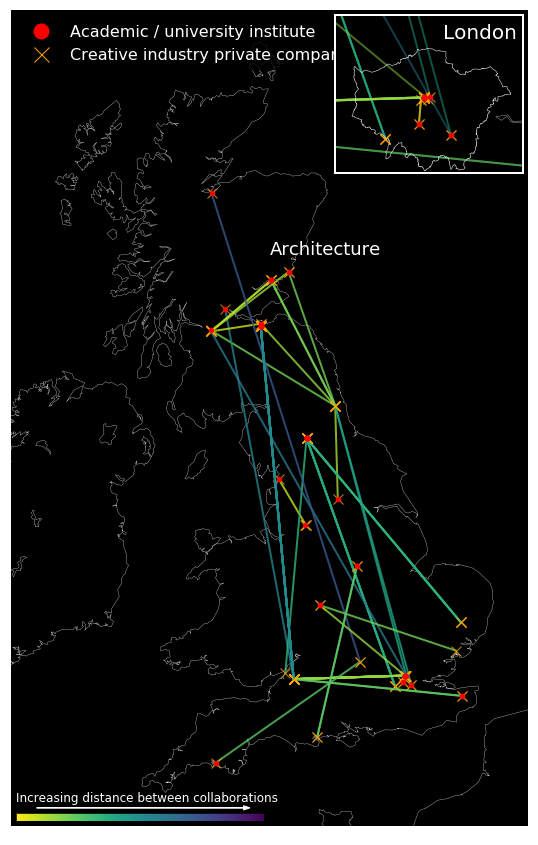

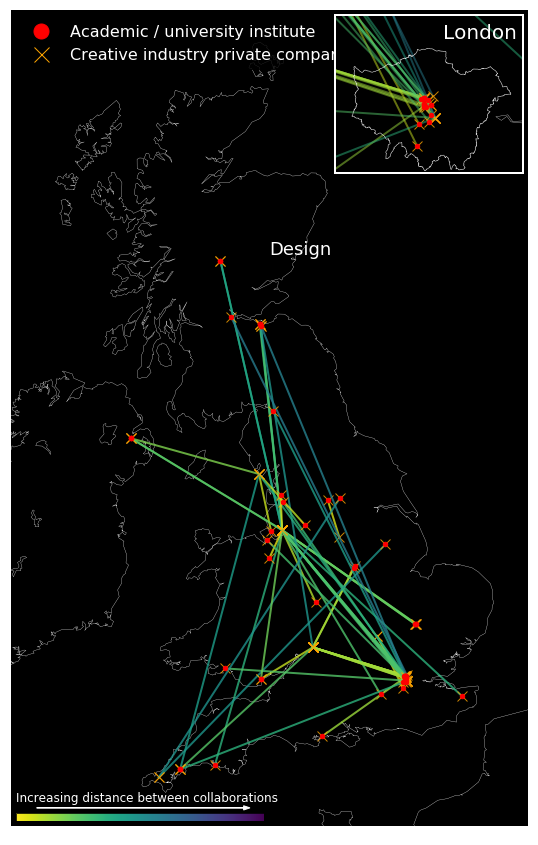

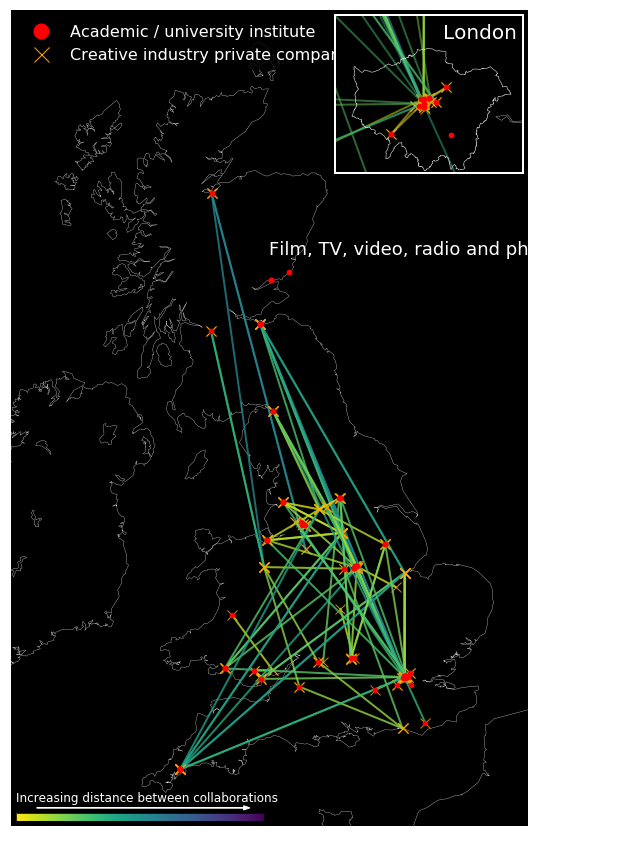

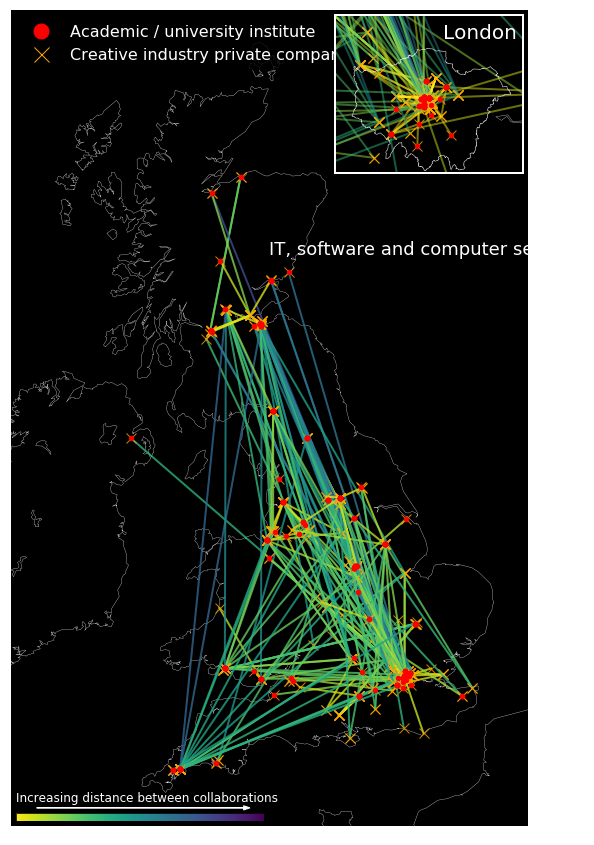

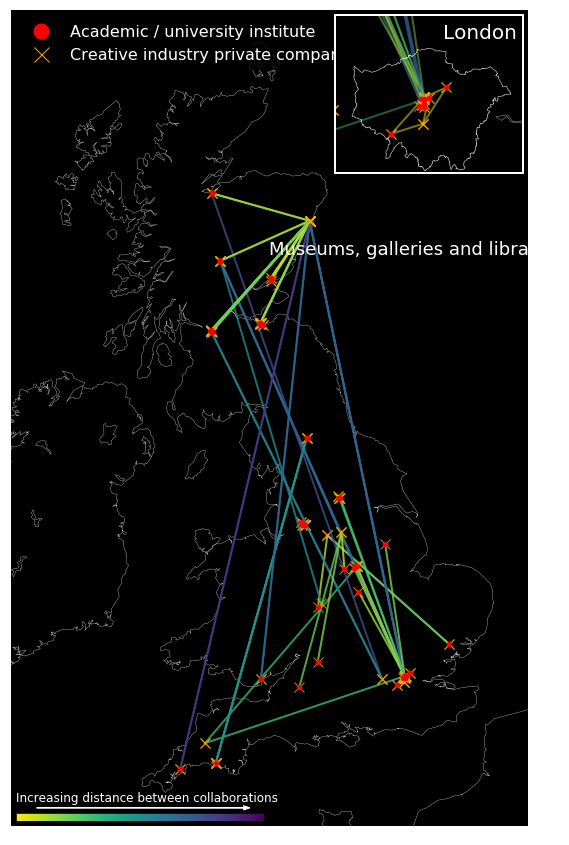

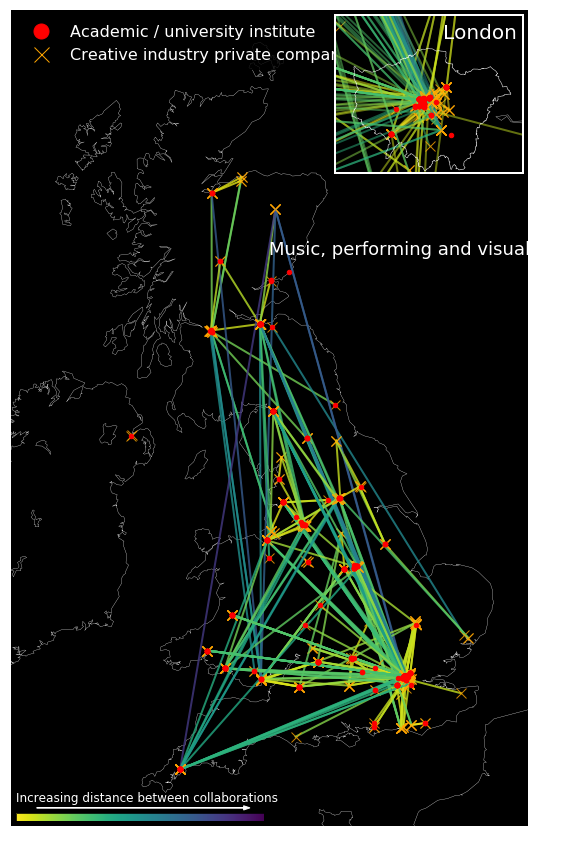

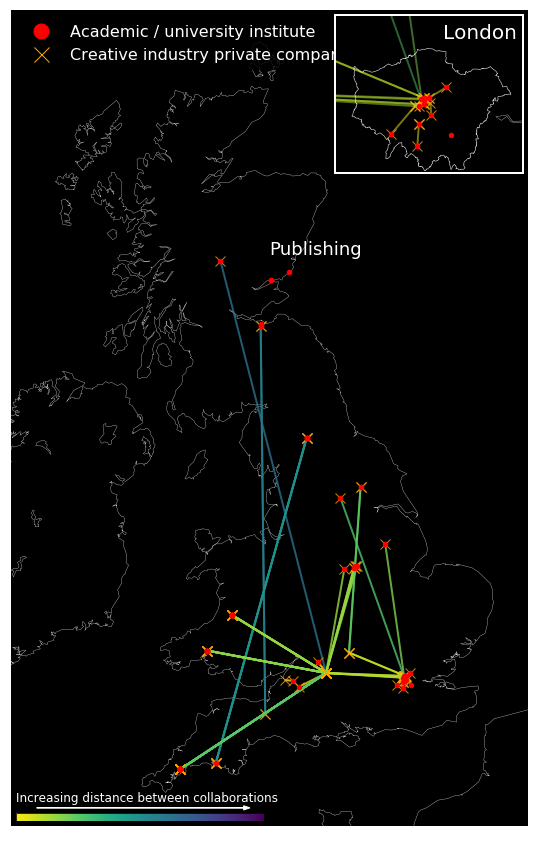

In [263]:
for label,_df in plottable_df.groupby("ce_label"):
    draw_ce_map(_df,bonus_label = label)

In [99]:
for label,_df in plottable_df.groupby("ce_label"):
    print(label,len(_df))
    for _,__df in _df.groupby(["company","uni"]):
        print("\t",len(__df),"  ||  ",__df["company"].values[0]," || ",__df["uni"].values[0])

Advertising and marketing 5
	 1   ||   Let's Go Global  ||  Salford City College (SCC)
	 1   ||   Let's Go Global  ||  Salford City Council
	 1   ||   Let's Go Global  ||  Start in Salford Creative Arts and Wellbeing Centre
	 1   ||   Media Clarity  ||  Kingston Museum
	 1   ||   Work with Meaning  ||  Bath Royal Literary and Scientific Insti
Architecture 3
	 1   ||   Collective Architecture Ltd  ||  Dundee City Council
	 1   ||   Collective Architecture Ltd  ||  Edinburgh University Of The Third Age (U3A)
	 1   ||   Collective Architecture Ltd  ||  University of The Third Age
Design 18
	 2   ||   CCD Design and Ergonomics Ltd  ||  British Urban Regeneration Association
	 2   ||   CCD Design and Ergonomics Ltd  ||  Royal Institution of Chartered Surveyors
	 1   ||   Mojo Maritime  ||  AgriFood and Biosciences Institute
	 1   ||   Mojo Maritime  ||  Central School of Ballet
	 1   ||   Mojo Maritime  ||  Falmouth University
	 1   ||   Mojo Maritime  ||  Manchester School of Architecture
